In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#import random
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, GridSearchCV, cross_val_predict, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from tqdm import tqdm
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.model_selection import LeaveOneGroupOut
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GroupKFold
import itertools

In [3]:
def load_data(filepath):
    df = pd.read_csv(filepath, index_col=0)
    return df

In [4]:
SIGNAL_CATEGORIES = {
    'ECG': ['HR_mean', 'HR_std', 'NN50', 'pNN50', 'TINN', 'rmsHRV', 'LF', 'HF', 'LF_HF', 'sum_f', 'rel_f', 'LF_norm', 'HF_norm'],
    'PPG': ['PPG_HR_mean','PPG_HR_std','PPG_RMSSD','PPG_SDNN','PPG_LF','PPG_HF','PPG_LF_HF','PPG_num_beats','PPG_RiseTime','PPG_DecayTime','PPG_PAV_mean','PPG_PAV_std','PPG_RI'],
    'EDA': ['EDA_mean','EDA_std','EDA_min','EDA_max','EDA_range','EDA_slope','scl_mean','scl_std','scr_mean','scr_std','corr_scl_t','scr_count','scr_amp','scr_sum','scr_area'],
    'RESP': ['Resp_mean','Resp_std','Resp_I_mean','Resp_I_std','Resp_E_mean','Resp_E_std','Resp_IE_ratio','Resp_range','Resp_insp_vol','Resp_rate','Resp_duration'],
}
random = 13577

# Modelos que requieren normalización
MODELS_NEED_SCALING = ["KNN", "LDA"]

In [5]:
def calculate_metrics(y_true, y_pred, stage):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted', zero_division=1)
    recall = recall_score(y_true, y_pred, average='weighted', zero_division=1)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=1)

    metrics_table = pd.DataFrame({
        "Métrica": ["Accuracy", "Precision", "Recall", "F1 Score"],
        "Valor": [accuracy, precision, recall, f1],
        "Etapa": stage
    })
    
    print(f"{stage} Metrics")
    print(metrics_table)
    return metrics_table

In [6]:
def plot_confusion_matrix(y_true, y_pred, title):
    conf_mat = confusion_matrix(y_true, y_pred)
    print(f"{title} - Confusion Matrix")
    print(conf_mat)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_mat, annot=True, cmap="Greens", xticklabels=set(y_true), yticklabels=set(y_true), fmt='g')
    plt.xlabel("Etiquetas predichas")
    plt.ylabel("Etiquetas verdaderas")
    plt.title(f'Matriz de confusión - {title}')
    plt.show()

In [7]:
def train_and_evaluate(X, y, model, param_grid, model_name, signal_name):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random, stratify=y)
    
    grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=16, verbose=1)
    grid_search.fit(X_train, y_train)
    
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)
    metrics = calculate_metrics(y_test, y_pred, stage=f"{signal_name} - {model_name}")
    acc = metrics.loc[metrics["Métrica"] == "Accuracy", "Valor"].values[0]
    
    print(f'[{signal_name} - {model_name}] Best Params: {grid_search.best_params_}')
    print(f'[{signal_name} - {model_name}] Accuracy: {acc:.4f}')

    plot_confusion_matrix(y_test, y_pred, f'{signal_name} - {model_name}')

    print(classification_report(y_test, y_pred))

    return metrics


In [8]:
def train_and_evaluate_group(X, y, groups, model, param_grid, model_name, signal_name):
    group_kfold = GroupKFold(n_splits=5)

    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=group_kfold,
        n_jobs=16,
        verbose=1
    )
    grid_search.fit(X, y, groups=groups)  # Aquí pasamos los grupos (sujetos)

    best_model = grid_search.best_estimator_

    y_true, y_pred = [], []
    for train_idx, test_idx in group_kfold.split(X, y, groups):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        best_model.fit(X_train, y_train)
        preds = best_model.predict(X_test)

        y_true.extend(y_test)
        y_pred.extend(preds)

    metrics = calculate_metrics(y_true, y_pred, stage=f"{signal_name} - {model_name}")
    acc = metrics.loc[metrics["Métrica"] == "Accuracy", "Valor"].values[0]

    print(f'[{signal_name} - {model_name}] Best Params: {grid_search.best_params_}')
    print(f'[{signal_name} - {model_name}] Accuracy: {acc:.4f}')

    plot_confusion_matrix(y_true, y_pred, f'{signal_name} - {model_name}')
    print(classification_report(y_true, y_pred))

    return metrics

In [9]:
def train_and_evaluate_logo(X, y, groups, model, param_grid, model_name, signal_name):
    logo = LeaveOneGroupOut()

    n_splits = logo.get_n_splits(groups=groups)
    print(f"[{signal_name} - {model_name}] LOGO: {n_splits} folds (1 por sujeto)")

    scoring = {
    'accuracy': 'accuracy',
    'f1_weighted': 'f1_weighted',
    'precision_weighted': 'precision_weighted',
    'recall_weighted': 'recall_weighted'
    }

    grid_search = GridSearchCV(
    model,
    param_grid,
    cv=logo.split(X, y, groups=groups),
    scoring=scoring,
    refit='f1_weighted',  # Prioriza F1 ponderado
    n_jobs=31,
    verbose=1
    )

    grid_search.fit(X, y)

    best_model = grid_search.best_estimator_
    y_pred = []
    y_true = []

    fold_accuracies = []
    subject_ids = []

    # Evaluamos con LOGO para obtener predicciones fuera de muestra
    for i, (train_idx, test_idx) in enumerate(logo.split(X, y, groups), 1):
        subject_tested = np.unique(groups[test_idx])[0]
        assert len(np.unique(groups[test_idx])) == 1, "Test set debe contener exactamente un sujeto"
        print(f"[{signal_name} - {model_name}] Fold {i}/{n_splits} (Subject: {subject_tested})")

        best_model.fit(X[train_idx], y[train_idx])
        preds = best_model.predict(X[test_idx])

        y_pred.extend(preds)
        y_true.extend(y[test_idx])

        acc_fold = accuracy_score(y[test_idx], preds)
        fold_accuracies.append(acc_fold)
        subject_ids.append(subject_tested)

    # Crear gráfico de accuracy por sujeto
    plt.figure(figsize=(10, 4))
    plt.plot(subject_ids, fold_accuracies, marker='o', linestyle='-')
    plt.xticks(subject_ids)
    plt.title(f'Accuracy por sujeto - {signal_name} - {model_name}')
    plt.xlabel('Sujeto')
    plt.ylabel('Accuracy')
    plt.grid(True)
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.show()

    metrics = calculate_metrics(y_true, y_pred, stage=f"{signal_name} - {model_name}")
    f1 = metrics.loc[metrics["Métrica"] == "F1 Score", "Valor"].values[0]

    print(f'[{signal_name} - {model_name}] Best Params: {grid_search.best_params_}')
    print(f'[{signal_name} - {model_name}] F1 Score (weighted): {f1:.4f}')

    plot_confusion_matrix(y_true, y_pred, f'{signal_name} - {model_name}')
    print(classification_report(y_true, y_pred))

    return metrics

In [10]:
models = {
    "DecisionTree": (
        DecisionTreeClassifier(class_weight='balanced', random_state=random),
        {"max_depth": [3, 5, 10, 15],
         "min_samples_split": [2, 5, 10], 
         "max_leaf_nodes": [10, 15, 20, 30, 40],
         "criterion": ["gini", "entropy"]}
    ),
    "RandomForest": (
        RandomForestClassifier(class_weight='balanced', random_state=random),
        {"n_estimators": [100, 200, 300],
         "max_depth": [5, 10, 20],
         "min_samples_split": [2, 5, 10, 20],
         "min_samples_leaf": [2, 4],
         "max_features": ['sqrt']}
    ),
    "AdaBoost": (
        AdaBoostClassifier(random_state=random),
        {"n_estimators": [50, 100, 200, 300], 
         "learning_rate": [0.01, 0.1, 0.5, 1], 
         "estimator": [
             DecisionTreeClassifier(max_depth=1, class_weight='balanced'),
             DecisionTreeClassifier(max_depth=3, class_weight='balanced')
         ]}
    ),
    "LDA": (
        LinearDiscriminantAnalysis(),
        {"solver": ["svd"]}
    ),
    "KNN": (
        KNeighborsClassifier(),
        {"n_neighbors": [3, 5, 7, 9], "weights": ["uniform", "distance"]}
    )
}

results = {}


all_signals = list(SIGNAL_CATEGORIES.keys())
combinations = []
for r in range(2, len(all_signals) + 1):
    combinations.extend(itertools.combinations(all_signals, r))

In [47]:
file = r'features_30_075\features.csv'

df = load_data(file)
df = df.fillna(0)

In [48]:
df.columns

Index(['HR_mean', 'HR_std', 'NN50', 'pNN50', 'TINN', 'rmsHRV', 'LF', 'HF',
       'LF_HF', 'sum_f', 'rel_f', 'LF_norm', 'HF_norm', 'PPG_HR_mean',
       'PPG_HR_std', 'PPG_RMSSD', 'PPG_SDNN', 'PPG_LF', 'PPG_HF', 'PPG_LF_HF',
       'PPG_num_beats', 'PPG_RiseTime', 'PPG_DecayTime', 'PPG_PAV_mean',
       'PPG_PAV_std', 'PPG_RI', 'EDA_mean', 'EDA_std', 'EDA_min', 'EDA_max',
       'EDA_range', 'EDA_slope', 'scl_mean', 'scl_std', 'scr_mean', 'scr_std',
       'corr_scl_t', 'scr_count', 'scr_amp', 'scr_sum', 'scr_area',
       'Resp_mean', 'Resp_std', 'Resp_I_mean', 'Resp_I_std', 'Resp_E_mean',
       'Resp_E_std', 'Resp_IE_ratio', 'Resp_range', 'Resp_insp_vol',
       'Resp_rate', 'Resp_duration', 'subject', 'label'],
      dtype='object')

In [49]:
print("Valores nulos por columna:\n", df.isna().sum())

Valores nulos por columna:
 HR_mean          0
HR_std           0
NN50             0
pNN50            0
TINN             0
rmsHRV           0
LF               0
HF               0
LF_HF            0
sum_f            0
rel_f            0
LF_norm          0
HF_norm          0
PPG_HR_mean      0
PPG_HR_std       0
PPG_RMSSD        0
PPG_SDNN         0
PPG_LF           0
PPG_HF           0
PPG_LF_HF        0
PPG_num_beats    0
PPG_RiseTime     0
PPG_DecayTime    0
PPG_PAV_mean     0
PPG_PAV_std      0
PPG_RI           0
EDA_mean         0
EDA_std          0
EDA_min          0
EDA_max          0
EDA_range        0
EDA_slope        0
scl_mean         0
scl_std          0
scr_mean         0
scr_std          0
corr_scl_t       0
scr_count        0
scr_amp          0
scr_sum          0
scr_area         0
Resp_mean        0
Resp_std         0
Resp_I_mean      0
Resp_I_std       0
Resp_E_mean      0
Resp_E_std       0
Resp_IE_ratio    0
Resp_range       0
Resp_insp_vol    0
Resp_rate        0
Res

In [50]:
for i in range(1, len(df['label'].unique())+1):
    mask = (df['label'] == i).sum()
    print(f'Label: {i} total: {mask}')

Label: 1 total: 73554
Label: 2 total: 48333
Label: 3 total: 42875
Label: 4 total: 43068
Label: 5 total: 13228


In [51]:
# Filtrar los que sean 2
df = df[df['label'] != 2]

# Reasignar las clases
df['label'] = df['label'].apply(lambda x: 0 if x in [1, 5] else 1)

In [54]:
for i in range(0, len(df['label'].unique())):
    mask = (df['label'] == i).sum()
    print(f'Label: {i} total: {mask}')

Label: 0 total: 86782
Label: 1 total: 85943


Training by signal:   0%|          | 0/4 [00:00<?, ?it/s]

Training DecisionTree model for ECG using LOGO...
[ECG - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[ECG - DecisionTree] Fold 1/37 (Subject: 4)
[ECG - DecisionTree] Fold 2/37 (Subject: 6)
[ECG - DecisionTree] Fold 3/37 (Subject: 7)
[ECG - DecisionTree] Fold 4/37 (Subject: 8)
[ECG - DecisionTree] Fold 5/37 (Subject: 9)
[ECG - DecisionTree] Fold 6/37 (Subject: 10)
[ECG - DecisionTree] Fold 7/37 (Subject: 11)
[ECG - DecisionTree] Fold 8/37 (Subject: 13)
[ECG - DecisionTree] Fold 9/37 (Subject: 14)
[ECG - DecisionTree] Fold 10/37 (Subject: 15)
[ECG - DecisionTree] Fold 11/37 (Subject: 18)
[ECG - DecisionTree] Fold 12/37 (Subject: 19)
[ECG - DecisionTree] Fold 13/37 (Subject: 20)
[ECG - DecisionTree] Fold 14/37 (Subject: 21)
[ECG - DecisionTree] Fold 15/37 (Subject: 22)
[ECG - DecisionTree] Fold 16/37 (Subject: 24)
[ECG - DecisionTree] Fold 17/37 (Subject: 25)
[ECG - DecisionTree] Fold 18/37 (Subject: 26)
[ECG - DecisionTree]

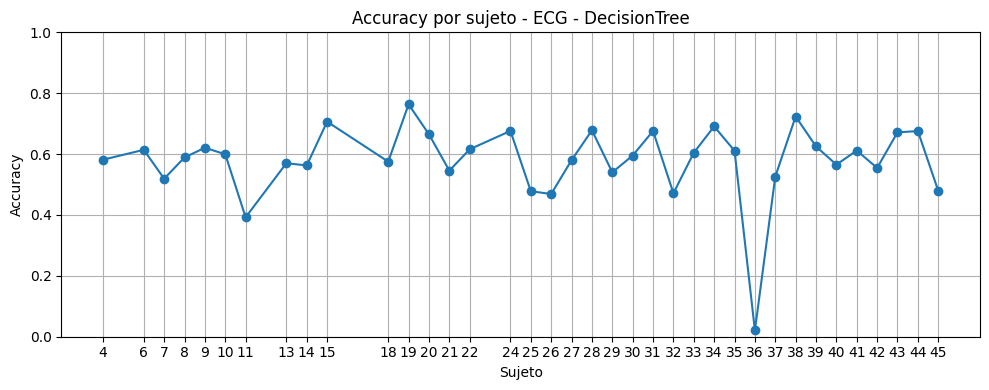

ECG - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.586788  ECG - DecisionTree
1  Precision  0.592114  ECG - DecisionTree
2     Recall  0.586788  ECG - DecisionTree
3   F1 Score  0.581486  ECG - DecisionTree
[ECG - DecisionTree] Best Params: {'criterion': 'entropy', 'max_depth': 3, 'max_leaf_nodes': 10, 'min_samples_split': 2}
[ECG - DecisionTree] F1 Score (weighted): 0.5815
ECG - DecisionTree - Confusion Matrix
[[41161 45621]
 [25751 60192]]


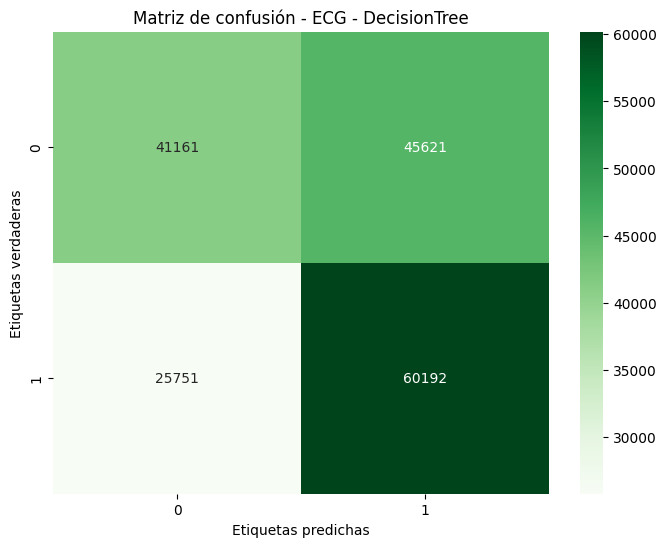

              precision    recall  f1-score   support

           0       0.62      0.47      0.54     86782
           1       0.57      0.70      0.63     85943

    accuracy                           0.59    172725
   macro avg       0.59      0.59      0.58    172725
weighted avg       0.59      0.59      0.58    172725

Training RandomForest model for ECG using LOGO...
[ECG - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[ECG - RandomForest] Fold 1/37 (Subject: 4)
[ECG - RandomForest] Fold 2/37 (Subject: 6)
[ECG - RandomForest] Fold 3/37 (Subject: 7)
[ECG - RandomForest] Fold 4/37 (Subject: 8)
[ECG - RandomForest] Fold 5/37 (Subject: 9)
[ECG - RandomForest] Fold 6/37 (Subject: 10)
[ECG - RandomForest] Fold 7/37 (Subject: 11)
[ECG - RandomForest] Fold 8/37 (Subject: 13)
[ECG - RandomForest] Fold 9/37 (Subject: 14)
[ECG - RandomForest] Fold 10/37 (Subject: 15)
[ECG - RandomForest] Fold 11/37 (Subject: 18)
[ECG - RandomFor

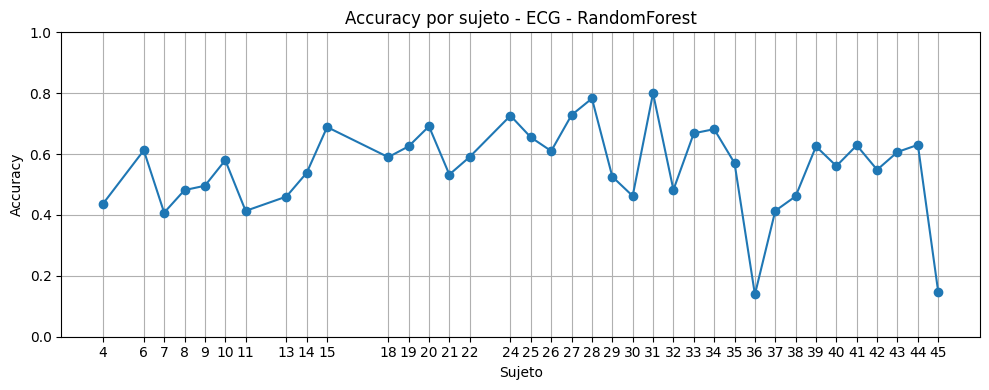

ECG - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.553695  ECG - RandomForest
1  Precision  0.553674  ECG - RandomForest
2     Recall  0.553695  ECG - RandomForest
3   F1 Score  0.553641  ECG - RandomForest
[ECG - RandomForest] Best Params: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
[ECG - RandomForest] F1 Score (weighted): 0.5536
ECG - RandomForest - Confusion Matrix
[[49001 37781]
 [39307 46636]]


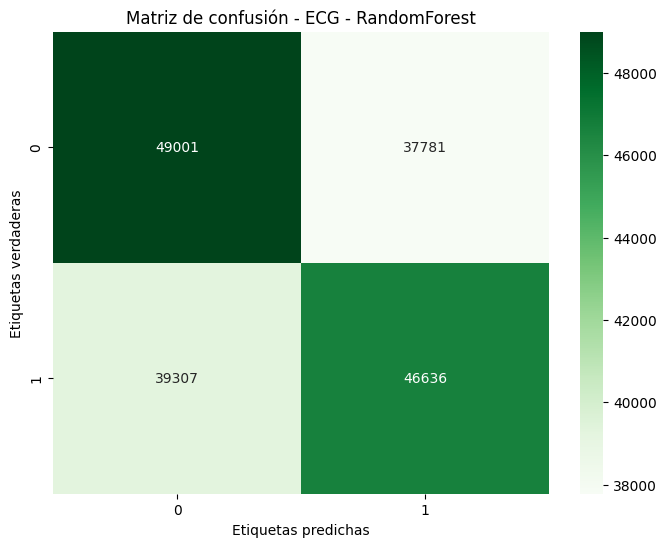

              precision    recall  f1-score   support

           0       0.55      0.56      0.56     86782
           1       0.55      0.54      0.55     85943

    accuracy                           0.55    172725
   macro avg       0.55      0.55      0.55    172725
weighted avg       0.55      0.55      0.55    172725

Training AdaBoost model for ECG using LOGO...
[ECG - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[ECG - AdaBoost] Fold 1/37 (Subject: 4)
[ECG - AdaBoost] Fold 2/37 (Subject: 6)
[ECG - AdaBoost] Fold 3/37 (Subject: 7)
[ECG - AdaBoost] Fold 4/37 (Subject: 8)
[ECG - AdaBoost] Fold 5/37 (Subject: 9)
[ECG - AdaBoost] Fold 6/37 (Subject: 10)
[ECG - AdaBoost] Fold 7/37 (Subject: 11)
[ECG - AdaBoost] Fold 8/37 (Subject: 13)
[ECG - AdaBoost] Fold 9/37 (Subject: 14)
[ECG - AdaBoost] Fold 10/37 (Subject: 15)
[ECG - AdaBoost] Fold 11/37 (Subject: 18)
[ECG - AdaBoost] Fold 12/37 (Subject: 19)
[ECG - AdaBoost] Fold 13/3

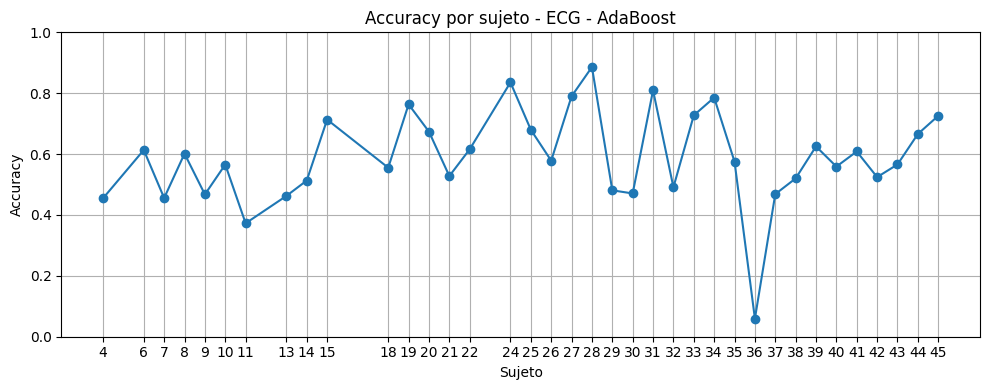

ECG - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.578723  ECG - AdaBoost
1  Precision  0.578752  ECG - AdaBoost
2     Recall  0.578723  ECG - AdaBoost
3   F1 Score  0.578550  ECG - AdaBoost
[ECG - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.1, 'n_estimators': 50}
[ECG - AdaBoost] F1 Score (weighted): 0.5786
ECG - AdaBoost - Confusion Matrix
[[51953 34829]
 [37936 48007]]


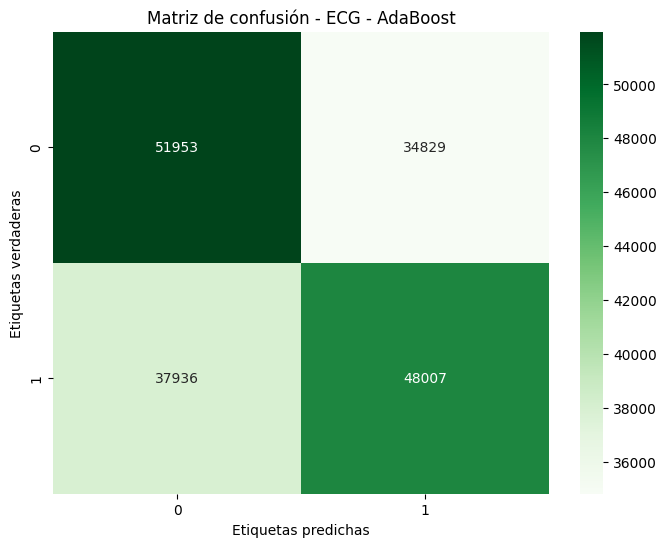

              precision    recall  f1-score   support

           0       0.58      0.60      0.59     86782
           1       0.58      0.56      0.57     85943

    accuracy                           0.58    172725
   macro avg       0.58      0.58      0.58    172725
weighted avg       0.58      0.58      0.58    172725

Training LDA model for ECG using LOGO...
[ECG - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[ECG - LDA] Fold 1/37 (Subject: 4)
[ECG - LDA] Fold 2/37 (Subject: 6)
[ECG - LDA] Fold 3/37 (Subject: 7)
[ECG - LDA] Fold 4/37 (Subject: 8)
[ECG - LDA] Fold 5/37 (Subject: 9)
[ECG - LDA] Fold 6/37 (Subject: 10)
[ECG - LDA] Fold 7/37 (Subject: 11)
[ECG - LDA] Fold 8/37 (Subject: 13)
[ECG - LDA] Fold 9/37 (Subject: 14)
[ECG - LDA] Fold 10/37 (Subject: 15)
[ECG - LDA] Fold 11/37 (Subject: 18)
[ECG - LDA] Fold 12/37 (Subject: 19)
[ECG - LDA] Fold 13/37 (Subject: 20)
[ECG - LDA] Fold 14/37 (Subject: 21)
[ECG - LDA] Fold 15/37 (S

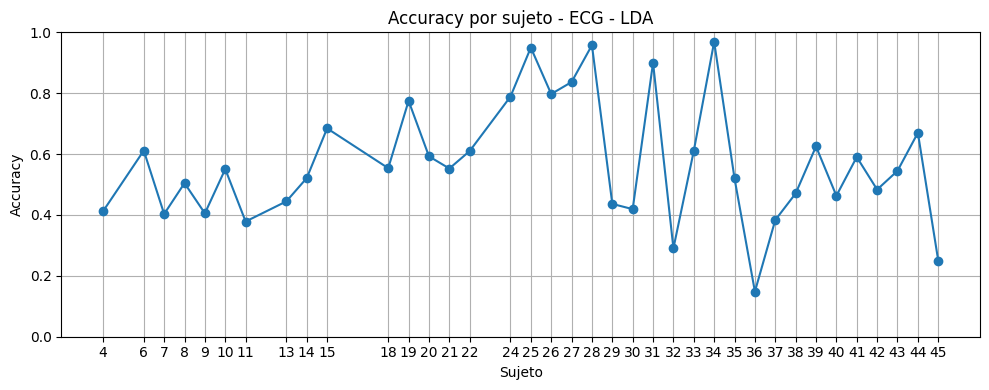

ECG - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.556167  ECG - LDA
1  Precision  0.557686  ECG - LDA
2     Recall  0.556167  ECG - LDA
3   F1 Score  0.552266  ECG - LDA
[ECG - LDA] Best Params: {'solver': 'svd'}
[ECG - LDA] F1 Score (weighted): 0.5523
ECG - LDA - Confusion Matrix
[[56304 30478]
 [46183 39760]]


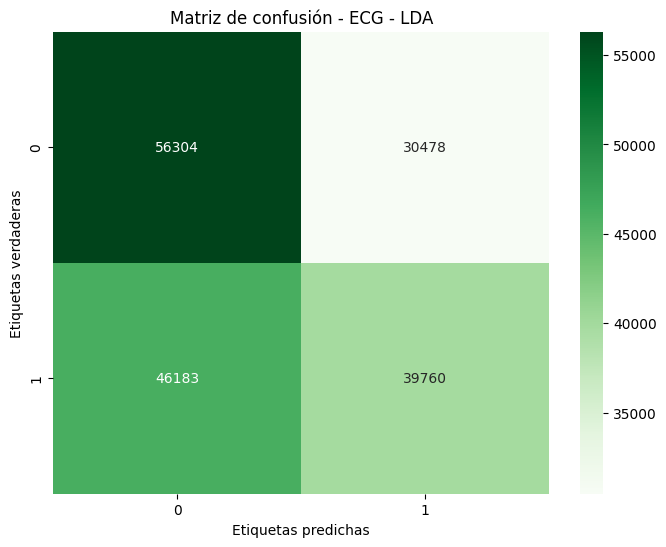

              precision    recall  f1-score   support

           0       0.55      0.65      0.59     86782
           1       0.57      0.46      0.51     85943

    accuracy                           0.56    172725
   macro avg       0.56      0.56      0.55    172725
weighted avg       0.56      0.56      0.55    172725

Training KNN model for ECG using LOGO...
[ECG - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[ECG - KNN] Fold 1/37 (Subject: 4)
[ECG - KNN] Fold 2/37 (Subject: 6)
[ECG - KNN] Fold 3/37 (Subject: 7)
[ECG - KNN] Fold 4/37 (Subject: 8)
[ECG - KNN] Fold 5/37 (Subject: 9)
[ECG - KNN] Fold 6/37 (Subject: 10)
[ECG - KNN] Fold 7/37 (Subject: 11)
[ECG - KNN] Fold 8/37 (Subject: 13)
[ECG - KNN] Fold 9/37 (Subject: 14)
[ECG - KNN] Fold 10/37 (Subject: 15)
[ECG - KNN] Fold 11/37 (Subject: 18)
[ECG - KNN] Fold 12/37 (Subject: 19)
[ECG - KNN] Fold 13/37 (Subject: 20)
[ECG - KNN] Fold 14/37 (Subject: 21)
[ECG - KNN] Fold 15/37 (

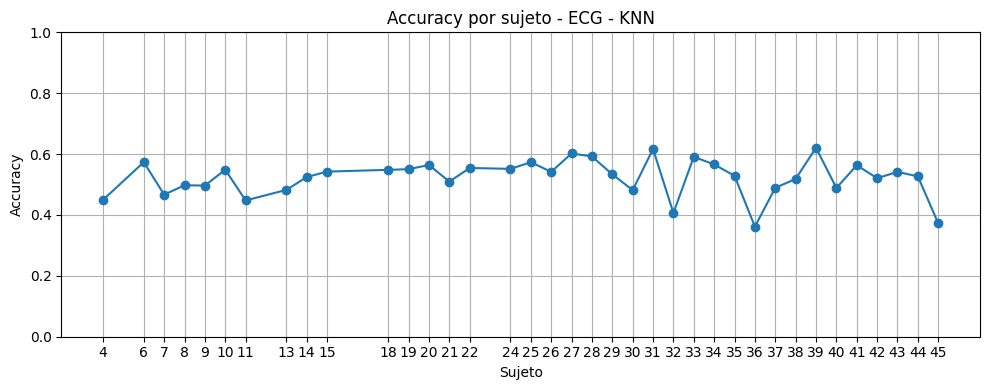

ECG - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.522727  ECG - KNN
1  Precision  0.522772  ECG - KNN
2     Recall  0.522727  ECG - KNN
3   F1 Score  0.522713  ECG - KNN
[ECG - KNN] Best Params: {'n_neighbors': 5, 'weights': 'uniform'}
[ECG - KNN] F1 Score (weighted): 0.5227
ECG - KNN - Confusion Matrix
[[44847 41935]
 [40502 45441]]


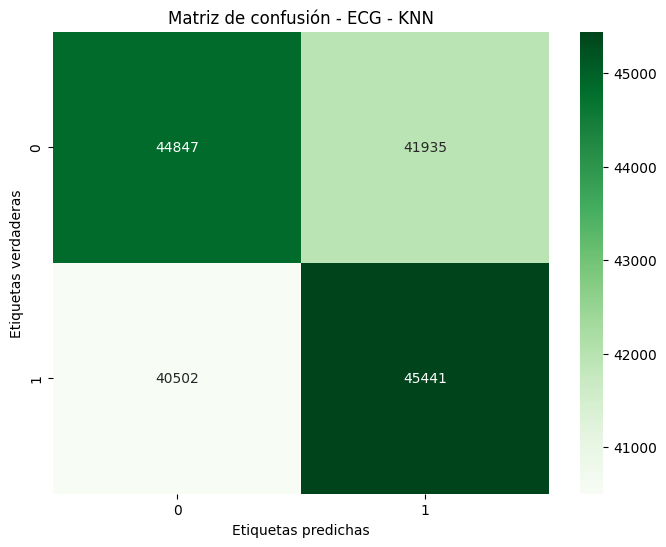

Training by signal:  25%|██▌       | 1/4 [18:27:41<55:23:05, 66461.67s/it]

              precision    recall  f1-score   support

           0       0.53      0.52      0.52     86782
           1       0.52      0.53      0.52     85943

    accuracy                           0.52    172725
   macro avg       0.52      0.52      0.52    172725
weighted avg       0.52      0.52      0.52    172725

Training DecisionTree model for PPG using LOGO...
[PPG - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[PPG - DecisionTree] Fold 1/37 (Subject: 4)
[PPG - DecisionTree] Fold 2/37 (Subject: 6)
[PPG - DecisionTree] Fold 3/37 (Subject: 7)
[PPG - DecisionTree] Fold 4/37 (Subject: 8)
[PPG - DecisionTree] Fold 5/37 (Subject: 9)
[PPG - DecisionTree] Fold 6/37 (Subject: 10)
[PPG - DecisionTree] Fold 7/37 (Subject: 11)
[PPG - DecisionTree] Fold 8/37 (Subject: 13)
[PPG - DecisionTree] Fold 9/37 (Subject: 14)
[PPG - DecisionTree] Fold 10/37 (Subject: 15)
[PPG - DecisionTree] Fold 11/37 (Subject: 18)
[PPG - Decision

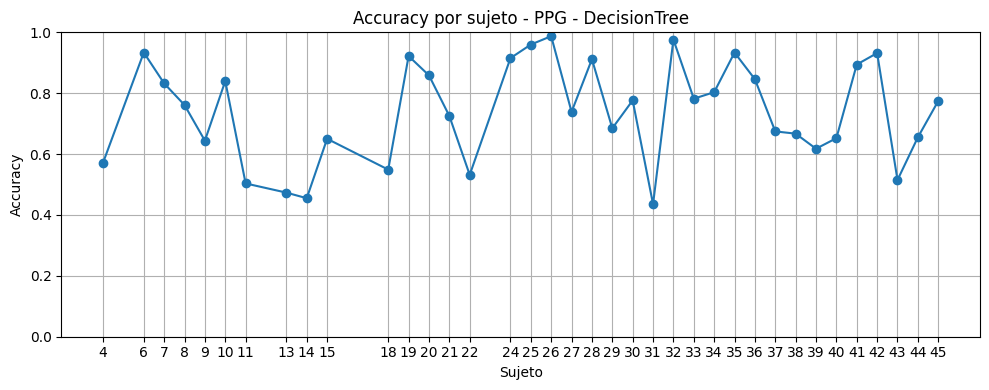

PPG - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.728470  PPG - DecisionTree
1  Precision  0.731768  PPG - DecisionTree
2     Recall  0.728470  PPG - DecisionTree
3   F1 Score  0.727373  PPG - DecisionTree
[PPG - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 5, 'max_leaf_nodes': 15, 'min_samples_split': 2}
[PPG - DecisionTree] F1 Score (weighted): 0.7274
PPG - DecisionTree - Confusion Matrix
[[68604 18178]
 [28722 57221]]


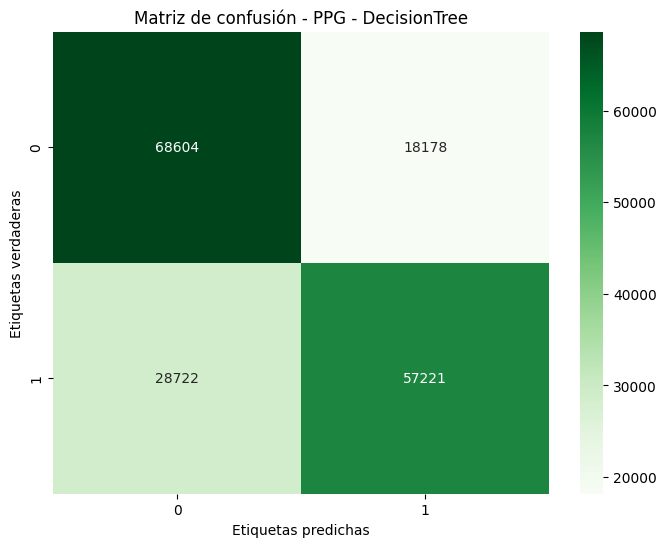

              precision    recall  f1-score   support

           0       0.70      0.79      0.75     86782
           1       0.76      0.67      0.71     85943

    accuracy                           0.73    172725
   macro avg       0.73      0.73      0.73    172725
weighted avg       0.73      0.73      0.73    172725

Training RandomForest model for PPG using LOGO...
[PPG - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[PPG - RandomForest] Fold 1/37 (Subject: 4)
[PPG - RandomForest] Fold 2/37 (Subject: 6)
[PPG - RandomForest] Fold 3/37 (Subject: 7)
[PPG - RandomForest] Fold 4/37 (Subject: 8)
[PPG - RandomForest] Fold 5/37 (Subject: 9)
[PPG - RandomForest] Fold 6/37 (Subject: 10)
[PPG - RandomForest] Fold 7/37 (Subject: 11)
[PPG - RandomForest] Fold 8/37 (Subject: 13)
[PPG - RandomForest] Fold 9/37 (Subject: 14)
[PPG - RandomForest] Fold 10/37 (Subject: 15)
[PPG - RandomForest] Fold 11/37 (Subject: 18)
[PPG - RandomFor

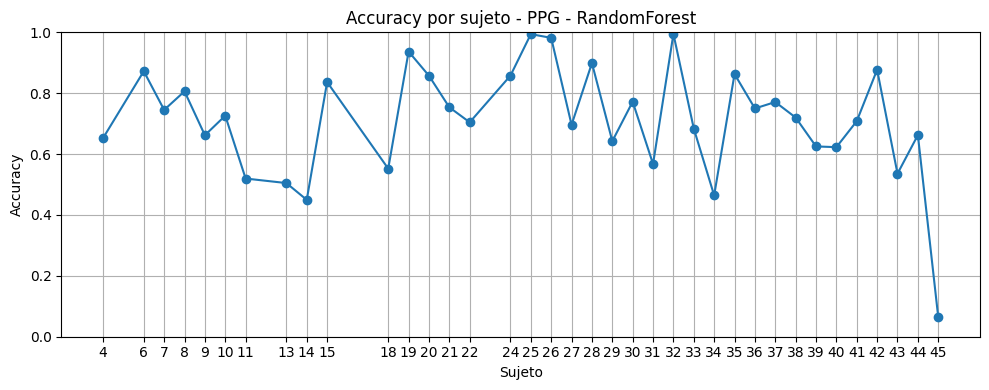

PPG - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.710864  PPG - RandomForest
1  Precision  0.710872  PPG - RandomForest
2     Recall  0.710864  PPG - RandomForest
3   F1 Score  0.710849  PPG - RandomForest
[PPG - RandomForest] Best Params: {'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
[PPG - RandomForest] F1 Score (weighted): 0.7108
PPG - RandomForest - Confusion Matrix
[[62252 24530]
 [25411 60532]]


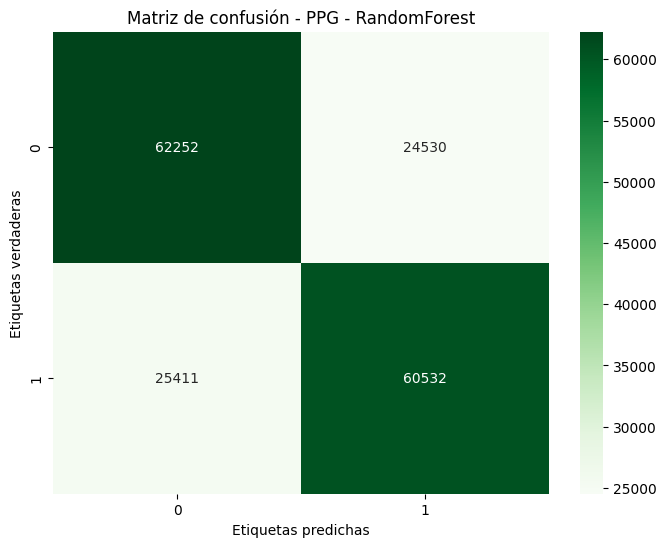

              precision    recall  f1-score   support

           0       0.71      0.72      0.71     86782
           1       0.71      0.70      0.71     85943

    accuracy                           0.71    172725
   macro avg       0.71      0.71      0.71    172725
weighted avg       0.71      0.71      0.71    172725

Training AdaBoost model for PPG using LOGO...
[PPG - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[PPG - AdaBoost] Fold 1/37 (Subject: 4)
[PPG - AdaBoost] Fold 2/37 (Subject: 6)
[PPG - AdaBoost] Fold 3/37 (Subject: 7)
[PPG - AdaBoost] Fold 4/37 (Subject: 8)
[PPG - AdaBoost] Fold 5/37 (Subject: 9)
[PPG - AdaBoost] Fold 6/37 (Subject: 10)
[PPG - AdaBoost] Fold 7/37 (Subject: 11)
[PPG - AdaBoost] Fold 8/37 (Subject: 13)
[PPG - AdaBoost] Fold 9/37 (Subject: 14)
[PPG - AdaBoost] Fold 10/37 (Subject: 15)
[PPG - AdaBoost] Fold 11/37 (Subject: 18)
[PPG - AdaBoost] Fold 12/37 (Subject: 19)
[PPG - AdaBoost] Fold 13/3

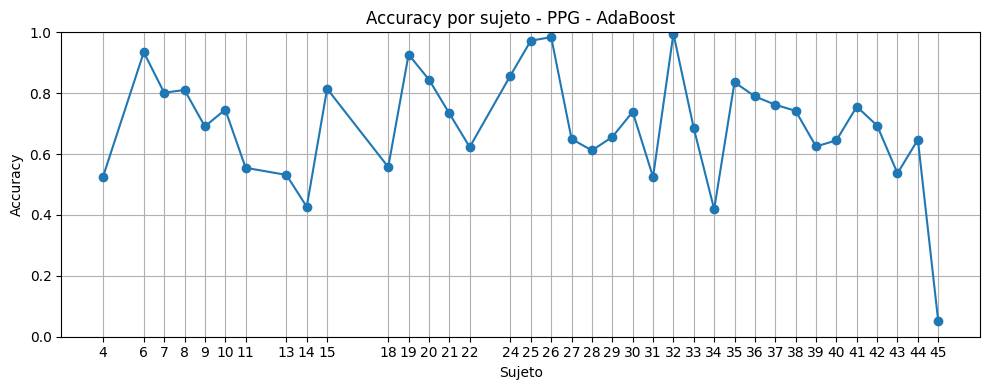

PPG - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.696425  PPG - AdaBoost
1  Precision  0.696625  PPG - AdaBoost
2     Recall  0.696425  PPG - AdaBoost
3   F1 Score  0.696385  PPG - AdaBoost
[PPG - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.1, 'n_estimators': 50}
[PPG - AdaBoost] F1 Score (weighted): 0.6964
PPG - AdaBoost - Confusion Matrix
[[59340 27442]
 [24993 60950]]


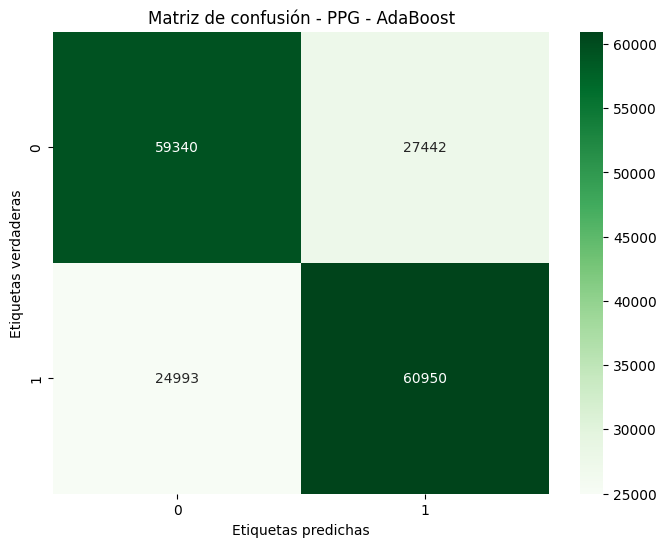

              precision    recall  f1-score   support

           0       0.70      0.68      0.69     86782
           1       0.69      0.71      0.70     85943

    accuracy                           0.70    172725
   macro avg       0.70      0.70      0.70    172725
weighted avg       0.70      0.70      0.70    172725

Training LDA model for PPG using LOGO...
[PPG - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[PPG - LDA] Fold 1/37 (Subject: 4)
[PPG - LDA] Fold 2/37 (Subject: 6)
[PPG - LDA] Fold 3/37 (Subject: 7)
[PPG - LDA] Fold 4/37 (Subject: 8)
[PPG - LDA] Fold 5/37 (Subject: 9)
[PPG - LDA] Fold 6/37 (Subject: 10)
[PPG - LDA] Fold 7/37 (Subject: 11)
[PPG - LDA] Fold 8/37 (Subject: 13)
[PPG - LDA] Fold 9/37 (Subject: 14)
[PPG - LDA] Fold 10/37 (Subject: 15)
[PPG - LDA] Fold 11/37 (Subject: 18)
[PPG - LDA] Fold 12/37 (Subject: 19)
[PPG - LDA] Fold 13/37 (Subject: 20)
[PPG - LDA] Fold 14/37 (Subject: 21)
[PPG - LDA] Fold 15/37 (S

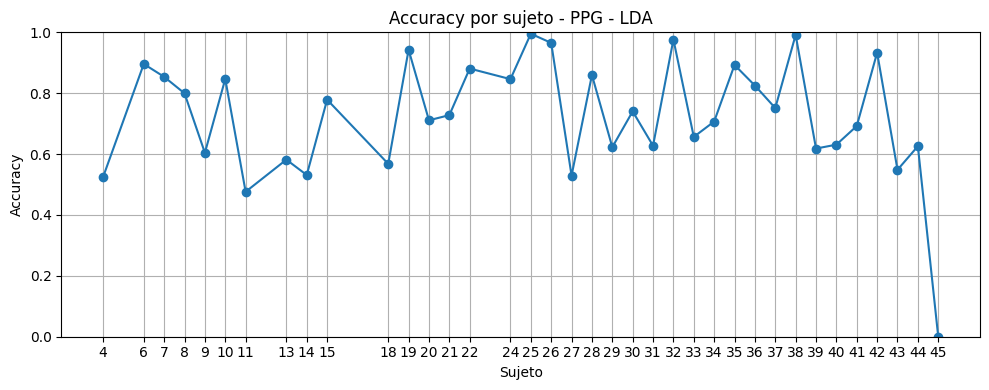

PPG - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.723346  PPG - LDA
1  Precision  0.724045  PPG - LDA
2     Recall  0.723346  PPG - LDA
3   F1 Score  0.723188  PPG - LDA
[PPG - LDA] Best Params: {'solver': 'svd'}
[PPG - LDA] F1 Score (weighted): 0.7232
PPG - LDA - Confusion Matrix
[[60603 26179]
 [21606 64337]]


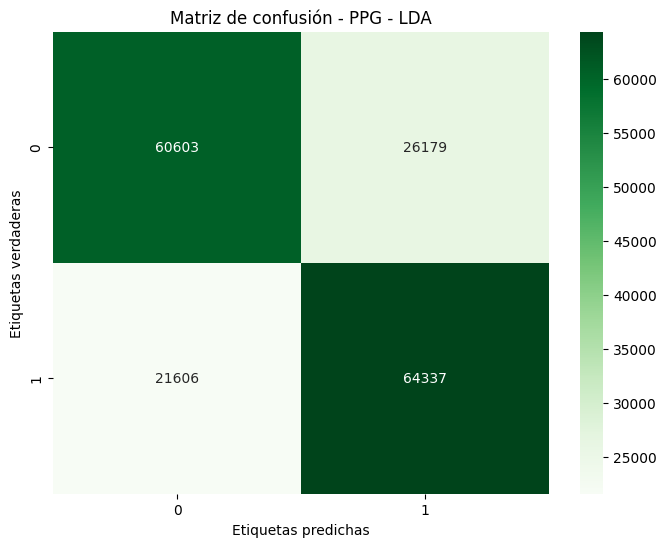

              precision    recall  f1-score   support

           0       0.74      0.70      0.72     86782
           1       0.71      0.75      0.73     85943

    accuracy                           0.72    172725
   macro avg       0.72      0.72      0.72    172725
weighted avg       0.72      0.72      0.72    172725

Training KNN model for PPG using LOGO...
[PPG - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[PPG - KNN] Fold 1/37 (Subject: 4)
[PPG - KNN] Fold 2/37 (Subject: 6)
[PPG - KNN] Fold 3/37 (Subject: 7)
[PPG - KNN] Fold 4/37 (Subject: 8)
[PPG - KNN] Fold 5/37 (Subject: 9)
[PPG - KNN] Fold 6/37 (Subject: 10)
[PPG - KNN] Fold 7/37 (Subject: 11)
[PPG - KNN] Fold 8/37 (Subject: 13)
[PPG - KNN] Fold 9/37 (Subject: 14)
[PPG - KNN] Fold 10/37 (Subject: 15)
[PPG - KNN] Fold 11/37 (Subject: 18)
[PPG - KNN] Fold 12/37 (Subject: 19)
[PPG - KNN] Fold 13/37 (Subject: 20)
[PPG - KNN] Fold 14/37 (Subject: 21)
[PPG - KNN] Fold 15/37 (

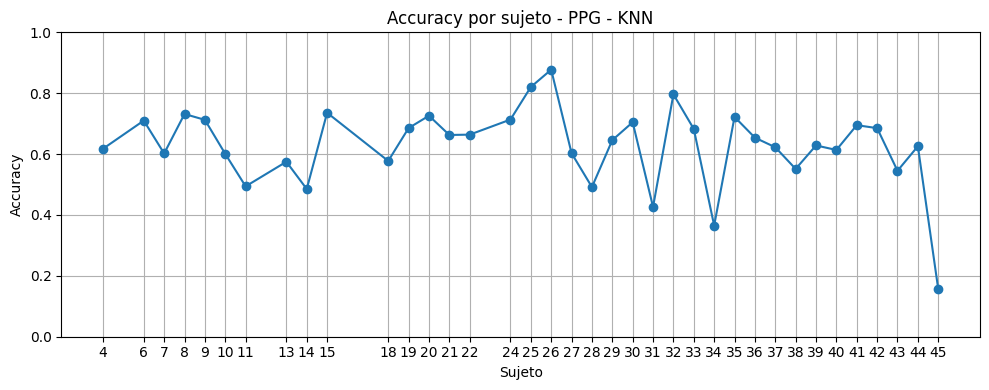

PPG - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.630968  PPG - KNN
1  Precision  0.633223  PPG - KNN
2     Recall  0.630968  PPG - KNN
3   F1 Score  0.629665  PPG - KNN
[PPG - KNN] Best Params: {'n_neighbors': 9, 'weights': 'uniform'}
[PPG - KNN] F1 Score (weighted): 0.6297
PPG - KNN - Confusion Matrix
[[49573 37209]
 [26532 59411]]


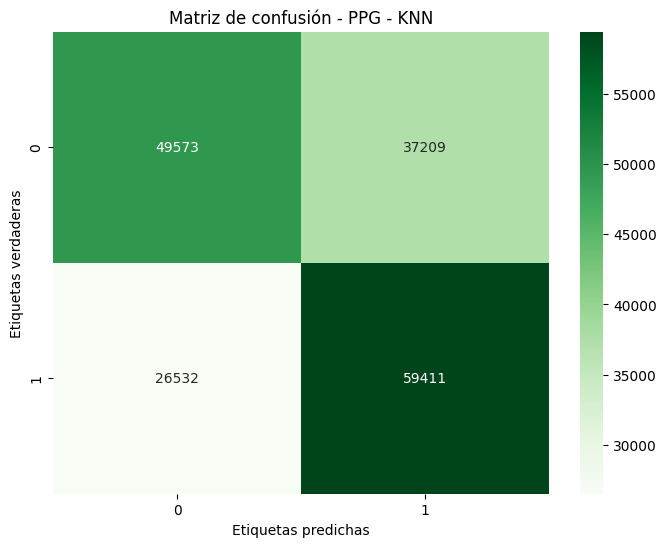

Training by signal:  50%|█████     | 2/4 [37:06:05<37:07:58, 66839.41s/it]

              precision    recall  f1-score   support

           0       0.65      0.57      0.61     86782
           1       0.61      0.69      0.65     85943

    accuracy                           0.63    172725
   macro avg       0.63      0.63      0.63    172725
weighted avg       0.63      0.63      0.63    172725

Training DecisionTree model for EDA using LOGO...
[EDA - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[EDA - DecisionTree] Fold 1/37 (Subject: 4)
[EDA - DecisionTree] Fold 2/37 (Subject: 6)
[EDA - DecisionTree] Fold 3/37 (Subject: 7)
[EDA - DecisionTree] Fold 4/37 (Subject: 8)
[EDA - DecisionTree] Fold 5/37 (Subject: 9)
[EDA - DecisionTree] Fold 6/37 (Subject: 10)
[EDA - DecisionTree] Fold 7/37 (Subject: 11)
[EDA - DecisionTree] Fold 8/37 (Subject: 13)
[EDA - DecisionTree] Fold 9/37 (Subject: 14)
[EDA - DecisionTree] Fold 10/37 (Subject: 15)
[EDA - DecisionTree] Fold 11/37 (Subject: 18)
[EDA - Decision

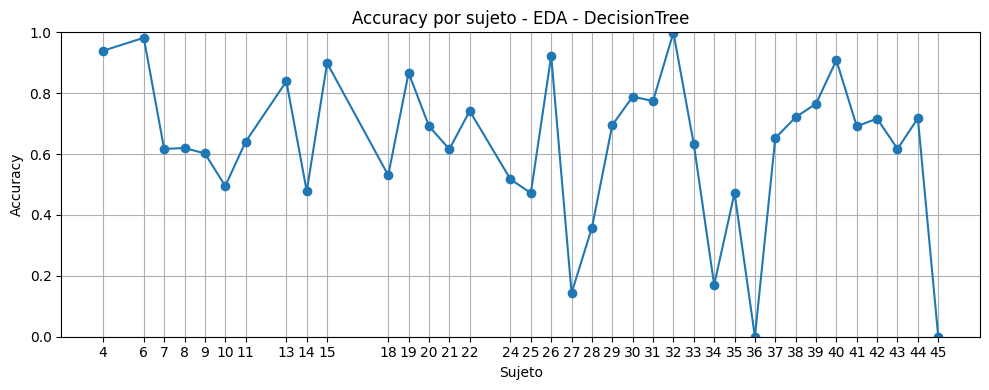

EDA - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.652818  EDA - DecisionTree
1  Precision  0.687296  EDA - DecisionTree
2     Recall  0.652818  EDA - DecisionTree
3   F1 Score  0.636773  EDA - DecisionTree
[EDA - DecisionTree] Best Params: {'criterion': 'entropy', 'max_depth': 3, 'max_leaf_nodes': 10, 'min_samples_split': 2}
[EDA - DecisionTree] F1 Score (weighted): 0.6368
EDA - DecisionTree - Confusion Matrix
[[38427 48355]
 [11612 74331]]


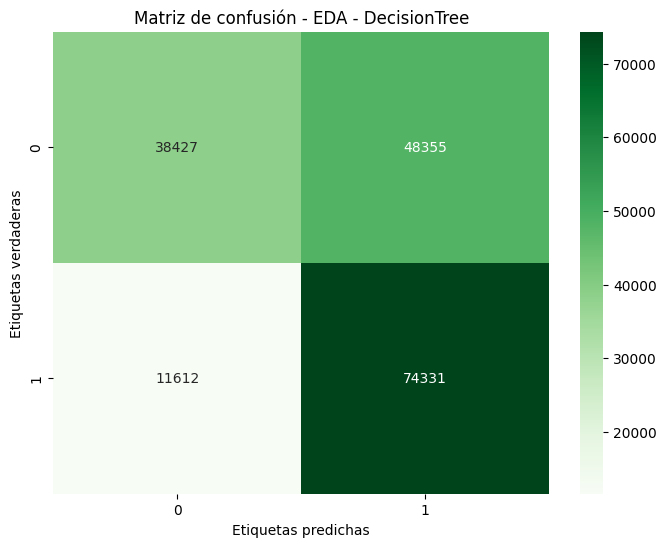

              precision    recall  f1-score   support

           0       0.77      0.44      0.56     86782
           1       0.61      0.86      0.71     85943

    accuracy                           0.65    172725
   macro avg       0.69      0.65      0.64    172725
weighted avg       0.69      0.65      0.64    172725

Training RandomForest model for EDA using LOGO...
[EDA - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[EDA - RandomForest] Fold 1/37 (Subject: 4)
[EDA - RandomForest] Fold 2/37 (Subject: 6)
[EDA - RandomForest] Fold 3/37 (Subject: 7)
[EDA - RandomForest] Fold 4/37 (Subject: 8)
[EDA - RandomForest] Fold 5/37 (Subject: 9)
[EDA - RandomForest] Fold 6/37 (Subject: 10)
[EDA - RandomForest] Fold 7/37 (Subject: 11)
[EDA - RandomForest] Fold 8/37 (Subject: 13)
[EDA - RandomForest] Fold 9/37 (Subject: 14)
[EDA - RandomForest] Fold 10/37 (Subject: 15)
[EDA - RandomForest] Fold 11/37 (Subject: 18)
[EDA - RandomFor

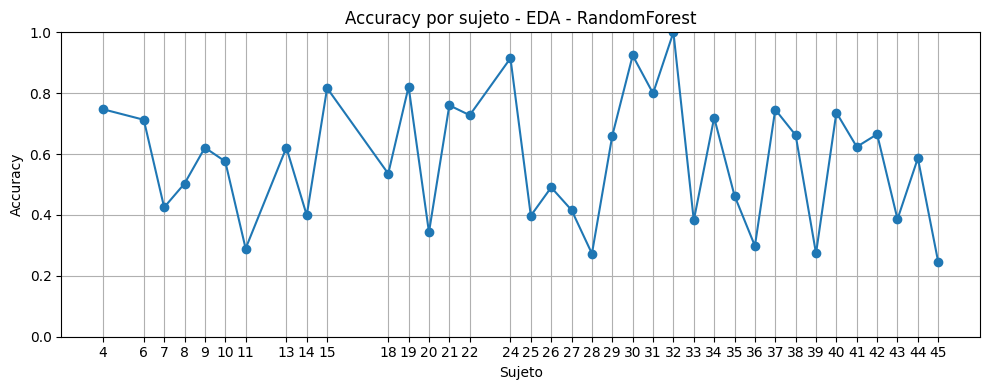

EDA - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.587998  EDA - RandomForest
1  Precision  0.588116  EDA - RandomForest
2     Recall  0.587998  EDA - RandomForest
3   F1 Score  0.587695  EDA - RandomForest
[EDA - RandomForest] Best Params: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
[EDA - RandomForest] F1 Score (weighted): 0.5877
EDA - RandomForest - Confusion Matrix
[[53341 33441]
 [37722 48221]]


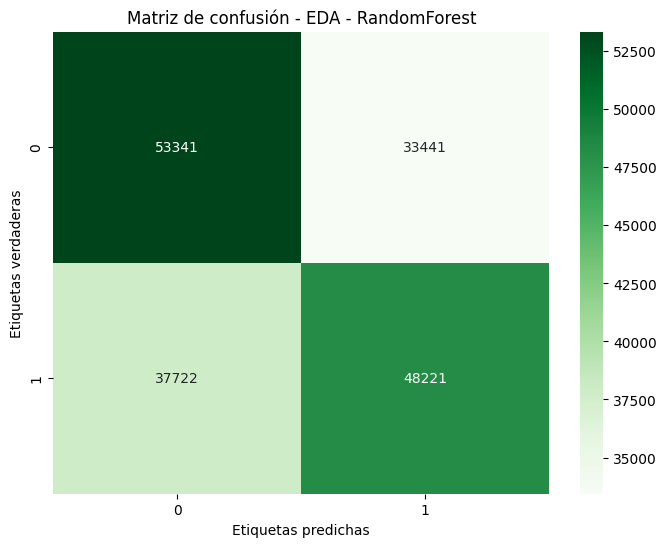

              precision    recall  f1-score   support

           0       0.59      0.61      0.60     86782
           1       0.59      0.56      0.58     85943

    accuracy                           0.59    172725
   macro avg       0.59      0.59      0.59    172725
weighted avg       0.59      0.59      0.59    172725

Training AdaBoost model for EDA using LOGO...
[EDA - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[EDA - AdaBoost] Fold 1/37 (Subject: 4)
[EDA - AdaBoost] Fold 2/37 (Subject: 6)
[EDA - AdaBoost] Fold 3/37 (Subject: 7)
[EDA - AdaBoost] Fold 4/37 (Subject: 8)
[EDA - AdaBoost] Fold 5/37 (Subject: 9)
[EDA - AdaBoost] Fold 6/37 (Subject: 10)
[EDA - AdaBoost] Fold 7/37 (Subject: 11)
[EDA - AdaBoost] Fold 8/37 (Subject: 13)
[EDA - AdaBoost] Fold 9/37 (Subject: 14)
[EDA - AdaBoost] Fold 10/37 (Subject: 15)
[EDA - AdaBoost] Fold 11/37 (Subject: 18)
[EDA - AdaBoost] Fold 12/37 (Subject: 19)
[EDA - AdaBoost] Fold 13/3

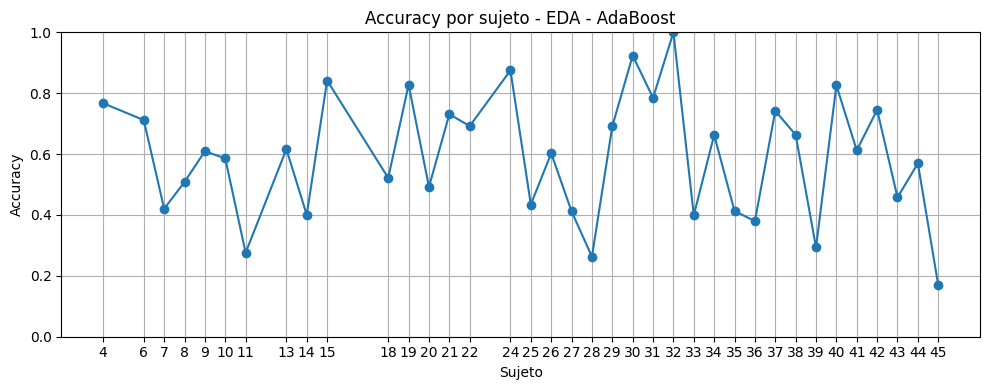

EDA - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.598703  EDA - AdaBoost
1  Precision  0.598715  EDA - AdaBoost
2     Recall  0.598703  EDA - AdaBoost
3   F1 Score  0.598618  EDA - AdaBoost
[EDA - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.1, 'n_estimators': 300}
[EDA - AdaBoost] F1 Score (weighted): 0.5986
EDA - AdaBoost - Confusion Matrix
[[53193 33589]
 [35725 50218]]


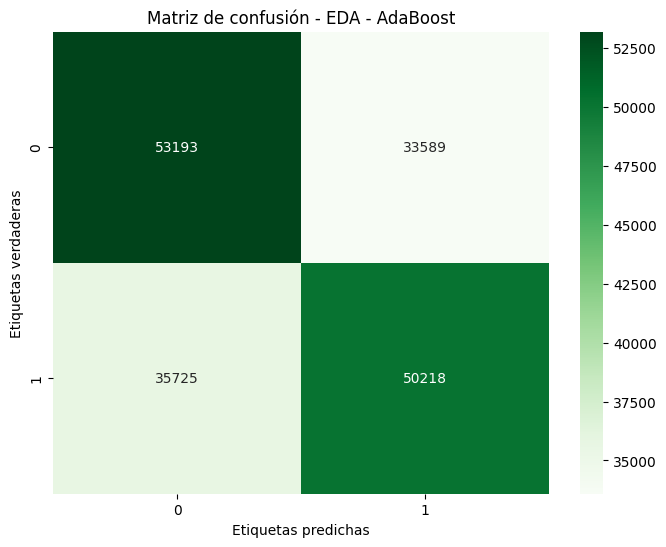

              precision    recall  f1-score   support

           0       0.60      0.61      0.61     86782
           1       0.60      0.58      0.59     85943

    accuracy                           0.60    172725
   macro avg       0.60      0.60      0.60    172725
weighted avg       0.60      0.60      0.60    172725

Training LDA model for EDA using LOGO...
[EDA - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[EDA - LDA] Fold 1/37 (Subject: 4)
[EDA - LDA] Fold 2/37 (Subject: 6)
[EDA - LDA] Fold 3/37 (Subject: 7)
[EDA - LDA] Fold 4/37 (Subject: 8)
[EDA - LDA] Fold 5/37 (Subject: 9)
[EDA - LDA] Fold 6/37 (Subject: 10)
[EDA - LDA] Fold 7/37 (Subject: 11)
[EDA - LDA] Fold 8/37 (Subject: 13)
[EDA - LDA] Fold 9/37 (Subject: 14)
[EDA - LDA] Fold 10/37 (Subject: 15)
[EDA - LDA] Fold 11/37 (Subject: 18)
[EDA - LDA] Fold 12/37 (Subject: 19)
[EDA - LDA] Fold 13/37 (Subject: 20)
[EDA - LDA] Fold 14/37 (Subject: 21)
[EDA - LDA] Fold 15/37 (S

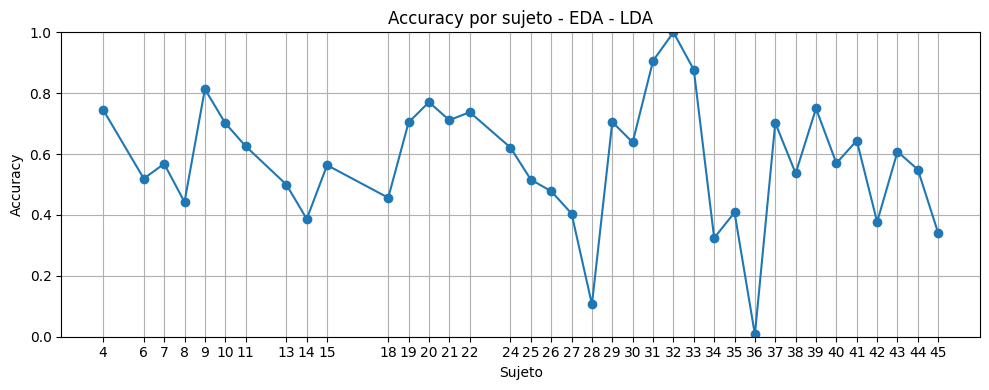

EDA - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.584652  EDA - LDA
1  Precision  0.585194  EDA - LDA
2     Recall  0.584652  EDA - LDA
3   F1 Score  0.583668  EDA - LDA
[EDA - LDA] Best Params: {'solver': 'svd'}
[EDA - LDA] F1 Score (weighted): 0.5837
EDA - LDA - Confusion Matrix
[[54904 31878]
 [39863 46080]]


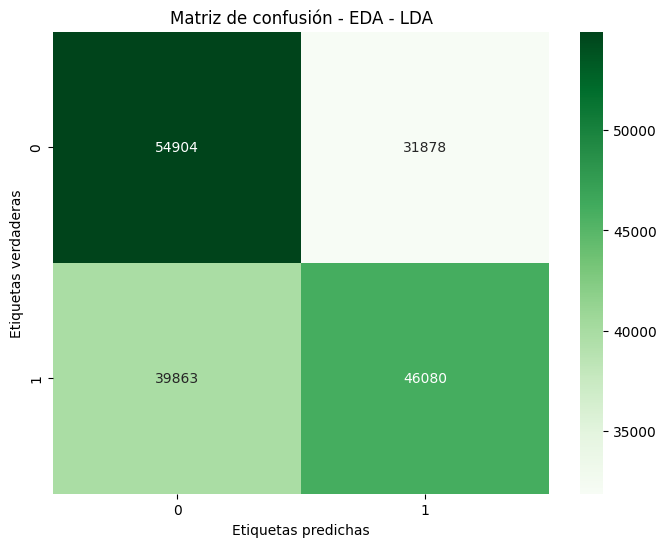

              precision    recall  f1-score   support

           0       0.58      0.63      0.60     86782
           1       0.59      0.54      0.56     85943

    accuracy                           0.58    172725
   macro avg       0.59      0.58      0.58    172725
weighted avg       0.59      0.58      0.58    172725

Training KNN model for EDA using LOGO...
[EDA - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[EDA - KNN] Fold 1/37 (Subject: 4)
[EDA - KNN] Fold 2/37 (Subject: 6)
[EDA - KNN] Fold 3/37 (Subject: 7)
[EDA - KNN] Fold 4/37 (Subject: 8)
[EDA - KNN] Fold 5/37 (Subject: 9)
[EDA - KNN] Fold 6/37 (Subject: 10)
[EDA - KNN] Fold 7/37 (Subject: 11)
[EDA - KNN] Fold 8/37 (Subject: 13)
[EDA - KNN] Fold 9/37 (Subject: 14)
[EDA - KNN] Fold 10/37 (Subject: 15)
[EDA - KNN] Fold 11/37 (Subject: 18)
[EDA - KNN] Fold 12/37 (Subject: 19)
[EDA - KNN] Fold 13/37 (Subject: 20)
[EDA - KNN] Fold 14/37 (Subject: 21)
[EDA - KNN] Fold 15/37 (

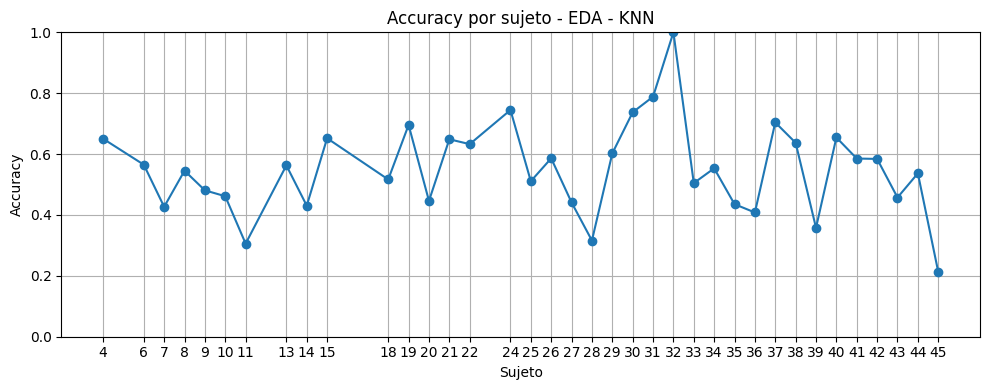

EDA - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.550494  EDA - KNN
1  Precision  0.550668  EDA - KNN
2     Recall  0.550494  EDA - KNN
3   F1 Score  0.549607  EDA - KNN
[EDA - KNN] Best Params: {'n_neighbors': 5, 'weights': 'distance'}
[EDA - KNN] F1 Score (weighted): 0.5496
EDA - KNN - Confusion Matrix
[[51588 35194]
 [42447 43496]]


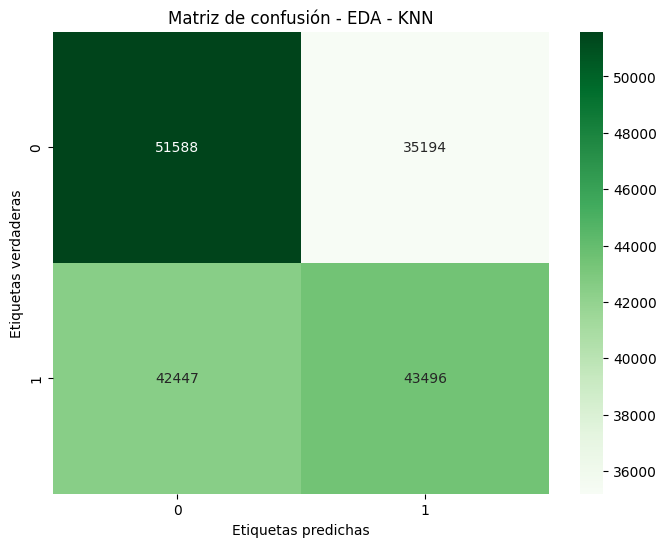

Training by signal:  75%|███████▌  | 3/4 [61:14:58<21:06:54, 76014.55s/it]

              precision    recall  f1-score   support

           0       0.55      0.59      0.57     86782
           1       0.55      0.51      0.53     85943

    accuracy                           0.55    172725
   macro avg       0.55      0.55      0.55    172725
weighted avg       0.55      0.55      0.55    172725

Training DecisionTree model for RESP using LOGO...
[RESP - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[RESP - DecisionTree] Fold 1/37 (Subject: 4)
[RESP - DecisionTree] Fold 2/37 (Subject: 6)
[RESP - DecisionTree] Fold 3/37 (Subject: 7)
[RESP - DecisionTree] Fold 4/37 (Subject: 8)
[RESP - DecisionTree] Fold 5/37 (Subject: 9)
[RESP - DecisionTree] Fold 6/37 (Subject: 10)
[RESP - DecisionTree] Fold 7/37 (Subject: 11)
[RESP - DecisionTree] Fold 8/37 (Subject: 13)
[RESP - DecisionTree] Fold 9/37 (Subject: 14)
[RESP - DecisionTree] Fold 10/37 (Subject: 15)
[RESP - DecisionTree] Fold 11/37 (Subject: 18)
[R

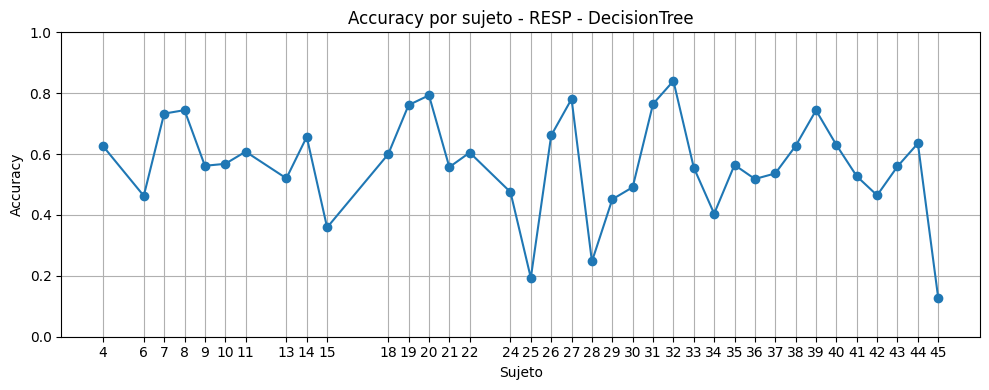

RESP - DecisionTree Metrics
     Métrica     Valor                Etapa
0   Accuracy  0.574260  RESP - DecisionTree
1  Precision  0.577435  RESP - DecisionTree
2     Recall  0.574260  RESP - DecisionTree
3   F1 Score  0.570593  RESP - DecisionTree
[RESP - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 5, 'max_leaf_nodes': 10, 'min_samples_split': 2}
[RESP - DecisionTree] F1 Score (weighted): 0.5706
RESP - DecisionTree - Confusion Matrix
[[41819 44963]
 [28573 57370]]


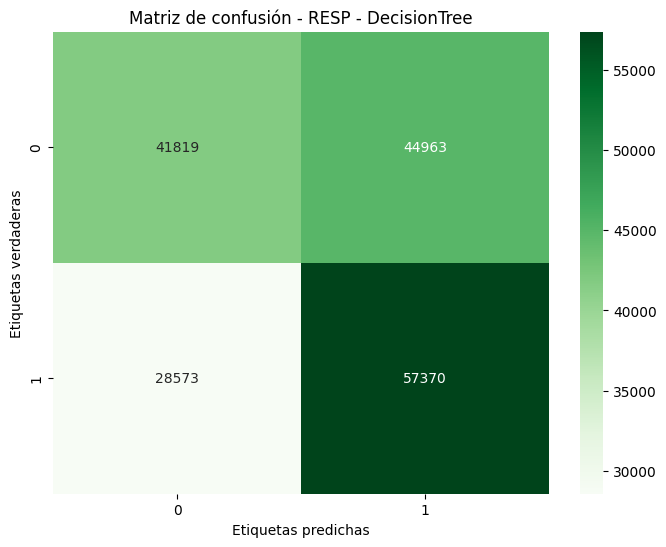

              precision    recall  f1-score   support

           0       0.59      0.48      0.53     86782
           1       0.56      0.67      0.61     85943

    accuracy                           0.57    172725
   macro avg       0.58      0.57      0.57    172725
weighted avg       0.58      0.57      0.57    172725

Training RandomForest model for RESP using LOGO...
[RESP - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[RESP - RandomForest] Fold 1/37 (Subject: 4)
[RESP - RandomForest] Fold 2/37 (Subject: 6)
[RESP - RandomForest] Fold 3/37 (Subject: 7)
[RESP - RandomForest] Fold 4/37 (Subject: 8)
[RESP - RandomForest] Fold 5/37 (Subject: 9)
[RESP - RandomForest] Fold 6/37 (Subject: 10)
[RESP - RandomForest] Fold 7/37 (Subject: 11)
[RESP - RandomForest] Fold 8/37 (Subject: 13)
[RESP - RandomForest] Fold 9/37 (Subject: 14)
[RESP - RandomForest] Fold 10/37 (Subject: 15)
[RESP - RandomForest] Fold 11/37 (Subject: 18)
[RE

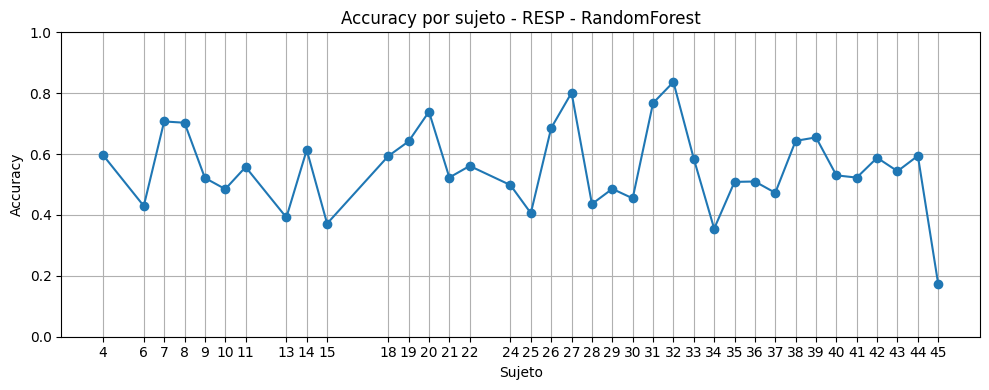

RESP - RandomForest Metrics
     Métrica     Valor                Etapa
0   Accuracy  0.554199  RESP - RandomForest
1  Precision  0.554191  RESP - RandomForest
2     Recall  0.554199  RESP - RandomForest
3   F1 Score  0.554019  RESP - RandomForest
[RESP - RandomForest] Best Params: {'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
[RESP - RandomForest] F1 Score (weighted): 0.5540
RESP - RandomForest - Confusion Matrix
[[49821 36961]
 [40040 45903]]


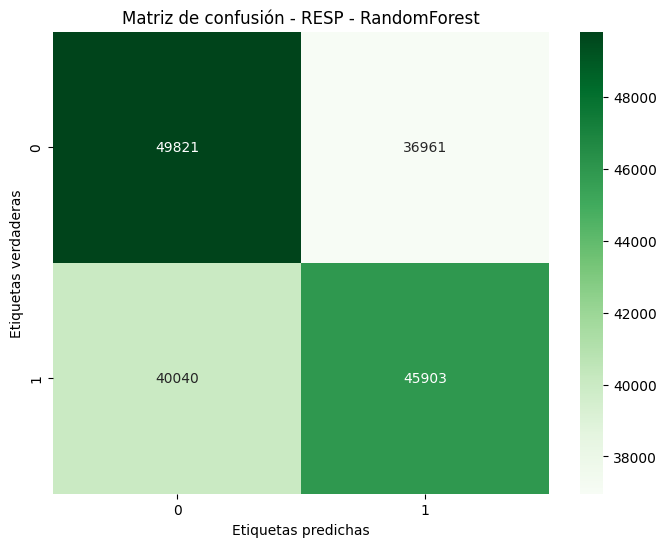

              precision    recall  f1-score   support

           0       0.55      0.57      0.56     86782
           1       0.55      0.53      0.54     85943

    accuracy                           0.55    172725
   macro avg       0.55      0.55      0.55    172725
weighted avg       0.55      0.55      0.55    172725

Training AdaBoost model for RESP using LOGO...
[RESP - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[RESP - AdaBoost] Fold 1/37 (Subject: 4)
[RESP - AdaBoost] Fold 2/37 (Subject: 6)
[RESP - AdaBoost] Fold 3/37 (Subject: 7)
[RESP - AdaBoost] Fold 4/37 (Subject: 8)
[RESP - AdaBoost] Fold 5/37 (Subject: 9)
[RESP - AdaBoost] Fold 6/37 (Subject: 10)
[RESP - AdaBoost] Fold 7/37 (Subject: 11)
[RESP - AdaBoost] Fold 8/37 (Subject: 13)
[RESP - AdaBoost] Fold 9/37 (Subject: 14)
[RESP - AdaBoost] Fold 10/37 (Subject: 15)
[RESP - AdaBoost] Fold 11/37 (Subject: 18)
[RESP - AdaBoost] Fold 12/37 (Subject: 19)
[RESP - AdaB

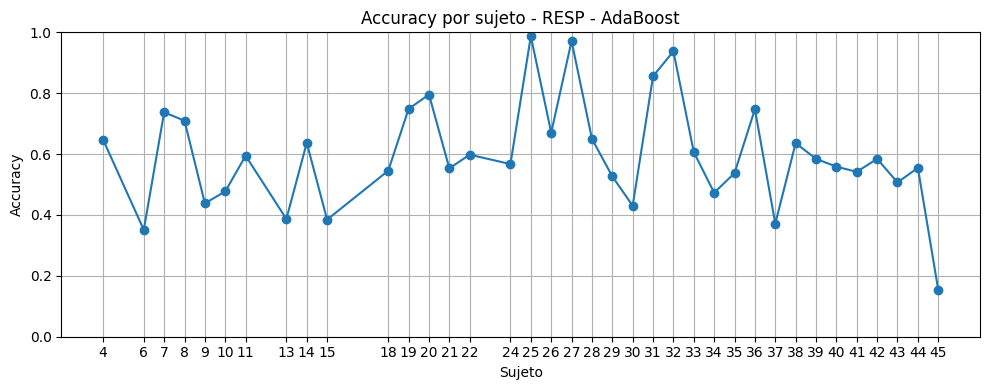

RESP - AdaBoost Metrics
     Métrica     Valor            Etapa
0   Accuracy  0.583841  RESP - AdaBoost
1  Precision  0.586041  RESP - AdaBoost
2     Recall  0.583841  RESP - AdaBoost
3   F1 Score  0.580565  RESP - AdaBoost
[RESP - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 0.01, 'n_estimators': 50}
[RESP - AdaBoost] F1 Score (weighted): 0.5806
RESP - AdaBoost - Confusion Matrix
[[58266 28516]
 [43365 42578]]


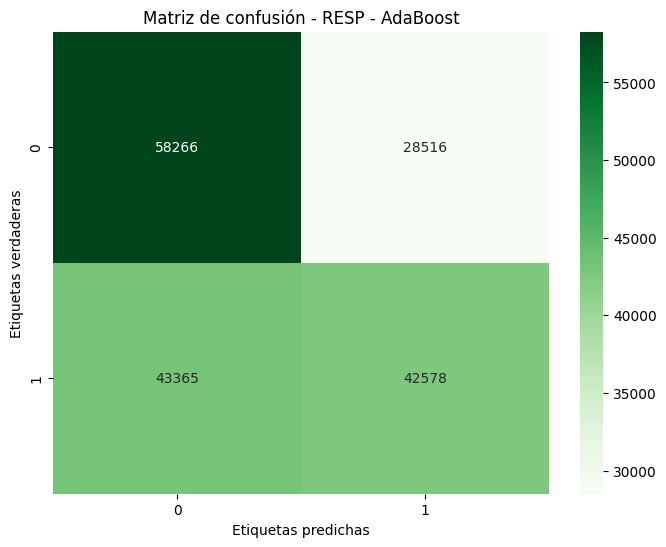

              precision    recall  f1-score   support

           0       0.57      0.67      0.62     86782
           1       0.60      0.50      0.54     85943

    accuracy                           0.58    172725
   macro avg       0.59      0.58      0.58    172725
weighted avg       0.59      0.58      0.58    172725

Training LDA model for RESP using LOGO...
[RESP - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[RESP - LDA] Fold 1/37 (Subject: 4)
[RESP - LDA] Fold 2/37 (Subject: 6)
[RESP - LDA] Fold 3/37 (Subject: 7)
[RESP - LDA] Fold 4/37 (Subject: 8)
[RESP - LDA] Fold 5/37 (Subject: 9)
[RESP - LDA] Fold 6/37 (Subject: 10)
[RESP - LDA] Fold 7/37 (Subject: 11)
[RESP - LDA] Fold 8/37 (Subject: 13)
[RESP - LDA] Fold 9/37 (Subject: 14)
[RESP - LDA] Fold 10/37 (Subject: 15)
[RESP - LDA] Fold 11/37 (Subject: 18)
[RESP - LDA] Fold 12/37 (Subject: 19)
[RESP - LDA] Fold 13/37 (Subject: 20)
[RESP - LDA] Fold 14/37 (Subject: 21)
[RESP - L

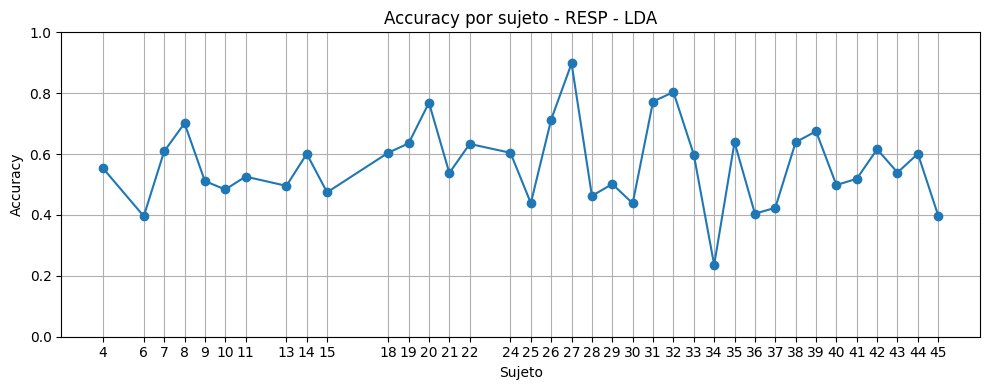

RESP - LDA Metrics
     Métrica     Valor       Etapa
0   Accuracy  0.565344  RESP - LDA
1  Precision  0.565622  RESP - LDA
2     Recall  0.565344  RESP - LDA
3   F1 Score  0.564503  RESP - LDA
[RESP - LDA] Best Params: {'solver': 'svd'}
[RESP - LDA] F1 Score (weighted): 0.5645
RESP - LDA - Confusion Matrix
[[52834 33948]
 [41128 44815]]


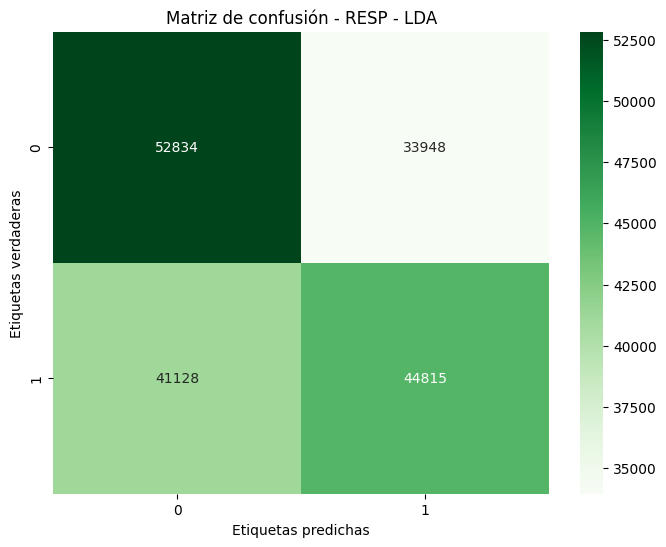

              precision    recall  f1-score   support

           0       0.56      0.61      0.58     86782
           1       0.57      0.52      0.54     85943

    accuracy                           0.57    172725
   macro avg       0.57      0.57      0.56    172725
weighted avg       0.57      0.57      0.56    172725

Training KNN model for RESP using LOGO...
[RESP - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[RESP - KNN] Fold 1/37 (Subject: 4)
[RESP - KNN] Fold 2/37 (Subject: 6)
[RESP - KNN] Fold 3/37 (Subject: 7)
[RESP - KNN] Fold 4/37 (Subject: 8)
[RESP - KNN] Fold 5/37 (Subject: 9)
[RESP - KNN] Fold 6/37 (Subject: 10)
[RESP - KNN] Fold 7/37 (Subject: 11)
[RESP - KNN] Fold 8/37 (Subject: 13)
[RESP - KNN] Fold 9/37 (Subject: 14)
[RESP - KNN] Fold 10/37 (Subject: 15)
[RESP - KNN] Fold 11/37 (Subject: 18)
[RESP - KNN] Fold 12/37 (Subject: 19)
[RESP - KNN] Fold 13/37 (Subject: 20)
[RESP - KNN] Fold 14/37 (Subject: 21)
[RESP - 

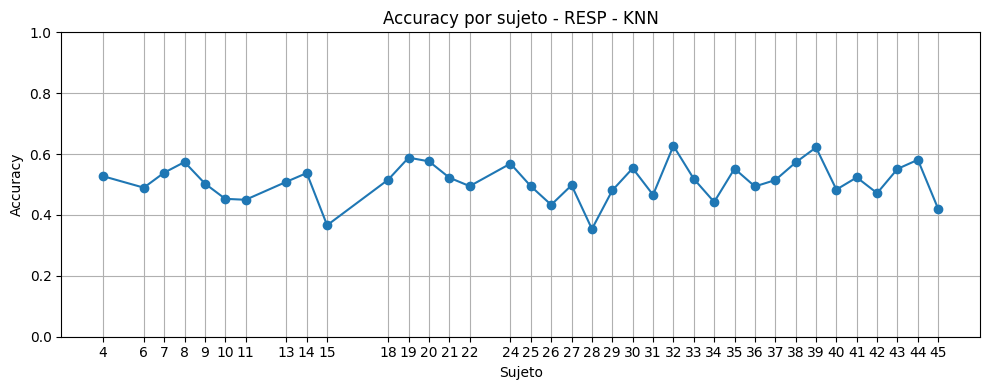

RESP - KNN Metrics
     Métrica     Valor       Etapa
0   Accuracy  0.513533  RESP - KNN
1  Precision  0.513673  RESP - KNN
2     Recall  0.513533  RESP - KNN
3   F1 Score  0.513324  RESP - KNN
[RESP - KNN] Best Params: {'n_neighbors': 7, 'weights': 'distance'}
[RESP - KNN] F1 Score (weighted): 0.5133
RESP - KNN - Confusion Matrix
[[42756 44026]
 [39999 45944]]


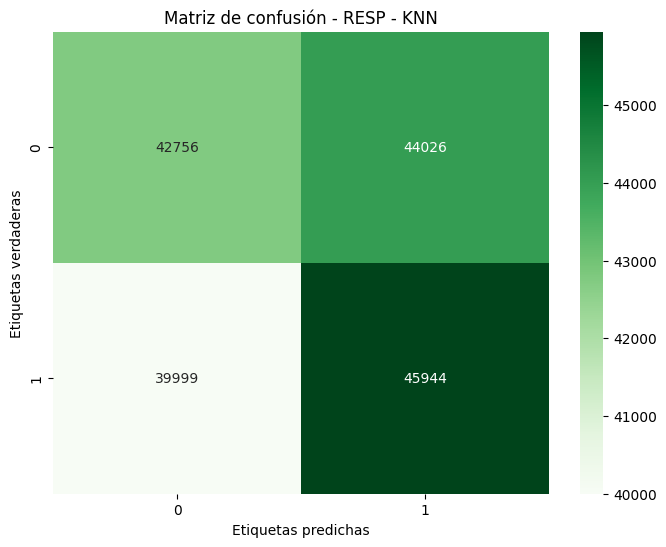

Training by signal: 100%|██████████| 4/4 [73:46:19<00:00, 66394.87s/it]   


              precision    recall  f1-score   support

           0       0.52      0.49      0.50     86782
           1       0.51      0.53      0.52     85943

    accuracy                           0.51    172725
   macro avg       0.51      0.51      0.51    172725
weighted avg       0.51      0.51      0.51    172725



Training with ALL signals:   0%|          | 0/5 [00:00<?, ?it/s]

Training DecisionTree model for ALL signals using LOGO...
[ALL - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[ALL - DecisionTree] Fold 1/37 (Subject: 4)
[ALL - DecisionTree] Fold 2/37 (Subject: 6)
[ALL - DecisionTree] Fold 3/37 (Subject: 7)
[ALL - DecisionTree] Fold 4/37 (Subject: 8)
[ALL - DecisionTree] Fold 5/37 (Subject: 9)
[ALL - DecisionTree] Fold 6/37 (Subject: 10)
[ALL - DecisionTree] Fold 7/37 (Subject: 11)
[ALL - DecisionTree] Fold 8/37 (Subject: 13)
[ALL - DecisionTree] Fold 9/37 (Subject: 14)
[ALL - DecisionTree] Fold 10/37 (Subject: 15)
[ALL - DecisionTree] Fold 11/37 (Subject: 18)
[ALL - DecisionTree] Fold 12/37 (Subject: 19)
[ALL - DecisionTree] Fold 13/37 (Subject: 20)
[ALL - DecisionTree] Fold 14/37 (Subject: 21)
[ALL - DecisionTree] Fold 15/37 (Subject: 22)
[ALL - DecisionTree] Fold 16/37 (Subject: 24)
[ALL - DecisionTree] Fold 17/37 (Subject: 25)
[ALL - DecisionTree] Fold 18/37 (Subject: 26)
[ALL - Decis

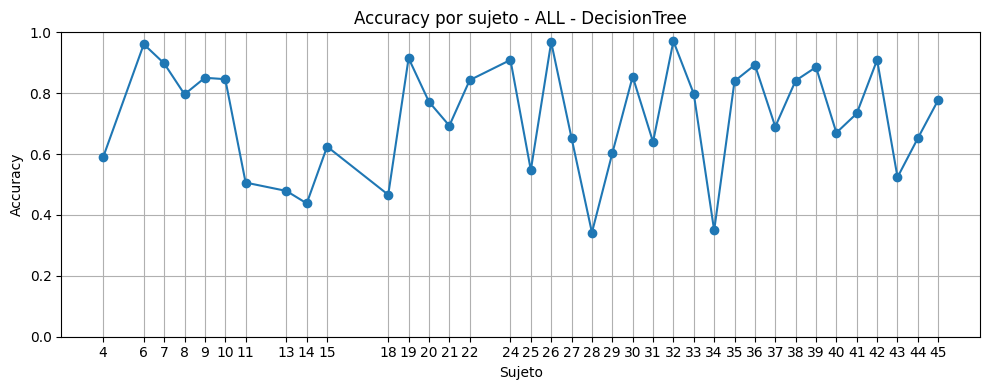

ALL - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.723155  ALL - DecisionTree
1  Precision  0.723336  ALL - DecisionTree
2     Recall  0.723155  ALL - DecisionTree
3   F1 Score  0.723127  ALL - DecisionTree
[ALL - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 30, 'min_samples_split': 2}
[ALL - DecisionTree] F1 Score (weighted): 0.7231
ALL - DecisionTree - Confusion Matrix
[[61768 25014]
 [22804 63139]]


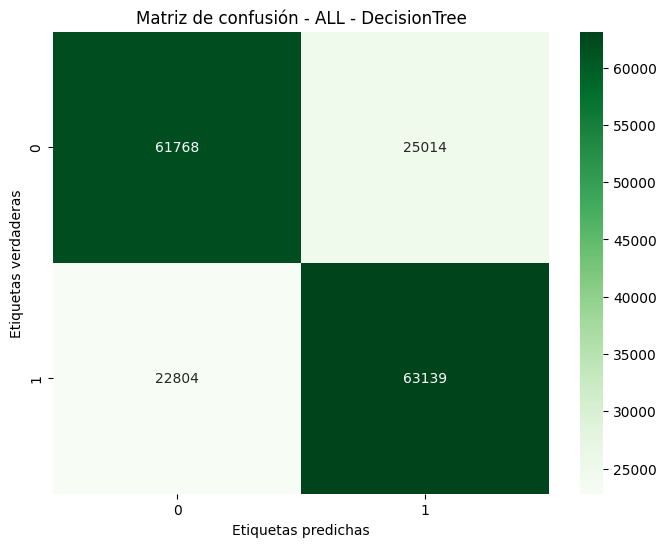

Training with ALL signals:  20%|██        | 1/5 [1:18:00<5:12:03, 4680.82s/it]

              precision    recall  f1-score   support

           0       0.73      0.71      0.72     86782
           1       0.72      0.73      0.73     85943

    accuracy                           0.72    172725
   macro avg       0.72      0.72      0.72    172725
weighted avg       0.72      0.72      0.72    172725

Training RandomForest model for ALL signals using LOGO...
[ALL - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[ALL - RandomForest] Fold 1/37 (Subject: 4)
[ALL - RandomForest] Fold 2/37 (Subject: 6)
[ALL - RandomForest] Fold 3/37 (Subject: 7)
[ALL - RandomForest] Fold 4/37 (Subject: 8)
[ALL - RandomForest] Fold 5/37 (Subject: 9)
[ALL - RandomForest] Fold 6/37 (Subject: 10)
[ALL - RandomForest] Fold 7/37 (Subject: 11)
[ALL - RandomForest] Fold 8/37 (Subject: 13)
[ALL - RandomForest] Fold 9/37 (Subject: 14)
[ALL - RandomForest] Fold 10/37 (Subject: 15)
[ALL - RandomForest] Fold 11/37 (Subject: 18)
[ALL - R

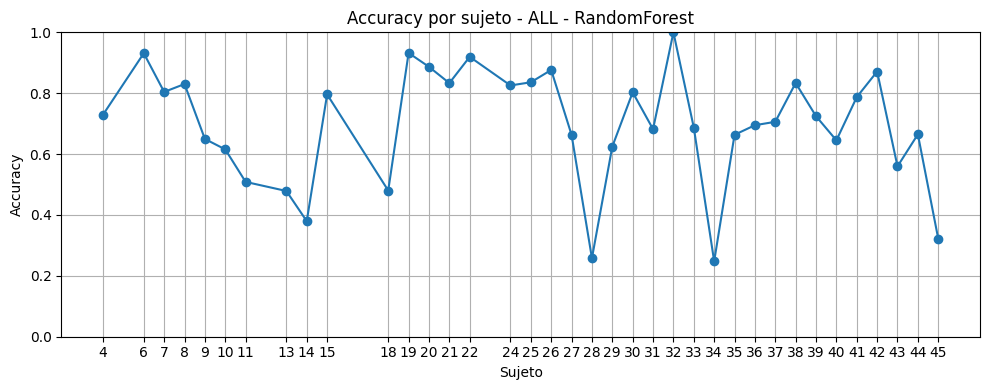

ALL - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.703170  ALL - RandomForest
1  Precision  0.703706  ALL - RandomForest
2     Recall  0.703170  ALL - RandomForest
3   F1 Score  0.703034  ALL - RandomForest
[ALL - RandomForest] Best Params: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
[ALL - RandomForest] F1 Score (weighted): 0.7030
ALL - RandomForest - Confusion Matrix
[[59078 27704]
 [23566 62377]]


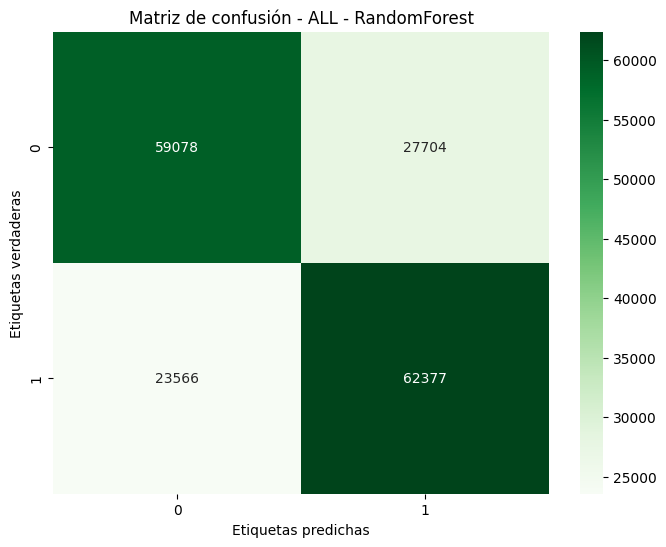

Training with ALL signals:  40%|████      | 2/5 [25:32:03<44:22:20, 53246.69s/it]

              precision    recall  f1-score   support

           0       0.71      0.68      0.70     86782
           1       0.69      0.73      0.71     85943

    accuracy                           0.70    172725
   macro avg       0.70      0.70      0.70    172725
weighted avg       0.70      0.70      0.70    172725

Training AdaBoost model for ALL signals using LOGO...
[ALL - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[ALL - AdaBoost] Fold 1/37 (Subject: 4)
[ALL - AdaBoost] Fold 2/37 (Subject: 6)
[ALL - AdaBoost] Fold 3/37 (Subject: 7)
[ALL - AdaBoost] Fold 4/37 (Subject: 8)
[ALL - AdaBoost] Fold 5/37 (Subject: 9)
[ALL - AdaBoost] Fold 6/37 (Subject: 10)
[ALL - AdaBoost] Fold 7/37 (Subject: 11)
[ALL - AdaBoost] Fold 8/37 (Subject: 13)
[ALL - AdaBoost] Fold 9/37 (Subject: 14)
[ALL - AdaBoost] Fold 10/37 (Subject: 15)
[ALL - AdaBoost] Fold 11/37 (Subject: 18)
[ALL - AdaBoost] Fold 12/37 (Subject: 19)
[ALL - AdaBoost] F

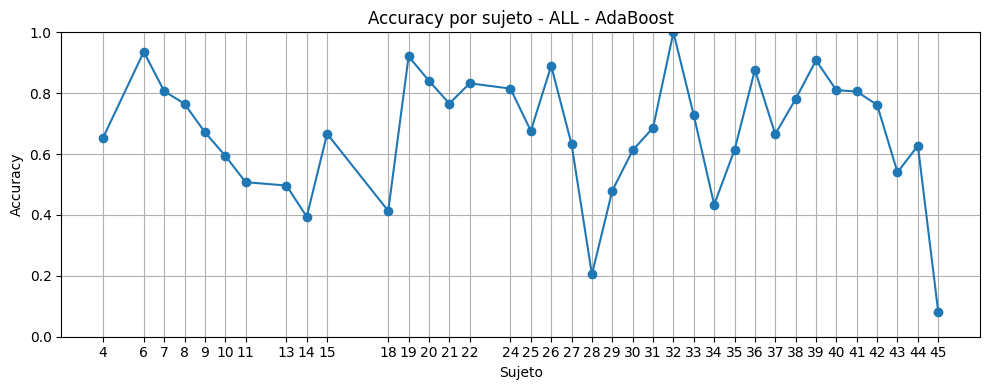

ALL - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.677539  ALL - AdaBoost
1  Precision  0.677577  ALL - AdaBoost
2     Recall  0.677539  ALL - AdaBoost
3   F1 Score  0.677493  ALL - AdaBoost
[ALL - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.5, 'n_estimators': 100}
[ALL - AdaBoost] F1 Score (weighted): 0.6775
ALL - AdaBoost - Confusion Matrix
[[59780 27002]
 [28695 57248]]


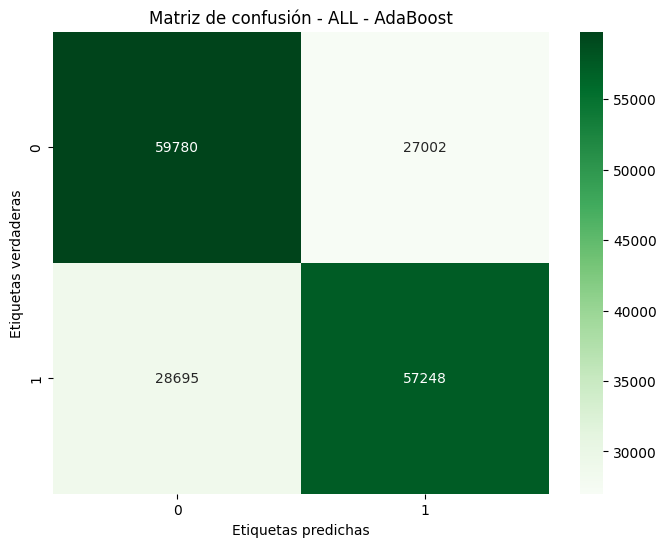

Training with ALL signals:  60%|██████    | 3/5 [51:04:07<39:23:35, 70907.62s/it]

              precision    recall  f1-score   support

           0       0.68      0.69      0.68     86782
           1       0.68      0.67      0.67     85943

    accuracy                           0.68    172725
   macro avg       0.68      0.68      0.68    172725
weighted avg       0.68      0.68      0.68    172725

Training LDA model for ALL signals using LOGO...
[ALL - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[ALL - LDA] Fold 1/37 (Subject: 4)
[ALL - LDA] Fold 2/37 (Subject: 6)
[ALL - LDA] Fold 3/37 (Subject: 7)
[ALL - LDA] Fold 4/37 (Subject: 8)
[ALL - LDA] Fold 5/37 (Subject: 9)
[ALL - LDA] Fold 6/37 (Subject: 10)
[ALL - LDA] Fold 7/37 (Subject: 11)
[ALL - LDA] Fold 8/37 (Subject: 13)
[ALL - LDA] Fold 9/37 (Subject: 14)
[ALL - LDA] Fold 10/37 (Subject: 15)
[ALL - LDA] Fold 11/37 (Subject: 18)
[ALL - LDA] Fold 12/37 (Subject: 19)
[ALL - LDA] Fold 13/37 (Subject: 20)
[ALL - LDA] Fold 14/37 (Subject: 21)
[ALL - LDA] Fold 

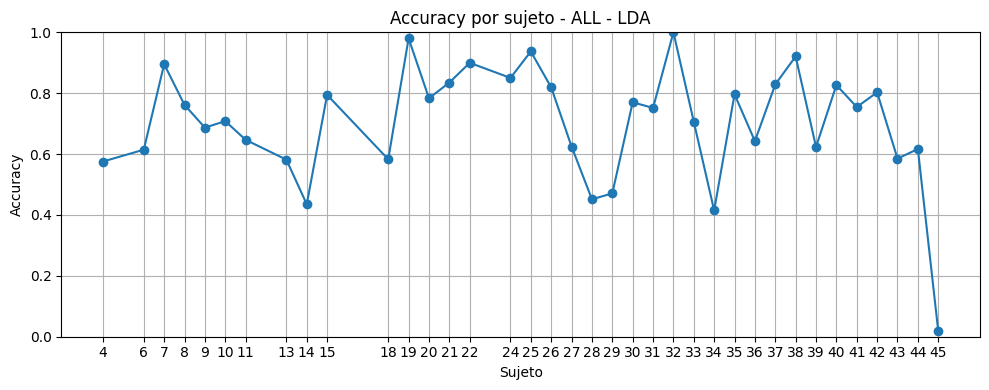

ALL - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.709498  ALL - LDA
1  Precision  0.711066  ALL - LDA
2     Recall  0.709498  ALL - LDA
3   F1 Score  0.709056  ALL - LDA
[ALL - LDA] Best Params: {'solver': 'svd'}
[ALL - LDA] F1 Score (weighted): 0.7091
ALL - LDA - Confusion Matrix
[[58112 28670]
 [21507 64436]]


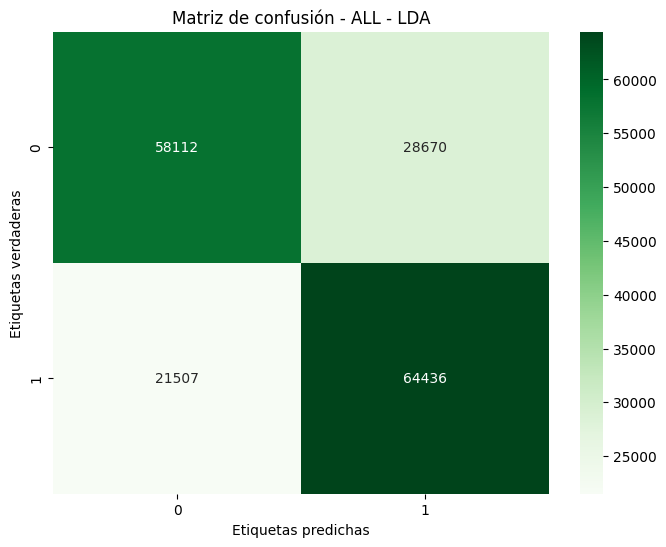

Training with ALL signals:  80%|████████  | 4/5 [51:05:04<11:55:36, 42936.68s/it]

              precision    recall  f1-score   support

           0       0.73      0.67      0.70     86782
           1       0.69      0.75      0.72     85943

    accuracy                           0.71    172725
   macro avg       0.71      0.71      0.71    172725
weighted avg       0.71      0.71      0.71    172725

Training KNN model for ALL signals using LOGO...
[ALL - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[ALL - KNN] Fold 1/37 (Subject: 4)
[ALL - KNN] Fold 2/37 (Subject: 6)
[ALL - KNN] Fold 3/37 (Subject: 7)
[ALL - KNN] Fold 4/37 (Subject: 8)
[ALL - KNN] Fold 5/37 (Subject: 9)
[ALL - KNN] Fold 6/37 (Subject: 10)
[ALL - KNN] Fold 7/37 (Subject: 11)
[ALL - KNN] Fold 8/37 (Subject: 13)
[ALL - KNN] Fold 9/37 (Subject: 14)
[ALL - KNN] Fold 10/37 (Subject: 15)
[ALL - KNN] Fold 11/37 (Subject: 18)
[ALL - KNN] Fold 12/37 (Subject: 19)
[ALL - KNN] Fold 13/37 (Subject: 20)
[ALL - KNN] Fold 14/37 (Subject: 21)
[ALL - KNN] Fold

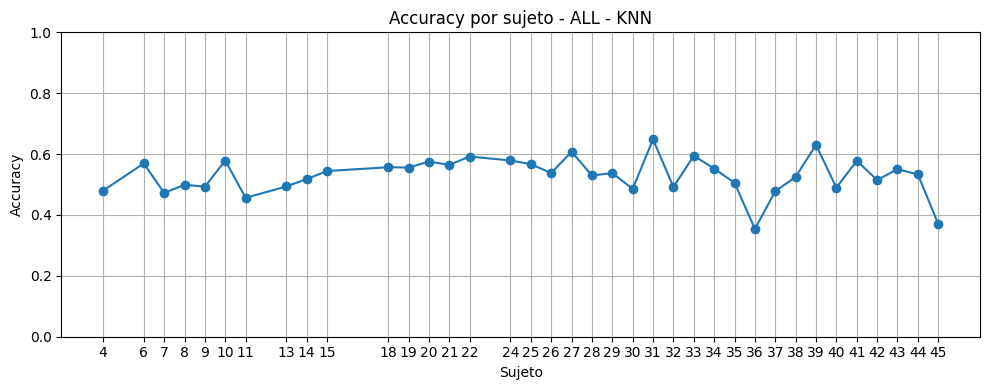

ALL - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.530045  ALL - KNN
1  Precision  0.530116  ALL - KNN
2     Recall  0.530045  ALL - KNN
3   F1 Score  0.530006  ALL - KNN
[ALL - KNN] Best Params: {'n_neighbors': 5, 'weights': 'uniform'}
[ALL - KNN] F1 Score (weighted): 0.5300
ALL - KNN - Confusion Matrix
[[45174 41608]
 [39565 46378]]


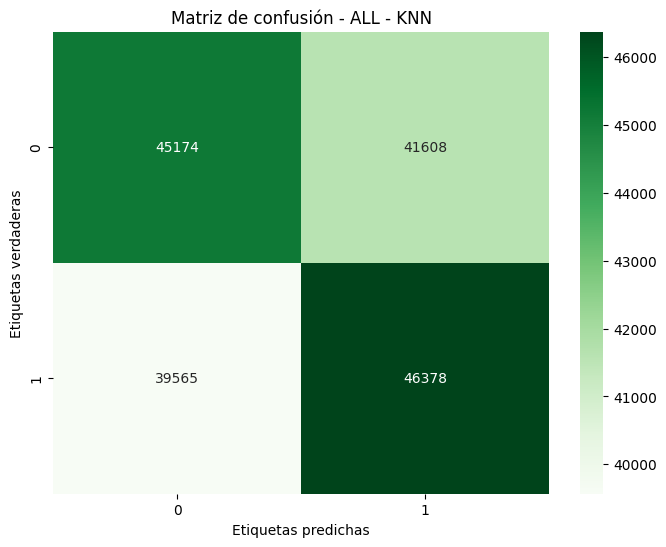

Training with ALL signals: 100%|██████████| 5/5 [51:07:54<00:00, 36814.92s/it]   

              precision    recall  f1-score   support

           0       0.53      0.52      0.53     86782
           1       0.53      0.54      0.53     85943

    accuracy                           0.53    172725
   macro avg       0.53      0.53      0.53    172725
weighted avg       0.53      0.53      0.53    172725


Final Comparison:
ECG - DecisionTree:
     Métrica     Valor               Etapa
0   Accuracy  0.586788  ECG - DecisionTree
1  Precision  0.592114  ECG - DecisionTree
2     Recall  0.586788  ECG - DecisionTree
3   F1 Score  0.581486  ECG - DecisionTree
ECG - RandomForest:
     Métrica     Valor               Etapa
0   Accuracy  0.553695  ECG - RandomForest
1  Precision  0.553674  ECG - RandomForest
2     Recall  0.553695  ECG - RandomForest
3   F1 Score  0.553641  ECG - RandomForest
ECG - AdaBoost:
     Métrica     Valor           Etapa
0   Accuracy  0.578723  ECG - AdaBoost
1  Precision  0.578752  ECG - AdaBoost
2     Recall  0.578723  ECG - AdaBoost
3   F1 Score

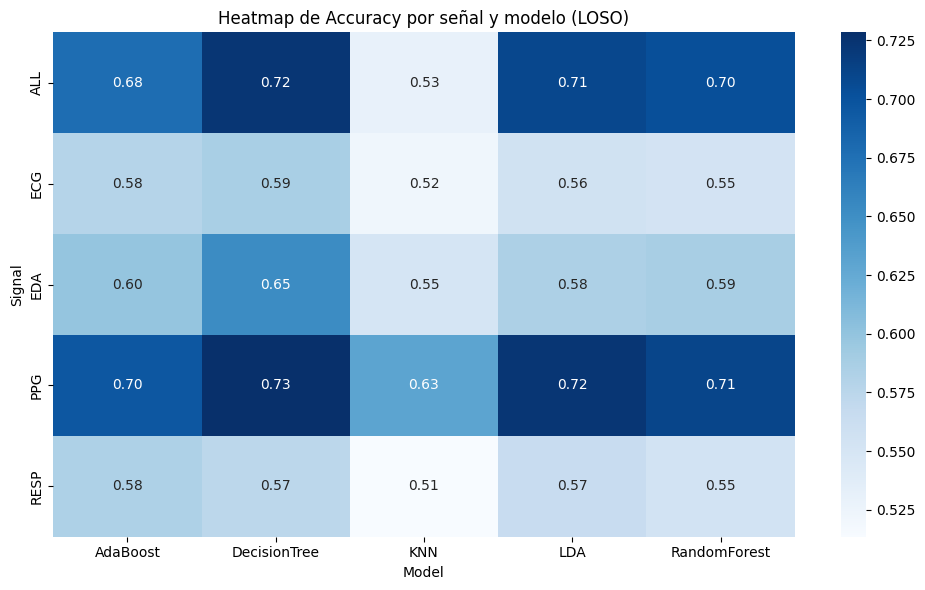

c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (9) than needed (5), which may not be intended.
  func(*plot_args, **plot_kwargs)
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (9) than needed (5), which may not be intended.
  func(*plot_args, **plot_kwargs)
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (9) than needed (5), which may not be intended.
  func(*plot_args, **plot_kwargs)
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (9) than needed (5), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\Gustavo\AppData\Local\Temp\ipykernel_5528\1711118399.py:80: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xtic

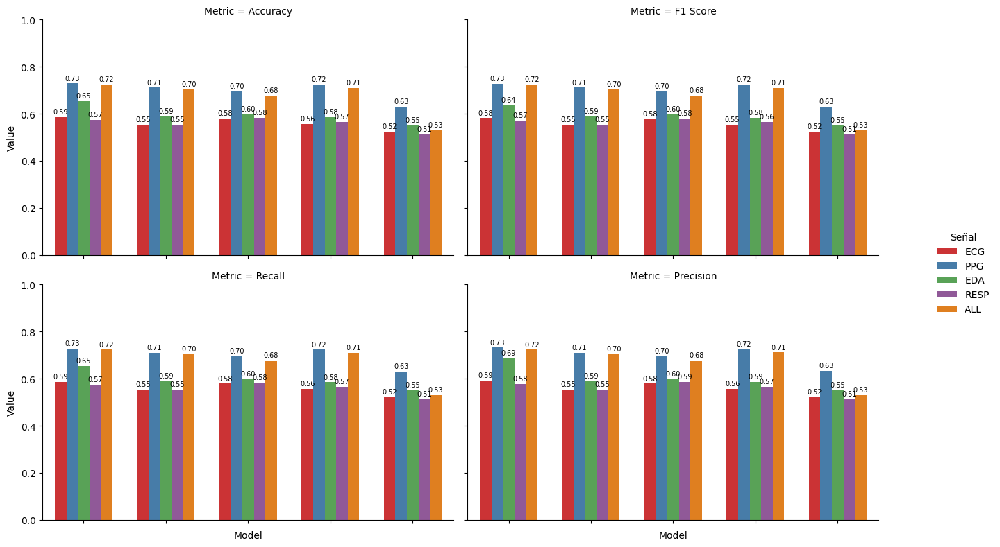

In [55]:
for signal, features in tqdm(SIGNAL_CATEGORIES.items(), desc="Training by signal"):
    if all(f in df.columns for f in features):  # Verificar que todas las columnas existen
        X = df[features].values  # Convertimos a array
        y = df['label'].values
        subjects = df['subject'].values  # Identificador de sujetos

        for model_name, (model, param_grid) in models.items():
            print(f'Training {model_name} model for {signal} using LOGO...')
            metrics = train_and_evaluate_logo(X, y, subjects, model, param_grid, model_name, signal)
            results[(signal, model_name)] = metrics.copy()

# Entrenamiento con todas las señales combinadas usando LOGO
X_all = df.drop(columns=['label', 'subject']).values
y_all = df['label'].values
subjects_all = df['subject'].values

for model_name, (model, param_grid) in tqdm(models.items(), desc="Training with ALL signals"):
    print(f'Training {model_name} model for ALL signals using LOGO...')
    metrics = train_and_evaluate_logo(X_all, y_all, subjects_all, model, param_grid, model_name, "ALL")
    results[("ALL", model_name)] = metrics.copy()

# Mostrar resultados finales
print("\nFinal Comparison:")
for (signal, model_name), acc in results.items():
    print(f'{signal} - {model_name}:')
    print(acc)

# Crear heatmap
rows = []
for (signal, model), df_metrics in results.items():
    metric_values = df_metrics.set_index('Métrica')['Valor']
    
    row = {
        'Signal': signal,
        'Model': model,
        'Accuracy': metric_values.get('Accuracy', None),
        'F1': metric_values.get('F1 Score', None),
        'Precision': metric_values.get('Precision', None),
        'Recall': metric_values.get('Recall', None)
    }
    rows.append(row)

metrics_df = pd.DataFrame(rows)

pivot_df = metrics_df.pivot(index='Signal', columns='Model', values='Accuracy')
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_df, annot=True, cmap="Blues", fmt=".2f")
plt.title('Heatmap de Accuracy por señal y modelo (LOSO)')
plt.tight_layout()
plt.show()


data = []
metrics = ["Accuracy", "F1 Score", "Recall", "Precision"]

for (signal, model), df in results.items():
    for metric in metrics:
        row = df[df["Métrica"] == metric]
        if not row.empty:
            value = row["Valor"].values[0]
            data.append((signal, model, metric, value))

df_all = pd.DataFrame(data, columns=["Signal", "Model", "Metric", "Value"])

# Paleta bonita
palette = sns.color_palette("Set1")

# Hacer el FacetGrid
g = sns.FacetGrid(df_all, col="Metric", sharey=True, col_wrap=2, height=4, aspect=1.5)
g.map_dataframe(sns.barplot, x="Model", y="Value", hue="Signal", palette=palette, width=0.7, dodge=True)  # <-- aquí el width más pequeño

# Ajustes para la leyenda
g.add_legend(title="Señal", bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0)

# Añadir etiquetas de valores
for ax in g.axes.flatten():
    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", label_type="edge", fontsize=7, padding=2)
    ax.set_ylim(0, 1)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

Training by signal combinations:   0%|          | 0/11 [00:00<?, ?it/s]

Training DecisionTree model for ('ECG', 'PPG') using LOSO...
[('ECG', 'PPG') - DecisionTree] LOGO: 26 folds (1 por sujeto)
Fitting 26 folds for each of 120 candidates, totalling 3120 fits
[('ECG', 'PPG') - DecisionTree] Fold 1/26 (Subject: 4)
[('ECG', 'PPG') - DecisionTree] Fold 2/26 (Subject: 6)
[('ECG', 'PPG') - DecisionTree] Fold 3/26 (Subject: 7)
[('ECG', 'PPG') - DecisionTree] Fold 4/26 (Subject: 8)
[('ECG', 'PPG') - DecisionTree] Fold 5/26 (Subject: 9)
[('ECG', 'PPG') - DecisionTree] Fold 6/26 (Subject: 10)
[('ECG', 'PPG') - DecisionTree] Fold 7/26 (Subject: 11)
[('ECG', 'PPG') - DecisionTree] Fold 8/26 (Subject: 13)
[('ECG', 'PPG') - DecisionTree] Fold 9/26 (Subject: 14)
[('ECG', 'PPG') - DecisionTree] Fold 10/26 (Subject: 15)
[('ECG', 'PPG') - DecisionTree] Fold 11/26 (Subject: 18)
[('ECG', 'PPG') - DecisionTree] Fold 12/26 (Subject: 19)
[('ECG', 'PPG') - DecisionTree] Fold 13/26 (Subject: 20)
[('ECG', 'PPG') - DecisionTree] Fold 14/26 (Subject: 21)
[('ECG', 'PPG') - DecisionTr

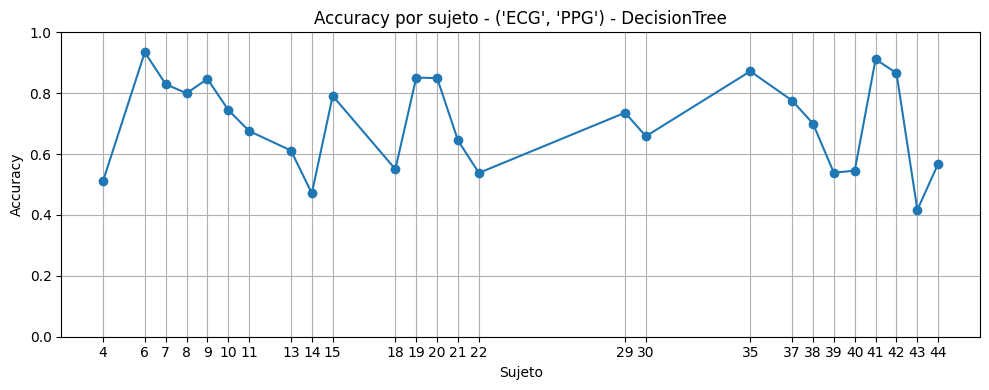

('ECG', 'PPG') - DecisionTree Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.702256  ('ECG', 'PPG') - DecisionTree
1  Precision  0.701612  ('ECG', 'PPG') - DecisionTree
2     Recall  0.702256  ('ECG', 'PPG') - DecisionTree
3   F1 Score  0.701687  ('ECG', 'PPG') - DecisionTree
[('ECG', 'PPG') - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 10, 'min_samples_split': 2}
[('ECG', 'PPG') - DecisionTree] Accuracy: 0.7023
('ECG', 'PPG') - DecisionTree - Confusion Matrix
[[47731 25127]
 [22155 63788]]


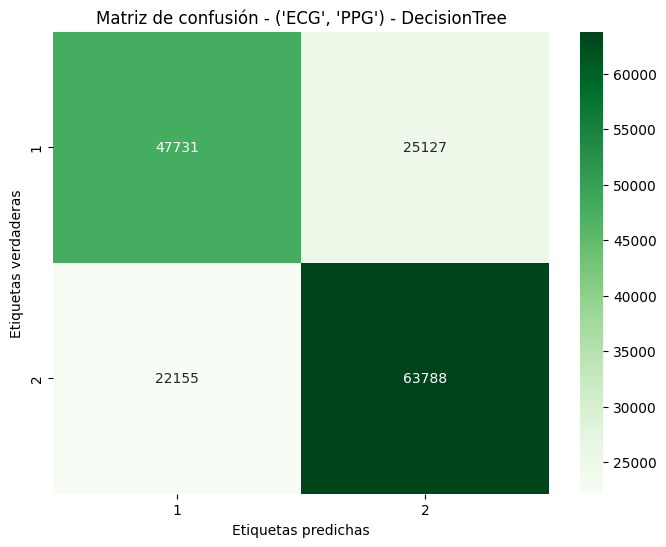

              precision    recall  f1-score   support

           1       0.68      0.66      0.67     72858
           2       0.72      0.74      0.73     85943

    accuracy                           0.70    158801
   macro avg       0.70      0.70      0.70    158801
weighted avg       0.70      0.70      0.70    158801

Training RandomForest model for ('ECG', 'PPG') using LOSO...
[('ECG', 'PPG') - RandomForest] LOGO: 26 folds (1 por sujeto)
Fitting 26 folds for each of 72 candidates, totalling 1872 fits
[('ECG', 'PPG') - RandomForest] Fold 1/26 (Subject: 4)
[('ECG', 'PPG') - RandomForest] Fold 2/26 (Subject: 6)
[('ECG', 'PPG') - RandomForest] Fold 3/26 (Subject: 7)
[('ECG', 'PPG') - RandomForest] Fold 4/26 (Subject: 8)
[('ECG', 'PPG') - RandomForest] Fold 5/26 (Subject: 9)
[('ECG', 'PPG') - RandomForest] Fold 6/26 (Subject: 10)
[('ECG', 'PPG') - RandomForest] Fold 7/26 (Subject: 11)
[('ECG', 'PPG') - RandomForest] Fold 8/26 (Subject: 13)
[('ECG', 'PPG') - RandomForest] Fold 9/26 (

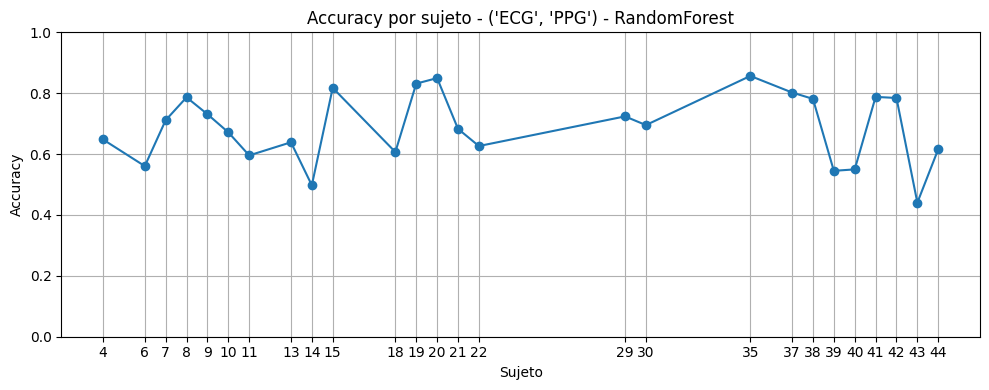

('ECG', 'PPG') - RandomForest Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.687445  ('ECG', 'PPG') - RandomForest
1  Precision  0.686745  ('ECG', 'PPG') - RandomForest
2     Recall  0.687445  ('ECG', 'PPG') - RandomForest
3   F1 Score  0.686865  ('ECG', 'PPG') - RandomForest
[('ECG', 'PPG') - RandomForest] Best Params: {'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
[('ECG', 'PPG') - RandomForest] Accuracy: 0.6874
('ECG', 'PPG') - RandomForest - Confusion Matrix
[[46591 26267]
 [23367 62576]]


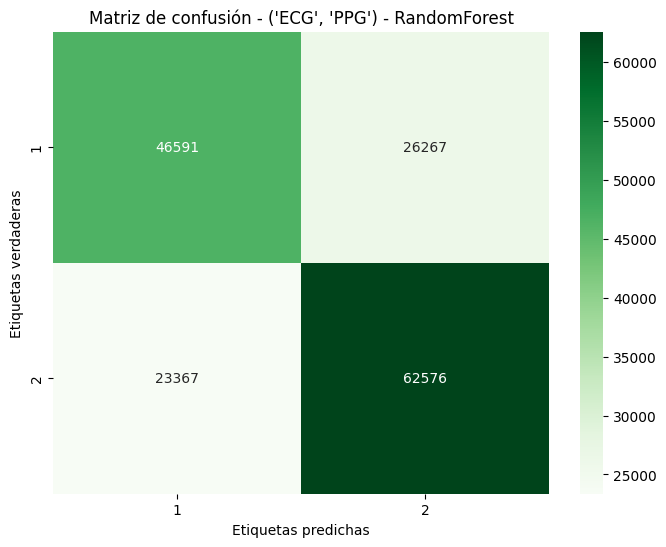

              precision    recall  f1-score   support

           1       0.67      0.64      0.65     72858
           2       0.70      0.73      0.72     85943

    accuracy                           0.69    158801
   macro avg       0.69      0.68      0.68    158801
weighted avg       0.69      0.69      0.69    158801

Training AdaBoost model for ('ECG', 'PPG') using LOSO...
[('ECG', 'PPG') - AdaBoost] LOGO: 26 folds (1 por sujeto)
Fitting 26 folds for each of 32 candidates, totalling 832 fits
[('ECG', 'PPG') - AdaBoost] Fold 1/26 (Subject: 4)
[('ECG', 'PPG') - AdaBoost] Fold 2/26 (Subject: 6)
[('ECG', 'PPG') - AdaBoost] Fold 3/26 (Subject: 7)
[('ECG', 'PPG') - AdaBoost] Fold 4/26 (Subject: 8)
[('ECG', 'PPG') - AdaBoost] Fold 5/26 (Subject: 9)
[('ECG', 'PPG') - AdaBoost] Fold 6/26 (Subject: 10)
[('ECG', 'PPG') - AdaBoost] Fold 7/26 (Subject: 11)
[('ECG', 'PPG') - AdaBoost] Fold 8/26 (Subject: 13)
[('ECG', 'PPG') - AdaBoost] Fold 9/26 (Subject: 14)
[('ECG', 'PPG') - AdaBoost] Fold

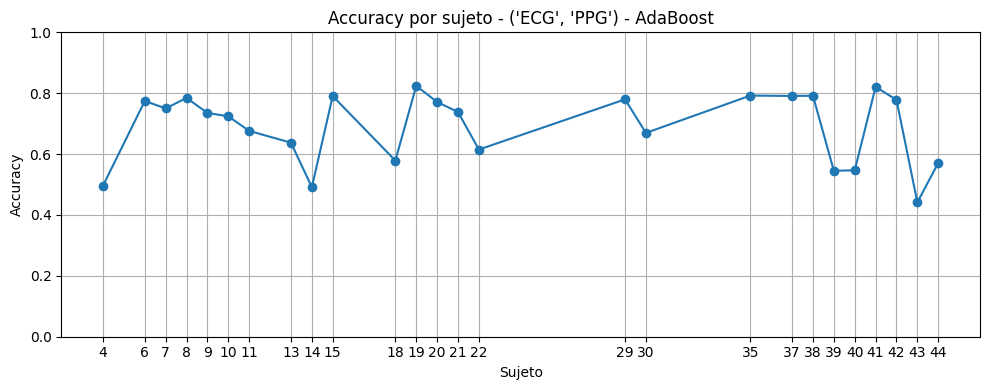

('ECG', 'PPG') - AdaBoost Metrics
     Métrica     Valor                      Etapa
0   Accuracy  0.689907  ('ECG', 'PPG') - AdaBoost
1  Precision  0.689076  ('ECG', 'PPG') - AdaBoost
2     Recall  0.689907  ('ECG', 'PPG') - AdaBoost
3   F1 Score  0.689020  ('ECG', 'PPG') - AdaBoost
[('ECG', 'PPG') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.01, 'n_estimators': 200}
[('ECG', 'PPG') - AdaBoost] Accuracy: 0.6899
('ECG', 'PPG') - AdaBoost - Confusion Matrix
[[46166 26692]
 [22551 63392]]


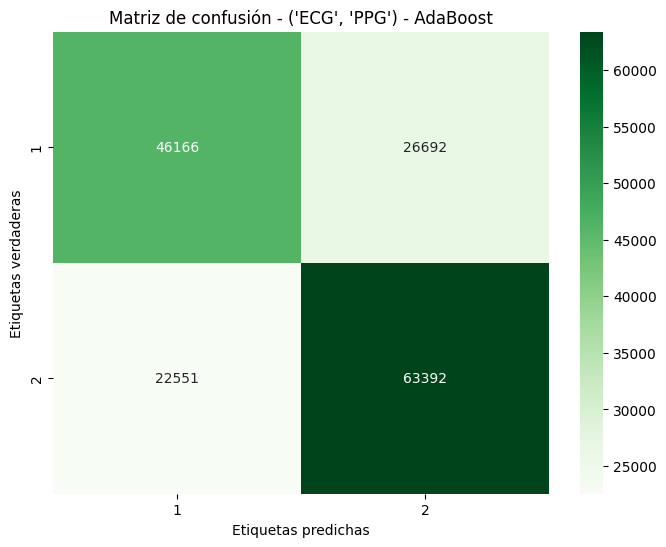

              precision    recall  f1-score   support

           1       0.67      0.63      0.65     72858
           2       0.70      0.74      0.72     85943

    accuracy                           0.69    158801
   macro avg       0.69      0.69      0.69    158801
weighted avg       0.69      0.69      0.69    158801

Training LDA model for ('ECG', 'PPG') using LOSO...
[('ECG', 'PPG') - LDA] LOGO: 26 folds (1 por sujeto)
Fitting 26 folds for each of 1 candidates, totalling 26 fits
[('ECG', 'PPG') - LDA] Fold 1/26 (Subject: 4)
[('ECG', 'PPG') - LDA] Fold 2/26 (Subject: 6)
[('ECG', 'PPG') - LDA] Fold 3/26 (Subject: 7)
[('ECG', 'PPG') - LDA] Fold 4/26 (Subject: 8)
[('ECG', 'PPG') - LDA] Fold 5/26 (Subject: 9)
[('ECG', 'PPG') - LDA] Fold 6/26 (Subject: 10)
[('ECG', 'PPG') - LDA] Fold 7/26 (Subject: 11)
[('ECG', 'PPG') - LDA] Fold 8/26 (Subject: 13)
[('ECG', 'PPG') - LDA] Fold 9/26 (Subject: 14)
[('ECG', 'PPG') - LDA] Fold 10/26 (Subject: 15)
[('ECG', 'PPG') - LDA] Fold 11/26 (Subjec

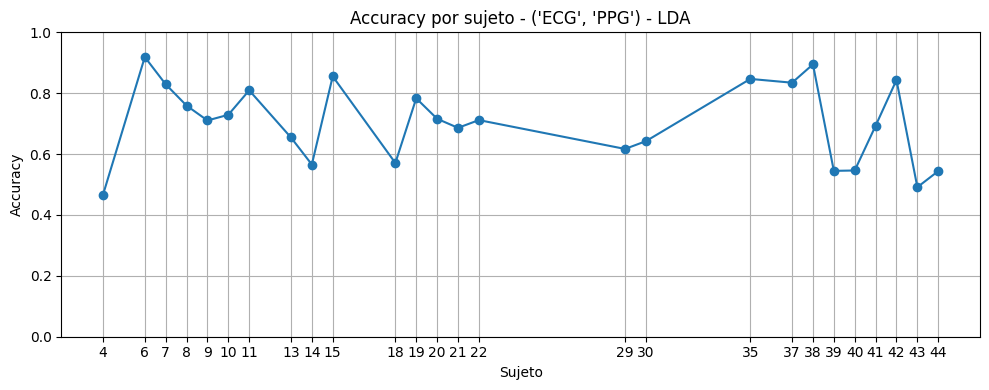

('ECG', 'PPG') - LDA Metrics
     Métrica     Valor                 Etapa
0   Accuracy  0.703484  ('ECG', 'PPG') - LDA
1  Precision  0.705321  ('ECG', 'PPG') - LDA
2     Recall  0.703484  ('ECG', 'PPG') - LDA
3   F1 Score  0.699150  ('ECG', 'PPG') - LDA
[('ECG', 'PPG') - LDA] Best Params: {'solver': 'svd'}
[('ECG', 'PPG') - LDA] Accuracy: 0.7035
('ECG', 'PPG') - LDA - Confusion Matrix
[[42572 30286]
 [16801 69142]]


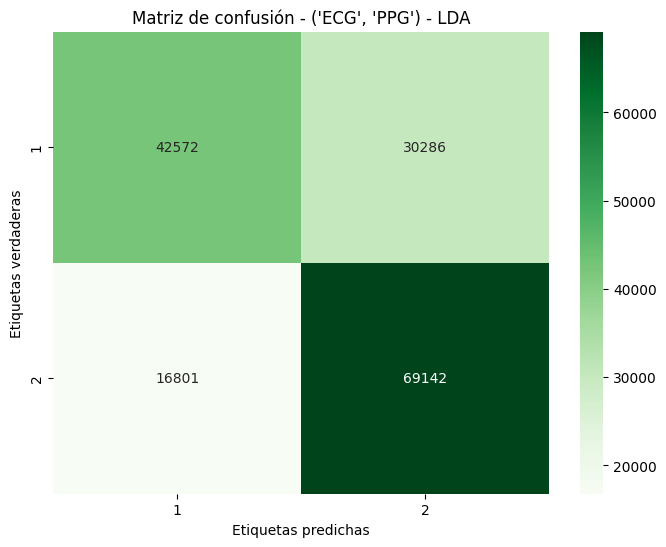

              precision    recall  f1-score   support

           1       0.72      0.58      0.64     72858
           2       0.70      0.80      0.75     85943

    accuracy                           0.70    158801
   macro avg       0.71      0.69      0.69    158801
weighted avg       0.71      0.70      0.70    158801

Training KNN model for ('ECG', 'PPG') using LOSO...
[('ECG', 'PPG') - KNN] LOGO: 26 folds (1 por sujeto)
Fitting 26 folds for each of 8 candidates, totalling 208 fits
[('ECG', 'PPG') - KNN] Fold 1/26 (Subject: 4)
[('ECG', 'PPG') - KNN] Fold 2/26 (Subject: 6)
[('ECG', 'PPG') - KNN] Fold 3/26 (Subject: 7)
[('ECG', 'PPG') - KNN] Fold 4/26 (Subject: 8)
[('ECG', 'PPG') - KNN] Fold 5/26 (Subject: 9)
[('ECG', 'PPG') - KNN] Fold 6/26 (Subject: 10)
[('ECG', 'PPG') - KNN] Fold 7/26 (Subject: 11)
[('ECG', 'PPG') - KNN] Fold 8/26 (Subject: 13)
[('ECG', 'PPG') - KNN] Fold 9/26 (Subject: 14)
[('ECG', 'PPG') - KNN] Fold 10/26 (Subject: 15)
[('ECG', 'PPG') - KNN] Fold 11/26 (Subje

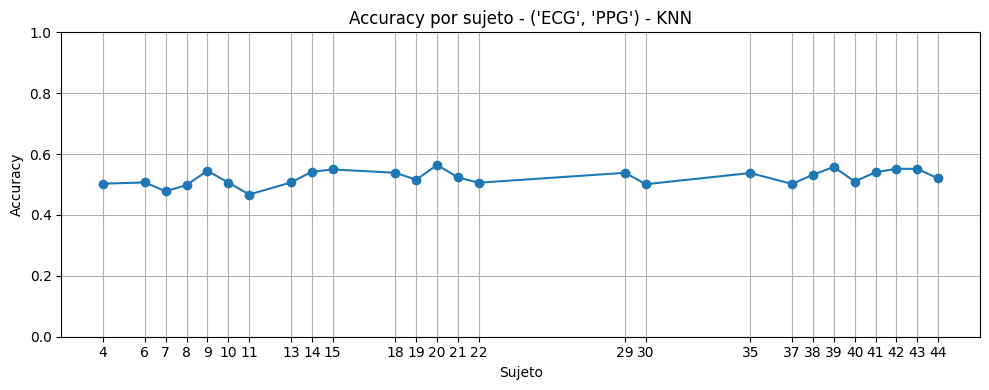

('ECG', 'PPG') - KNN Metrics
     Métrica     Valor                 Etapa
0   Accuracy  0.522975  ('ECG', 'PPG') - KNN
1  Precision  0.519267  ('ECG', 'PPG') - KNN
2     Recall  0.522975  ('ECG', 'PPG') - KNN
3   F1 Score  0.519903  ('ECG', 'PPG') - KNN
[('ECG', 'PPG') - KNN] Best Params: {'n_neighbors': 9, 'weights': 'uniform'}
[('ECG', 'PPG') - KNN] Accuracy: 0.5230
('ECG', 'PPG') - KNN - Confusion Matrix
[[31139 41719]
 [34033 51910]]


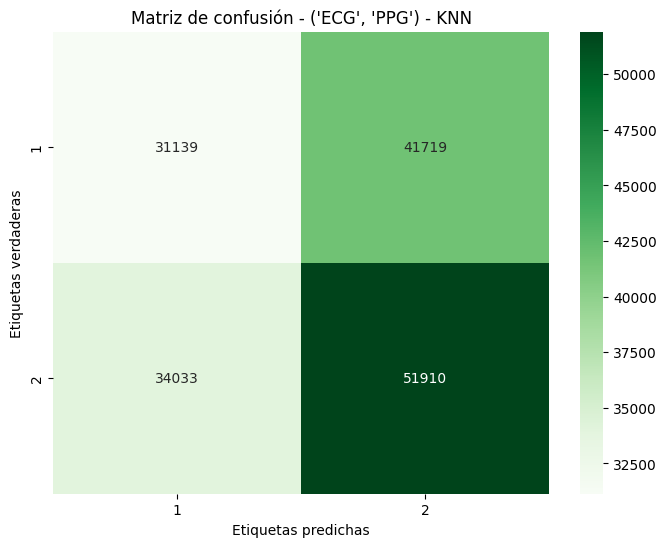

Training by signal combinations:   9%|▉         | 1/11 [23:38:53<236:28:55, 85133.60s/it]

              precision    recall  f1-score   support

           1       0.48      0.43      0.45     72858
           2       0.55      0.60      0.58     85943

    accuracy                           0.52    158801
   macro avg       0.52      0.52      0.51    158801
weighted avg       0.52      0.52      0.52    158801

Training DecisionTree model for ('ECG', 'EDA') using LOSO...
[('ECG', 'EDA') - DecisionTree] LOGO: 26 folds (1 por sujeto)
Fitting 26 folds for each of 120 candidates, totalling 3120 fits
[('ECG', 'EDA') - DecisionTree] Fold 1/26 (Subject: 4)
[('ECG', 'EDA') - DecisionTree] Fold 2/26 (Subject: 6)
[('ECG', 'EDA') - DecisionTree] Fold 3/26 (Subject: 7)
[('ECG', 'EDA') - DecisionTree] Fold 4/26 (Subject: 8)
[('ECG', 'EDA') - DecisionTree] Fold 5/26 (Subject: 9)
[('ECG', 'EDA') - DecisionTree] Fold 6/26 (Subject: 10)
[('ECG', 'EDA') - DecisionTree] Fold 7/26 (Subject: 11)
[('ECG', 'EDA') - DecisionTree] Fold 8/26 (Subject: 13)
[('ECG', 'EDA') - DecisionTree] Fold 9/26 

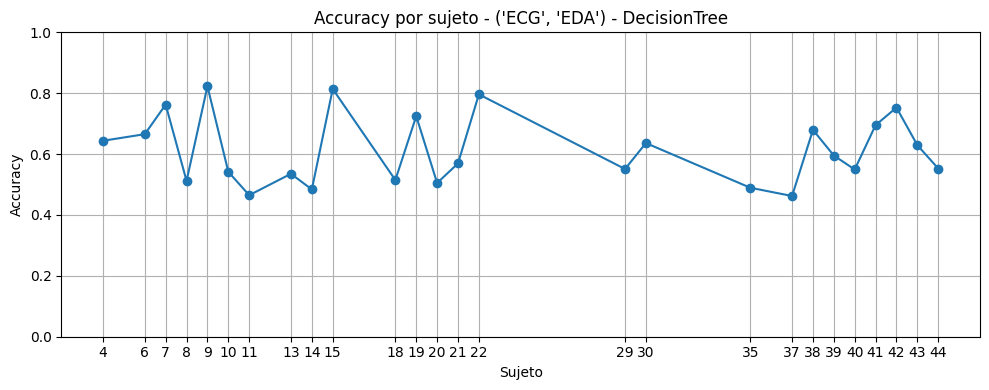

('ECG', 'EDA') - DecisionTree Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.612975  ('ECG', 'EDA') - DecisionTree
1  Precision  0.620051  ('ECG', 'EDA') - DecisionTree
2     Recall  0.612975  ('ECG', 'EDA') - DecisionTree
3   F1 Score  0.613243  ('ECG', 'EDA') - DecisionTree
[('ECG', 'EDA') - DecisionTree] Best Params: {'criterion': 'entropy', 'max_depth': 10, 'max_leaf_nodes': 20, 'min_samples_split': 2}
[('ECG', 'EDA') - DecisionTree] Accuracy: 0.6130
('ECG', 'EDA') - DecisionTree - Confusion Matrix
[[47914 24944]
 [36516 49427]]


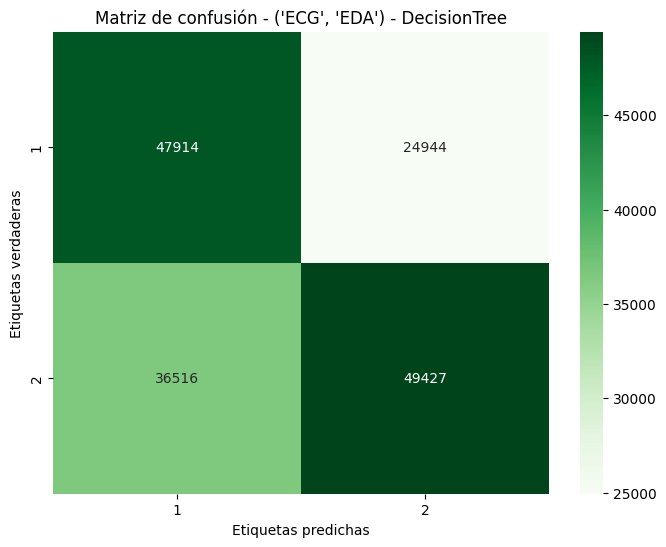

              precision    recall  f1-score   support

           1       0.57      0.66      0.61     72858
           2       0.66      0.58      0.62     85943

    accuracy                           0.61    158801
   macro avg       0.62      0.62      0.61    158801
weighted avg       0.62      0.61      0.61    158801

Training RandomForest model for ('ECG', 'EDA') using LOSO...
[('ECG', 'EDA') - RandomForest] LOGO: 26 folds (1 por sujeto)
Fitting 26 folds for each of 72 candidates, totalling 1872 fits
[('ECG', 'EDA') - RandomForest] Fold 1/26 (Subject: 4)
[('ECG', 'EDA') - RandomForest] Fold 2/26 (Subject: 6)
[('ECG', 'EDA') - RandomForest] Fold 3/26 (Subject: 7)
[('ECG', 'EDA') - RandomForest] Fold 4/26 (Subject: 8)
[('ECG', 'EDA') - RandomForest] Fold 5/26 (Subject: 9)
[('ECG', 'EDA') - RandomForest] Fold 6/26 (Subject: 10)
[('ECG', 'EDA') - RandomForest] Fold 7/26 (Subject: 11)
[('ECG', 'EDA') - RandomForest] Fold 8/26 (Subject: 13)
[('ECG', 'EDA') - RandomForest] Fold 9/26 (

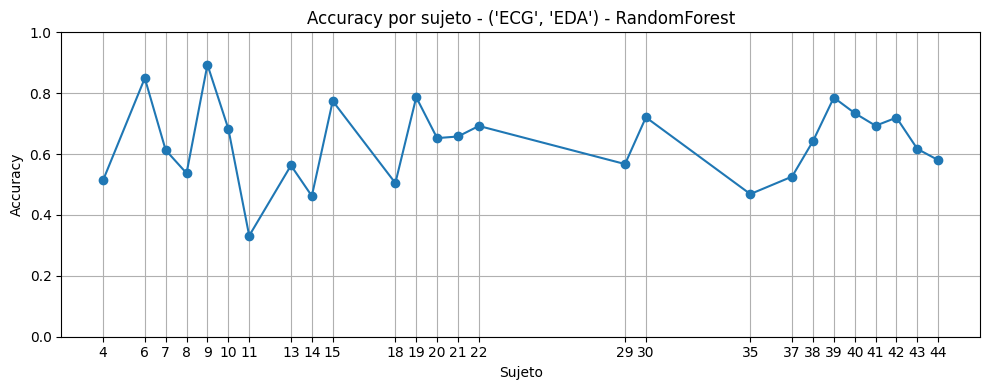

('ECG', 'EDA') - RandomForest Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.636658  ('ECG', 'EDA') - RandomForest
1  Precision  0.638907  ('ECG', 'EDA') - RandomForest
2     Recall  0.636658  ('ECG', 'EDA') - RandomForest
3   F1 Score  0.637227  ('ECG', 'EDA') - RandomForest
[('ECG', 'EDA') - RandomForest] Best Params: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 20, 'n_estimators': 100}
[('ECG', 'EDA') - RandomForest] Accuracy: 0.6367
('ECG', 'EDA') - RandomForest - Confusion Matrix
[[46355 26503]
 [31196 54747]]


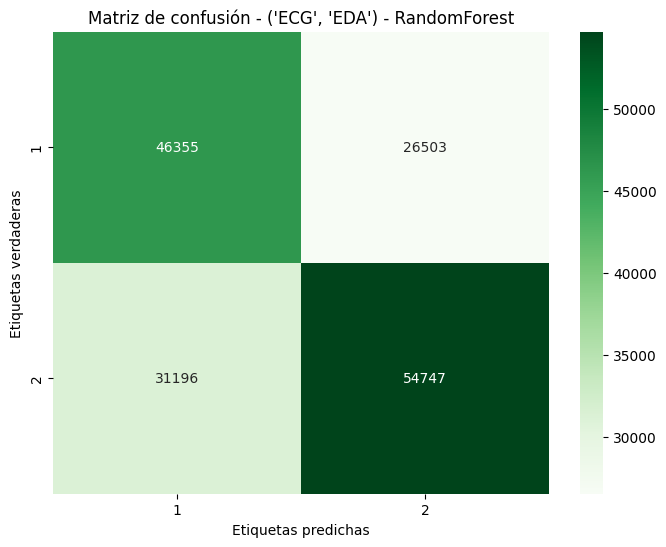

              precision    recall  f1-score   support

           1       0.60      0.64      0.62     72858
           2       0.67      0.64      0.65     85943

    accuracy                           0.64    158801
   macro avg       0.64      0.64      0.64    158801
weighted avg       0.64      0.64      0.64    158801

Training AdaBoost model for ('ECG', 'EDA') using LOSO...
[('ECG', 'EDA') - AdaBoost] LOGO: 26 folds (1 por sujeto)
Fitting 26 folds for each of 32 candidates, totalling 832 fits
[('ECG', 'EDA') - AdaBoost] Fold 1/26 (Subject: 4)
[('ECG', 'EDA') - AdaBoost] Fold 2/26 (Subject: 6)
[('ECG', 'EDA') - AdaBoost] Fold 3/26 (Subject: 7)
[('ECG', 'EDA') - AdaBoost] Fold 4/26 (Subject: 8)
[('ECG', 'EDA') - AdaBoost] Fold 5/26 (Subject: 9)
[('ECG', 'EDA') - AdaBoost] Fold 6/26 (Subject: 10)
[('ECG', 'EDA') - AdaBoost] Fold 7/26 (Subject: 11)
[('ECG', 'EDA') - AdaBoost] Fold 8/26 (Subject: 13)
[('ECG', 'EDA') - AdaBoost] Fold 9/26 (Subject: 14)
[('ECG', 'EDA') - AdaBoost] Fold

Training by signal combinations:   9%|▉         | 1/11 [45:45:28<457:34:47, 164728.71s/it]


KeyboardInterrupt: 

In [33]:
for combo in tqdm(combinations, desc="Training by signal combinations"):
    features = sum([SIGNAL_CATEGORIES[signal] for signal in combo], [])
    if all(f in df.columns for f in features):# Verificar que todas las columnas existen
        X = df[features].values
        y = df['label'].values
        subjects = df['subject'].values # Se agrega el identificador de sujetos para LOSO

        for model_name, (model, param_grid) in models.items():
            print(f'Training {model_name} model for {combo} using LOSO...')
            metrics = train_and_evaluate_logo(X, y, subjects, model, param_grid, model_name, combo)
        
            # Convertir diccionario de métricas a DataFrame con mismo formato que antes
            results[(combo, model_name)] = metrics.copy()

# Mostrar resultados finales
print("\nFinal Comparison:")
for (combo, model_name), acc in results.items():
    print(f'{combo} - {model_name}:')
    print(acc)

# Crear heatmap
rows = []
for (combo, model), df_metrics in results.items():
    metric_values = df_metrics.set_index('Métrica')['Valor']

    row = {
    'Signal': combo,
    'Model': model,
    'Accuracy': metric_values.get('Accuracy', None),
    'F1': metric_values.get('F1 Score', None),
    'Precision': metric_values.get('Precision', None),
    'Recall': metric_values.get('Recall', None)
    }
    rows.append(row)

metrics_df = pd.DataFrame(rows)

pivot_df = metrics_df.pivot(index='Signal', columns='Model', values='Accuracy')
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_df, annot=True, cmap="Blues", fmt=".2f")
plt.title('Heatmap de Accuracy por combinación de señales y modelo (LOSO)')
plt.tight_layout()
plt.show()

data = []
metrics = ["Accuracy", "F1 Score", "Recall", "Precision"]

for (combo, model), df in results.items():
    for metric in metrics:
        row = df[df["Métrica"] == metric]
        if not row.empty:
            value = row["Valor"].values[0]
            data.append((combo, model, metric, value))

df_all = pd.DataFrame(data, columns=["Signal", "Model", "Metric", "Value"])

# Paleta bonita
palette = sns.color_palette("Set1")

# Hacer el FacetGrid
g = sns.FacetGrid(df_all, col="Metric", sharey=True, col_wrap=2, height=4, aspect=1.5)
g.map_dataframe(sns.barplot, x="Model", y="Value", hue="Signal", palette=palette, width=0.7, dodge=True)

# Ajustes para la leyenda
g.add_legend(title="Señal", bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0)

# Añadir etiquetas de valores
for ax in g.axes.flatten():
    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", label_type="edge", fontsize=7, padding=2)
    ax.set_ylim(0, 1)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

4-CLASIFICATION

In [11]:
file = r'features_30_075\features.csv'

df = load_data(file)
df = df.fillna(0)

In [12]:
for i in range(1, len(df['label'].unique())+1):
    mask = (df['label'] == i).sum()
    print(f'Label: {i} total: {mask}')

Label: 1 total: 73554
Label: 2 total: 48333
Label: 3 total: 42875
Label: 4 total: 43068
Label: 5 total: 13228


In [13]:
df = df[df['label'] != 5]

In [14]:
for i in range(1, len(df['label'].unique())+1):
    mask = (df['label'] == i).sum()
    print(f'Label: {i} total: {mask}')

Label: 1 total: 73554
Label: 2 total: 48333
Label: 3 total: 42875
Label: 4 total: 43068


Training by signal:   0%|          | 0/4 [00:00<?, ?it/s]

Training DecisionTree model for ECG using LOGO...
[ECG - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[ECG - DecisionTree] Fold 1/37 (Subject: 4)
[ECG - DecisionTree] Fold 2/37 (Subject: 6)
[ECG - DecisionTree] Fold 3/37 (Subject: 7)
[ECG - DecisionTree] Fold 4/37 (Subject: 8)
[ECG - DecisionTree] Fold 5/37 (Subject: 9)
[ECG - DecisionTree] Fold 6/37 (Subject: 10)
[ECG - DecisionTree] Fold 7/37 (Subject: 11)
[ECG - DecisionTree] Fold 8/37 (Subject: 13)
[ECG - DecisionTree] Fold 9/37 (Subject: 14)
[ECG - DecisionTree] Fold 10/37 (Subject: 15)
[ECG - DecisionTree] Fold 11/37 (Subject: 18)
[ECG - DecisionTree] Fold 12/37 (Subject: 19)
[ECG - DecisionTree] Fold 13/37 (Subject: 20)
[ECG - DecisionTree] Fold 14/37 (Subject: 21)
[ECG - DecisionTree] Fold 15/37 (Subject: 22)
[ECG - DecisionTree] Fold 16/37 (Subject: 24)
[ECG - DecisionTree] Fold 17/37 (Subject: 25)
[ECG - DecisionTree] Fold 18/37 (Subject: 26)
[ECG - DecisionTree]

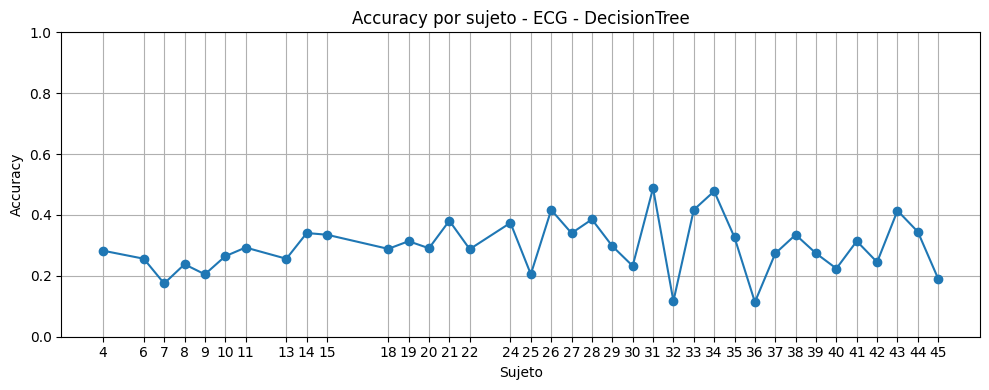

ECG - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.296026  ECG - DecisionTree
1  Precision  0.308905  ECG - DecisionTree
2     Recall  0.296026  ECG - DecisionTree
3   F1 Score  0.296159  ECG - DecisionTree
[ECG - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 20, 'min_samples_split': 2}
[ECG - DecisionTree] F1 Score (weighted): 0.2962
ECG - DecisionTree - Confusion Matrix
[[22460 19995 16058 15041]
 [13013 13386  9562 12372]
 [ 7142 11131 19186  5416]
 [ 9236 14430 12911  6491]]


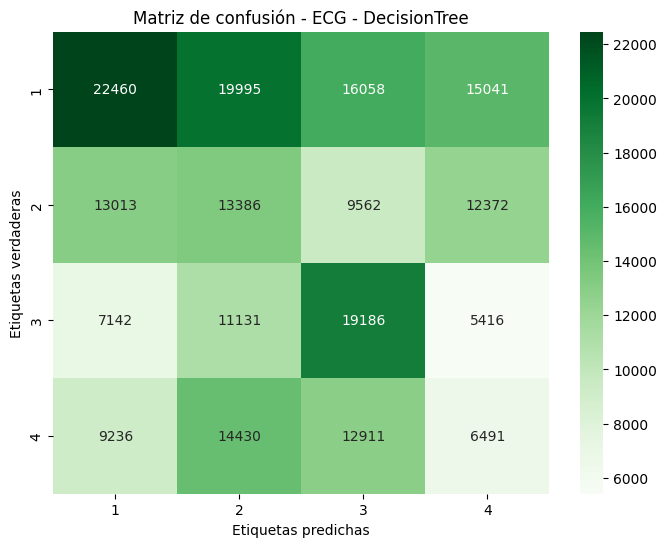

              precision    recall  f1-score   support

           1       0.43      0.31      0.36     73554
           2       0.23      0.28      0.25     48333
           3       0.33      0.45      0.38     42875
           4       0.17      0.15      0.16     43068

    accuracy                           0.30    207830
   macro avg       0.29      0.30      0.29    207830
weighted avg       0.31      0.30      0.30    207830

Training RandomForest model for ECG using LOGO...
[ECG - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[ECG - RandomForest] Fold 1/37 (Subject: 4)
[ECG - RandomForest] Fold 2/37 (Subject: 6)
[ECG - RandomForest] Fold 3/37 (Subject: 7)
[ECG - RandomForest] Fold 4/37 (Subject: 8)
[ECG - RandomForest] Fold 5/37 (Subject: 9)
[ECG - RandomForest] Fold 6/37 (Subject: 10)
[ECG - RandomForest] Fold 7/37 (Subject: 11)
[ECG - RandomForest] Fold 8/37 (Subject: 13)
[ECG - RandomForest] Fold 9/37 (Subject: 14)


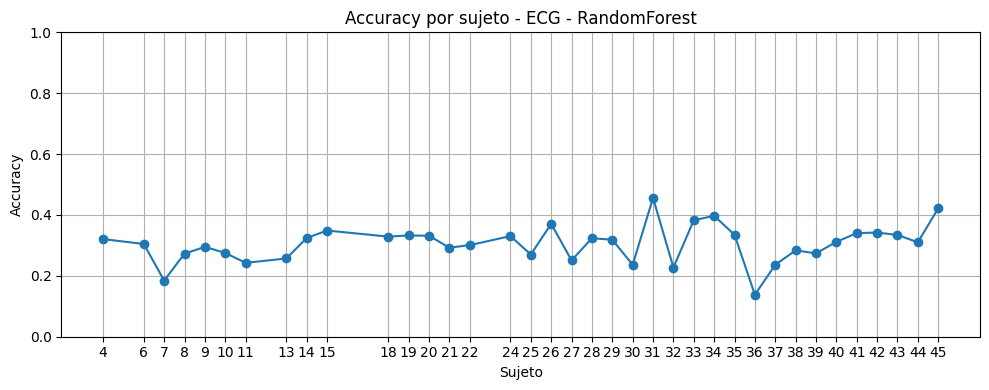

ECG - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.304109  ECG - RandomForest
1  Precision  0.301162  ECG - RandomForest
2     Recall  0.304109  ECG - RandomForest
3   F1 Score  0.301325  ECG - RandomForest
[ECG - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
[ECG - RandomForest] F1 Score (weighted): 0.3013
ECG - RandomForest - Confusion Matrix
[[26692 17755 16041 13066]
 [17917 11466  8912 10038]
 [11045  7301 17539  6990]
 [14120  9820 11622  7506]]


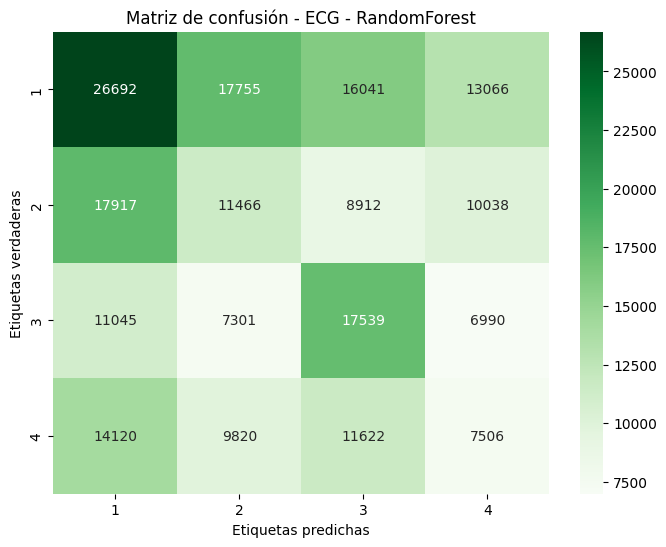

              precision    recall  f1-score   support

           1       0.38      0.36      0.37     73554
           2       0.25      0.24      0.24     48333
           3       0.32      0.41      0.36     42875
           4       0.20      0.17      0.19     43068

    accuracy                           0.30    207830
   macro avg       0.29      0.30      0.29    207830
weighted avg       0.30      0.30      0.30    207830

Training AdaBoost model for ECG using LOGO...
[ECG - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[ECG - AdaBoost] Fold 1/37 (Subject: 4)
[ECG - AdaBoost] Fold 2/37 (Subject: 6)
[ECG - AdaBoost] Fold 3/37 (Subject: 7)
[ECG - AdaBoost] Fold 4/37 (Subject: 8)
[ECG - AdaBoost] Fold 5/37 (Subject: 9)
[ECG - AdaBoost] Fold 6/37 (Subject: 10)
[ECG - AdaBoost] Fold 7/37 (Subject: 11)
[ECG - AdaBoost] Fold 8/37 (Subject: 13)
[ECG - AdaBoost] Fold 9/37 (Subject: 14)
[ECG - AdaBoost] Fold 10/37 (Subject: 15)
[E

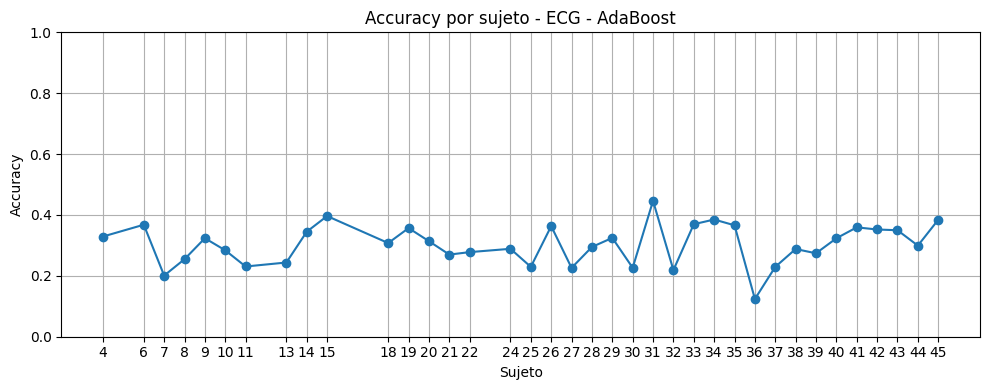

ECG - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.303715  ECG - AdaBoost
1  Precision  0.311583  ECG - AdaBoost
2     Recall  0.303715  ECG - AdaBoost
3   F1 Score  0.302465  ECG - AdaBoost
[ECG - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.5, 'n_estimators': 200}
[ECG - AdaBoost] F1 Score (weighted): 0.3025
ECG - AdaBoost - Confusion Matrix
[[21596 20433 16899 14626]
 [13803 13207 10685 10638]
 [ 8233  7709 19317  7616]
 [10394 10485 13188  9001]]


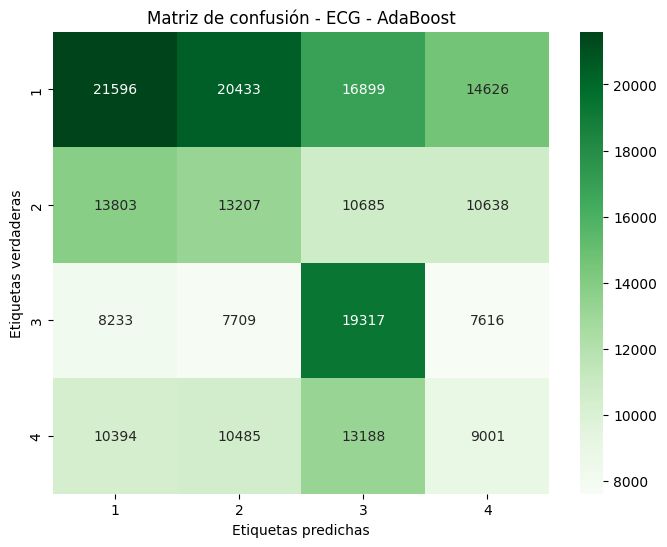

              precision    recall  f1-score   support

           1       0.40      0.29      0.34     73554
           2       0.25      0.27      0.26     48333
           3       0.32      0.45      0.38     42875
           4       0.21      0.21      0.21     43068

    accuracy                           0.30    207830
   macro avg       0.30      0.31      0.30    207830
weighted avg       0.31      0.30      0.30    207830

Training LDA model for ECG using LOGO...
[ECG - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[ECG - LDA] Fold 1/37 (Subject: 4)
[ECG - LDA] Fold 2/37 (Subject: 6)
[ECG - LDA] Fold 3/37 (Subject: 7)
[ECG - LDA] Fold 4/37 (Subject: 8)
[ECG - LDA] Fold 5/37 (Subject: 9)
[ECG - LDA] Fold 6/37 (Subject: 10)
[ECG - LDA] Fold 7/37 (Subject: 11)
[ECG - LDA] Fold 8/37 (Subject: 13)
[ECG - LDA] Fold 9/37 (Subject: 14)
[ECG - LDA] Fold 10/37 (Subject: 15)
[ECG - LDA] Fold 11/37 (Subject: 18)
[ECG - LDA] Fold 12/37 (Subj

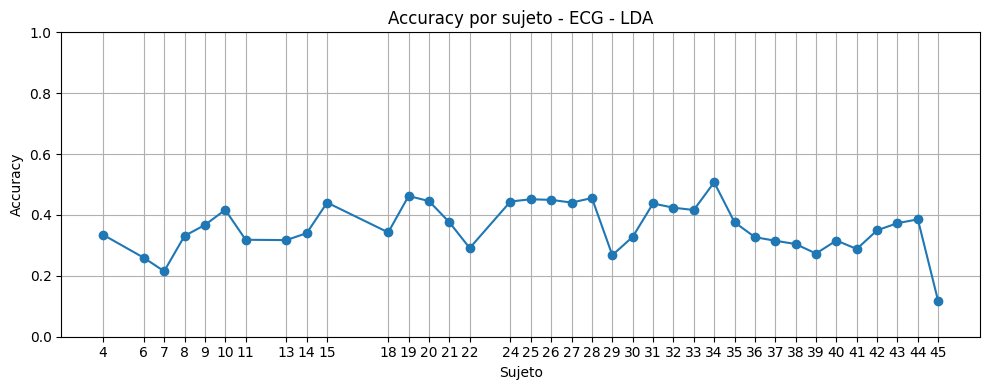

ECG - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.356003  ECG - LDA
1  Precision  0.284424  ECG - LDA
2     Recall  0.356003  ECG - LDA
3   F1 Score  0.278217  ECG - LDA
[ECG - LDA] Best Params: {'solver': 'svd'}
[ECG - LDA] F1 Score (weighted): 0.2782
ECG - LDA - Confusion Matrix
[[56927  3447 10056  3124]
 [38064  2146  4656  3467]
 [25395  2659 13485  1336]
 [30028  3696  7914  1430]]


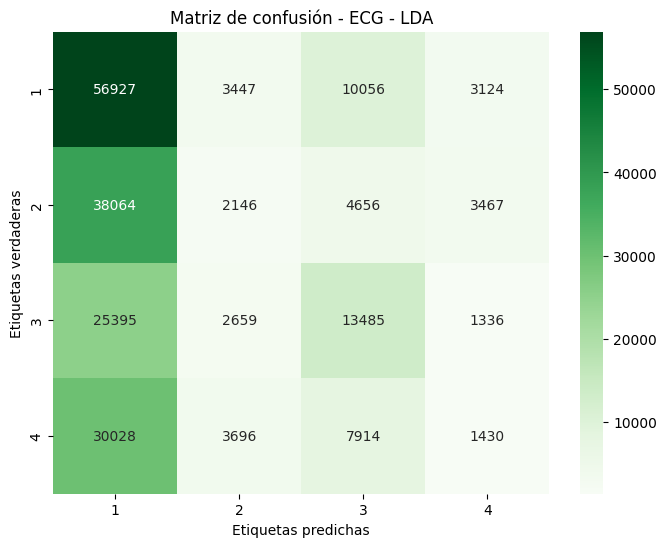

              precision    recall  f1-score   support

           1       0.38      0.77      0.51     73554
           2       0.18      0.04      0.07     48333
           3       0.37      0.31      0.34     42875
           4       0.15      0.03      0.05     43068

    accuracy                           0.36    207830
   macro avg       0.27      0.29      0.24    207830
weighted avg       0.28      0.36      0.28    207830

Training KNN model for ECG using LOGO...
[ECG - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[ECG - KNN] Fold 1/37 (Subject: 4)
[ECG - KNN] Fold 2/37 (Subject: 6)
[ECG - KNN] Fold 3/37 (Subject: 7)
[ECG - KNN] Fold 4/37 (Subject: 8)
[ECG - KNN] Fold 5/37 (Subject: 9)
[ECG - KNN] Fold 6/37 (Subject: 10)
[ECG - KNN] Fold 7/37 (Subject: 11)
[ECG - KNN] Fold 8/37 (Subject: 13)
[ECG - KNN] Fold 9/37 (Subject: 14)
[ECG - KNN] Fold 10/37 (Subject: 15)
[ECG - KNN] Fold 11/37 (Subject: 18)
[ECG - KNN] Fold 12/37 (Sub

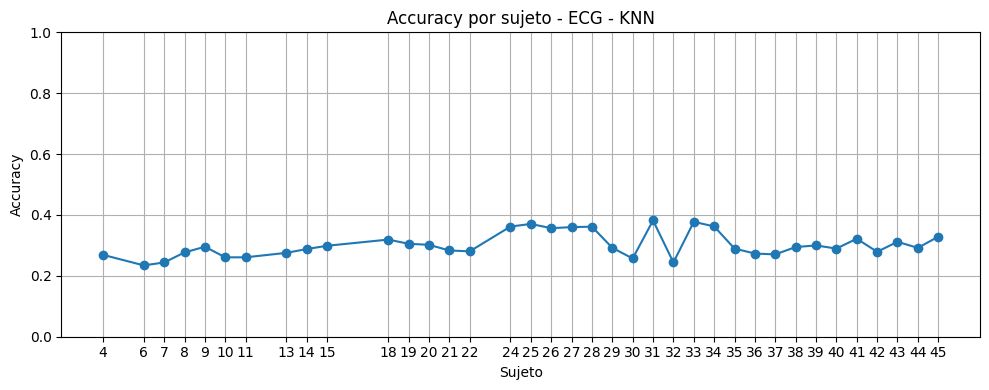

ECG - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.298359  ECG - KNN
1  Precision  0.284187  ECG - KNN
2     Recall  0.298359  ECG - KNN
3   F1 Score  0.287848  ECG - KNN
[ECG - KNN] Best Params: {'n_neighbors': 5, 'weights': 'uniform'}
[ECG - KNN] F1 Score (weighted): 0.2878
ECG - KNN - Confusion Matrix
[[34138 16571 12088 10757]
 [22672 10607  7479  7575]
 [17305  8163 11508  5899]
 [19707  9611  7995  5755]]


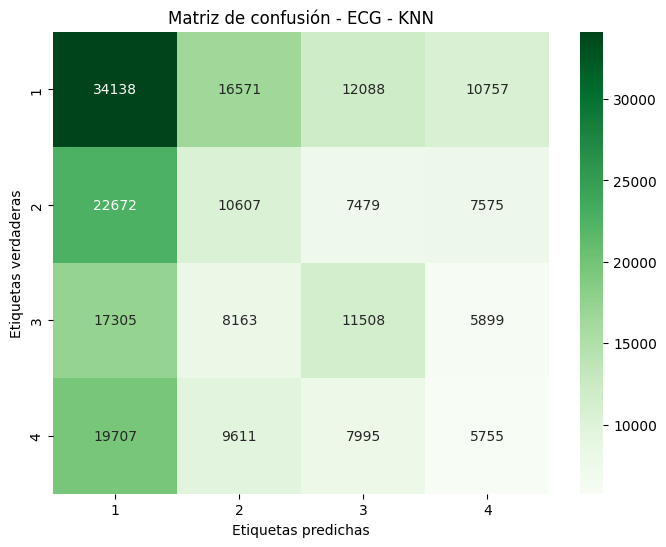

Training by signal:  25%|██▌       | 1/4 [14:25:15<43:15:46, 51915.66s/it]

              precision    recall  f1-score   support

           1       0.36      0.46      0.41     73554
           2       0.24      0.22      0.23     48333
           3       0.29      0.27      0.28     42875
           4       0.19      0.13      0.16     43068

    accuracy                           0.30    207830
   macro avg       0.27      0.27      0.27    207830
weighted avg       0.28      0.30      0.29    207830

Training DecisionTree model for PPG using LOGO...
[PPG - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[PPG - DecisionTree] Fold 1/37 (Subject: 4)
[PPG - DecisionTree] Fold 2/37 (Subject: 6)
[PPG - DecisionTree] Fold 3/37 (Subject: 7)
[PPG - DecisionTree] Fold 4/37 (Subject: 8)
[PPG - DecisionTree] Fold 5/37 (Subject: 9)
[PPG - DecisionTree] Fold 6/37 (Subject: 10)
[PPG - DecisionTree] Fold 7/37 (Subject: 11)
[PPG - DecisionTree] Fold 8/37 (Subject: 13)
[PPG - DecisionTree] Fold 9/37 (Subject: 14)

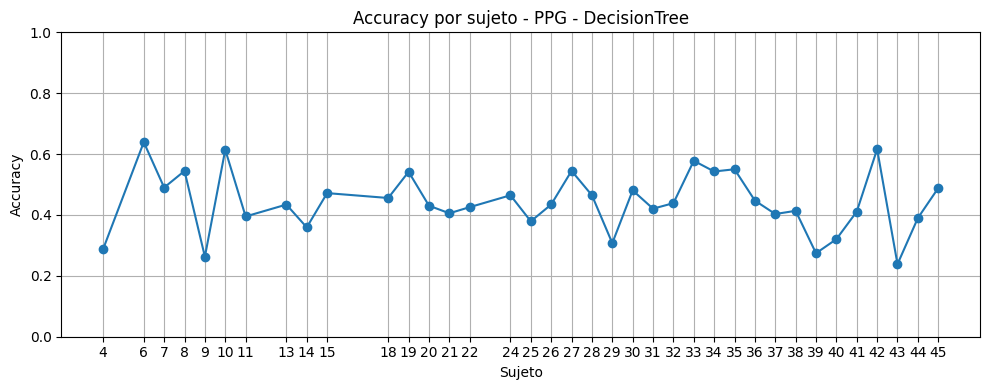

PPG - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.440004  PPG - DecisionTree
1  Precision  0.436164  PPG - DecisionTree
2     Recall  0.440004  PPG - DecisionTree
3   F1 Score  0.430679  PPG - DecisionTree
[PPG - DecisionTree] Best Params: {'criterion': 'entropy', 'max_depth': 10, 'max_leaf_nodes': 30, 'min_samples_split': 2}
[PPG - DecisionTree] F1 Score (weighted): 0.4307
PPG - DecisionTree - Confusion Matrix
[[45089  8020  6052 14393]
 [20596  9452  4905 13380]
 [ 6176  4604 19892 12203]
 [10708  4631 10716 17013]]


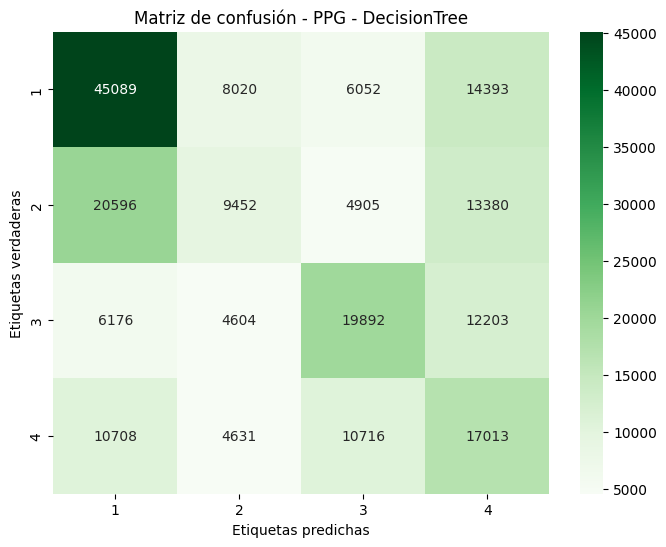

              precision    recall  f1-score   support

           1       0.55      0.61      0.58     73554
           2       0.35      0.20      0.25     48333
           3       0.48      0.46      0.47     42875
           4       0.30      0.40      0.34     43068

    accuracy                           0.44    207830
   macro avg       0.42      0.42      0.41    207830
weighted avg       0.44      0.44      0.43    207830

Training RandomForest model for PPG using LOGO...
[PPG - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[PPG - RandomForest] Fold 1/37 (Subject: 4)
[PPG - RandomForest] Fold 2/37 (Subject: 6)
[PPG - RandomForest] Fold 3/37 (Subject: 7)
[PPG - RandomForest] Fold 4/37 (Subject: 8)
[PPG - RandomForest] Fold 5/37 (Subject: 9)
[PPG - RandomForest] Fold 6/37 (Subject: 10)
[PPG - RandomForest] Fold 7/37 (Subject: 11)
[PPG - RandomForest] Fold 8/37 (Subject: 13)
[PPG - RandomForest] Fold 9/37 (Subject: 14)


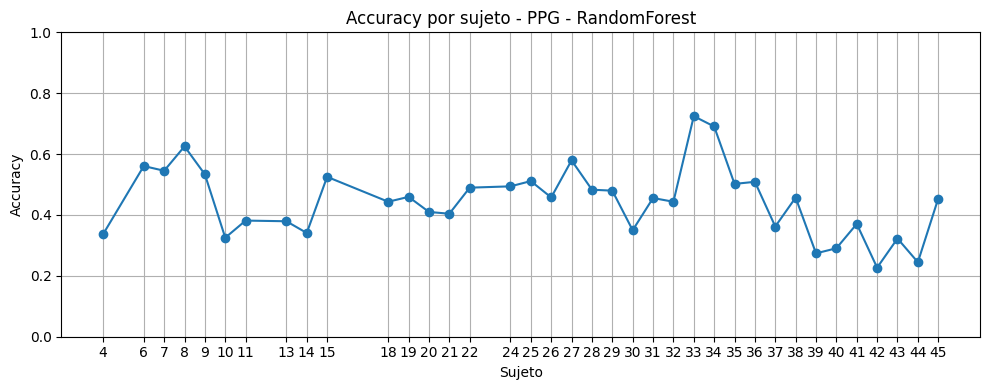

PPG - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.437439  PPG - RandomForest
1  Precision  0.427925  PPG - RandomForest
2     Recall  0.437439  PPG - RandomForest
3   F1 Score  0.429990  PPG - RandomForest
[PPG - RandomForest] Best Params: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 20, 'n_estimators': 100}
[PPG - RandomForest] F1 Score (weighted): 0.4300
PPG - RandomForest - Confusion Matrix
[[42400 13391  7954  9809]
 [17878 14497  7944  8014]
 [ 4955  4961 24118  8841]
 [10626  7301 15243  9898]]


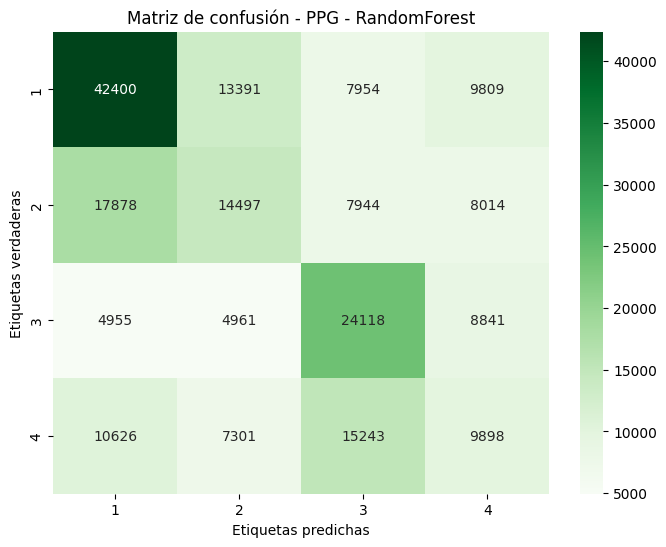

              precision    recall  f1-score   support

           1       0.56      0.58      0.57     73554
           2       0.36      0.30      0.33     48333
           3       0.44      0.56      0.49     42875
           4       0.27      0.23      0.25     43068

    accuracy                           0.44    207830
   macro avg       0.41      0.42      0.41    207830
weighted avg       0.43      0.44      0.43    207830

Training AdaBoost model for PPG using LOGO...
[PPG - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[PPG - AdaBoost] Fold 1/37 (Subject: 4)
[PPG - AdaBoost] Fold 2/37 (Subject: 6)
[PPG - AdaBoost] Fold 3/37 (Subject: 7)
[PPG - AdaBoost] Fold 4/37 (Subject: 8)
[PPG - AdaBoost] Fold 5/37 (Subject: 9)
[PPG - AdaBoost] Fold 6/37 (Subject: 10)
[PPG - AdaBoost] Fold 7/37 (Subject: 11)
[PPG - AdaBoost] Fold 8/37 (Subject: 13)
[PPG - AdaBoost] Fold 9/37 (Subject: 14)
[PPG - AdaBoost] Fold 10/37 (Subject: 15)
[P

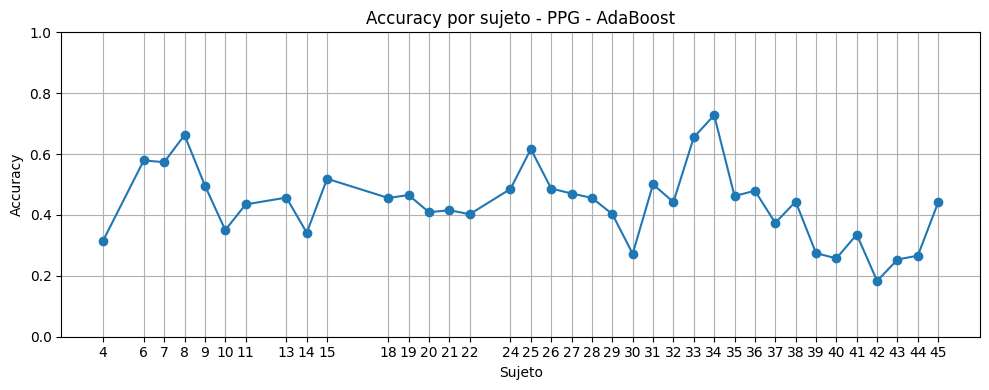

PPG - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.429524  PPG - AdaBoost
1  Precision  0.426527  PPG - AdaBoost
2     Recall  0.429524  PPG - AdaBoost
3   F1 Score  0.425917  PPG - AdaBoost
[PPG - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.1, 'n_estimators': 300}
[PPG - AdaBoost] F1 Score (weighted): 0.4259
PPG - AdaBoost - Confusion Matrix
[[39249 14630  8522 11153]
 [16222 15188  8291  8632]
 [ 4508  6283 24490  7594]
 [ 9070  9854 13803 10341]]


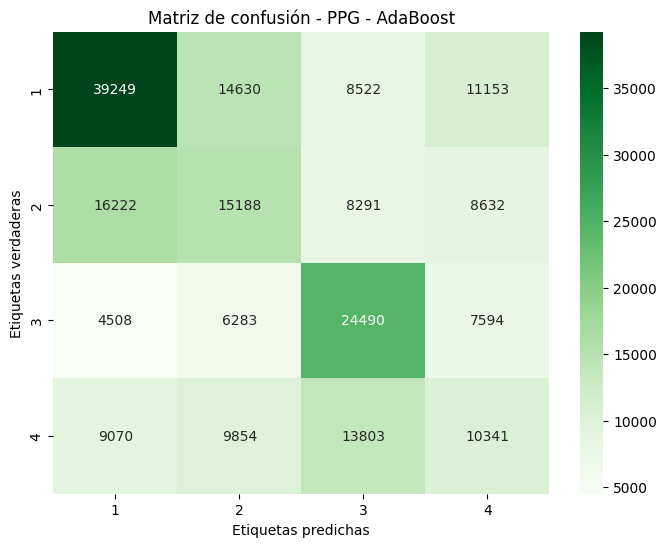

              precision    recall  f1-score   support

           1       0.57      0.53      0.55     73554
           2       0.33      0.31      0.32     48333
           3       0.44      0.57      0.50     42875
           4       0.27      0.24      0.26     43068

    accuracy                           0.43    207830
   macro avg       0.40      0.41      0.41    207830
weighted avg       0.43      0.43      0.43    207830

Training LDA model for PPG using LOGO...
[PPG - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[PPG - LDA] Fold 1/37 (Subject: 4)
[PPG - LDA] Fold 2/37 (Subject: 6)
[PPG - LDA] Fold 3/37 (Subject: 7)
[PPG - LDA] Fold 4/37 (Subject: 8)
[PPG - LDA] Fold 5/37 (Subject: 9)
[PPG - LDA] Fold 6/37 (Subject: 10)
[PPG - LDA] Fold 7/37 (Subject: 11)
[PPG - LDA] Fold 8/37 (Subject: 13)
[PPG - LDA] Fold 9/37 (Subject: 14)
[PPG - LDA] Fold 10/37 (Subject: 15)
[PPG - LDA] Fold 11/37 (Subject: 18)
[PPG - LDA] Fold 12/37 (Subj

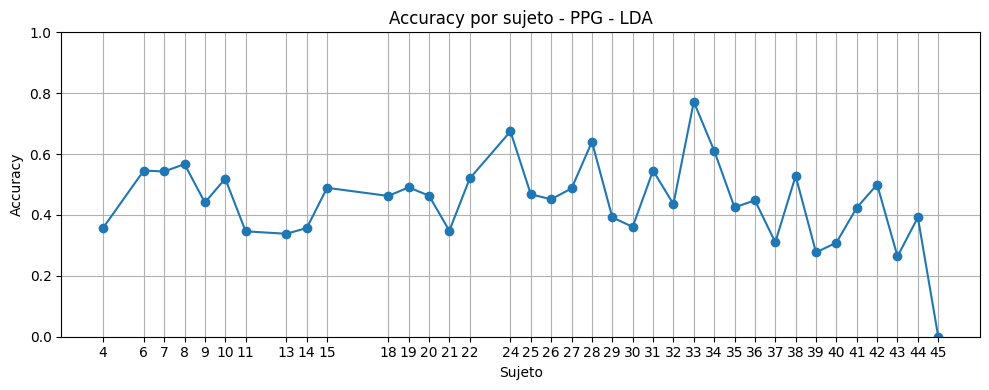

PPG - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.441390  PPG - LDA
1  Precision  0.416987  PPG - LDA
2     Recall  0.441390  PPG - LDA
3   F1 Score  0.426068  PPG - LDA
[PPG - LDA] Best Params: {'solver': 'svd'}
[PPG - LDA] F1 Score (weighted): 0.4261
PPG - LDA - Confusion Matrix
[[49297 12017  5841  6399]
 [20996 14122  5305  7910]
 [ 4680  7855 21576  8764]
 [12409 10935 12985  6739]]


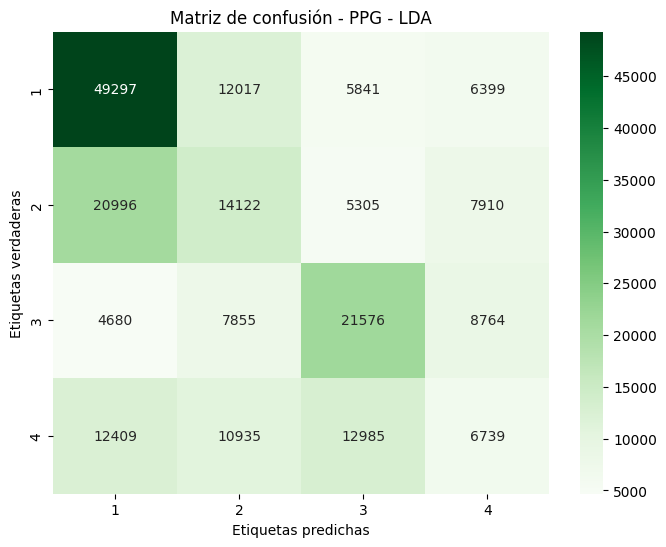

              precision    recall  f1-score   support

           1       0.56      0.67      0.61     73554
           2       0.31      0.29      0.30     48333
           3       0.47      0.50      0.49     42875
           4       0.23      0.16      0.18     43068

    accuracy                           0.44    207830
   macro avg       0.39      0.41      0.40    207830
weighted avg       0.42      0.44      0.43    207830

Training KNN model for PPG using LOGO...
[PPG - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[PPG - KNN] Fold 1/37 (Subject: 4)
[PPG - KNN] Fold 2/37 (Subject: 6)
[PPG - KNN] Fold 3/37 (Subject: 7)
[PPG - KNN] Fold 4/37 (Subject: 8)
[PPG - KNN] Fold 5/37 (Subject: 9)
[PPG - KNN] Fold 6/37 (Subject: 10)
[PPG - KNN] Fold 7/37 (Subject: 11)
[PPG - KNN] Fold 8/37 (Subject: 13)
[PPG - KNN] Fold 9/37 (Subject: 14)
[PPG - KNN] Fold 10/37 (Subject: 15)
[PPG - KNN] Fold 11/37 (Subject: 18)
[PPG - KNN] Fold 12/37 (Sub

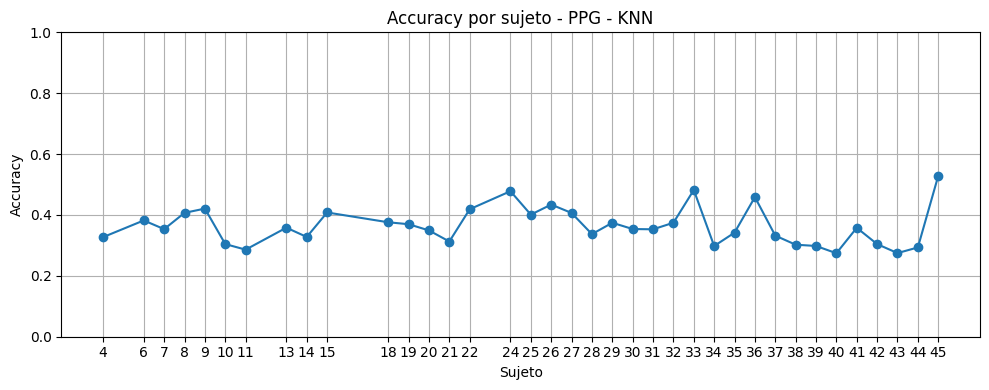

PPG - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.359356  PPG - KNN
1  Precision  0.352629  PPG - KNN
2     Recall  0.359356  PPG - KNN
3   F1 Score  0.354834  PPG - KNN
[PPG - KNN] Best Params: {'n_neighbors': 9, 'weights': 'uniform'}
[PPG - KNN] F1 Score (weighted): 0.3548
PPG - KNN - Confusion Matrix
[[36042 16195 10459 10858]
 [18820 11657  9456  8400]
 [ 8221  7380 18507  8767]
 [12110  9085 13394  8479]]


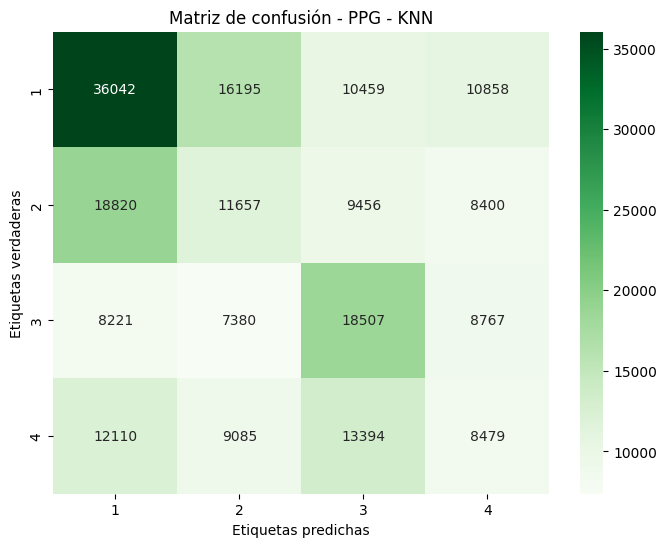

Training by signal:  50%|█████     | 2/4 [30:13:01<30:27:35, 54827.57s/it]

              precision    recall  f1-score   support

           1       0.48      0.49      0.48     73554
           2       0.26      0.24      0.25     48333
           3       0.36      0.43      0.39     42875
           4       0.23      0.20      0.21     43068

    accuracy                           0.36    207830
   macro avg       0.33      0.34      0.34    207830
weighted avg       0.35      0.36      0.35    207830

Training DecisionTree model for EDA using LOGO...
[EDA - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[EDA - DecisionTree] Fold 1/37 (Subject: 4)
[EDA - DecisionTree] Fold 2/37 (Subject: 6)
[EDA - DecisionTree] Fold 3/37 (Subject: 7)
[EDA - DecisionTree] Fold 4/37 (Subject: 8)
[EDA - DecisionTree] Fold 5/37 (Subject: 9)
[EDA - DecisionTree] Fold 6/37 (Subject: 10)
[EDA - DecisionTree] Fold 7/37 (Subject: 11)
[EDA - DecisionTree] Fold 8/37 (Subject: 13)
[EDA - DecisionTree] Fold 9/37 (Subject: 14)

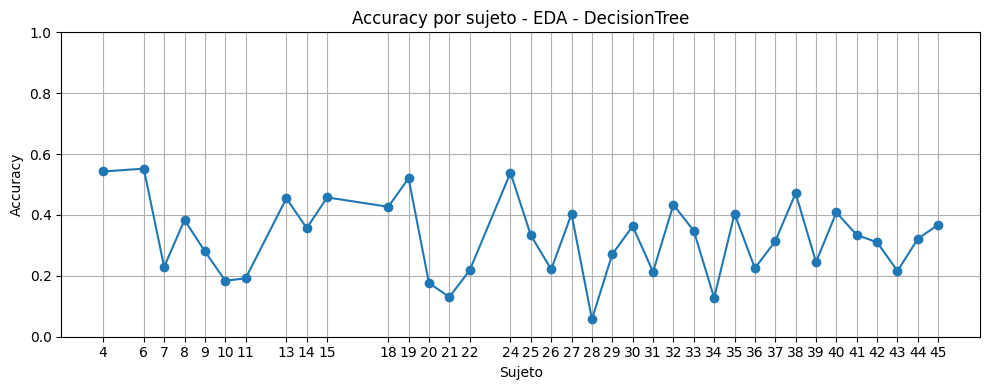

EDA - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.328071  EDA - DecisionTree
1  Precision  0.328531  EDA - DecisionTree
2     Recall  0.328071  EDA - DecisionTree
3   F1 Score  0.326896  EDA - DecisionTree
[EDA - DecisionTree] Best Params: {'criterion': 'entropy', 'max_depth': 10, 'max_leaf_nodes': 40, 'min_samples_split': 2}
[EDA - DecisionTree] F1 Score (weighted): 0.3269
EDA - DecisionTree - Confusion Matrix
[[34036 11674 16452 11392]
 [15070 10721 11287 11255]
 [10362  9760 15380  7373]
 [11226 11626 12170  8046]]


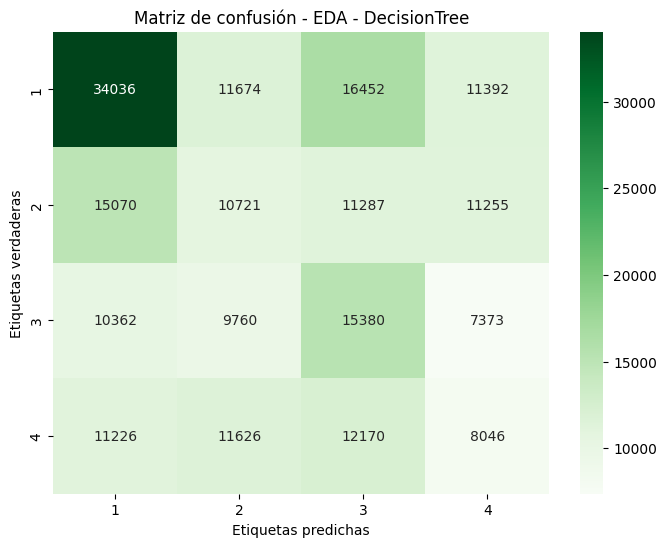

              precision    recall  f1-score   support

           1       0.48      0.46      0.47     73554
           2       0.24      0.22      0.23     48333
           3       0.28      0.36      0.31     42875
           4       0.21      0.19      0.20     43068

    accuracy                           0.33    207830
   macro avg       0.30      0.31      0.30    207830
weighted avg       0.33      0.33      0.33    207830

Training RandomForest model for EDA using LOGO...
[EDA - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[EDA - RandomForest] Fold 1/37 (Subject: 4)
[EDA - RandomForest] Fold 2/37 (Subject: 6)
[EDA - RandomForest] Fold 3/37 (Subject: 7)
[EDA - RandomForest] Fold 4/37 (Subject: 8)
[EDA - RandomForest] Fold 5/37 (Subject: 9)
[EDA - RandomForest] Fold 6/37 (Subject: 10)
[EDA - RandomForest] Fold 7/37 (Subject: 11)
[EDA - RandomForest] Fold 8/37 (Subject: 13)
[EDA - RandomForest] Fold 9/37 (Subject: 14)


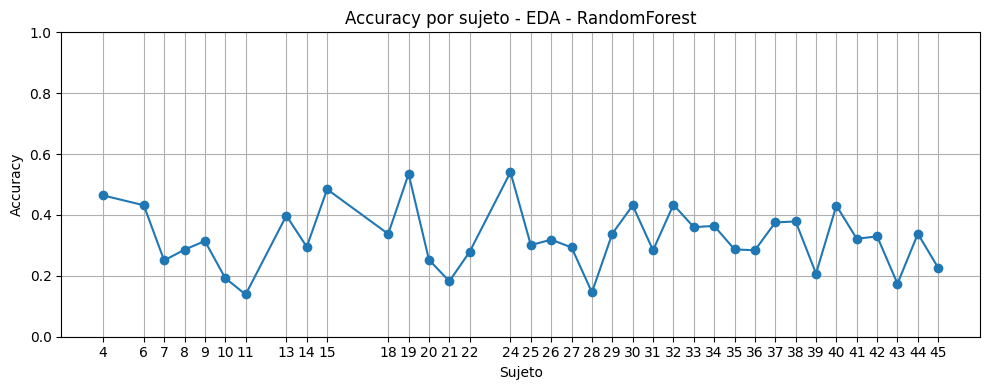

EDA - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.324963  EDA - RandomForest
1  Precision  0.317518  EDA - RandomForest
2     Recall  0.324963  EDA - RandomForest
3   F1 Score  0.320348  EDA - RandomForest
[EDA - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 20, 'n_estimators': 200}
[EDA - RandomForest] F1 Score (weighted): 0.3203
EDA - RandomForest - Confusion Matrix
[[35637 14518 12400 10999]
 [17679 10977 10958  8719]
 [13048  9998 12742  7087]
 [13919 10855 10113  8181]]


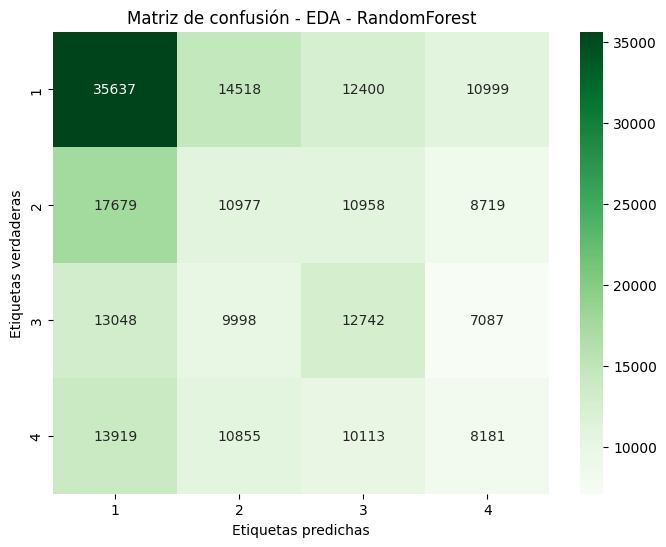

              precision    recall  f1-score   support

           1       0.44      0.48      0.46     73554
           2       0.24      0.23      0.23     48333
           3       0.28      0.30      0.29     42875
           4       0.23      0.19      0.21     43068

    accuracy                           0.32    207830
   macro avg       0.30      0.30      0.30    207830
weighted avg       0.32      0.32      0.32    207830

Training AdaBoost model for EDA using LOGO...
[EDA - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[EDA - AdaBoost] Fold 1/37 (Subject: 4)
[EDA - AdaBoost] Fold 2/37 (Subject: 6)
[EDA - AdaBoost] Fold 3/37 (Subject: 7)
[EDA - AdaBoost] Fold 4/37 (Subject: 8)
[EDA - AdaBoost] Fold 5/37 (Subject: 9)
[EDA - AdaBoost] Fold 6/37 (Subject: 10)
[EDA - AdaBoost] Fold 7/37 (Subject: 11)
[EDA - AdaBoost] Fold 8/37 (Subject: 13)
[EDA - AdaBoost] Fold 9/37 (Subject: 14)
[EDA - AdaBoost] Fold 10/37 (Subject: 15)
[E

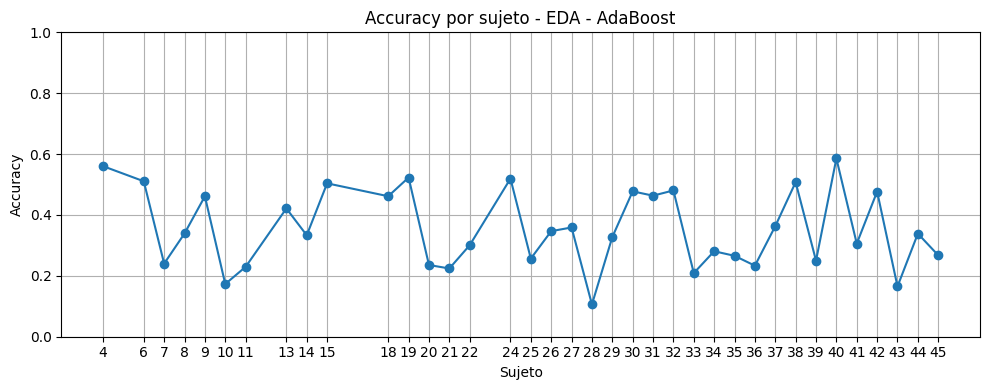

EDA - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.357023  EDA - AdaBoost
1  Precision  0.366639  EDA - AdaBoost
2     Recall  0.357023  EDA - AdaBoost
3   F1 Score  0.358449  EDA - AdaBoost
[EDA - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=1), 'learning_rate': 1, 'n_estimators': 300}
[EDA - AdaBoost] F1 Score (weighted): 0.3584
EDA - AdaBoost - Confusion Matrix
[[33691 11506 15772 12585]
 [11382 11280 13509 12162]
 [ 8185  8343 18076  8271]
 [10806  8807 12302 11153]]


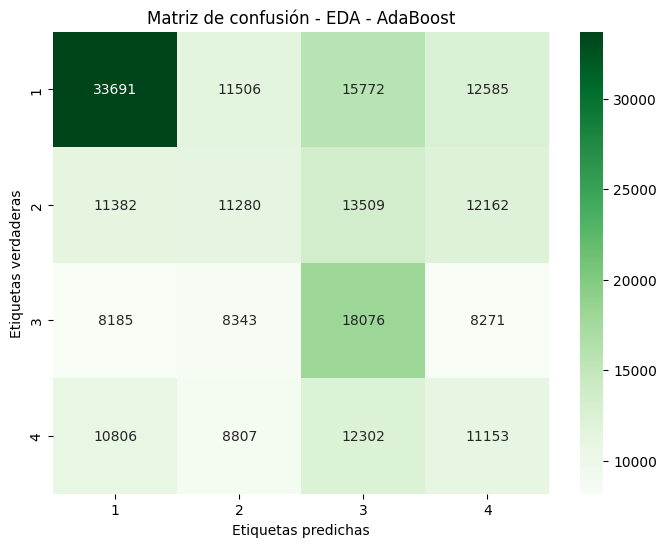

              precision    recall  f1-score   support

           1       0.53      0.46      0.49     73554
           2       0.28      0.23      0.26     48333
           3       0.30      0.42      0.35     42875
           4       0.25      0.26      0.26     43068

    accuracy                           0.36    207830
   macro avg       0.34      0.34      0.34    207830
weighted avg       0.37      0.36      0.36    207830

Training LDA model for EDA using LOGO...
[EDA - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[EDA - LDA] Fold 1/37 (Subject: 4)
[EDA - LDA] Fold 2/37 (Subject: 6)
[EDA - LDA] Fold 3/37 (Subject: 7)
[EDA - LDA] Fold 4/37 (Subject: 8)
[EDA - LDA] Fold 5/37 (Subject: 9)
[EDA - LDA] Fold 6/37 (Subject: 10)
[EDA - LDA] Fold 7/37 (Subject: 11)
[EDA - LDA] Fold 8/37 (Subject: 13)
[EDA - LDA] Fold 9/37 (Subject: 14)
[EDA - LDA] Fold 10/37 (Subject: 15)
[EDA - LDA] Fold 11/37 (Subject: 18)
[EDA - LDA] Fold 12/37 (Subj

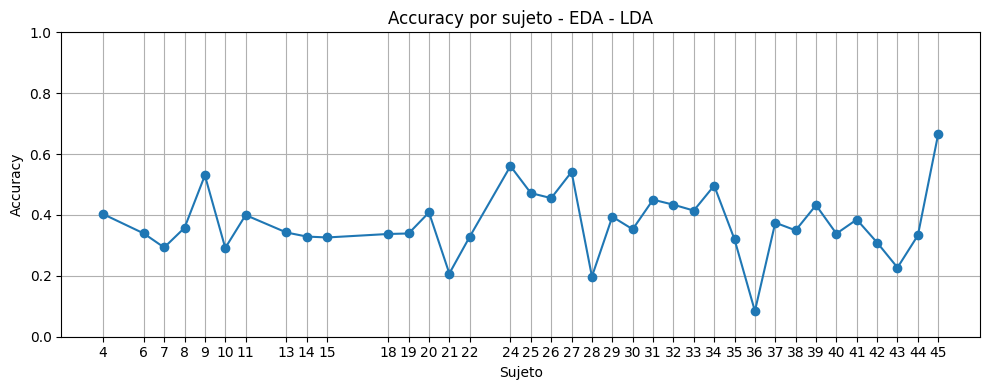

EDA - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.368147  EDA - LDA
1  Precision  0.294895  EDA - LDA
2     Recall  0.368147  EDA - LDA
3   F1 Score  0.299522  EDA - LDA
[EDA - LDA] Best Params: {'solver': 'svd'}
[EDA - LDA] F1 Score (weighted): 0.2995
EDA - LDA - Confusion Matrix
[[58920  6481  5531  2622]
 [28456  7983  7633  4261]
 [26627  6771  8718   759]
 [26895  8989  6293   891]]


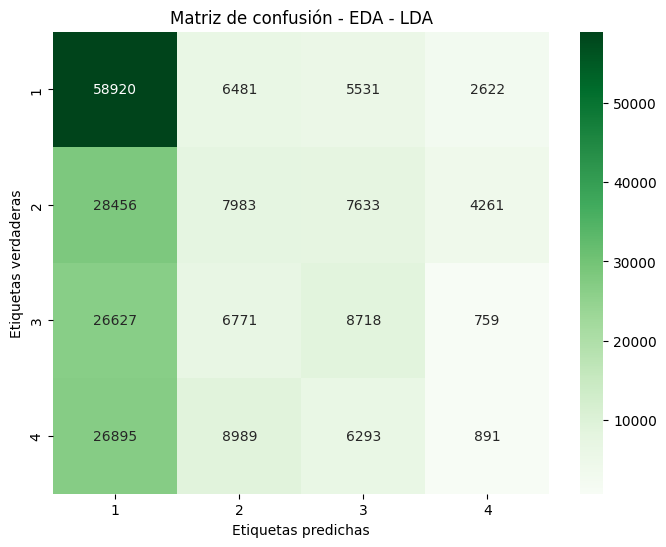

              precision    recall  f1-score   support

           1       0.42      0.80      0.55     73554
           2       0.26      0.17      0.20     48333
           3       0.31      0.20      0.25     42875
           4       0.10      0.02      0.03     43068

    accuracy                           0.37    207830
   macro avg       0.27      0.30      0.26    207830
weighted avg       0.29      0.37      0.30    207830

Training KNN model for EDA using LOGO...
[EDA - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[EDA - KNN] Fold 1/37 (Subject: 4)
[EDA - KNN] Fold 2/37 (Subject: 6)
[EDA - KNN] Fold 3/37 (Subject: 7)
[EDA - KNN] Fold 4/37 (Subject: 8)
[EDA - KNN] Fold 5/37 (Subject: 9)
[EDA - KNN] Fold 6/37 (Subject: 10)
[EDA - KNN] Fold 7/37 (Subject: 11)
[EDA - KNN] Fold 8/37 (Subject: 13)
[EDA - KNN] Fold 9/37 (Subject: 14)
[EDA - KNN] Fold 10/37 (Subject: 15)
[EDA - KNN] Fold 11/37 (Subject: 18)
[EDA - KNN] Fold 12/37 (Sub

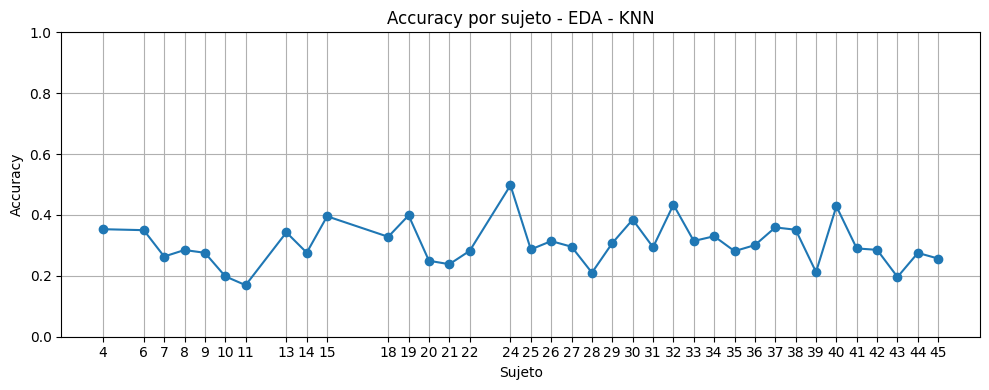

EDA - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.304600  EDA - KNN
1  Precision  0.297064  EDA - KNN
2     Recall  0.304600  EDA - KNN
3   F1 Score  0.300130  EDA - KNN
[EDA - KNN] Best Params: {'n_neighbors': 7, 'weights': 'distance'}
[EDA - KNN] F1 Score (weighted): 0.3001
EDA - KNN - Confusion Matrix
[[34117 15782 11610 12045]
 [18428 10956  9536  9413]
 [14622 10443  9762  8048]
 [14869 10824  8905  8470]]


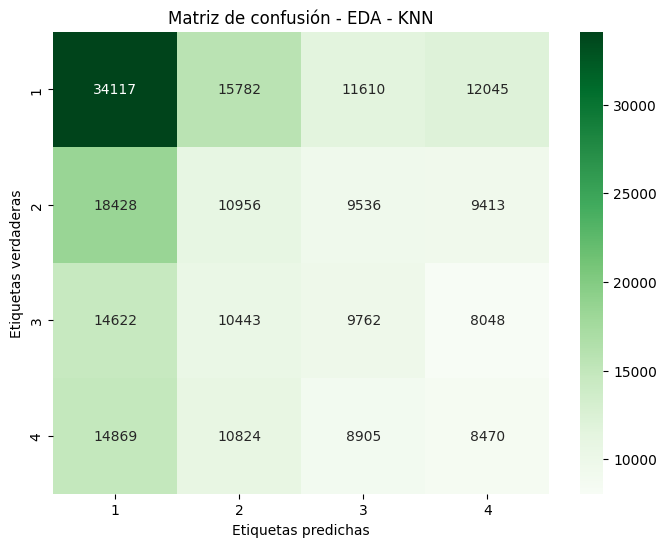

Training by signal:  75%|███████▌  | 3/4 [44:20:41<14:43:35, 53015.67s/it]

              precision    recall  f1-score   support

           1       0.42      0.46      0.44     73554
           2       0.23      0.23      0.23     48333
           3       0.25      0.23      0.24     42875
           4       0.22      0.20      0.21     43068

    accuracy                           0.30    207830
   macro avg       0.28      0.28      0.28    207830
weighted avg       0.30      0.30      0.30    207830

Training DecisionTree model for RESP using LOGO...
[RESP - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[RESP - DecisionTree] Fold 1/37 (Subject: 4)
[RESP - DecisionTree] Fold 2/37 (Subject: 6)
[RESP - DecisionTree] Fold 3/37 (Subject: 7)
[RESP - DecisionTree] Fold 4/37 (Subject: 8)
[RESP - DecisionTree] Fold 5/37 (Subject: 9)
[RESP - DecisionTree] Fold 6/37 (Subject: 10)
[RESP - DecisionTree] Fold 7/37 (Subject: 11)
[RESP - DecisionTree] Fold 8/37 (Subject: 13)
[RESP - DecisionTree] Fold 9/37 (S

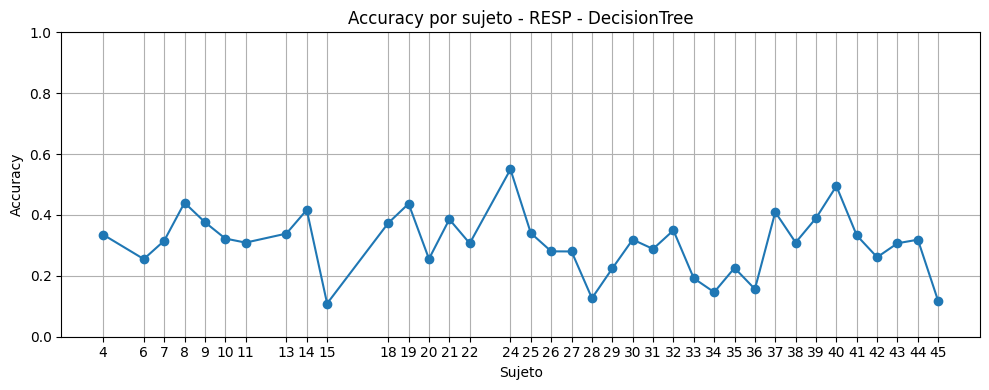

RESP - DecisionTree Metrics
     Métrica     Valor                Etapa
0   Accuracy  0.311731  RESP - DecisionTree
1  Precision  0.321555  RESP - DecisionTree
2     Recall  0.311731  RESP - DecisionTree
3   F1 Score  0.309124  RESP - DecisionTree
[RESP - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 30, 'min_samples_split': 2}
[RESP - DecisionTree] F1 Score (weighted): 0.3091
RESP - DecisionTree - Confusion Matrix
[[24265 13931 21955 13403]
 [13275 10546 15573  8939]
 [ 9212  5780 20035  7848]
 [10994  8293 13840  9941]]


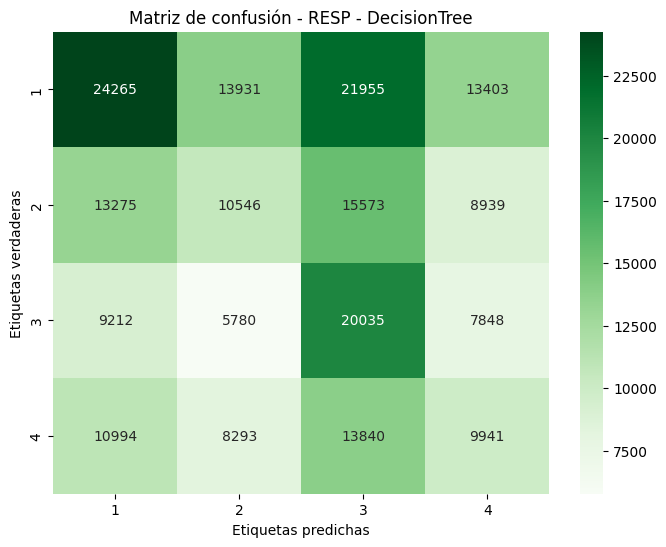

              precision    recall  f1-score   support

           1       0.42      0.33      0.37     73554
           2       0.27      0.22      0.24     48333
           3       0.28      0.47      0.35     42875
           4       0.25      0.23      0.24     43068

    accuracy                           0.31    207830
   macro avg       0.31      0.31      0.30    207830
weighted avg       0.32      0.31      0.31    207830

Training RandomForest model for RESP using LOGO...
[RESP - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[RESP - RandomForest] Fold 1/37 (Subject: 4)
[RESP - RandomForest] Fold 2/37 (Subject: 6)
[RESP - RandomForest] Fold 3/37 (Subject: 7)
[RESP - RandomForest] Fold 4/37 (Subject: 8)
[RESP - RandomForest] Fold 5/37 (Subject: 9)
[RESP - RandomForest] Fold 6/37 (Subject: 10)
[RESP - RandomForest] Fold 7/37 (Subject: 11)
[RESP - RandomForest] Fold 8/37 (Subject: 13)
[RESP - RandomForest] Fold 9/37 (Su

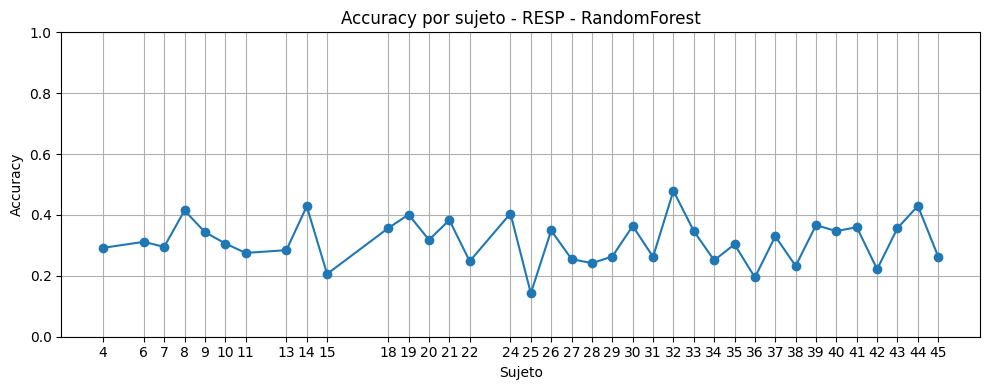

RESP - RandomForest Metrics
     Métrica     Valor                Etapa
0   Accuracy  0.316302  RESP - RandomForest
1  Precision  0.314893  RESP - RandomForest
2     Recall  0.316302  RESP - RandomForest
3   F1 Score  0.314136  RESP - RandomForest
[RESP - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200}
[RESP - RandomForest] F1 Score (weighted): 0.3141
RESP - RandomForest - Confusion Matrix
[[30172 13421 16026 13935]
 [16095 10435 11325 10478]
 [12241  7528 15737  7369]
 [14453  8296 10926  9393]]


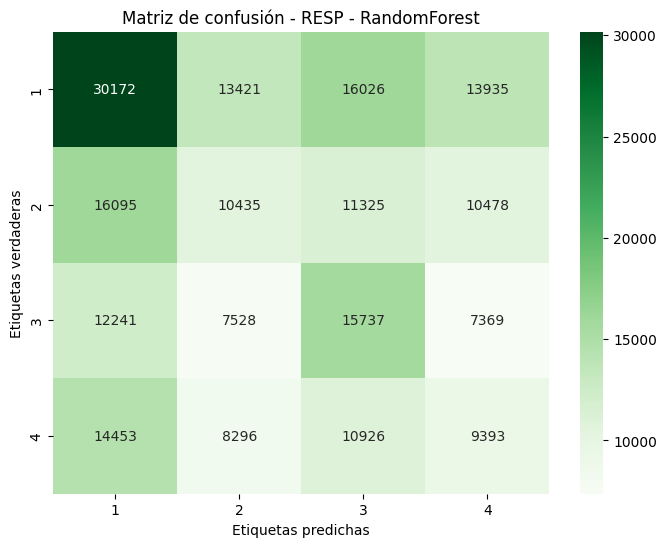

              precision    recall  f1-score   support

           1       0.41      0.41      0.41     73554
           2       0.26      0.22      0.24     48333
           3       0.29      0.37      0.32     42875
           4       0.23      0.22      0.22     43068

    accuracy                           0.32    207830
   macro avg       0.30      0.30      0.30    207830
weighted avg       0.31      0.32      0.31    207830

Training AdaBoost model for RESP using LOGO...
[RESP - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[RESP - AdaBoost] Fold 1/37 (Subject: 4)
[RESP - AdaBoost] Fold 2/37 (Subject: 6)
[RESP - AdaBoost] Fold 3/37 (Subject: 7)
[RESP - AdaBoost] Fold 4/37 (Subject: 8)
[RESP - AdaBoost] Fold 5/37 (Subject: 9)
[RESP - AdaBoost] Fold 6/37 (Subject: 10)
[RESP - AdaBoost] Fold 7/37 (Subject: 11)
[RESP - AdaBoost] Fold 8/37 (Subject: 13)
[RESP - AdaBoost] Fold 9/37 (Subject: 14)
[RESP - AdaBoost] Fold 10/37 (Sub

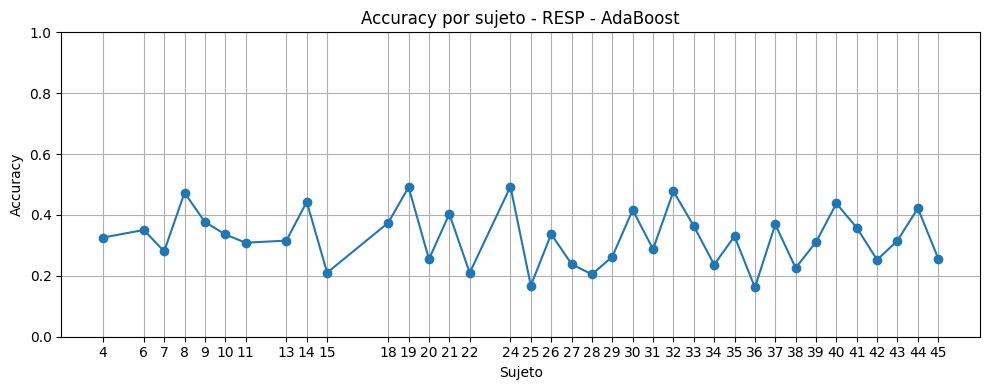

RESP - AdaBoost Metrics
     Métrica     Valor            Etapa
0   Accuracy  0.329183  RESP - AdaBoost
1  Precision  0.340489  RESP - AdaBoost
2     Recall  0.329183  RESP - AdaBoost
3   F1 Score  0.328716  RESP - AdaBoost
[RESP - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.1, 'n_estimators': 300}
[RESP - AdaBoost] F1 Score (weighted): 0.3287
RESP - AdaBoost - Confusion Matrix
[[28040 12697 19884 12933]
 [12786 10693 14054 10800]
 [ 8023  7433 19385  8034]
 [10962  7714 14096 10296]]


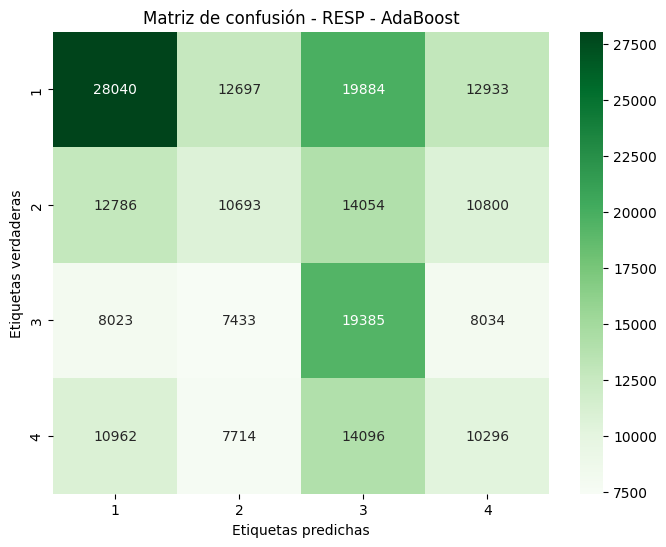

              precision    recall  f1-score   support

           1       0.47      0.38      0.42     73554
           2       0.28      0.22      0.25     48333
           3       0.29      0.45      0.35     42875
           4       0.24      0.24      0.24     43068

    accuracy                           0.33    207830
   macro avg       0.32      0.32      0.32    207830
weighted avg       0.34      0.33      0.33    207830

Training LDA model for RESP using LOGO...
[RESP - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[RESP - LDA] Fold 1/37 (Subject: 4)
[RESP - LDA] Fold 2/37 (Subject: 6)
[RESP - LDA] Fold 3/37 (Subject: 7)
[RESP - LDA] Fold 4/37 (Subject: 8)
[RESP - LDA] Fold 5/37 (Subject: 9)
[RESP - LDA] Fold 6/37 (Subject: 10)
[RESP - LDA] Fold 7/37 (Subject: 11)
[RESP - LDA] Fold 8/37 (Subject: 13)
[RESP - LDA] Fold 9/37 (Subject: 14)
[RESP - LDA] Fold 10/37 (Subject: 15)
[RESP - LDA] Fold 11/37 (Subject: 18)
[RESP - LDA] Fo

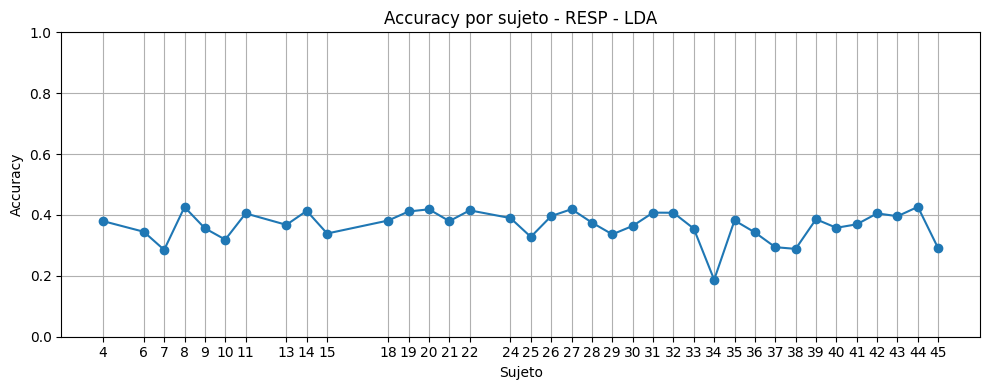

RESP - LDA Metrics
     Métrica     Valor       Etapa
0   Accuracy  0.367228  RESP - LDA
1  Precision  0.278173  RESP - LDA
2     Recall  0.367228  RESP - LDA
3   F1 Score  0.267520  RESP - LDA
[RESP - LDA] Best Params: {'solver': 'svd'}
[RESP - LDA] F1 Score (weighted): 0.2675
RESP - LDA - Confusion Matrix
[[60531   202 10469  2352]
 [39139    82  7662  1450]
 [26712   258 14137  1768]
 [32028   159  9310  1571]]


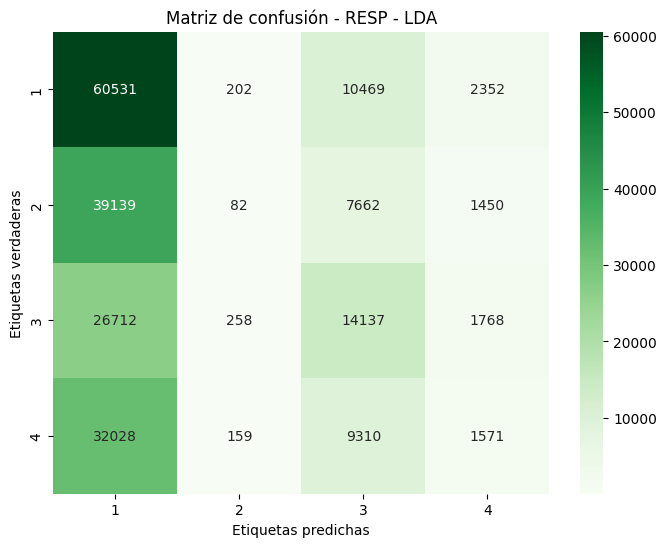

              precision    recall  f1-score   support

           1       0.38      0.82      0.52     73554
           2       0.12      0.00      0.00     48333
           3       0.34      0.33      0.33     42875
           4       0.22      0.04      0.06     43068

    accuracy                           0.37    207830
   macro avg       0.26      0.30      0.23    207830
weighted avg       0.28      0.37      0.27    207830

Training KNN model for RESP using LOGO...
[RESP - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits
[RESP - KNN] Fold 1/37 (Subject: 4)
[RESP - KNN] Fold 2/37 (Subject: 6)
[RESP - KNN] Fold 3/37 (Subject: 7)
[RESP - KNN] Fold 4/37 (Subject: 8)
[RESP - KNN] Fold 5/37 (Subject: 9)
[RESP - KNN] Fold 6/37 (Subject: 10)
[RESP - KNN] Fold 7/37 (Subject: 11)
[RESP - KNN] Fold 8/37 (Subject: 13)
[RESP - KNN] Fold 9/37 (Subject: 14)
[RESP - KNN] Fold 10/37 (Subject: 15)
[RESP - KNN] Fold 11/37 (Subject: 18)
[RESP - KNN] F

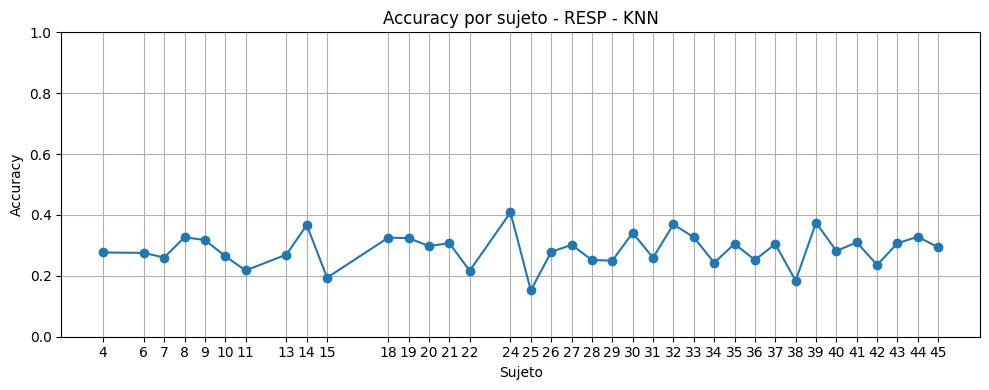

RESP - KNN Metrics
     Métrica     Valor       Etapa
0   Accuracy  0.286383  RESP - KNN
1  Precision  0.290070  RESP - KNN
2     Recall  0.286383  RESP - KNN
3   F1 Score  0.287970  RESP - KNN
[RESP - KNN] Best Params: {'n_neighbors': 7, 'weights': 'distance'}
[RESP - KNN] F1 Score (weighted): 0.2880
RESP - KNN - Confusion Matrix
[[26974 17243 14886 14451]
 [15294 11673 10161 11205]
 [12573 10013 11563  8726]
 [13648 10473  9638  9309]]


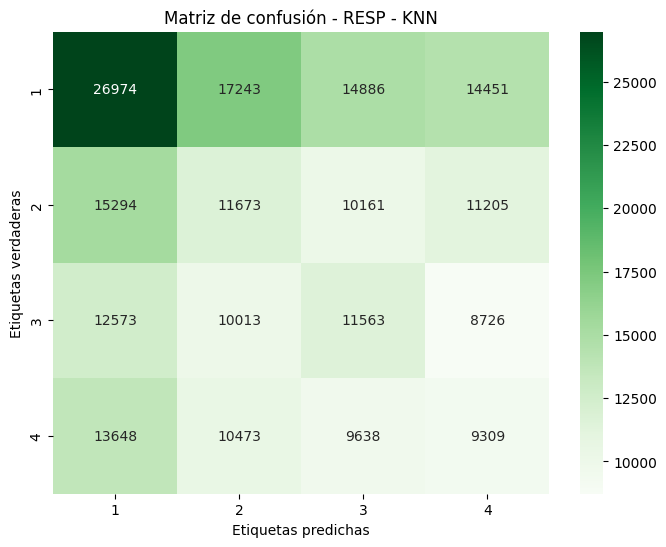

Training by signal: 100%|██████████| 4/4 [55:57:09<00:00, 50357.47s/it]   


              precision    recall  f1-score   support

           1       0.39      0.37      0.38     73554
           2       0.24      0.24      0.24     48333
           3       0.25      0.27      0.26     42875
           4       0.21      0.22      0.21     43068

    accuracy                           0.29    207830
   macro avg       0.27      0.27      0.27    207830
weighted avg       0.29      0.29      0.29    207830



Training with ALL signals:   0%|          | 0/5 [00:00<?, ?it/s]

Training DecisionTree model for ALL signals using LOGO...
[ALL - DecisionTree] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 120 candidates, totalling 4440 fits
[ALL - DecisionTree] Fold 1/37 (Subject: 4)
[ALL - DecisionTree] Fold 2/37 (Subject: 6)
[ALL - DecisionTree] Fold 3/37 (Subject: 7)
[ALL - DecisionTree] Fold 4/37 (Subject: 8)
[ALL - DecisionTree] Fold 5/37 (Subject: 9)
[ALL - DecisionTree] Fold 6/37 (Subject: 10)
[ALL - DecisionTree] Fold 7/37 (Subject: 11)
[ALL - DecisionTree] Fold 8/37 (Subject: 13)
[ALL - DecisionTree] Fold 9/37 (Subject: 14)
[ALL - DecisionTree] Fold 10/37 (Subject: 15)
[ALL - DecisionTree] Fold 11/37 (Subject: 18)
[ALL - DecisionTree] Fold 12/37 (Subject: 19)
[ALL - DecisionTree] Fold 13/37 (Subject: 20)
[ALL - DecisionTree] Fold 14/37 (Subject: 21)
[ALL - DecisionTree] Fold 15/37 (Subject: 22)
[ALL - DecisionTree] Fold 16/37 (Subject: 24)
[ALL - DecisionTree] Fold 17/37 (Subject: 25)
[ALL - DecisionTree] Fold 18/37 (Subject: 26)
[ALL - Decis

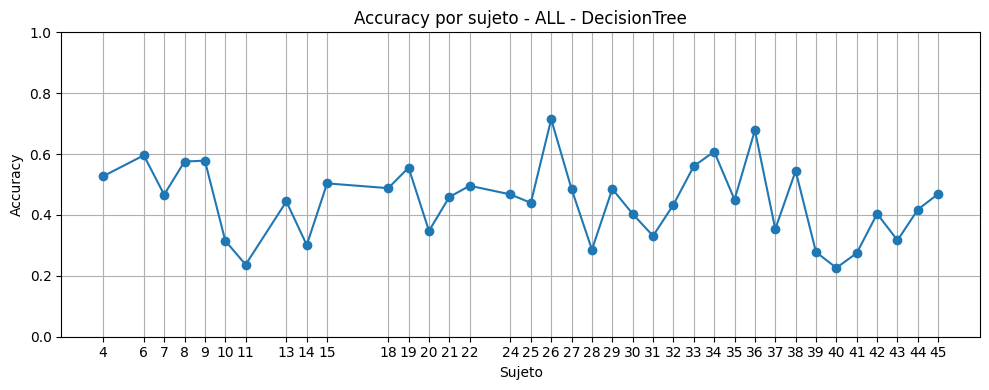

ALL - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.441808  ALL - DecisionTree
1  Precision  0.441623  ALL - DecisionTree
2     Recall  0.441808  ALL - DecisionTree
3   F1 Score  0.439129  ALL - DecisionTree
[ALL - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 40, 'min_samples_split': 2}
[ALL - DecisionTree] F1 Score (weighted): 0.4391
ALL - DecisionTree - Confusion Matrix
[[41195 11753  6180 14426]
 [13346 15129  8483 11375]
 [ 5297  4477 25484  7617]
 [ 9361  8736 14958 10013]]


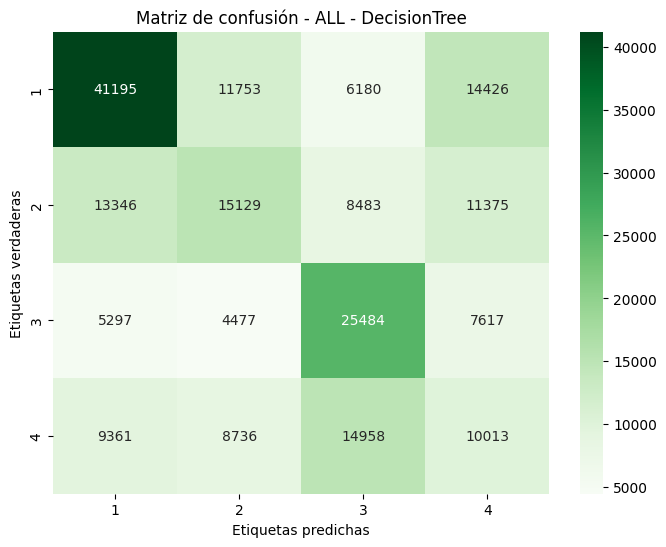

Training with ALL signals:  20%|██        | 1/5 [49:58<3:19:54, 2998.65s/it]

              precision    recall  f1-score   support

           1       0.60      0.56      0.58     73554
           2       0.38      0.31      0.34     48333
           3       0.46      0.59      0.52     42875
           4       0.23      0.23      0.23     43068

    accuracy                           0.44    207830
   macro avg       0.42      0.42      0.42    207830
weighted avg       0.44      0.44      0.44    207830

Training RandomForest model for ALL signals using LOGO...
[ALL - RandomForest] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 72 candidates, totalling 2664 fits
[ALL - RandomForest] Fold 1/37 (Subject: 4)
[ALL - RandomForest] Fold 2/37 (Subject: 6)
[ALL - RandomForest] Fold 3/37 (Subject: 7)
[ALL - RandomForest] Fold 4/37 (Subject: 8)
[ALL - RandomForest] Fold 5/37 (Subject: 9)
[ALL - RandomForest] Fold 6/37 (Subject: 10)
[ALL - RandomForest] Fold 7/37 (Subject: 11)
[ALL - RandomForest] Fold 8/37 (Subject: 13)
[ALL - RandomForest] Fold 9/37 (Subje

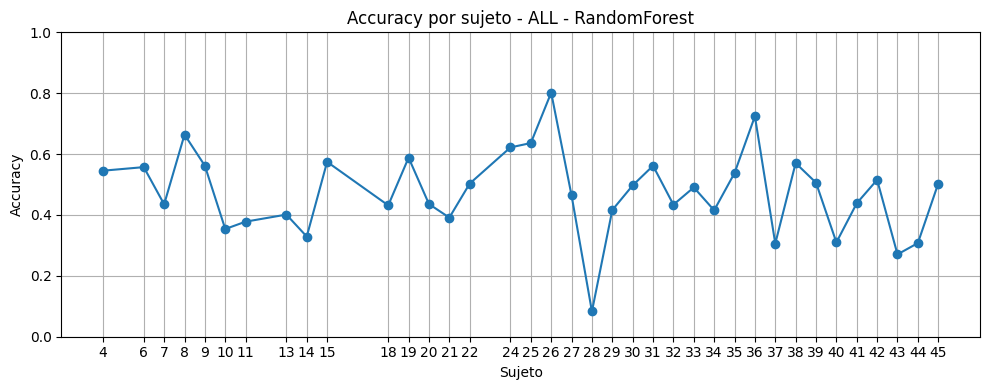

ALL - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.470654  ALL - RandomForest
1  Precision  0.456106  ALL - RandomForest
2     Recall  0.470654  ALL - RandomForest
3   F1 Score  0.458436  ALL - RandomForest
[ALL - RandomForest] Best Params: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 300}
[ALL - RandomForest] F1 Score (weighted): 0.4584
ALL - RandomForest - Confusion Matrix
[[47612  9941  7146  8855]
 [13669 15636 10442  8586]
 [ 5595  5615 26133  5532]
 [10268  8587 15778  8435]]


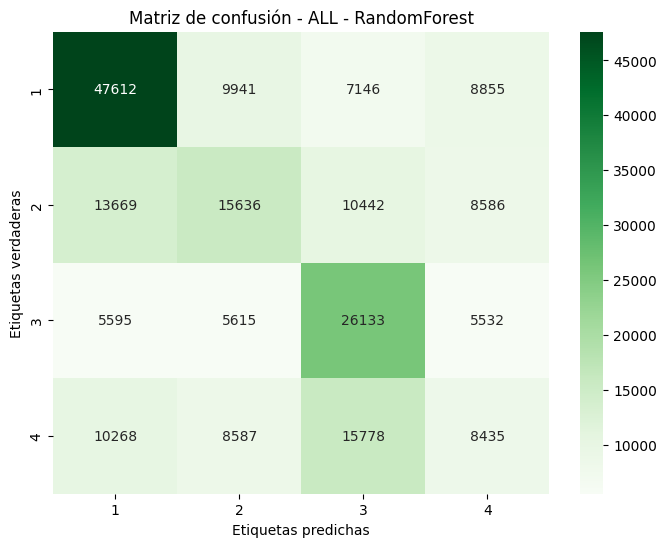

Training with ALL signals:  40%|████      | 2/5 [19:11:26<33:25:29, 40109.75s/it]

              precision    recall  f1-score   support

           1       0.62      0.65      0.63     73554
           2       0.39      0.32      0.35     48333
           3       0.44      0.61      0.51     42875
           4       0.27      0.20      0.23     43068

    accuracy                           0.47    207830
   macro avg       0.43      0.44      0.43    207830
weighted avg       0.46      0.47      0.46    207830

Training AdaBoost model for ALL signals using LOGO...
[ALL - AdaBoost] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 32 candidates, totalling 1184 fits
[ALL - AdaBoost] Fold 1/37 (Subject: 4)
[ALL - AdaBoost] Fold 2/37 (Subject: 6)
[ALL - AdaBoost] Fold 3/37 (Subject: 7)
[ALL - AdaBoost] Fold 4/37 (Subject: 8)
[ALL - AdaBoost] Fold 5/37 (Subject: 9)
[ALL - AdaBoost] Fold 6/37 (Subject: 10)
[ALL - AdaBoost] Fold 7/37 (Subject: 11)
[ALL - AdaBoost] Fold 8/37 (Subject: 13)
[ALL - AdaBoost] Fold 9/37 (Subject: 14)
[ALL - AdaBoost] Fold 10/37 (Subject

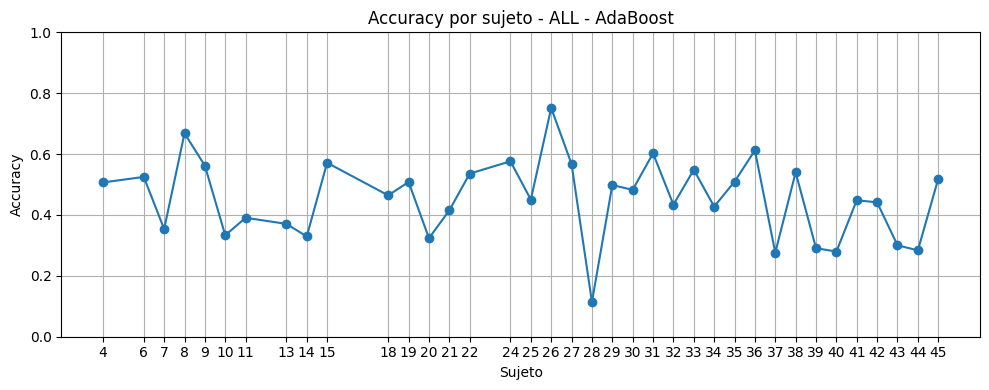

ALL - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.449642  ALL - AdaBoost
1  Precision  0.443312  ALL - AdaBoost
2     Recall  0.449642  ALL - AdaBoost
3   F1 Score  0.443243  ALL - AdaBoost
[ALL - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.01, 'n_estimators': 200}
[ALL - AdaBoost] F1 Score (weighted): 0.4432
ALL - AdaBoost - Confusion Matrix
[[42611 14265  7146  9532]
 [14412 15849  9110  8962]
 [ 3883  6826 25907  6259]
 [ 9087  9388 15511  9082]]


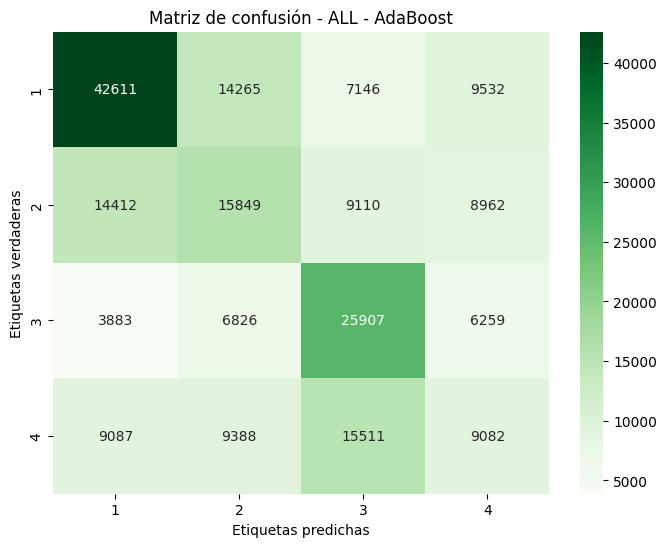

Training with ALL signals:  60%|██████    | 3/5 [41:41:38<32:39:33, 58786.68s/it]

              precision    recall  f1-score   support

           1       0.61      0.58      0.59     73554
           2       0.34      0.33      0.33     48333
           3       0.45      0.60      0.52     42875
           4       0.27      0.21      0.24     43068

    accuracy                           0.45    207830
   macro avg       0.42      0.43      0.42    207830
weighted avg       0.44      0.45      0.44    207830

Training LDA model for ALL signals using LOGO...
[ALL - LDA] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 1 candidates, totalling 37 fits
[ALL - LDA] Fold 1/37 (Subject: 4)
[ALL - LDA] Fold 2/37 (Subject: 6)
[ALL - LDA] Fold 3/37 (Subject: 7)
[ALL - LDA] Fold 4/37 (Subject: 8)
[ALL - LDA] Fold 5/37 (Subject: 9)
[ALL - LDA] Fold 6/37 (Subject: 10)
[ALL - LDA] Fold 7/37 (Subject: 11)
[ALL - LDA] Fold 8/37 (Subject: 13)
[ALL - LDA] Fold 9/37 (Subject: 14)
[ALL - LDA] Fold 10/37 (Subject: 15)
[ALL - LDA] Fold 11/37 (Subject: 18)
[ALL - LDA] Fold 12/

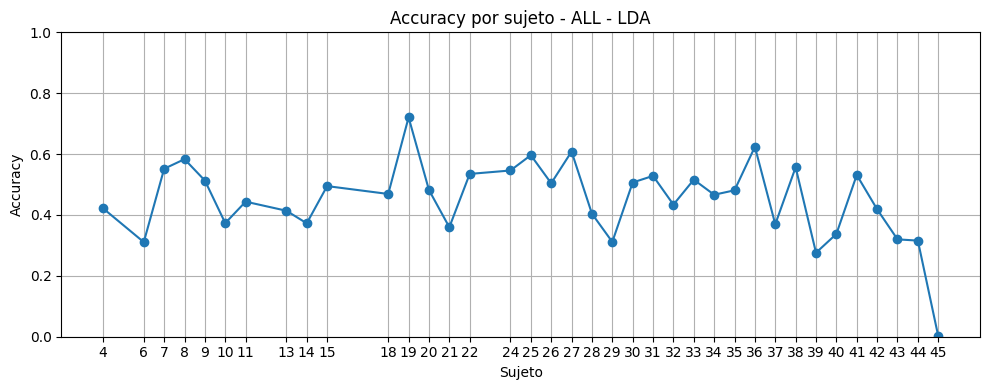

ALL - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.449767  ALL - LDA
1  Precision  0.432045  ALL - LDA
2     Recall  0.449767  ALL - LDA
3   F1 Score  0.438453  ALL - LDA
[ALL - LDA] Best Params: {'solver': 'svd'}
[ALL - LDA] F1 Score (weighted): 0.4385
ALL - LDA - Confusion Matrix
[[47259 12067  7938  6290]
 [18367 13587  6457  9922]
 [ 4346  6458 24057  8014]
 [10107 10958 13431  8572]]


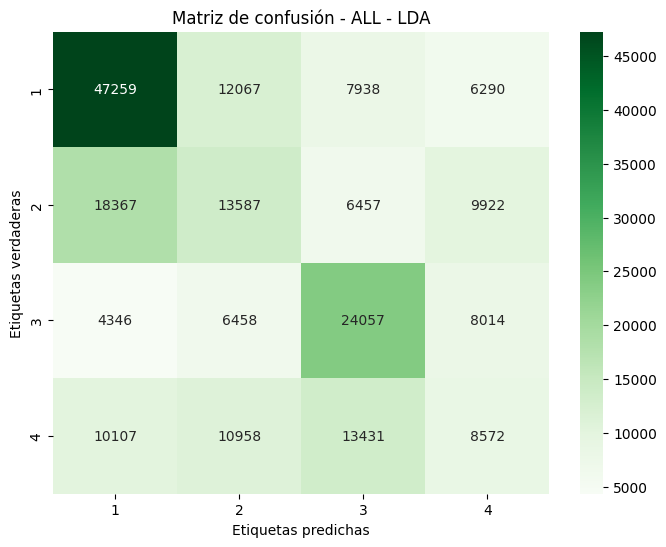

Training with ALL signals:  80%|████████  | 4/5 [41:42:38<9:53:21, 35601.90s/it] 

              precision    recall  f1-score   support

           1       0.59      0.64      0.62     73554
           2       0.32      0.28      0.30     48333
           3       0.46      0.56      0.51     42875
           4       0.26      0.20      0.23     43068

    accuracy                           0.45    207830
   macro avg       0.41      0.42      0.41    207830
weighted avg       0.43      0.45      0.44    207830

Training KNN model for ALL signals using LOGO...
[ALL - KNN] LOGO: 37 folds (1 por sujeto)
Fitting 37 folds for each of 8 candidates, totalling 296 fits


In [ ]:
for signal, features in tqdm(SIGNAL_CATEGORIES.items(), desc="Training by signal"):
    if all(f in df.columns for f in features):  # Verificar que todas las columnas existen
        X = df[features].values  # Convertimos a array
        y = df['label'].values
        subjects = df['subject'].values  # Identificador de sujetos

        for model_name, (model, param_grid) in models.items():
            print(f'Training {model_name} model for {signal} using LOGO...')
            metrics = train_and_evaluate_logo(X, y, subjects, model, param_grid, model_name, signal)
            results[(signal, model_name)] = metrics.copy()

# Entrenamiento con todas las señales combinadas usando LOGO
X_all = df.drop(columns=['label', 'subject']).values
y_all = df['label'].values
subjects_all = df['subject'].values

for model_name, (model, param_grid) in tqdm(models.items(), desc="Training with ALL signals"):
    print(f'Training {model_name} model for ALL signals using LOGO...')
    metrics = train_and_evaluate_logo(X_all, y_all, subjects_all, model, param_grid, model_name, "ALL")
    results[("ALL", model_name)] = metrics.copy()

# Mostrar resultados finales
print("\nFinal Comparison:")
for (signal, model_name), acc in results.items():
    print(f'{signal} - {model_name}:')
    print(acc)

# Crear heatmap
rows = []
for (signal, model), df_metrics in results.items():
    metric_values = df_metrics.set_index('Métrica')['Valor']
    
    row = {
        'Signal': signal,
        'Model': model,
        'Accuracy': metric_values.get('Accuracy', None),
        'F1': metric_values.get('F1 Score', None),
        'Precision': metric_values.get('Precision', None),
        'Recall': metric_values.get('Recall', None)
    }
    rows.append(row)

metrics_df = pd.DataFrame(rows)

pivot_df = metrics_df.pivot(index='Signal', columns='Model', values='Accuracy')
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_df, annot=True, cmap="Blues", fmt=".2f")
plt.title('Heatmap de Accuracy por señal y modelo (LOSO)')
plt.tight_layout()
plt.show()


data = []
metrics = ["Accuracy", "F1 Score", "Recall", "Precision"]

for (signal, model), df in results.items():
    for metric in metrics:
        row = df[df["Métrica"] == metric]
        if not row.empty:
            value = row["Valor"].values[0]
            data.append((signal, model, metric, value))

df_all = pd.DataFrame(data, columns=["Signal", "Model", "Metric", "Value"])

# Paleta bonita
palette = sns.color_palette("Set1")

# Hacer el FacetGrid
g = sns.FacetGrid(df_all, col="Metric", sharey=True, col_wrap=2, height=4, aspect=1.5)
g.map_dataframe(sns.barplot, x="Model", y="Value", hue="Signal", palette=palette, width=0.7, dodge=True)  # <-- aquí el width más pequeño

# Ajustes para la leyenda
g.add_legend(title="Señal", bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0)

# Añadir etiquetas de valores
for ax in g.axes.flatten():
    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", label_type="edge", fontsize=7, padding=2)
    ax.set_ylim(0, 1)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

Training by signal combinations:   0%|          | 0/11 [00:00<?, ?it/s]

Training DecisionTree model for ('ECG', 'PPG') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('ECG', 'PPG') - DecisionTree Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.588985  ('ECG', 'PPG') - DecisionTree
1  Precision  0.670306  ('ECG', 'PPG') - DecisionTree
2     Recall  0.588985  ('ECG', 'PPG') - DecisionTree
3   F1 Score  0.612152  ('ECG', 'PPG') - DecisionTree
[('ECG', 'PPG') - DecisionTree] Best Params: {'criterion': 'entropy', 'max_depth': 10, 'max_leaf_nodes': 40, 'min_samples_split': 2}
[('ECG', 'PPG') - DecisionTree] Accuracy: 0.5890
('ECG', 'PPG') - DecisionTree - Confusion Matrix
[[3012  901   97  379]
 [ 389 1120  169  116]
 [ 147 1085 2685  471]
 [ 117 1123  491 1043]]


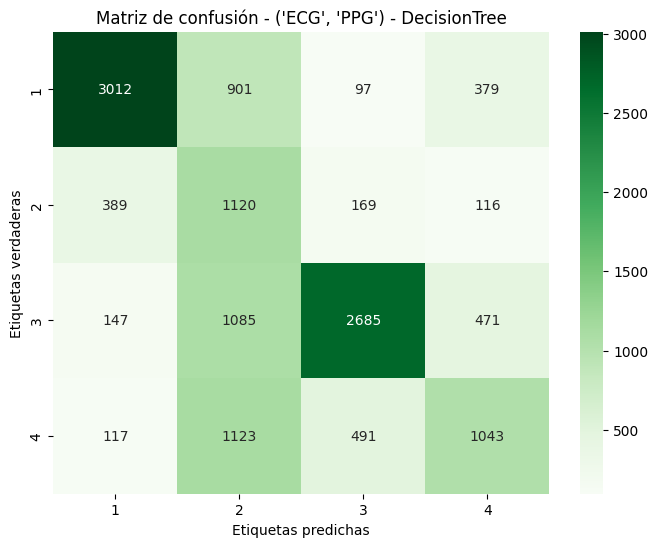

              precision    recall  f1-score   support

           1       0.82      0.69      0.75      4389
           2       0.26      0.62      0.37      1794
           3       0.78      0.61      0.69      4388
           4       0.52      0.38      0.44      2774

    accuracy                           0.59     13345
   macro avg       0.60      0.57      0.56     13345
weighted avg       0.67      0.59      0.61     13345

Training RandomForest model for ('ECG', 'PPG') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('ECG', 'PPG') - RandomForest Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.990259  ('ECG', 'PPG') - RandomForest
1  Precision  0.990265  ('ECG', 'PPG') - RandomForest
2     Recall  0.990259  ('ECG', 'PPG') - RandomForest
3   F1 Score  0.990246  ('ECG', 'PPG') - RandomForest
[('ECG', 'PPG') - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2,

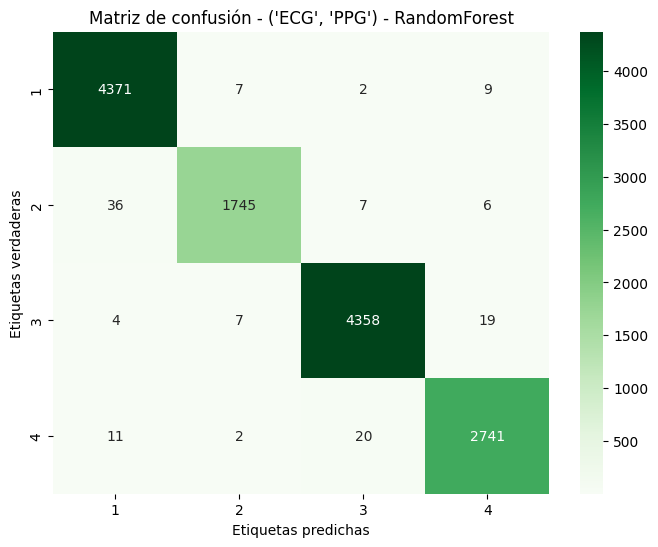

              precision    recall  f1-score   support

           1       0.99      1.00      0.99      4389
           2       0.99      0.97      0.98      1794
           3       0.99      0.99      0.99      4388
           4       0.99      0.99      0.99      2774

    accuracy                           0.99     13345
   macro avg       0.99      0.99      0.99     13345
weighted avg       0.99      0.99      0.99     13345

Training AdaBoost model for ('ECG', 'PPG') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('ECG', 'PPG') - AdaBoost Metrics
     Métrica     Valor                      Etapa
0   Accuracy  0.774747  ('ECG', 'PPG') - AdaBoost
1  Precision  0.776981  ('ECG', 'PPG') - AdaBoost
2     Recall  0.774747  ('ECG', 'PPG') - AdaBoost
3   F1 Score  0.775731  ('ECG', 'PPG') - AdaBoost
[('ECG', 'PPG') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.5, 'n_estimators': 300}
[(

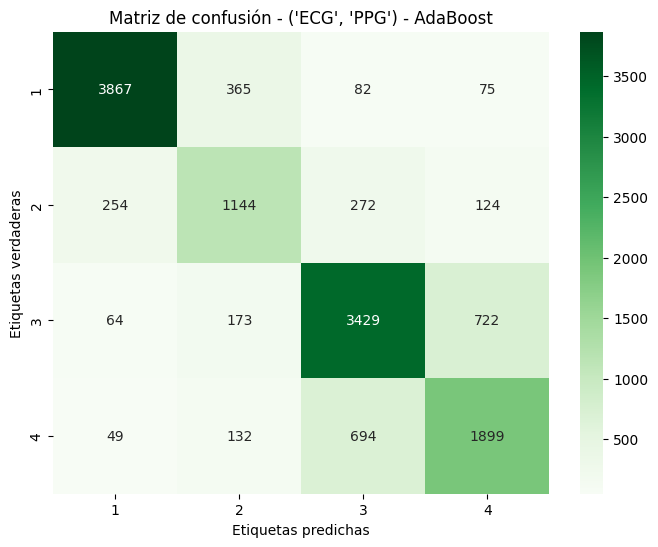

              precision    recall  f1-score   support

           1       0.91      0.88      0.90      4389
           2       0.63      0.64      0.63      1794
           3       0.77      0.78      0.77      4388
           4       0.67      0.68      0.68      2774

    accuracy                           0.77     13345
   macro avg       0.75      0.75      0.75     13345
weighted avg       0.78      0.77      0.78     13345

Training LDA model for ('ECG', 'PPG') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('ECG', 'PPG') - LDA Metrics
     Métrica     Valor                 Etapa
0   Accuracy  0.573248  ('ECG', 'PPG') - LDA
1  Precision  0.526458  ('ECG', 'PPG') - LDA
2     Recall  0.573248  ('ECG', 'PPG') - LDA
3   F1 Score  0.528031  ('ECG', 'PPG') - LDA
[('ECG', 'PPG') - LDA] Best Params: {'solver': 'svd'}
[('ECG', 'PPG') - LDA] Accuracy: 0.5732
('ECG', 'PPG') - LDA - Confusion Matrix
[[3436   55  549  349]
 [ 757   51  692  294]
 [ 383   35 3327  64

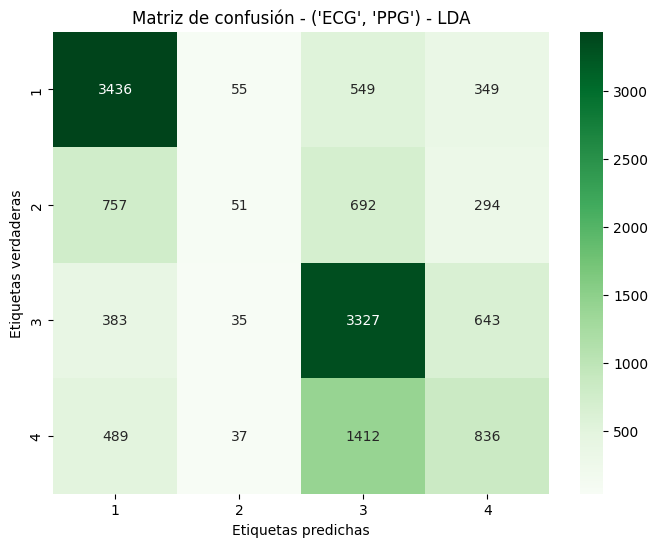

              precision    recall  f1-score   support

           1       0.68      0.78      0.73      4389
           2       0.29      0.03      0.05      1794
           3       0.56      0.76      0.64      4388
           4       0.39      0.30      0.34      2774

    accuracy                           0.57     13345
   macro avg       0.48      0.47      0.44     13345
weighted avg       0.53      0.57      0.53     13345

Training KNN model for ('ECG', 'PPG') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('ECG', 'PPG') - KNN Metrics
     Métrica     Valor                 Etapa
0   Accuracy  0.562383  ('ECG', 'PPG') - KNN
1  Precision  0.558856  ('ECG', 'PPG') - KNN
2     Recall  0.562383  ('ECG', 'PPG') - KNN
3   F1 Score  0.559740  ('ECG', 'PPG') - KNN
[('ECG', 'PPG') - KNN] Best Params: {'n_neighbors': 5, 'weights': 'distance'}
[('ECG', 'PPG') - KNN] Accuracy: 0.5624
('ECG', 'PPG') - KNN - Confusion Matrix
[[2837  337  760  455]
 [ 491  714  358  

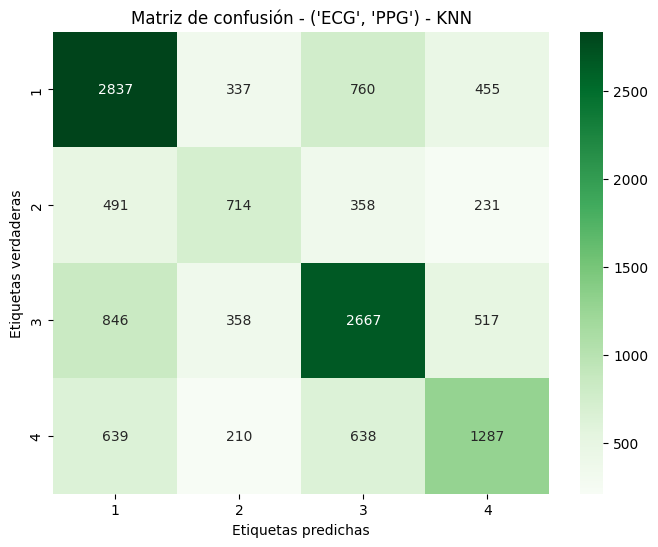

Training by signal combinations:   9%|▉         | 1/11 [1:46:10<17:41:40, 6370.09s/it]

              precision    recall  f1-score   support

           1       0.59      0.65      0.62      4389
           2       0.44      0.40      0.42      1794
           3       0.60      0.61      0.61      4388
           4       0.52      0.46      0.49      2774

    accuracy                           0.56     13345
   macro avg       0.54      0.53      0.53     13345
weighted avg       0.56      0.56      0.56     13345

Training DecisionTree model for ('ECG', 'EDA') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('ECG', 'EDA') - DecisionTree Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.586587  ('ECG', 'EDA') - DecisionTree
1  Precision  0.635387  ('ECG', 'EDA') - DecisionTree
2     Recall  0.586587  ('ECG', 'EDA') - DecisionTree
3   F1 Score  0.597006  ('ECG', 'EDA') - DecisionTree
[('ECG', 'EDA') - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 15, 'max_leaf_nodes': 40, 'min_samples_split': 2}
[('

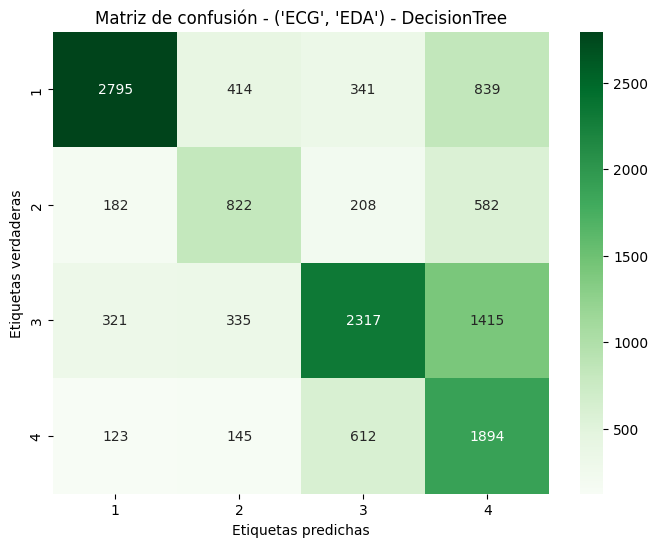

              precision    recall  f1-score   support

           1       0.82      0.64      0.72      4389
           2       0.48      0.46      0.47      1794
           3       0.67      0.53      0.59      4388
           4       0.40      0.68      0.50      2774

    accuracy                           0.59     13345
   macro avg       0.59      0.58      0.57     13345
weighted avg       0.64      0.59      0.60     13345

Training RandomForest model for ('ECG', 'EDA') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('ECG', 'EDA') - RandomForest Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.991682  ('ECG', 'EDA') - RandomForest
1  Precision  0.991689  ('ECG', 'EDA') - RandomForest
2     Recall  0.991682  ('ECG', 'EDA') - RandomForest
3   F1 Score  0.991683  ('ECG', 'EDA') - RandomForest
[('ECG', 'EDA') - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2,

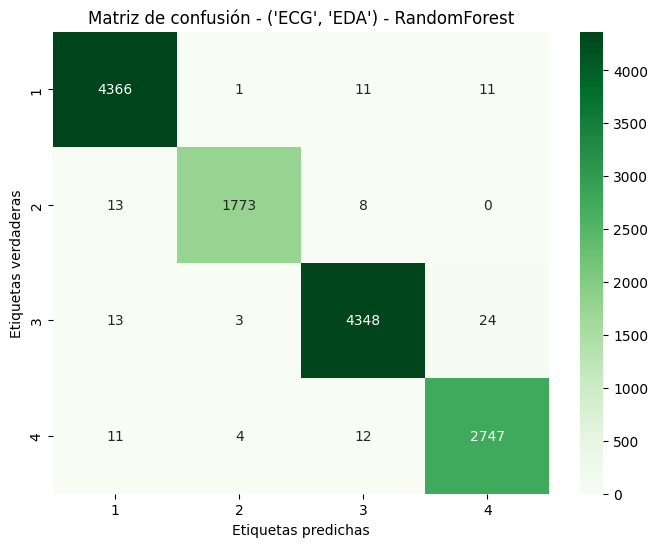

              precision    recall  f1-score   support

           1       0.99      0.99      0.99      4389
           2       1.00      0.99      0.99      1794
           3       0.99      0.99      0.99      4388
           4       0.99      0.99      0.99      2774

    accuracy                           0.99     13345
   macro avg       0.99      0.99      0.99     13345
weighted avg       0.99      0.99      0.99     13345

Training AdaBoost model for ('ECG', 'EDA') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('ECG', 'EDA') - AdaBoost Metrics
     Métrica     Valor                      Etapa
0   Accuracy  0.755789  ('ECG', 'EDA') - AdaBoost
1  Precision  0.764421  ('ECG', 'EDA') - AdaBoost
2     Recall  0.755789  ('ECG', 'EDA') - AdaBoost
3   F1 Score  0.758228  ('ECG', 'EDA') - AdaBoost
[('ECG', 'EDA') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 1, 'n_estimators': 300}
[('E

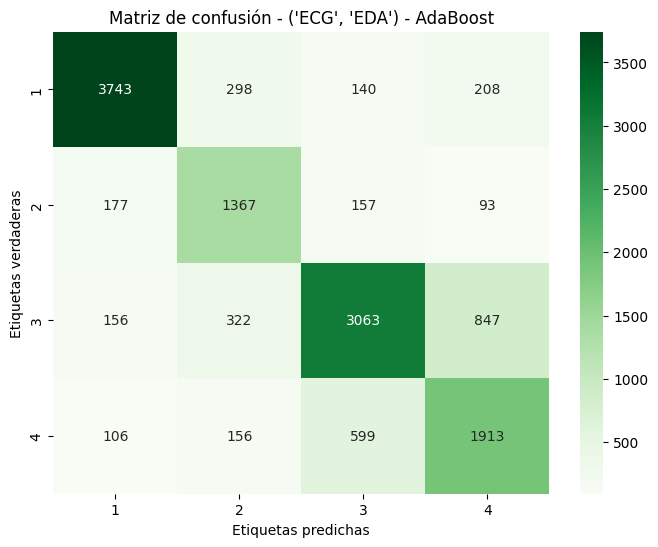

              precision    recall  f1-score   support

           1       0.90      0.85      0.87      4389
           2       0.64      0.76      0.69      1794
           3       0.77      0.70      0.73      4388
           4       0.62      0.69      0.66      2774

    accuracy                           0.76     13345
   macro avg       0.73      0.75      0.74     13345
weighted avg       0.76      0.76      0.76     13345

Training LDA model for ('ECG', 'EDA') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('ECG', 'EDA') - LDA Metrics
     Métrica     Valor                 Etapa
0   Accuracy  0.483102  ('ECG', 'EDA') - LDA
1  Precision  0.457868  ('ECG', 'EDA') - LDA
2     Recall  0.483102  ('ECG', 'EDA') - LDA
3   F1 Score  0.428094  ('ECG', 'EDA') - LDA
[('ECG', 'EDA') - LDA] Best Params: {'solver': 'svd'}
[('ECG', 'EDA') - LDA] Accuracy: 0.4831
('ECG', 'EDA') - LDA - Confusion Matrix
[[3412   10  675  292]
 [ 919   13  758  104]
 [1458    6 2480  44

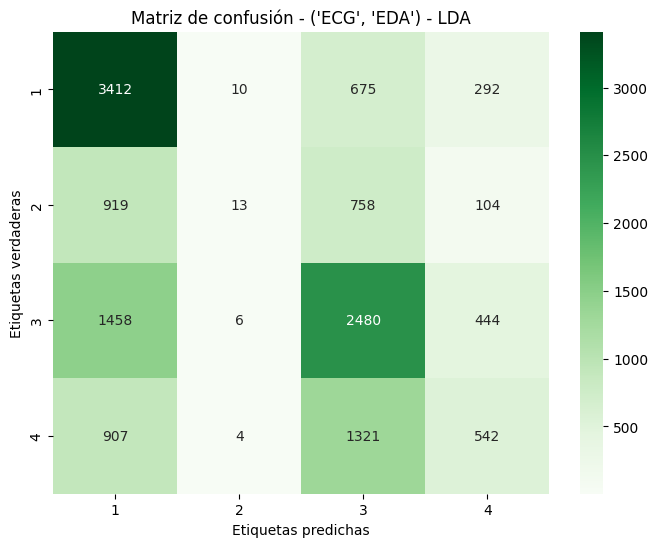

              precision    recall  f1-score   support

           1       0.51      0.78      0.62      4389
           2       0.39      0.01      0.01      1794
           3       0.47      0.57      0.52      4388
           4       0.39      0.20      0.26      2774

    accuracy                           0.48     13345
   macro avg       0.44      0.39      0.35     13345
weighted avg       0.46      0.48      0.43     13345

Training KNN model for ('ECG', 'EDA') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('ECG', 'EDA') - KNN Metrics
     Métrica     Valor                 Etapa
0   Accuracy  0.583589  ('ECG', 'EDA') - KNN
1  Precision  0.579558  ('ECG', 'EDA') - KNN
2     Recall  0.583589  ('ECG', 'EDA') - KNN
3   F1 Score  0.580668  ('ECG', 'EDA') - KNN
[('ECG', 'EDA') - KNN] Best Params: {'n_neighbors': 5, 'weights': 'distance'}
[('ECG', 'EDA') - KNN] Accuracy: 0.5836
('ECG', 'EDA') - KNN - Confusion Matrix
[[2964  311  708  406]
 [ 459  733  368  

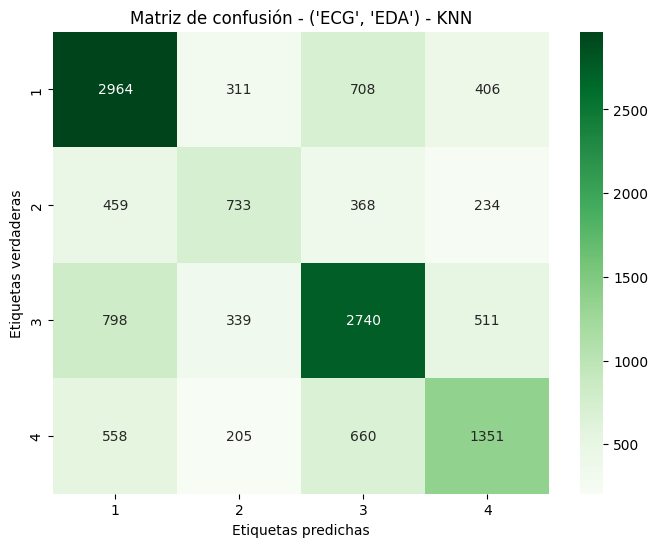

Training by signal combinations:  18%|█▊        | 2/11 [3:20:09<14:51:02, 5940.25s/it]

              precision    recall  f1-score   support

           1       0.62      0.68      0.65      4389
           2       0.46      0.41      0.43      1794
           3       0.61      0.62      0.62      4388
           4       0.54      0.49      0.51      2774

    accuracy                           0.58     13345
   macro avg       0.56      0.55      0.55     13345
weighted avg       0.58      0.58      0.58     13345

Training DecisionTree model for ('ECG', 'RESP') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('ECG', 'RESP') - DecisionTree Metrics
     Métrica     Valor                           Etapa
0   Accuracy  0.536980  ('ECG', 'RESP') - DecisionTree
1  Precision  0.540172  ('ECG', 'RESP') - DecisionTree
2     Recall  0.536980  ('ECG', 'RESP') - DecisionTree
3   F1 Score  0.530303  ('ECG', 'RESP') - DecisionTree
[('ECG', 'RESP') - DecisionTree] Best Params: {'criterion': 'entropy', 'max_depth': 10, 'max_leaf_nodes': 40, 'min_samples_spl

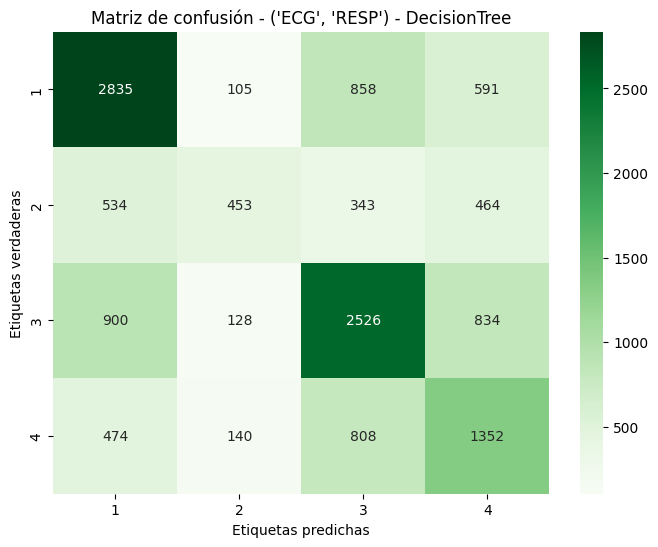

              precision    recall  f1-score   support

           1       0.60      0.65      0.62      4389
           2       0.55      0.25      0.35      1794
           3       0.56      0.58      0.57      4388
           4       0.42      0.49      0.45      2774

    accuracy                           0.54     13345
   macro avg       0.53      0.49      0.50     13345
weighted avg       0.54      0.54      0.53     13345

Training RandomForest model for ('ECG', 'RESP') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('ECG', 'RESP') - RandomForest Metrics
     Métrica     Valor                           Etapa
0   Accuracy  0.989959  ('ECG', 'RESP') - RandomForest
1  Precision  0.990071  ('ECG', 'RESP') - RandomForest
2     Recall  0.989959  ('ECG', 'RESP') - RandomForest
3   F1 Score  0.989966  ('ECG', 'RESP') - RandomForest
[('ECG', 'RESP') - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_sp

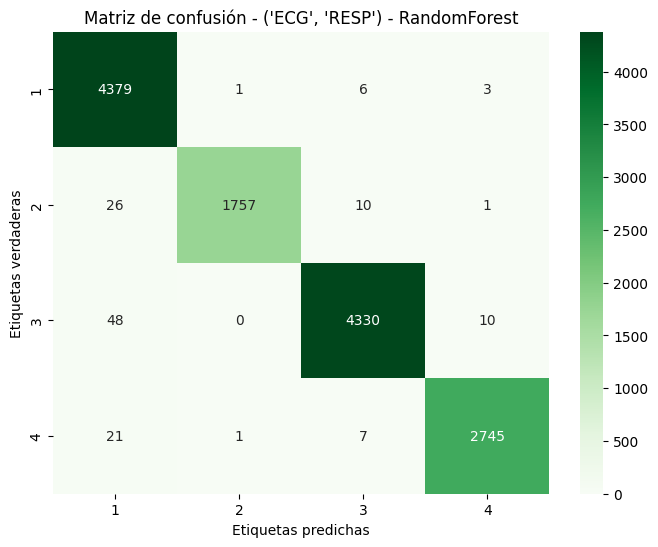

              precision    recall  f1-score   support

           1       0.98      1.00      0.99      4389
           2       1.00      0.98      0.99      1794
           3       0.99      0.99      0.99      4388
           4       0.99      0.99      0.99      2774

    accuracy                           0.99     13345
   macro avg       0.99      0.99      0.99     13345
weighted avg       0.99      0.99      0.99     13345

Training AdaBoost model for ('ECG', 'RESP') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('ECG', 'RESP') - AdaBoost Metrics
     Métrica     Valor                       Etapa
0   Accuracy  0.762458  ('ECG', 'RESP') - AdaBoost
1  Precision  0.763191  ('ECG', 'RESP') - AdaBoost
2     Recall  0.762458  ('ECG', 'RESP') - AdaBoost
3   F1 Score  0.762439  ('ECG', 'RESP') - AdaBoost
[('ECG', 'RESP') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.5, 'n_estimators':

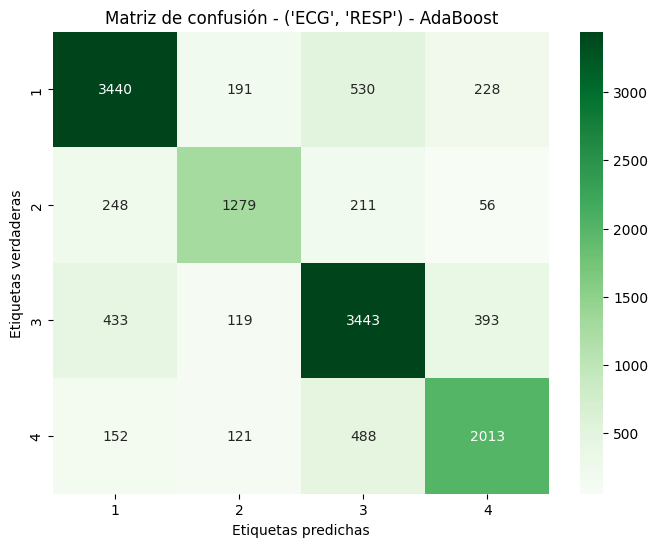

              precision    recall  f1-score   support

           1       0.81      0.78      0.79      4389
           2       0.75      0.71      0.73      1794
           3       0.74      0.78      0.76      4388
           4       0.75      0.73      0.74      2774

    accuracy                           0.76     13345
   macro avg       0.76      0.75      0.76     13345
weighted avg       0.76      0.76      0.76     13345

Training LDA model for ('ECG', 'RESP') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('ECG', 'RESP') - LDA Metrics
     Métrica     Valor                  Etapa
0   Accuracy  0.477557  ('ECG', 'RESP') - LDA
1  Precision  0.444864  ('ECG', 'RESP') - LDA
2     Recall  0.477557  ('ECG', 'RESP') - LDA
3   F1 Score  0.424103  ('ECG', 'RESP') - LDA
[('ECG', 'RESP') - LDA] Best Params: {'solver': 'svd'}
[('ECG', 'RESP') - LDA] Accuracy: 0.4776
('ECG', 'RESP') - LDA - Confusion Matrix
[[3113    8  986  282]
 [1103   10  536  145]
 [1292   1

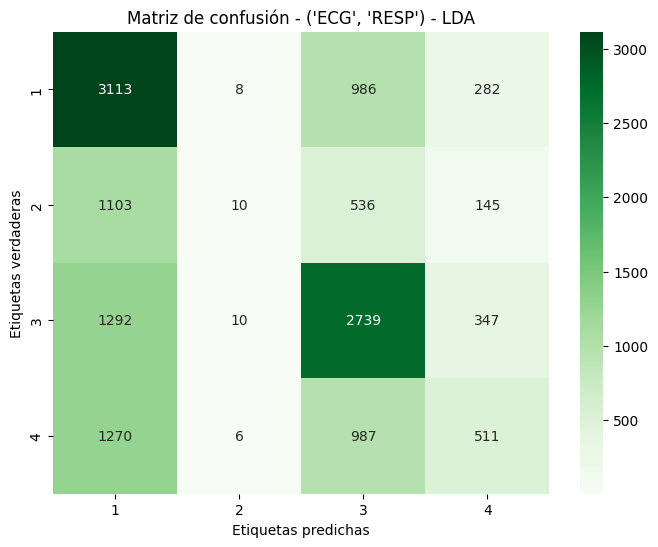

              precision    recall  f1-score   support

           1       0.46      0.71      0.56      4389
           2       0.29      0.01      0.01      1794
           3       0.52      0.62      0.57      4388
           4       0.40      0.18      0.25      2774

    accuracy                           0.48     13345
   macro avg       0.42      0.38      0.35     13345
weighted avg       0.44      0.48      0.42     13345

Training KNN model for ('ECG', 'RESP') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('ECG', 'RESP') - KNN Metrics
     Métrica     Valor                  Etapa
0   Accuracy  0.559910  ('ECG', 'RESP') - KNN
1  Precision  0.556165  ('ECG', 'RESP') - KNN
2     Recall  0.559910  ('ECG', 'RESP') - KNN
3   F1 Score  0.557183  ('ECG', 'RESP') - KNN
[('ECG', 'RESP') - KNN] Best Params: {'n_neighbors': 5, 'weights': 'distance'}
[('ECG', 'RESP') - KNN] Accuracy: 0.5599
('ECG', 'RESP') - KNN - Confusion Matrix
[[2826  332  771  460]
 [ 487  

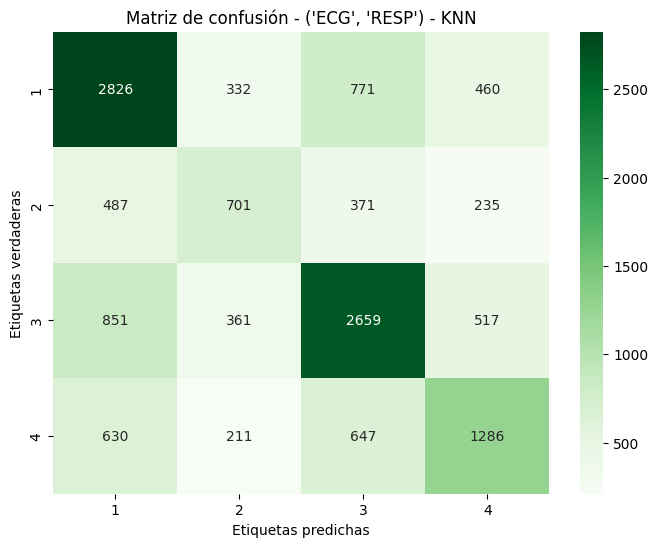

Training by signal combinations:  27%|██▋       | 3/11 [5:33:54<15:18:57, 6892.20s/it]

              precision    recall  f1-score   support

           1       0.59      0.64      0.62      4389
           2       0.44      0.39      0.41      1794
           3       0.60      0.61      0.60      4388
           4       0.51      0.46      0.49      2774

    accuracy                           0.56     13345
   macro avg       0.53      0.53      0.53     13345
weighted avg       0.56      0.56      0.56     13345

Training DecisionTree model for ('PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('PPG', 'EDA') - DecisionTree Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.641289  ('PPG', 'EDA') - DecisionTree
1  Precision  0.698084  ('PPG', 'EDA') - DecisionTree
2     Recall  0.641289  ('PPG', 'EDA') - DecisionTree
3   F1 Score  0.649495  ('PPG', 'EDA') - DecisionTree
[('PPG', 'EDA') - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 40, 'min_samples_split': 2}
[('

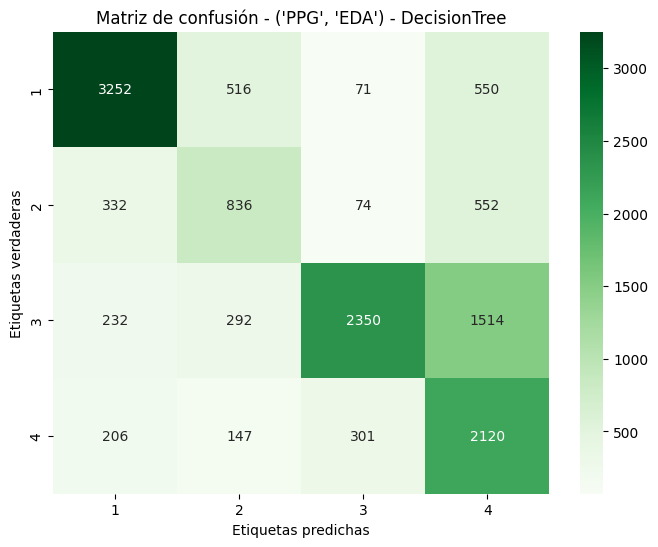

              precision    recall  f1-score   support

           1       0.81      0.74      0.77      4389
           2       0.47      0.47      0.47      1794
           3       0.84      0.54      0.65      4388
           4       0.45      0.76      0.56      2774

    accuracy                           0.64     13345
   macro avg       0.64      0.63      0.61     13345
weighted avg       0.70      0.64      0.65     13345

Training RandomForest model for ('PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('PPG', 'EDA') - RandomForest Metrics
     Métrica     Valor                          Etapa
0   Accuracy  0.998127  ('PPG', 'EDA') - RandomForest
1  Precision  0.998127  ('PPG', 'EDA') - RandomForest
2     Recall  0.998127  ('PPG', 'EDA') - RandomForest
3   F1 Score  0.998126  ('PPG', 'EDA') - RandomForest
[('PPG', 'EDA') - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5,

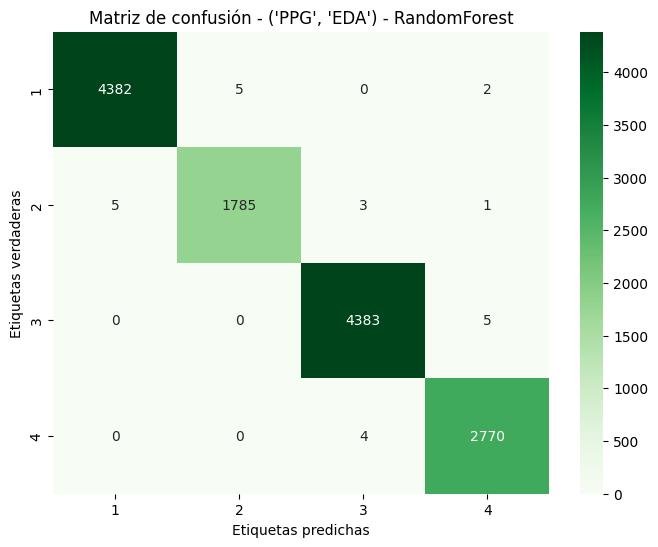

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4389
           2       1.00      0.99      1.00      1794
           3       1.00      1.00      1.00      4388
           4       1.00      1.00      1.00      2774

    accuracy                           1.00     13345
   macro avg       1.00      1.00      1.00     13345
weighted avg       1.00      1.00      1.00     13345

Training AdaBoost model for ('PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('PPG', 'EDA') - AdaBoost Metrics
     Métrica     Valor                      Etapa
0   Accuracy  0.786062  ('PPG', 'EDA') - AdaBoost
1  Precision  0.802826  ('PPG', 'EDA') - AdaBoost
2     Recall  0.786062  ('PPG', 'EDA') - AdaBoost
3   F1 Score  0.790292  ('PPG', 'EDA') - AdaBoost
[('PPG', 'EDA') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.1, 'n_estimators': 300}
[(

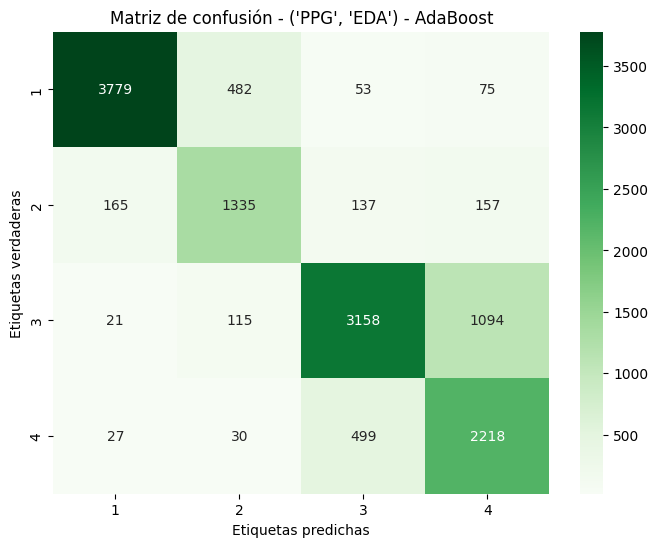

              precision    recall  f1-score   support

           1       0.95      0.86      0.90      4389
           2       0.68      0.74      0.71      1794
           3       0.82      0.72      0.77      4388
           4       0.63      0.80      0.70      2774

    accuracy                           0.79     13345
   macro avg       0.77      0.78      0.77     13345
weighted avg       0.80      0.79      0.79     13345

Training LDA model for ('PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('PPG', 'EDA') - LDA Metrics
     Métrica     Valor                 Etapa
0   Accuracy  0.586137  ('PPG', 'EDA') - LDA
1  Precision  0.554150  ('PPG', 'EDA') - LDA
2     Recall  0.586137  ('PPG', 'EDA') - LDA
3   F1 Score  0.541348  ('PPG', 'EDA') - LDA
[('PPG', 'EDA') - LDA] Best Params: {'solver': 'svd'}
[('PPG', 'EDA') - LDA] Accuracy: 0.5861
('PPG', 'EDA') - LDA - Confusion Matrix
[[3552   56  485  296]
 [ 710   97  708  279]
 [ 439   29 3368  55

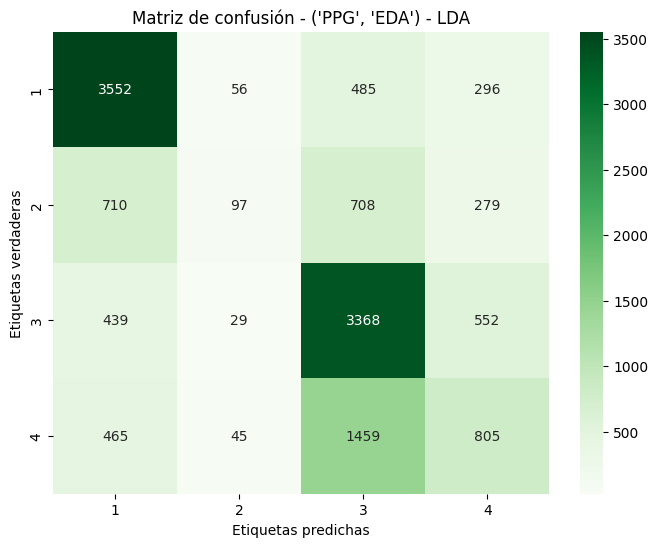

              precision    recall  f1-score   support

           1       0.69      0.81      0.74      4389
           2       0.43      0.05      0.10      1794
           3       0.56      0.77      0.65      4388
           4       0.42      0.29      0.34      2774

    accuracy                           0.59     13345
   macro avg       0.52      0.48      0.46     13345
weighted avg       0.55      0.59      0.54     13345

Training KNN model for ('PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('PPG', 'EDA') - KNN Metrics
     Métrica     Valor                 Etapa
0   Accuracy  0.972724  ('PPG', 'EDA') - KNN
1  Precision  0.972689  ('PPG', 'EDA') - KNN
2     Recall  0.972724  ('PPG', 'EDA') - KNN
3   F1 Score  0.972701  ('PPG', 'EDA') - KNN
[('PPG', 'EDA') - KNN] Best Params: {'n_neighbors': 3, 'weights': 'distance'}
[('PPG', 'EDA') - KNN] Accuracy: 0.9727
('PPG', 'EDA') - KNN - Confusion Matrix
[[4321   38   13   17]
 [  46 1697   19  

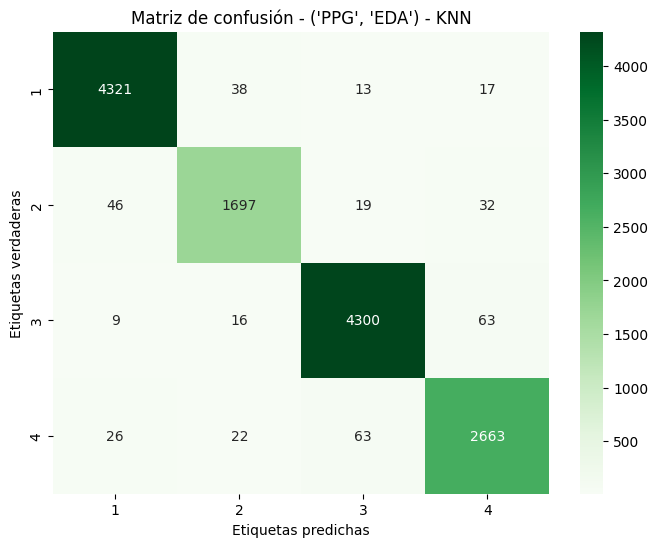

Training by signal combinations:  36%|███▋      | 4/11 [7:09:32<12:30:55, 6436.45s/it]

              precision    recall  f1-score   support

           1       0.98      0.98      0.98      4389
           2       0.96      0.95      0.95      1794
           3       0.98      0.98      0.98      4388
           4       0.96      0.96      0.96      2774

    accuracy                           0.97     13345
   macro avg       0.97      0.97      0.97     13345
weighted avg       0.97      0.97      0.97     13345

Training DecisionTree model for ('PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('PPG', 'RESP') - DecisionTree Metrics
     Métrica     Valor                           Etapa
0   Accuracy  0.612514  ('PPG', 'RESP') - DecisionTree
1  Precision  0.646169  ('PPG', 'RESP') - DecisionTree
2     Recall  0.612514  ('PPG', 'RESP') - DecisionTree
3   F1 Score  0.622116  ('PPG', 'RESP') - DecisionTree
[('PPG', 'RESP') - DecisionTree] Best Params: {'criterion': 'entropy', 'max_depth': 10, 'max_leaf_nodes': 40, 'min_samples_spl

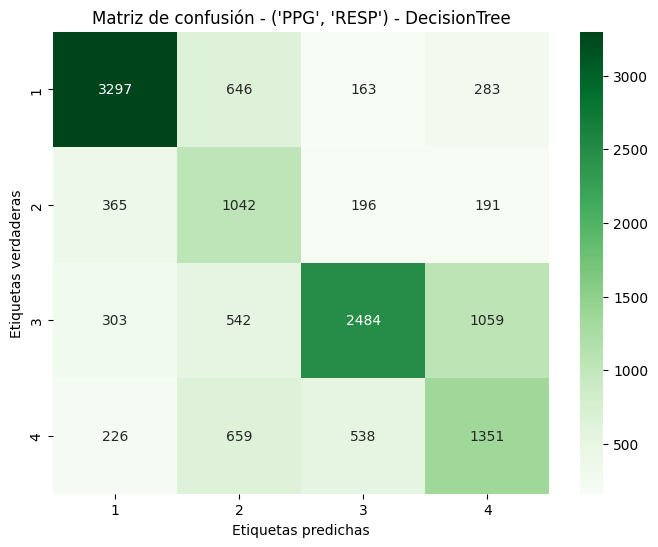

              precision    recall  f1-score   support

           1       0.79      0.75      0.77      4389
           2       0.36      0.58      0.45      1794
           3       0.73      0.57      0.64      4388
           4       0.47      0.49      0.48      2774

    accuracy                           0.61     13345
   macro avg       0.59      0.60      0.58     13345
weighted avg       0.65      0.61      0.62     13345

Training RandomForest model for ('PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('PPG', 'RESP') - RandomForest Metrics
     Métrica     Valor                           Etapa
0   Accuracy  0.997302  ('PPG', 'RESP') - RandomForest
1  Precision  0.997304  ('PPG', 'RESP') - RandomForest
2     Recall  0.997302  ('PPG', 'RESP') - RandomForest
3   F1 Score  0.997301  ('PPG', 'RESP') - RandomForest
[('PPG', 'RESP') - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_sp

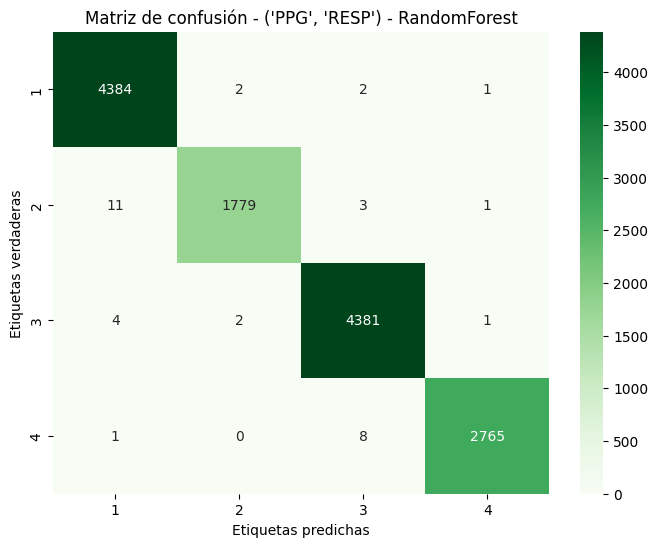

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4389
           2       1.00      0.99      0.99      1794
           3       1.00      1.00      1.00      4388
           4       1.00      1.00      1.00      2774

    accuracy                           1.00     13345
   macro avg       1.00      1.00      1.00     13345
weighted avg       1.00      1.00      1.00     13345

Training AdaBoost model for ('PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('PPG', 'RESP') - AdaBoost Metrics
     Métrica     Valor                       Etapa
0   Accuracy  0.820082  ('PPG', 'RESP') - AdaBoost
1  Precision  0.825798  ('PPG', 'RESP') - AdaBoost
2     Recall  0.820082  ('PPG', 'RESP') - AdaBoost
3   F1 Score  0.821955  ('PPG', 'RESP') - AdaBoost
[('PPG', 'RESP') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.5, 'n_estimators':

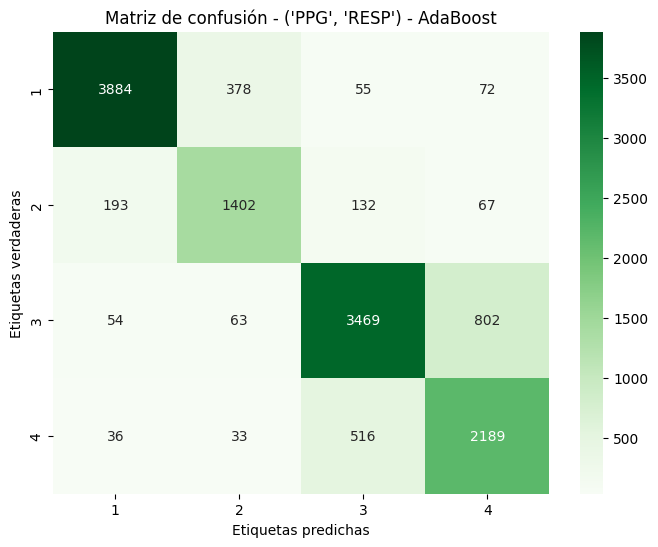

              precision    recall  f1-score   support

           1       0.93      0.88      0.91      4389
           2       0.75      0.78      0.76      1794
           3       0.83      0.79      0.81      4388
           4       0.70      0.79      0.74      2774

    accuracy                           0.82     13345
   macro avg       0.80      0.81      0.81     13345
weighted avg       0.83      0.82      0.82     13345

Training LDA model for ('PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('PPG', 'RESP') - LDA Metrics
     Métrica     Valor                  Etapa
0   Accuracy  0.593631  ('PPG', 'RESP') - LDA
1  Precision  0.560919  ('PPG', 'RESP') - LDA
2     Recall  0.593631  ('PPG', 'RESP') - LDA
3   F1 Score  0.557622  ('PPG', 'RESP') - LDA
[('PPG', 'RESP') - LDA] Best Params: {'solver': 'svd'}
[('PPG', 'RESP') - LDA] Accuracy: 0.5936
('PPG', 'RESP') - LDA - Confusion Matrix
[[3489   79  237  584]
 [ 771   90  443  490]
 [ 319   3

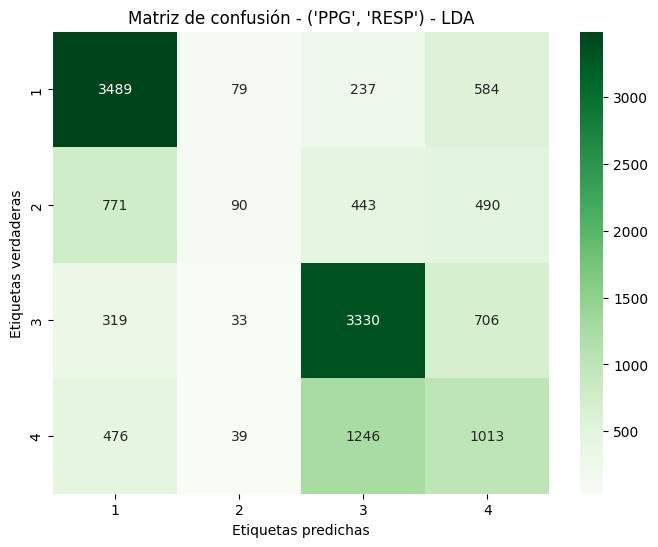

              precision    recall  f1-score   support

           1       0.69      0.79      0.74      4389
           2       0.37      0.05      0.09      1794
           3       0.63      0.76      0.69      4388
           4       0.36      0.37      0.36      2774

    accuracy                           0.59     13345
   macro avg       0.51      0.49      0.47     13345
weighted avg       0.56      0.59      0.56     13345

Training KNN model for ('PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('PPG', 'RESP') - KNN Metrics
     Métrica     Valor                  Etapa
0   Accuracy  0.982615  ('PPG', 'RESP') - KNN
1  Precision  0.982634  ('PPG', 'RESP') - KNN
2     Recall  0.982615  ('PPG', 'RESP') - KNN
3   F1 Score  0.982621  ('PPG', 'RESP') - KNN
[('PPG', 'RESP') - KNN] Best Params: {'n_neighbors': 3, 'weights': 'distance'}
[('PPG', 'RESP') - KNN] Accuracy: 0.9826
('PPG', 'RESP') - KNN - Confusion Matrix
[[4334   25   10   20]
 [  23 1

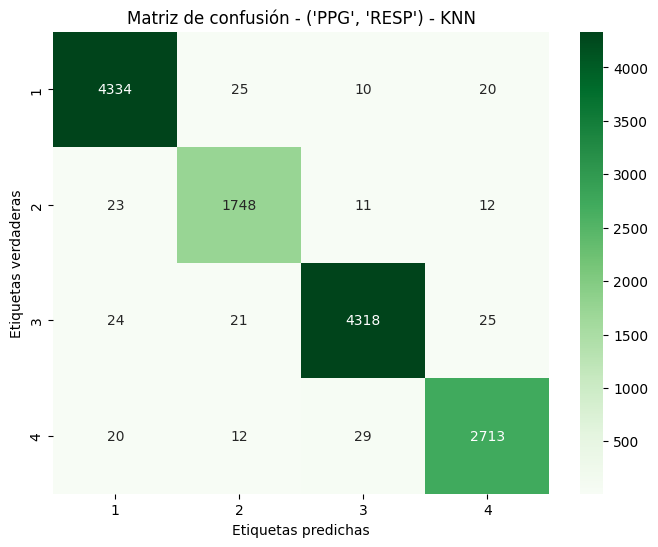

Training by signal combinations:  45%|████▌     | 5/11 [8:35:54<9:58:25, 5984.28s/it] 

              precision    recall  f1-score   support

           1       0.98      0.99      0.99      4389
           2       0.97      0.97      0.97      1794
           3       0.99      0.98      0.99      4388
           4       0.98      0.98      0.98      2774

    accuracy                           0.98     13345
   macro avg       0.98      0.98      0.98     13345
weighted avg       0.98      0.98      0.98     13345

Training DecisionTree model for ('EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('EDA', 'RESP') - DecisionTree Metrics
     Métrica     Valor                           Etapa
0   Accuracy  0.573923  ('EDA', 'RESP') - DecisionTree
1  Precision  0.603988  ('EDA', 'RESP') - DecisionTree
2     Recall  0.573923  ('EDA', 'RESP') - DecisionTree
3   F1 Score  0.580648  ('EDA', 'RESP') - DecisionTree
[('EDA', 'RESP') - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 40, 'min_samples_split'

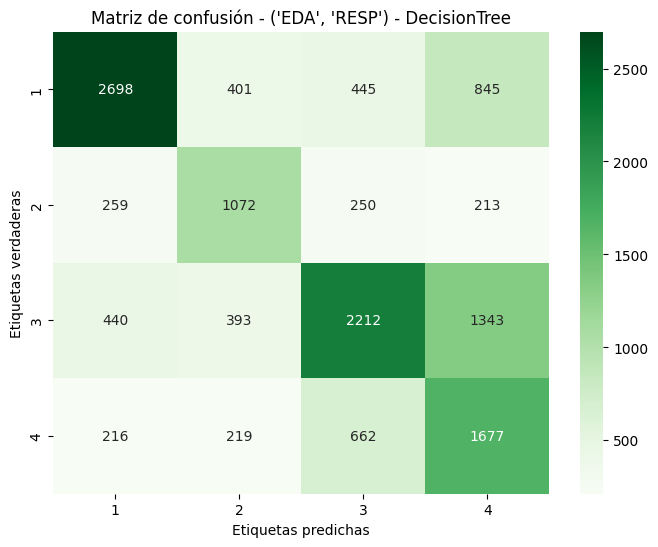

              precision    recall  f1-score   support

           1       0.75      0.61      0.67      4389
           2       0.51      0.60      0.55      1794
           3       0.62      0.50      0.56      4388
           4       0.41      0.60      0.49      2774

    accuracy                           0.57     13345
   macro avg       0.57      0.58      0.57     13345
weighted avg       0.60      0.57      0.58     13345

Training RandomForest model for ('EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('EDA', 'RESP') - RandomForest Metrics
     Métrica     Valor                           Etapa
0   Accuracy  0.997377  ('EDA', 'RESP') - RandomForest
1  Precision  0.997379  ('EDA', 'RESP') - RandomForest
2     Recall  0.997377  ('EDA', 'RESP') - RandomForest
3   F1 Score  0.997377  ('EDA', 'RESP') - RandomForest
[('EDA', 'RESP') - RandomForest] Best Params: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_sp

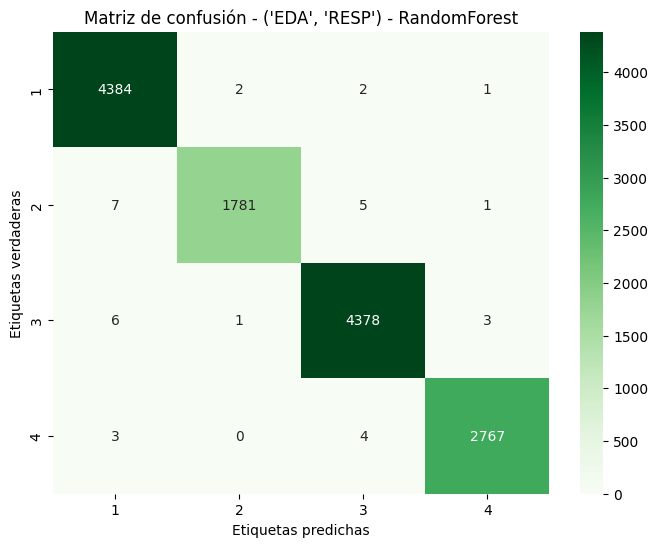

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4389
           2       1.00      0.99      1.00      1794
           3       1.00      1.00      1.00      4388
           4       1.00      1.00      1.00      2774

    accuracy                           1.00     13345
   macro avg       1.00      1.00      1.00     13345
weighted avg       1.00      1.00      1.00     13345

Training AdaBoost model for ('EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('EDA', 'RESP') - AdaBoost Metrics
     Métrica     Valor                       Etapa
0   Accuracy  0.750918  ('EDA', 'RESP') - AdaBoost
1  Precision  0.755062  ('EDA', 'RESP') - AdaBoost
2     Recall  0.750918  ('EDA', 'RESP') - AdaBoost
3   F1 Score  0.751350  ('EDA', 'RESP') - AdaBoost
[('EDA', 'RESP') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=3), 'learning_rate': 0.5, 'n_estimators':

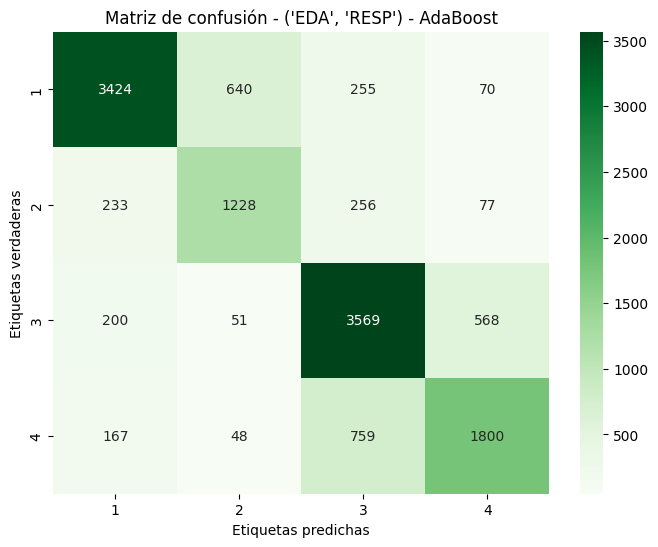

              precision    recall  f1-score   support

           1       0.85      0.78      0.81      4389
           2       0.62      0.68      0.65      1794
           3       0.74      0.81      0.77      4388
           4       0.72      0.65      0.68      2774

    accuracy                           0.75     13345
   macro avg       0.73      0.73      0.73     13345
weighted avg       0.76      0.75      0.75     13345

Training LDA model for ('EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('EDA', 'RESP') - LDA Metrics
     Métrica     Valor                  Etapa
0   Accuracy  0.502885  ('EDA', 'RESP') - LDA
1  Precision  0.496892  ('EDA', 'RESP') - LDA
2     Recall  0.502885  ('EDA', 'RESP') - LDA
3   F1 Score  0.456152  ('EDA', 'RESP') - LDA
[('EDA', 'RESP') - LDA] Best Params: {'solver': 'svd'}
[('EDA', 'RESP') - LDA] Accuracy: 0.5029
('EDA', 'RESP') - LDA - Confusion Matrix
[[3126    7  895  361]
 [ 930   33  602  229]
 [1134    

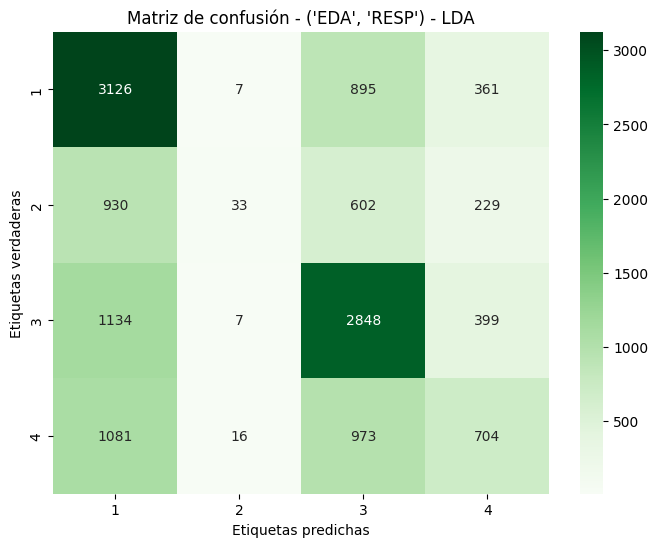

              precision    recall  f1-score   support

           1       0.50      0.71      0.59      4389
           2       0.52      0.02      0.04      1794
           3       0.54      0.65      0.59      4388
           4       0.42      0.25      0.32      2774

    accuracy                           0.50     13345
   macro avg       0.49      0.41      0.38     13345
weighted avg       0.50      0.50      0.46     13345

Training KNN model for ('EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('EDA', 'RESP') - KNN Metrics
     Métrica     Valor                  Etapa
0   Accuracy  0.974372  ('EDA', 'RESP') - KNN
1  Precision  0.974361  ('EDA', 'RESP') - KNN
2     Recall  0.974372  ('EDA', 'RESP') - KNN
3   F1 Score  0.974360  ('EDA', 'RESP') - KNN
[('EDA', 'RESP') - KNN] Best Params: {'n_neighbors': 3, 'weights': 'distance'}
[('EDA', 'RESP') - KNN] Accuracy: 0.9744
('EDA', 'RESP') - KNN - Confusion Matrix
[[4323   23   18   25]
 [  32 1

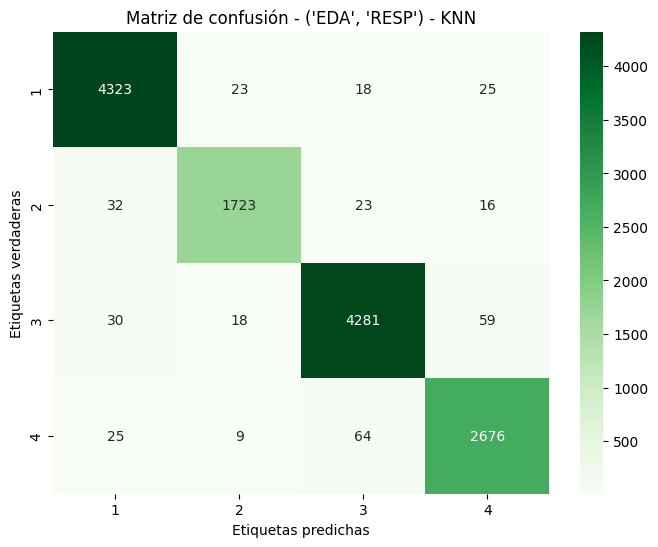

Training by signal combinations:  55%|█████▍    | 6/11 [9:56:21<7:45:54, 5590.84s/it]

              precision    recall  f1-score   support

           1       0.98      0.98      0.98      4389
           2       0.97      0.96      0.97      1794
           3       0.98      0.98      0.98      4388
           4       0.96      0.96      0.96      2774

    accuracy                           0.97     13345
   macro avg       0.97      0.97      0.97     13345
weighted avg       0.97      0.97      0.97     13345

Training DecisionTree model for ('ECG', 'PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('ECG', 'PPG', 'EDA') - DecisionTree Metrics
     Métrica     Valor                                 Etapa
0   Accuracy  0.666842  ('ECG', 'PPG', 'EDA') - DecisionTree
1  Precision  0.700028  ('ECG', 'PPG', 'EDA') - DecisionTree
2     Recall  0.666842  ('ECG', 'PPG', 'EDA') - DecisionTree
3   F1 Score  0.669417  ('ECG', 'PPG', 'EDA') - DecisionTree
[('ECG', 'PPG', 'EDA') - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth

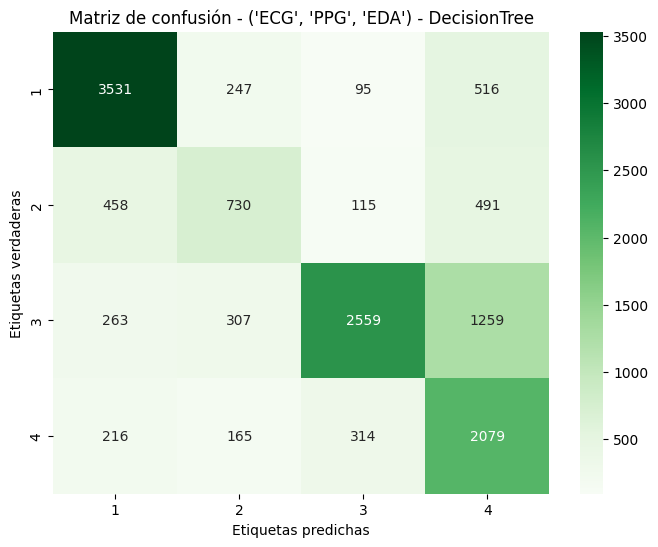

              precision    recall  f1-score   support

           1       0.79      0.80      0.80      4389
           2       0.50      0.41      0.45      1794
           3       0.83      0.58      0.69      4388
           4       0.48      0.75      0.58      2774

    accuracy                           0.67     13345
   macro avg       0.65      0.64      0.63     13345
weighted avg       0.70      0.67      0.67     13345

Training RandomForest model for ('ECG', 'PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('ECG', 'PPG', 'EDA') - RandomForest Metrics
     Métrica     Valor                                 Etapa
0   Accuracy  0.998127  ('ECG', 'PPG', 'EDA') - RandomForest
1  Precision  0.998128  ('ECG', 'PPG', 'EDA') - RandomForest
2     Recall  0.998127  ('ECG', 'PPG', 'EDA') - RandomForest
3   F1 Score  0.998126  ('ECG', 'PPG', 'EDA') - RandomForest
[('ECG', 'PPG', 'EDA') - RandomForest] Best Params: {'max_depth': 20, 'max_features'

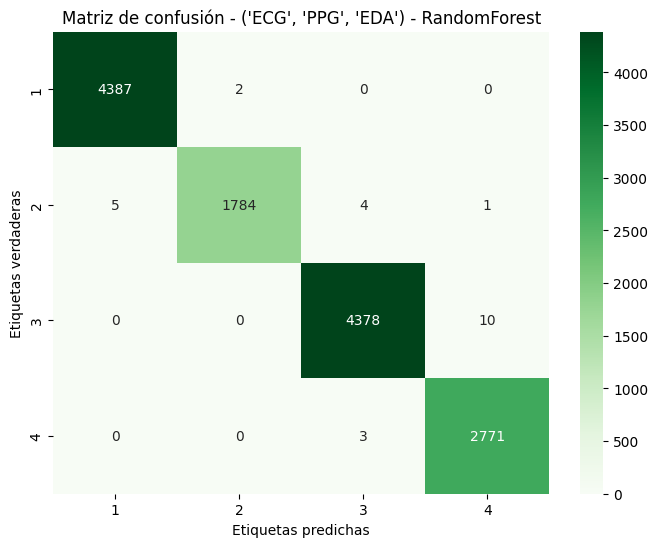

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4389
           2       1.00      0.99      1.00      1794
           3       1.00      1.00      1.00      4388
           4       1.00      1.00      1.00      2774

    accuracy                           1.00     13345
   macro avg       1.00      1.00      1.00     13345
weighted avg       1.00      1.00      1.00     13345

Training AdaBoost model for ('ECG', 'PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('ECG', 'PPG', 'EDA') - AdaBoost Metrics
     Métrica     Valor                             Etapa
0   Accuracy  0.811540  ('ECG', 'PPG', 'EDA') - AdaBoost
1  Precision  0.813371  ('ECG', 'PPG', 'EDA') - AdaBoost
2     Recall  0.811540  ('ECG', 'PPG', 'EDA') - AdaBoost
3   F1 Score  0.812254  ('ECG', 'PPG', 'EDA') - AdaBoost
[('ECG', 'PPG', 'EDA') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanced', max

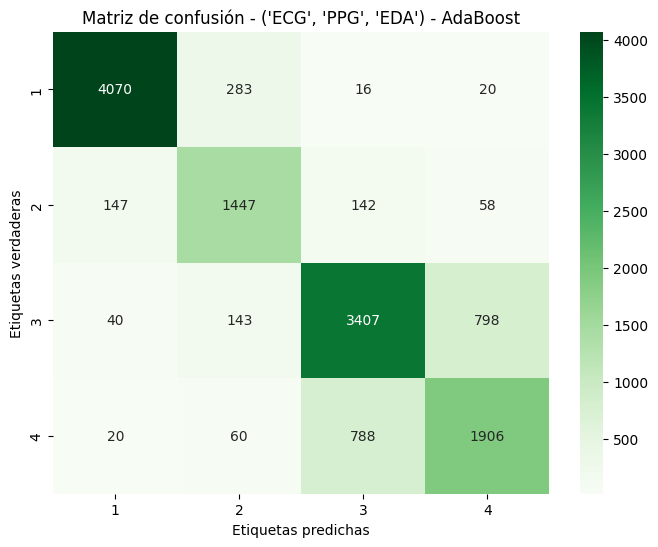

              precision    recall  f1-score   support

           1       0.95      0.93      0.94      4389
           2       0.75      0.81      0.78      1794
           3       0.78      0.78      0.78      4388
           4       0.69      0.69      0.69      2774

    accuracy                           0.81     13345
   macro avg       0.79      0.80      0.80     13345
weighted avg       0.81      0.81      0.81     13345

Training LDA model for ('ECG', 'PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('ECG', 'PPG', 'EDA') - LDA Metrics
     Métrica     Valor                        Etapa
0   Accuracy  0.595354  ('ECG', 'PPG', 'EDA') - LDA
1  Precision  0.568066  ('ECG', 'PPG', 'EDA') - LDA
2     Recall  0.595354  ('ECG', 'PPG', 'EDA') - LDA
3   F1 Score  0.560287  ('ECG', 'PPG', 'EDA') - LDA
[('ECG', 'PPG', 'EDA') - LDA] Best Params: {'solver': 'svd'}
[('ECG', 'PPG', 'EDA') - LDA] Accuracy: 0.5954
('ECG', 'PPG', 'EDA') - LDA - Confusion Mat

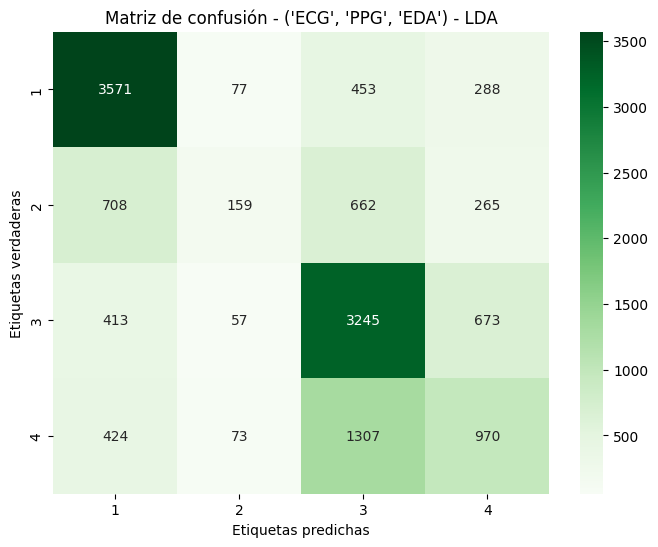

              precision    recall  f1-score   support

           1       0.70      0.81      0.75      4389
           2       0.43      0.09      0.15      1794
           3       0.57      0.74      0.65      4388
           4       0.44      0.35      0.39      2774

    accuracy                           0.60     13345
   macro avg       0.54      0.50      0.48     13345
weighted avg       0.57      0.60      0.56     13345

Training KNN model for ('ECG', 'PPG', 'EDA') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('ECG', 'PPG', 'EDA') - KNN Metrics
     Métrica     Valor                        Etapa
0   Accuracy  0.586737  ('ECG', 'PPG', 'EDA') - KNN
1  Precision  0.582813  ('ECG', 'PPG', 'EDA') - KNN
2     Recall  0.586737  ('ECG', 'PPG', 'EDA') - KNN
3   F1 Score  0.583828  ('ECG', 'PPG', 'EDA') - KNN
[('ECG', 'PPG', 'EDA') - KNN] Best Params: {'n_neighbors': 5, 'weights': 'distance'}
[('ECG', 'PPG', 'EDA') - KNN] Accuracy: 0.5867
('ECG', 'PPG', 'ED

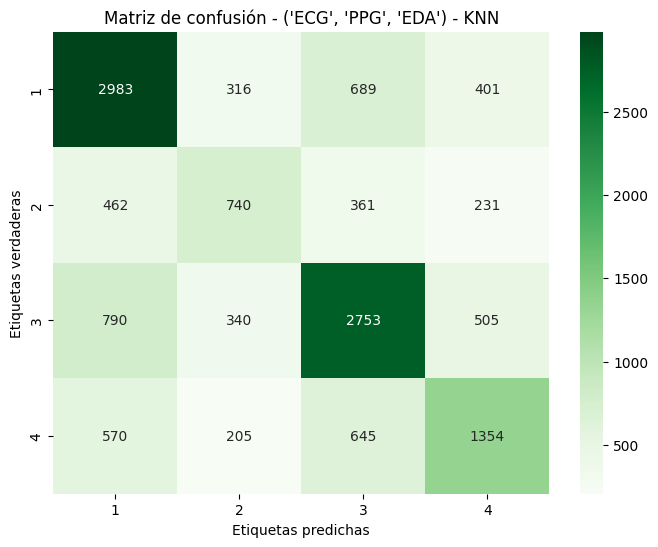

Training by signal combinations:  64%|██████▎   | 7/11 [12:02:30<6:55:49, 6237.44s/it]

              precision    recall  f1-score   support

           1       0.62      0.68      0.65      4389
           2       0.46      0.41      0.44      1794
           3       0.62      0.63      0.62      4388
           4       0.54      0.49      0.51      2774

    accuracy                           0.59     13345
   macro avg       0.56      0.55      0.56     13345
weighted avg       0.58      0.59      0.58     13345

Training DecisionTree model for ('ECG', 'PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('ECG', 'PPG', 'RESP') - DecisionTree Metrics
     Métrica     Valor                                  Etapa
0   Accuracy  0.629149  ('ECG', 'PPG', 'RESP') - DecisionTree
1  Precision  0.678811  ('ECG', 'PPG', 'RESP') - DecisionTree
2     Recall  0.629149  ('ECG', 'PPG', 'RESP') - DecisionTree
3   F1 Score  0.643898  ('ECG', 'PPG', 'RESP') - DecisionTree
[('ECG', 'PPG', 'RESP') - DecisionTree] Best Params: {'criterion': 'gini', 'm

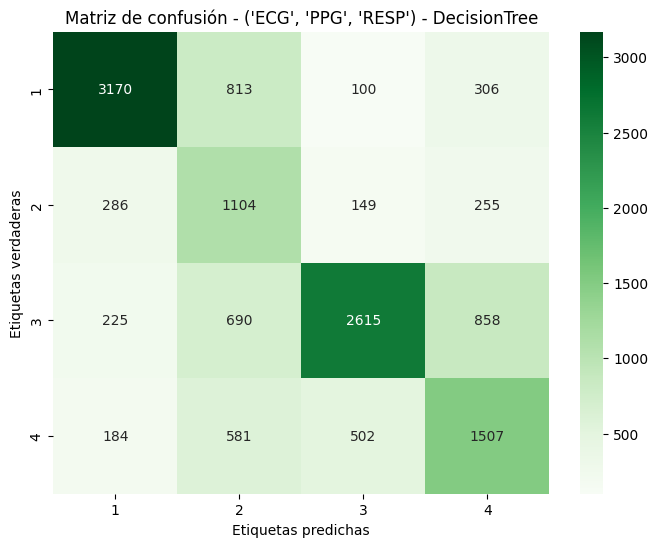

              precision    recall  f1-score   support

           1       0.82      0.72      0.77      4389
           2       0.35      0.62      0.44      1794
           3       0.78      0.60      0.67      4388
           4       0.52      0.54      0.53      2774

    accuracy                           0.63     13345
   macro avg       0.61      0.62      0.60     13345
weighted avg       0.68      0.63      0.64     13345

Training RandomForest model for ('ECG', 'PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('ECG', 'PPG', 'RESP') - RandomForest Metrics
     Métrica     Valor                                  Etapa
0   Accuracy  0.997152  ('ECG', 'PPG', 'RESP') - RandomForest
1  Precision  0.997153  ('ECG', 'PPG', 'RESP') - RandomForest
2     Recall  0.997152  ('ECG', 'PPG', 'RESP') - RandomForest
3   F1 Score  0.997150  ('ECG', 'PPG', 'RESP') - RandomForest
[('ECG', 'PPG', 'RESP') - RandomForest] Best Params: {'max_depth': 20, 'max_f

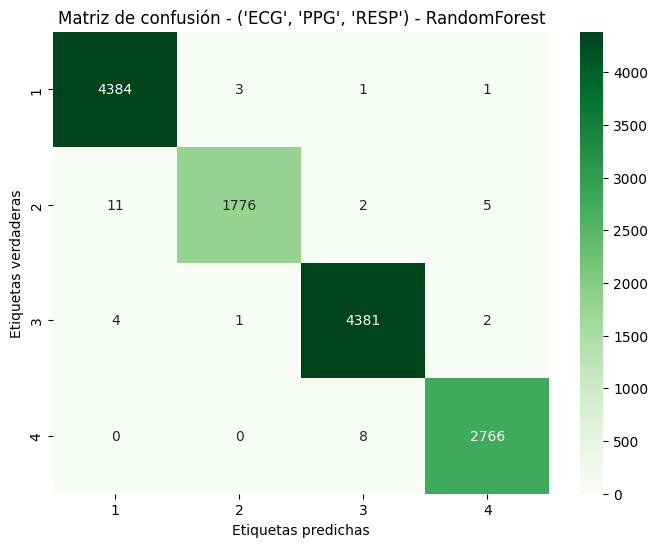

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4389
           2       1.00      0.99      0.99      1794
           3       1.00      1.00      1.00      4388
           4       1.00      1.00      1.00      2774

    accuracy                           1.00     13345
   macro avg       1.00      1.00      1.00     13345
weighted avg       1.00      1.00      1.00     13345

Training AdaBoost model for ('ECG', 'PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('ECG', 'PPG', 'RESP') - AdaBoost Metrics
     Métrica     Valor                              Etapa
0   Accuracy  0.828400  ('ECG', 'PPG', 'RESP') - AdaBoost
1  Precision  0.832348  ('ECG', 'PPG', 'RESP') - AdaBoost
2     Recall  0.828400  ('ECG', 'PPG', 'RESP') - AdaBoost
3   F1 Score  0.829874  ('ECG', 'PPG', 'RESP') - AdaBoost
[('ECG', 'PPG', 'RESP') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanc

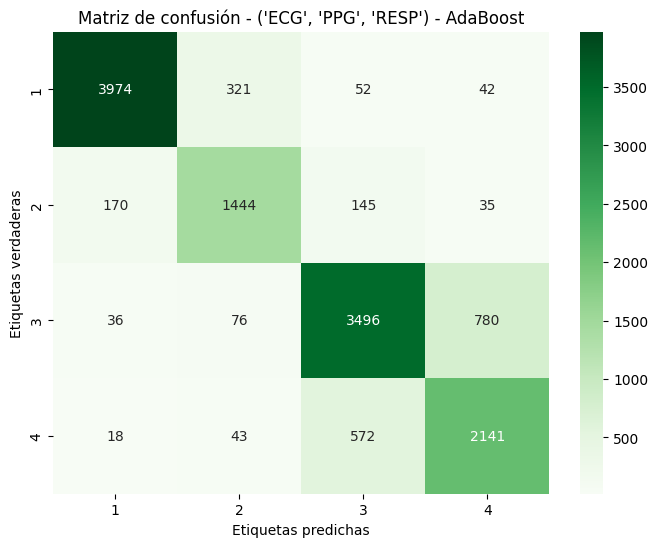

              precision    recall  f1-score   support

           1       0.95      0.91      0.93      4389
           2       0.77      0.80      0.79      1794
           3       0.82      0.80      0.81      4388
           4       0.71      0.77      0.74      2774

    accuracy                           0.83     13345
   macro avg       0.81      0.82      0.82     13345
weighted avg       0.83      0.83      0.83     13345

Training LDA model for ('ECG', 'PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('ECG', 'PPG', 'RESP') - LDA Metrics
     Métrica     Valor                         Etapa
0   Accuracy  0.605245  ('ECG', 'PPG', 'RESP') - LDA
1  Precision  0.575750  ('ECG', 'PPG', 'RESP') - LDA
2     Recall  0.605245  ('ECG', 'PPG', 'RESP') - LDA
3   F1 Score  0.575536  ('ECG', 'PPG', 'RESP') - LDA
[('ECG', 'PPG', 'RESP') - LDA] Best Params: {'solver': 'svd'}
[('ECG', 'PPG', 'RESP') - LDA] Accuracy: 0.6052
('ECG', 'PPG', 'RESP') - LDA - Con

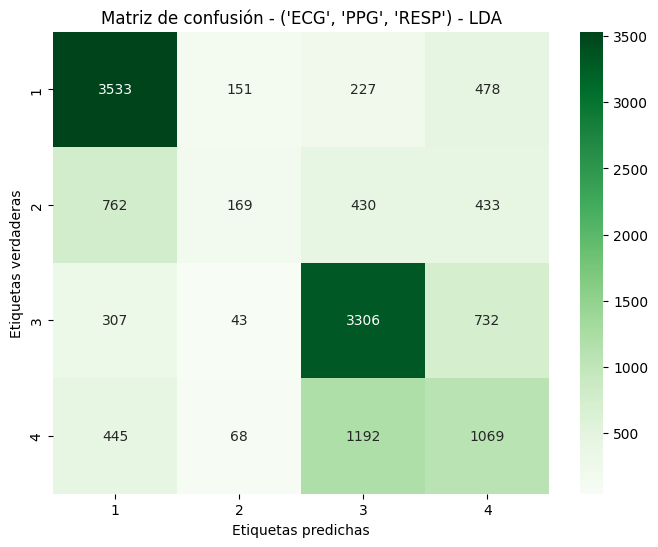

              precision    recall  f1-score   support

           1       0.70      0.80      0.75      4389
           2       0.39      0.09      0.15      1794
           3       0.64      0.75      0.69      4388
           4       0.39      0.39      0.39      2774

    accuracy                           0.61     13345
   macro avg       0.53      0.51      0.50     13345
weighted avg       0.58      0.61      0.58     13345

Training KNN model for ('ECG', 'PPG', 'RESP') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('ECG', 'PPG', 'RESP') - KNN Metrics
     Métrica     Valor                         Etapa
0   Accuracy  0.565081  ('ECG', 'PPG', 'RESP') - KNN
1  Precision  0.561556  ('ECG', 'PPG', 'RESP') - KNN
2     Recall  0.565081  ('ECG', 'PPG', 'RESP') - KNN
3   F1 Score  0.562416  ('ECG', 'PPG', 'RESP') - KNN
[('ECG', 'PPG', 'RESP') - KNN] Best Params: {'n_neighbors': 5, 'weights': 'distance'}
[('ECG', 'PPG', 'RESP') - KNN] Accuracy: 0.5651
('ECG', '

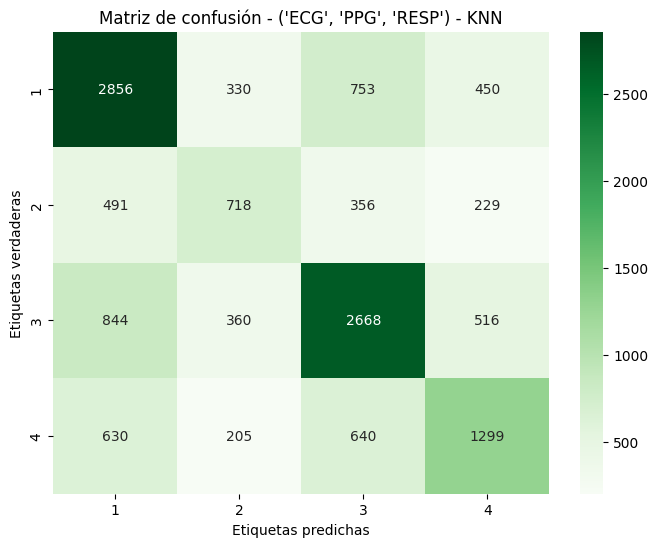

Training by signal combinations:  73%|███████▎  | 8/11 [14:07:01<5:31:30, 6630.10s/it]

              precision    recall  f1-score   support

           1       0.59      0.65      0.62      4389
           2       0.45      0.40      0.42      1794
           3       0.60      0.61      0.61      4388
           4       0.52      0.47      0.49      2774

    accuracy                           0.57     13345
   macro avg       0.54      0.53      0.54     13345
weighted avg       0.56      0.57      0.56     13345

Training DecisionTree model for ('ECG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('ECG', 'EDA', 'RESP') - DecisionTree Metrics
     Métrica     Valor                                  Etapa
0   Accuracy  0.614612  ('ECG', 'EDA', 'RESP') - DecisionTree
1  Precision  0.631464  ('ECG', 'EDA', 'RESP') - DecisionTree
2     Recall  0.614612  ('ECG', 'EDA', 'RESP') - DecisionTree
3   F1 Score  0.617542  ('ECG', 'EDA', 'RESP') - DecisionTree
[('ECG', 'EDA', 'RESP') - DecisionTree] Best Params: {'criterion': 'gini', 'm

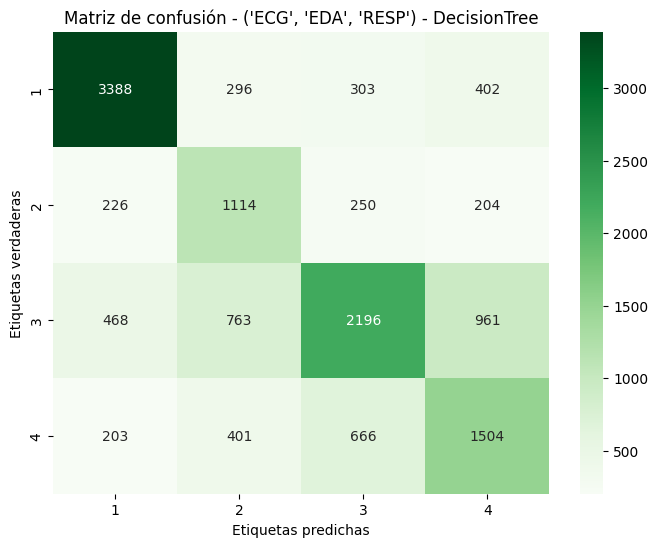

              precision    recall  f1-score   support

           1       0.79      0.77      0.78      4389
           2       0.43      0.62      0.51      1794
           3       0.64      0.50      0.56      4388
           4       0.49      0.54      0.51      2774

    accuracy                           0.61     13345
   macro avg       0.59      0.61      0.59     13345
weighted avg       0.63      0.61      0.62     13345

Training RandomForest model for ('ECG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('ECG', 'EDA', 'RESP') - RandomForest Metrics
     Métrica     Valor                                  Etapa
0   Accuracy  0.998501  ('ECG', 'EDA', 'RESP') - RandomForest
1  Precision  0.998502  ('ECG', 'EDA', 'RESP') - RandomForest
2     Recall  0.998501  ('ECG', 'EDA', 'RESP') - RandomForest
3   F1 Score  0.998501  ('ECG', 'EDA', 'RESP') - RandomForest
[('ECG', 'EDA', 'RESP') - RandomForest] Best Params: {'max_depth': 20, 'max_f

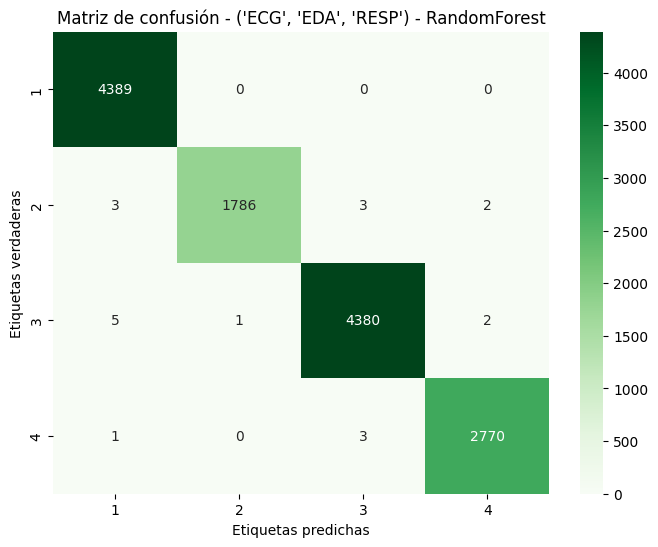

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4389
           2       1.00      1.00      1.00      1794
           3       1.00      1.00      1.00      4388
           4       1.00      1.00      1.00      2774

    accuracy                           1.00     13345
   macro avg       1.00      1.00      1.00     13345
weighted avg       1.00      1.00      1.00     13345

Training AdaBoost model for ('ECG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('ECG', 'EDA', 'RESP') - AdaBoost Metrics
     Métrica     Valor                              Etapa
0   Accuracy  0.811465  ('ECG', 'EDA', 'RESP') - AdaBoost
1  Precision  0.816758  ('ECG', 'EDA', 'RESP') - AdaBoost
2     Recall  0.811465  ('ECG', 'EDA', 'RESP') - AdaBoost
3   F1 Score  0.813311  ('ECG', 'EDA', 'RESP') - AdaBoost
[('ECG', 'EDA', 'RESP') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanc

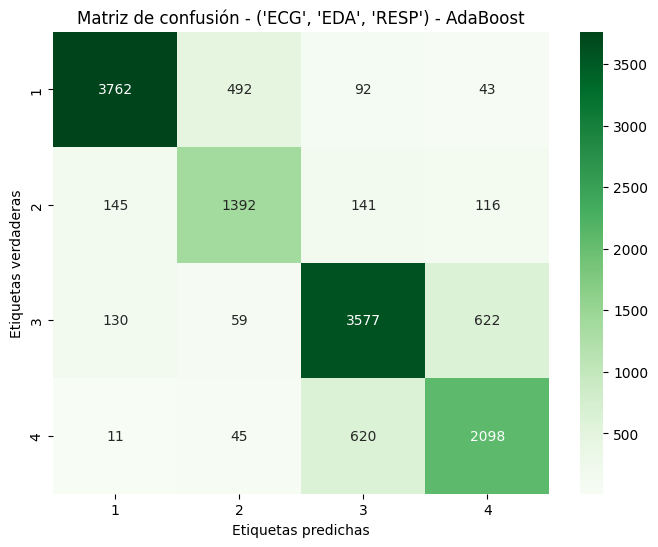

              precision    recall  f1-score   support

           1       0.93      0.86      0.89      4389
           2       0.70      0.78      0.74      1794
           3       0.81      0.82      0.81      4388
           4       0.73      0.76      0.74      2774

    accuracy                           0.81     13345
   macro avg       0.79      0.80      0.80     13345
weighted avg       0.82      0.81      0.81     13345

Training LDA model for ('ECG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('ECG', 'EDA', 'RESP') - LDA Metrics
     Métrica     Valor                         Etapa
0   Accuracy  0.531660  ('ECG', 'EDA', 'RESP') - LDA
1  Precision  0.509843  ('ECG', 'EDA', 'RESP') - LDA
2     Recall  0.531660  ('ECG', 'EDA', 'RESP') - LDA
3   F1 Score  0.490538  ('ECG', 'EDA', 'RESP') - LDA
[('ECG', 'EDA', 'RESP') - LDA] Best Params: {'solver': 'svd'}
[('ECG', 'EDA', 'RESP') - LDA] Accuracy: 0.5317
('ECG', 'EDA', 'RESP') - LDA - Con

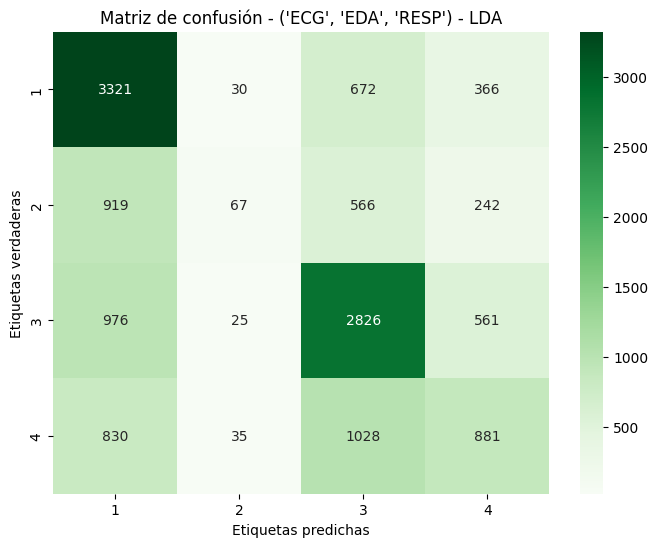

              precision    recall  f1-score   support

           1       0.55      0.76      0.64      4389
           2       0.43      0.04      0.07      1794
           3       0.55      0.64      0.60      4388
           4       0.43      0.32      0.37      2774

    accuracy                           0.53     13345
   macro avg       0.49      0.44      0.42     13345
weighted avg       0.51      0.53      0.49     13345

Training KNN model for ('ECG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('ECG', 'EDA', 'RESP') - KNN Metrics
     Métrica     Valor                         Etapa
0   Accuracy  0.586212  ('ECG', 'EDA', 'RESP') - KNN
1  Precision  0.582349  ('ECG', 'EDA', 'RESP') - KNN
2     Recall  0.586212  ('ECG', 'EDA', 'RESP') - KNN
3   F1 Score  0.583383  ('ECG', 'EDA', 'RESP') - KNN
[('ECG', 'EDA', 'RESP') - KNN] Best Params: {'n_neighbors': 5, 'weights': 'distance'}
[('ECG', 'EDA', 'RESP') - KNN] Accuracy: 0.5862
('ECG', '

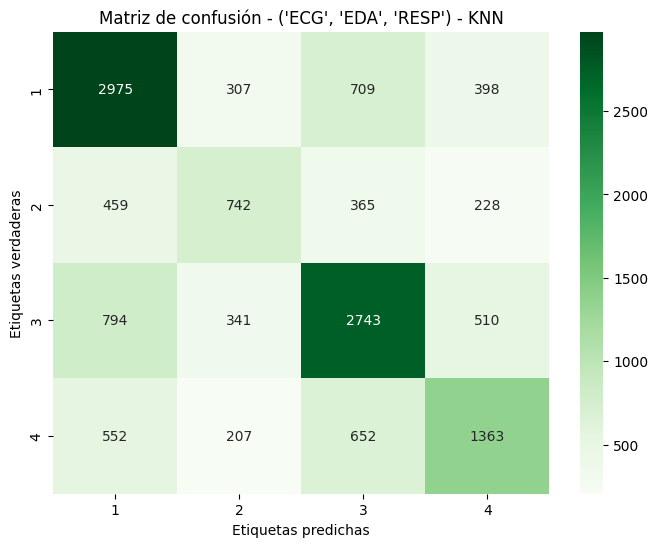

Training by signal combinations:  82%|████████▏ | 9/11 [16:00:31<3:42:52, 6686.42s/it]

              precision    recall  f1-score   support

           1       0.62      0.68      0.65      4389
           2       0.46      0.41      0.44      1794
           3       0.61      0.63      0.62      4388
           4       0.55      0.49      0.52      2774

    accuracy                           0.59     13345
   macro avg       0.56      0.55      0.56     13345
weighted avg       0.58      0.59      0.58     13345

Training DecisionTree model for ('PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('PPG', 'EDA', 'RESP') - DecisionTree Metrics
     Métrica     Valor                                  Etapa
0   Accuracy  0.649532  ('PPG', 'EDA', 'RESP') - DecisionTree
1  Precision  0.700319  ('PPG', 'EDA', 'RESP') - DecisionTree
2     Recall  0.649532  ('PPG', 'EDA', 'RESP') - DecisionTree
3   F1 Score  0.656334  ('PPG', 'EDA', 'RESP') - DecisionTree
[('PPG', 'EDA', 'RESP') - DecisionTree] Best Params: {'criterion': 'entropy',

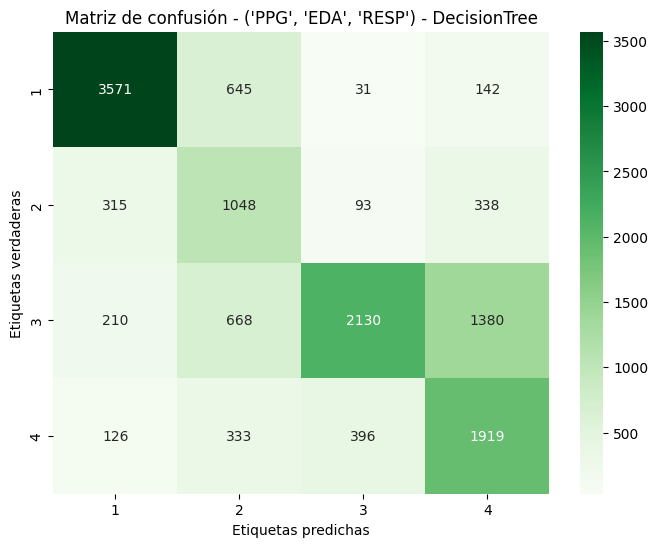

              precision    recall  f1-score   support

           1       0.85      0.81      0.83      4389
           2       0.39      0.58      0.47      1794
           3       0.80      0.49      0.61      4388
           4       0.51      0.69      0.59      2774

    accuracy                           0.65     13345
   macro avg       0.64      0.64      0.62     13345
weighted avg       0.70      0.65      0.66     13345

Training RandomForest model for ('PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('PPG', 'EDA', 'RESP') - RandomForest Metrics
     Métrica     Valor                                  Etapa
0   Accuracy  0.999101  ('PPG', 'EDA', 'RESP') - RandomForest
1  Precision  0.999101  ('PPG', 'EDA', 'RESP') - RandomForest
2     Recall  0.999101  ('PPG', 'EDA', 'RESP') - RandomForest
3   F1 Score  0.999101  ('PPG', 'EDA', 'RESP') - RandomForest
[('PPG', 'EDA', 'RESP') - RandomForest] Best Params: {'max_depth': 20, 'max_f

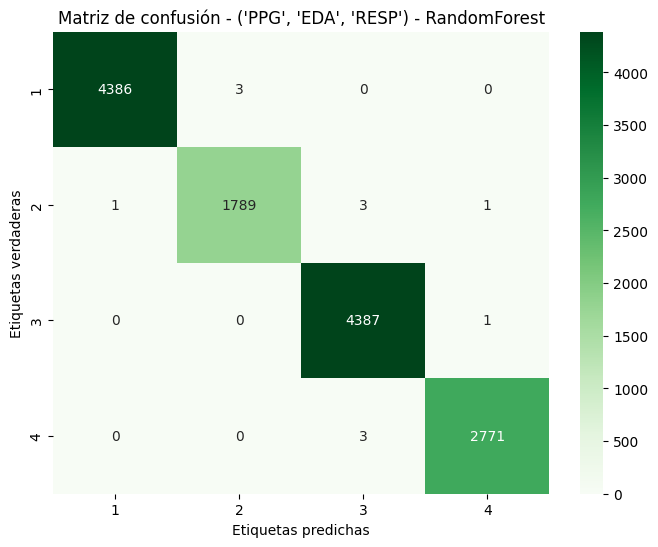

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4389
           2       1.00      1.00      1.00      1794
           3       1.00      1.00      1.00      4388
           4       1.00      1.00      1.00      2774

    accuracy                           1.00     13345
   macro avg       1.00      1.00      1.00     13345
weighted avg       1.00      1.00      1.00     13345

Training AdaBoost model for ('PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('PPG', 'EDA', 'RESP') - AdaBoost Metrics
     Métrica     Valor                              Etapa
0   Accuracy  0.826227  ('PPG', 'EDA', 'RESP') - AdaBoost
1  Precision  0.834079  ('PPG', 'EDA', 'RESP') - AdaBoost
2     Recall  0.826227  ('PPG', 'EDA', 'RESP') - AdaBoost
3   F1 Score  0.828747  ('PPG', 'EDA', 'RESP') - AdaBoost
[('PPG', 'EDA', 'RESP') - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(class_weight='balanc

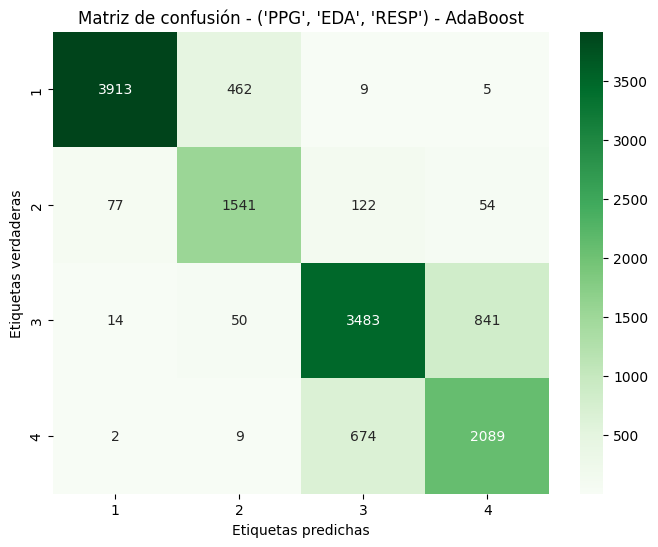

              precision    recall  f1-score   support

           1       0.98      0.89      0.93      4389
           2       0.75      0.86      0.80      1794
           3       0.81      0.79      0.80      4388
           4       0.70      0.75      0.72      2774

    accuracy                           0.83     13345
   macro avg       0.81      0.82      0.81     13345
weighted avg       0.83      0.83      0.83     13345

Training LDA model for ('PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('PPG', 'EDA', 'RESP') - LDA Metrics
     Métrica     Valor                         Etapa
0   Accuracy  0.617685  ('PPG', 'EDA', 'RESP') - LDA
1  Precision  0.595606  ('PPG', 'EDA', 'RESP') - LDA
2     Recall  0.617685  ('PPG', 'EDA', 'RESP') - LDA
3   F1 Score  0.587590  ('PPG', 'EDA', 'RESP') - LDA
[('PPG', 'EDA', 'RESP') - LDA] Best Params: {'solver': 'svd'}
[('PPG', 'EDA', 'RESP') - LDA] Accuracy: 0.6177
('PPG', 'EDA', 'RESP') - LDA - Con

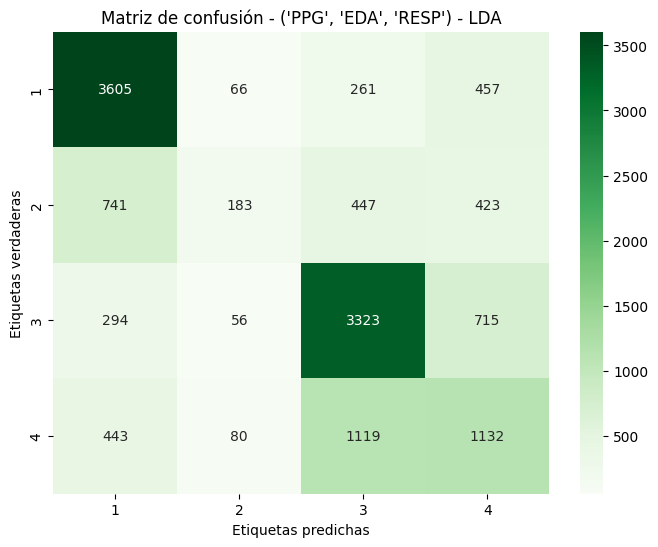

              precision    recall  f1-score   support

           1       0.71      0.82      0.76      4389
           2       0.48      0.10      0.17      1794
           3       0.65      0.76      0.70      4388
           4       0.42      0.41      0.41      2774

    accuracy                           0.62     13345
   macro avg       0.56      0.52      0.51     13345
weighted avg       0.60      0.62      0.59     13345

Training KNN model for ('PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('PPG', 'EDA', 'RESP') - KNN Metrics
     Métrica     Valor                         Etapa
0   Accuracy  0.990408  ('PPG', 'EDA', 'RESP') - KNN
1  Precision  0.990407  ('PPG', 'EDA', 'RESP') - KNN
2     Recall  0.990408  ('PPG', 'EDA', 'RESP') - KNN
3   F1 Score  0.990408  ('PPG', 'EDA', 'RESP') - KNN
[('PPG', 'EDA', 'RESP') - KNN] Best Params: {'n_neighbors': 3, 'weights': 'distance'}
[('PPG', 'EDA', 'RESP') - KNN] Accuracy: 0.9904
('PPG', '

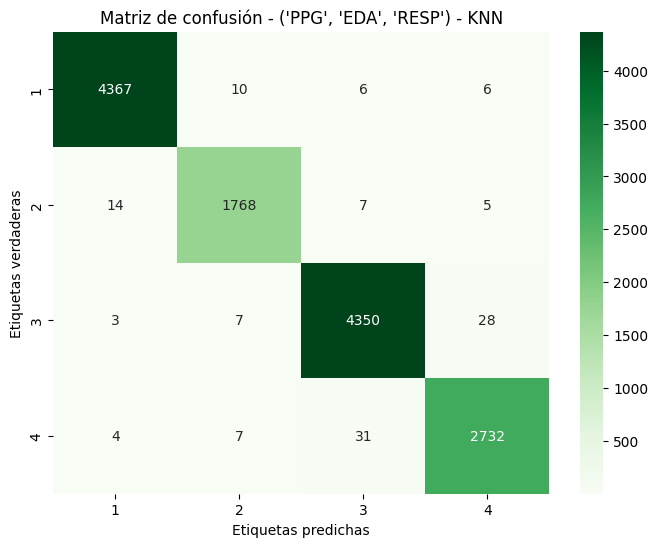

Training by signal combinations:  91%|█████████ | 10/11 [17:55:09<1:52:25, 6745.36s/it]

              precision    recall  f1-score   support

           1       1.00      0.99      1.00      4389
           2       0.99      0.99      0.99      1794
           3       0.99      0.99      0.99      4388
           4       0.99      0.98      0.99      2774

    accuracy                           0.99     13345
   macro avg       0.99      0.99      0.99     13345
weighted avg       0.99      0.99      0.99     13345

Training DecisionTree model for ('ECG', 'PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 120 candidates, totalling 600 fits
('ECG', 'PPG', 'EDA', 'RESP') - DecisionTree Metrics
     Métrica     Valor                                         Etapa
0   Accuracy  0.662121  ('ECG', 'PPG', 'EDA', 'RESP') - DecisionTree
1  Precision  0.701403  ('ECG', 'PPG', 'EDA', 'RESP') - DecisionTree
2     Recall  0.662121  ('ECG', 'PPG', 'EDA', 'RESP') - DecisionTree
3   F1 Score  0.668136  ('ECG', 'PPG', 'EDA', 'RESP') - DecisionTree
[('ECG', 'PPG', 'EDA', 'RESP

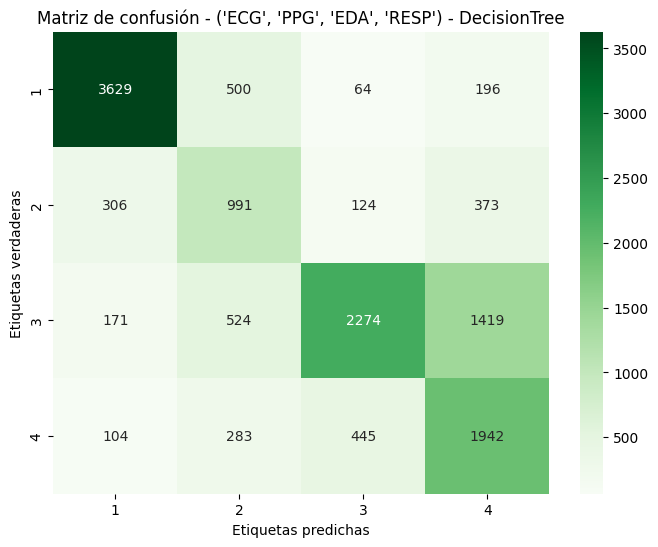

              precision    recall  f1-score   support

           1       0.86      0.83      0.84      4389
           2       0.43      0.55      0.48      1794
           3       0.78      0.52      0.62      4388
           4       0.49      0.70      0.58      2774

    accuracy                           0.66     13345
   macro avg       0.64      0.65      0.63     13345
weighted avg       0.70      0.66      0.67     13345

Training RandomForest model for ('ECG', 'PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 192 candidates, totalling 960 fits
('ECG', 'PPG', 'EDA', 'RESP') - RandomForest Metrics
     Métrica     Valor                                         Etapa
0   Accuracy  0.999026  ('ECG', 'PPG', 'EDA', 'RESP') - RandomForest
1  Precision  0.999026  ('ECG', 'PPG', 'EDA', 'RESP') - RandomForest
2     Recall  0.999026  ('ECG', 'PPG', 'EDA', 'RESP') - RandomForest
3   F1 Score  0.999026  ('ECG', 'PPG', 'EDA', 'RESP') - RandomForest
[('ECG', 'PPG', 'EDA', 'RESP

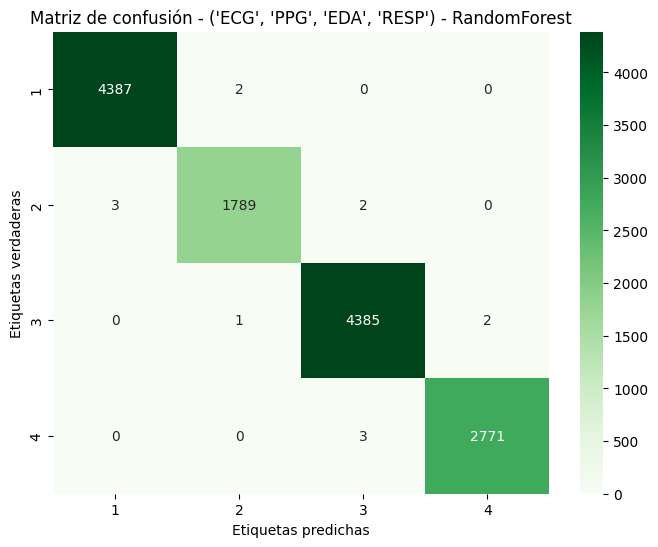

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      4389
           2       1.00      1.00      1.00      1794
           3       1.00      1.00      1.00      4388
           4       1.00      1.00      1.00      2774

    accuracy                           1.00     13345
   macro avg       1.00      1.00      1.00     13345
weighted avg       1.00      1.00      1.00     13345

Training AdaBoost model for ('ECG', 'PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
('ECG', 'PPG', 'EDA', 'RESP') - AdaBoost Metrics
     Métrica     Valor                                     Etapa
0   Accuracy  0.830199  ('ECG', 'PPG', 'EDA', 'RESP') - AdaBoost
1  Precision  0.832783  ('ECG', 'PPG', 'EDA', 'RESP') - AdaBoost
2     Recall  0.830199  ('ECG', 'PPG', 'EDA', 'RESP') - AdaBoost
3   F1 Score  0.830476  ('ECG', 'PPG', 'EDA', 'RESP') - AdaBoost
[('ECG', 'PPG', 'EDA', 'RESP') - AdaBoost] Best Params: {

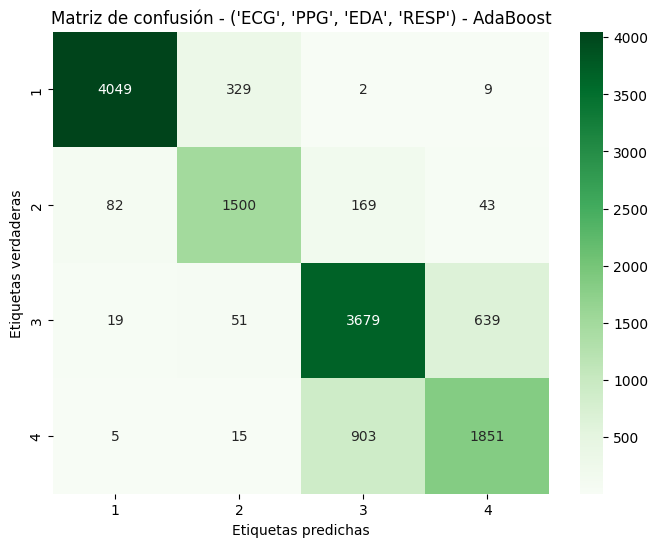

              precision    recall  f1-score   support

           1       0.97      0.92      0.95      4389
           2       0.79      0.84      0.81      1794
           3       0.77      0.84      0.80      4388
           4       0.73      0.67      0.70      2774

    accuracy                           0.83     13345
   macro avg       0.82      0.82      0.82     13345
weighted avg       0.83      0.83      0.83     13345

Training LDA model for ('ECG', 'PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
('ECG', 'PPG', 'EDA', 'RESP') - LDA Metrics
     Métrica     Valor                                Etapa
0   Accuracy  0.629449  ('ECG', 'PPG', 'EDA', 'RESP') - LDA
1  Precision  0.610578  ('ECG', 'PPG', 'EDA', 'RESP') - LDA
2     Recall  0.629449  ('ECG', 'PPG', 'EDA', 'RESP') - LDA
3   F1 Score  0.604154  ('ECG', 'PPG', 'EDA', 'RESP') - LDA
[('ECG', 'PPG', 'EDA', 'RESP') - LDA] Best Params: {'solver': 'svd'}
[('ECG', 'PPG', 'EDA', 'RE

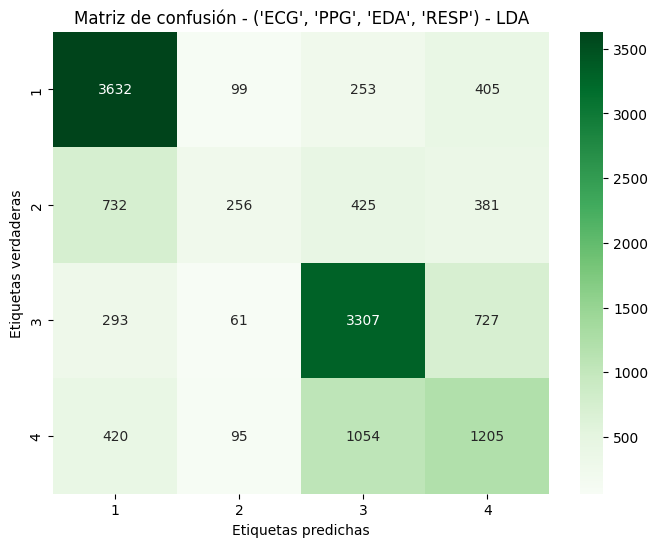

              precision    recall  f1-score   support

           1       0.72      0.83      0.77      4389
           2       0.50      0.14      0.22      1794
           3       0.66      0.75      0.70      4388
           4       0.44      0.43      0.44      2774

    accuracy                           0.63     13345
   macro avg       0.58      0.54      0.53     13345
weighted avg       0.61      0.63      0.60     13345

Training KNN model for ('ECG', 'PPG', 'EDA', 'RESP') using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
('ECG', 'PPG', 'EDA', 'RESP') - KNN Metrics
     Métrica     Valor                                Etapa
0   Accuracy  0.589809  ('ECG', 'PPG', 'EDA', 'RESP') - KNN
1  Precision  0.586069  ('ECG', 'PPG', 'EDA', 'RESP') - KNN
2     Recall  0.589809  ('ECG', 'PPG', 'EDA', 'RESP') - KNN
3   F1 Score  0.587023  ('ECG', 'PPG', 'EDA', 'RESP') - KNN
[('ECG', 'PPG', 'EDA', 'RESP') - KNN] Best Params: {'n_neighbors': 5, 'weights': 'distance'}
[

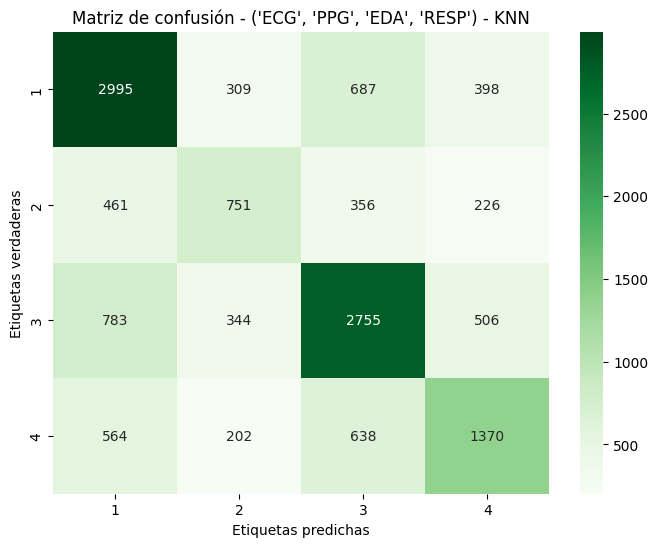

Training by signal combinations: 100%|██████████| 11/11 [20:14:17<00:00, 6623.37s/it]  

              precision    recall  f1-score   support

           1       0.62      0.68      0.65      4389
           2       0.47      0.42      0.44      1794
           3       0.62      0.63      0.62      4388
           4       0.55      0.49      0.52      2774

    accuracy                           0.59     13345
   macro avg       0.57      0.56      0.56     13345
weighted avg       0.59      0.59      0.59     13345


Final Comparison:
('ECG', 'PPG') - DecisionTree:
     Métrica     Valor                          Etapa
0   Accuracy  0.588985  ('ECG', 'PPG') - DecisionTree
1  Precision  0.670306  ('ECG', 'PPG') - DecisionTree
2     Recall  0.588985  ('ECG', 'PPG') - DecisionTree
3   F1 Score  0.612152  ('ECG', 'PPG') - DecisionTree
('ECG', 'PPG') - RandomForest:
     Métrica     Valor                          Etapa
0   Accuracy  0.990259  ('ECG', 'PPG') - RandomForest
1  Precision  0.990265  ('ECG', 'PPG') - RandomForest
2     Recall  0.990259  ('ECG', 'PPG') - RandomFores

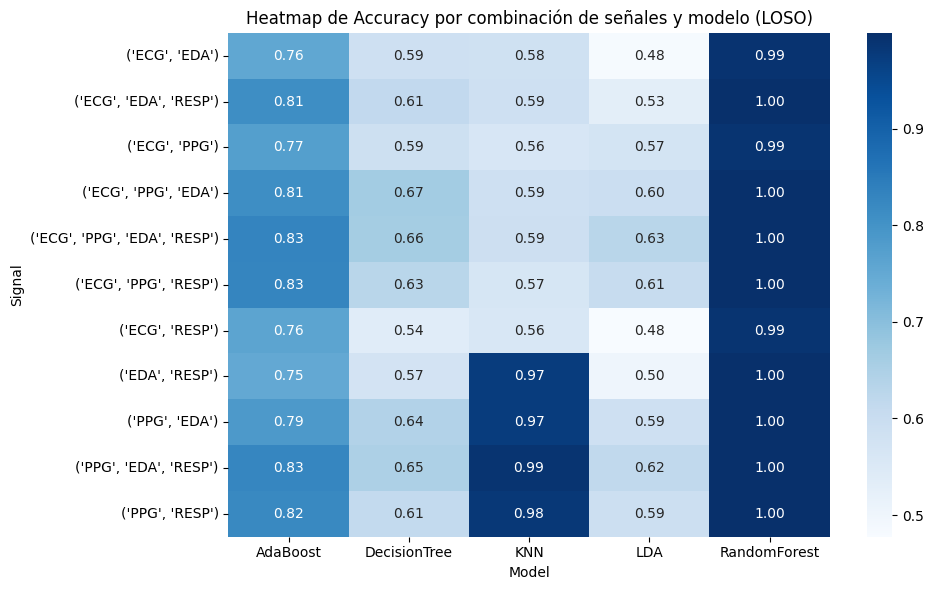

c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: 
The palette list has fewer values (9) than needed (11) and will cycle, which may produce an uninterpretable plot.
  func(*plot_args, **plot_kwargs)
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: 
The palette list has fewer values (9) than needed (11) and will cycle, which may produce an uninterpretable plot.
  func(*plot_args, **plot_kwargs)
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: 
The palette list has fewer values (9) than needed (11) and will cycle, which may produce an uninterpretable plot.
  func(*plot_args, **plot_kwargs)
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: 
The palette list has fewer values (9) than needed (11) and will cycle, which may produce an uninterpretable plot.
  func(*plot_args, **plot_kwargs)
C:\Users\Gustavo\AppData\Local\Temp\ipyk

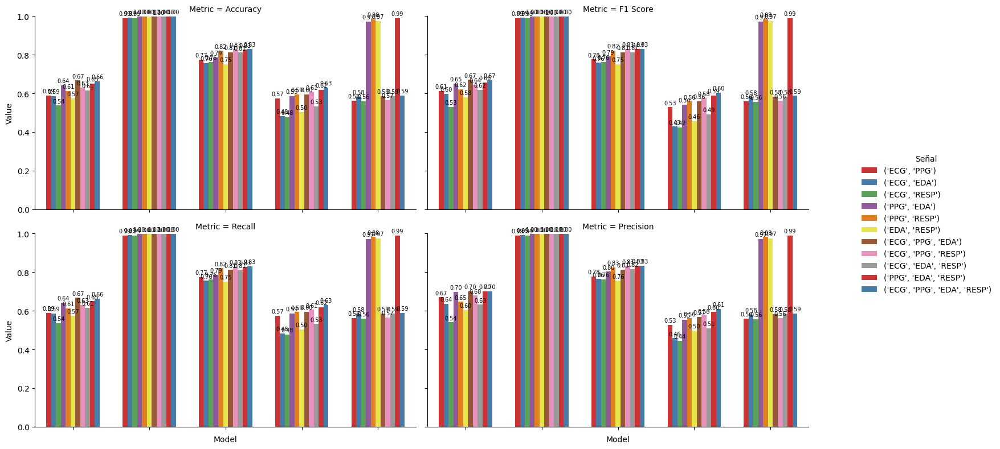

In [ ]:
for combo in tqdm(combinations, desc="Training by signal combinations"):
    features = sum([SIGNAL_CATEGORIES[signal] for signal in combo], [])
    if all(f in df.columns for f in features):# Verificar que todas las columnas existen
        X = df[features].values
        y = df['label'].values
        subjects = df['subject'].values # Se agrega el identificador de sujetos para LOSO

        for model_name, (model, param_grid) in models.items():
            print(f'Training {model_name} model for {combo} using LOSO...')
            metrics = train_and_evaluate_logo(X, y, subjects, model, param_grid, model_name, combo)
        
            # Convertir diccionario de métricas a DataFrame con mismo formato que antes
            results[(combo, model_name)] = metrics.copy()

# Mostrar resultados finales
print("\nFinal Comparison:")
for (combo, model_name), acc in results.items():
    print(f'{combo} - {model_name}:')
    print(acc)

# Crear heatmap
rows = []
for (combo, model), df_metrics in results.items():
    metric_values = df_metrics.set_index('Métrica')['Valor']

    row = {
    'Signal': combo,
    'Model': model,
    'Accuracy': metric_values.get('Accuracy', None),
    'F1': metric_values.get('F1 Score', None),
    'Precision': metric_values.get('Precision', None),
    'Recall': metric_values.get('Recall', None)
    }
    rows.append(row)

metrics_df = pd.DataFrame(rows)

pivot_df = metrics_df.pivot(index='Signal', columns='Model', values='Accuracy')
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_df, annot=True, cmap="Blues", fmt=".2f")
plt.title('Heatmap de Accuracy por combinación de señales y modelo (LOSO)')
plt.tight_layout()
plt.show()

data = []
metrics = ["Accuracy", "F1 Score", "Recall", "Precision"]

for (combo, model), df in results.items():
    for metric in metrics:
        row = df[df["Métrica"] == metric]
        if not row.empty:
            value = row["Valor"].values[0]
            data.append((combo, model, metric, value))

df_all = pd.DataFrame(data, columns=["Signal", "Model", "Metric", "Value"])

# Paleta bonita
palette = sns.color_palette("Set1")

# Hacer el FacetGrid
g = sns.FacetGrid(df_all, col="Metric", sharey=True, col_wrap=2, height=4, aspect=1.5)
g.map_dataframe(sns.barplot, x="Model", y="Value", hue="Signal", palette=palette, width=0.7, dodge=True)

# Ajustes para la leyenda
g.add_legend(title="Señal", bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0)

# Añadir etiquetas de valores
for ax in g.axes.flatten():
    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", label_type="edge", fontsize=7, padding=2)
    ax.set_ylim(0, 1)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

In [ ]:
print(wa)

NameError: name 'wa' is not defined

Training by signal:   0%|          | 0/4 [00:00<?, ?it/s]

Training DecisionTree model for ECG...
Fitting 5 folds for each of 90 candidates, totalling 450 fits
ECG - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.426637  ECG - DecisionTree
1  Precision  0.524099  ECG - DecisionTree
2     Recall  0.426637  ECG - DecisionTree
3   F1 Score  0.356113  ECG - DecisionTree
[ECG - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 10, 'min_samples_split': 2}
[ECG - DecisionTree] Accuracy: 0.4266
ECG - DecisionTree - Confusion Matrix
[[6270   15  231   67]
 [2297  230  114   51]
 [4466  228 1473  415]
 [3266   78  249  567]]


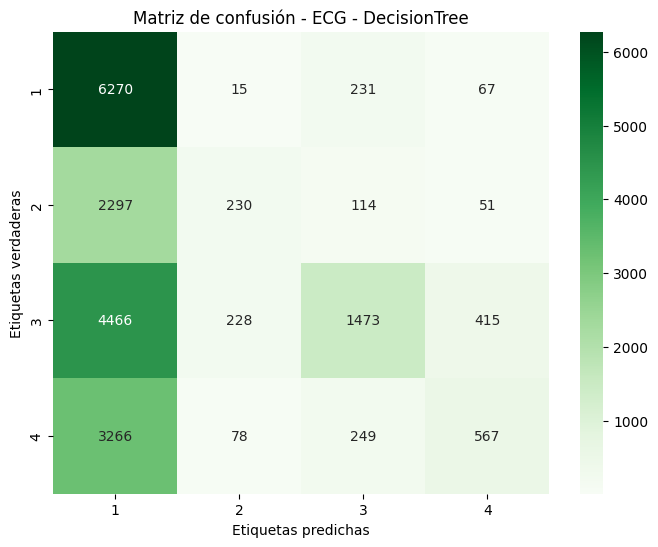

              precision    recall  f1-score   support

           1       0.38      0.95      0.55      6583
           2       0.42      0.09      0.14      2692
           3       0.71      0.22      0.34      6582
           4       0.52      0.14      0.22      4160

    accuracy                           0.43     20017
   macro avg       0.51      0.35      0.31     20017
weighted avg       0.52      0.43      0.36     20017

Training RandomForest model for ECG...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
ECG - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.942499  ECG - RandomForest
1  Precision  0.943431  ECG - RandomForest
2     Recall  0.942499  ECG - RandomForest
3   F1 Score  0.942231  ECG - RandomForest
[ECG - RandomForest] Best Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
[ECG - RandomForest] Accuracy: 0.9425
ECG - RandomForest - Confusion Matrix
[[6393   21  114   55]
 [ 203 2322  127   40]
 

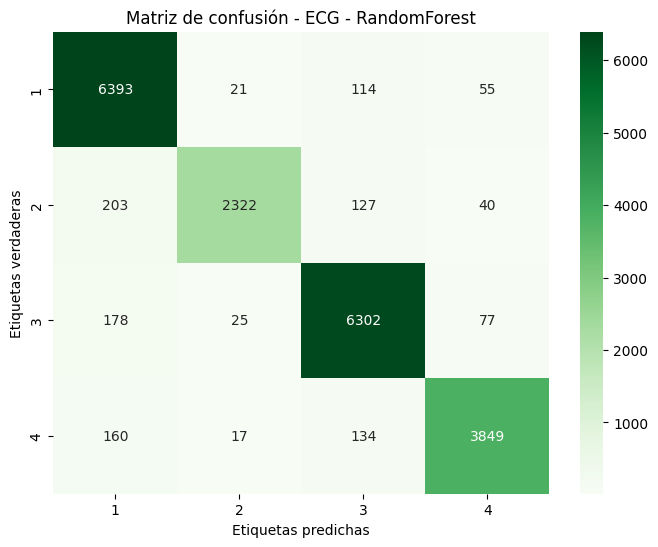

              precision    recall  f1-score   support

           1       0.92      0.97      0.95      6583
           2       0.97      0.86      0.91      2692
           3       0.94      0.96      0.95      6582
           4       0.96      0.93      0.94      4160

    accuracy                           0.94     20017
   macro avg       0.95      0.93      0.94     20017
weighted avg       0.94      0.94      0.94     20017

Training AdaBoost model for ECG...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
ECG - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.586152  ECG - AdaBoost
1  Precision  0.581555  ECG - AdaBoost
2     Recall  0.586152  ECG - AdaBoost
3   F1 Score  0.580388  ECG - AdaBoost
[ECG - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(max_depth=3), 'learning_rate': 0.5, 'n_estimators': 300}
[ECG - AdaBoost] Accuracy: 0.5862
ECG - AdaBoost - Confusion Matrix
[[4478  615  995  495]
 [ 947  885  631  229]
 [1388  285 

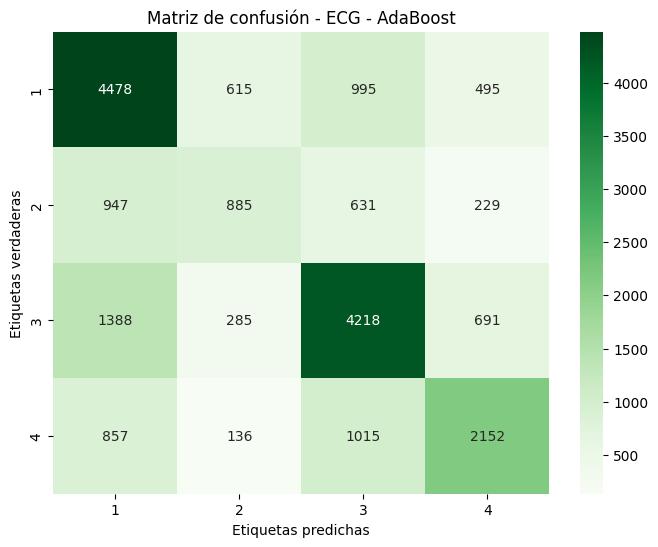

              precision    recall  f1-score   support

           1       0.58      0.68      0.63      6583
           2       0.46      0.33      0.38      2692
           3       0.61      0.64      0.63      6582
           4       0.60      0.52      0.56      4160

    accuracy                           0.59     20017
   macro avg       0.57      0.54      0.55     20017
weighted avg       0.58      0.59      0.58     20017

Training LDA model for ECG...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
ECG - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.415197  ECG - LDA
1  Precision  0.417248  ECG - LDA
2     Recall  0.415197  ECG - LDA
3   F1 Score  0.358256  ECG - LDA
[ECG - LDA] Best Params: {'solver': 'svd'}
[ECG - LDA] Accuracy: 0.4152
ECG - LDA - Confusion Matrix
[[4671    8 1578  326]
 [1610   11  925  146]
 [2983    3 3145  451]
 [2123    0 1553  484]]


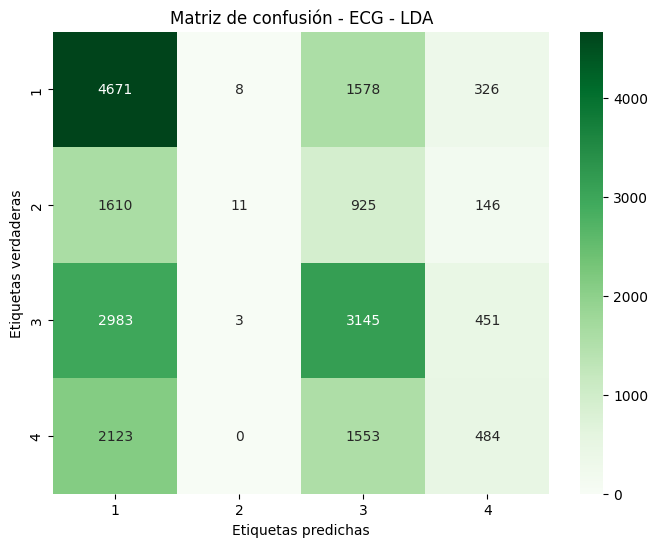

              precision    recall  f1-score   support

           1       0.41      0.71      0.52      6583
           2       0.50      0.00      0.01      2692
           3       0.44      0.48      0.46      6582
           4       0.34      0.12      0.17      4160

    accuracy                           0.42     20017
   macro avg       0.42      0.33      0.29     20017
weighted avg       0.42      0.42      0.36     20017

Training KNN model for ECG...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
ECG - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.657541  ECG - KNN
1  Precision  0.655851  ECG - KNN
2     Recall  0.657541  ECG - KNN
3   F1 Score  0.655284  ECG - KNN
[ECG - KNN] Best Params: {'n_neighbors': 7, 'weights': 'distance'}
[ECG - KNN] Accuracy: 0.6575
ECG - KNN - Confusion Matrix
[[4809  326  942  506]
 [ 567 1394  507  224]
 [1073  323 4556  630]
 [ 774  224  759 2403]]


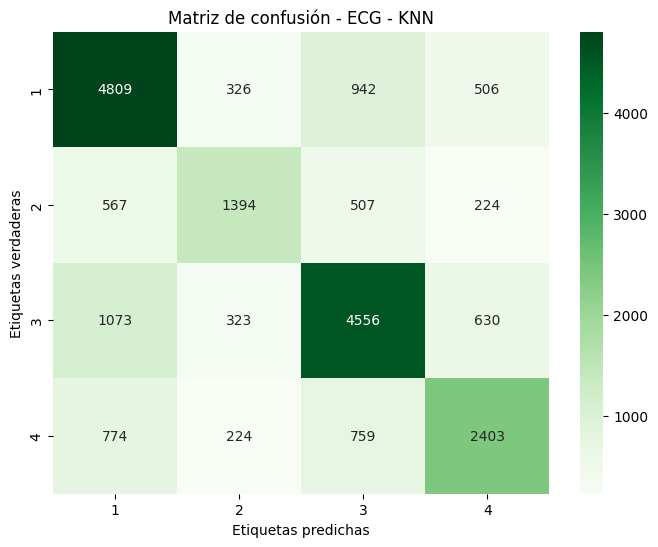

Training by signal:  25%|██▌       | 1/4 [44:06<2:12:20, 2646.71s/it]

              precision    recall  f1-score   support

           1       0.67      0.73      0.70      6583
           2       0.61      0.52      0.56      2692
           3       0.67      0.69      0.68      6582
           4       0.64      0.58      0.61      4160

    accuracy                           0.66     20017
   macro avg       0.65      0.63      0.64     20017
weighted avg       0.66      0.66      0.66     20017

Training DecisionTree model for PPG...
Fitting 5 folds for each of 90 candidates, totalling 450 fits
PPG - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.589749  PPG - DecisionTree
1  Precision  0.657386  PPG - DecisionTree
2     Recall  0.589749  PPG - DecisionTree
3   F1 Score  0.611145  PPG - DecisionTree
[PPG - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 40, 'min_samples_split': 2}
[PPG - DecisionTree] Accuracy: 0.5897
PPG - DecisionTree - Confusion Matrix
[[4480 1182  122  799]
 [ 6

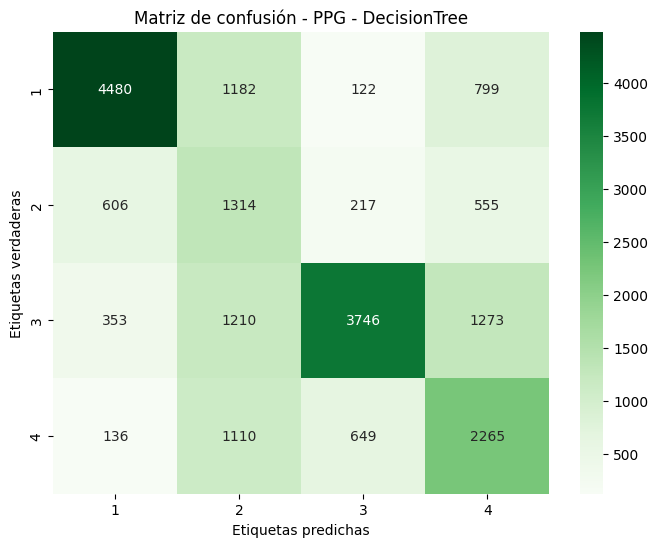

              precision    recall  f1-score   support

           1       0.80      0.68      0.74      6583
           2       0.27      0.49      0.35      2692
           3       0.79      0.57      0.66      6582
           4       0.46      0.54      0.50      4160

    accuracy                           0.59     20017
   macro avg       0.58      0.57      0.56     20017
weighted avg       0.66      0.59      0.61     20017

Training RandomForest model for PPG...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
PPG - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.995204  PPG - RandomForest
1  Precision  0.995213  PPG - RandomForest
2     Recall  0.995204  PPG - RandomForest
3   F1 Score  0.995199  PPG - RandomForest
[PPG - RandomForest] Best Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
[PPG - RandomForest] Accuracy: 0.9952
PPG - RandomForest - Confusion Matrix
[[6574    2    2    5]
 [  27 2652    9    4]
 

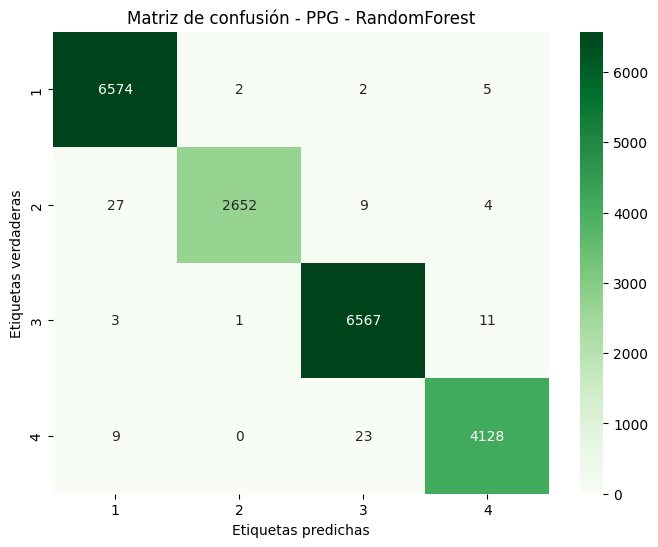

              precision    recall  f1-score   support

           1       0.99      1.00      1.00      6583
           2       1.00      0.99      0.99      2692
           3       0.99      1.00      1.00      6582
           4       1.00      0.99      0.99      4160

    accuracy                           1.00     20017
   macro avg       1.00      0.99      0.99     20017
weighted avg       1.00      1.00      1.00     20017

Training AdaBoost model for PPG...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
PPG - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.774192  PPG - AdaBoost
1  Precision  0.775871  PPG - AdaBoost
2     Recall  0.774192  PPG - AdaBoost
3   F1 Score  0.774591  PPG - AdaBoost
[PPG - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(max_depth=3), 'learning_rate': 0.5, 'n_estimators': 300}
[PPG - AdaBoost] Accuracy: 0.7742
PPG - AdaBoost - Confusion Matrix
[[5728  562  141  152]
 [ 520 1599  283  290]
 [ 153  213 

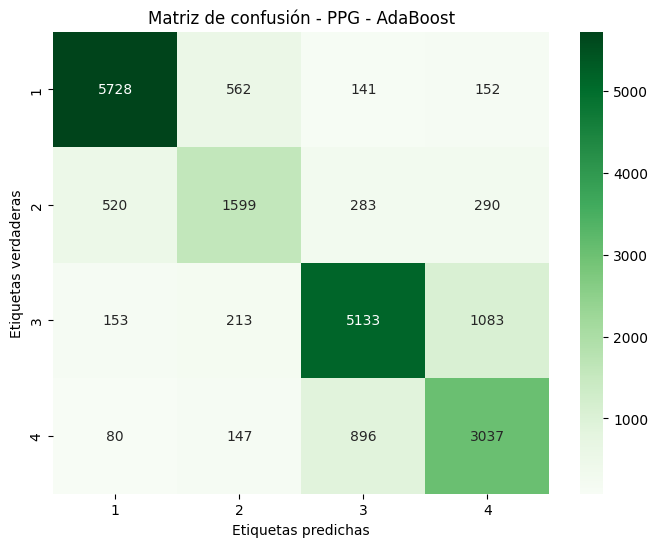

              precision    recall  f1-score   support

           1       0.88      0.87      0.88      6583
           2       0.63      0.59      0.61      2692
           3       0.80      0.78      0.79      6582
           4       0.67      0.73      0.70      4160

    accuracy                           0.77     20017
   macro avg       0.74      0.74      0.74     20017
weighted avg       0.78      0.77      0.77     20017

Training LDA model for PPG...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
PPG - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.561573  PPG - LDA
1  Precision  0.519806  PPG - LDA
2     Recall  0.561573  PPG - LDA
3   F1 Score  0.508671  PPG - LDA
[PPG - LDA] Best Params: {'solver': 'svd'}
[PPG - LDA] Accuracy: 0.5616
PPG - LDA - Confusion Matrix
[[5087   28  773  695]
 [1208   29  919  536]
 [ 670    4 5105  803]
 [ 767   16 2357 1020]]


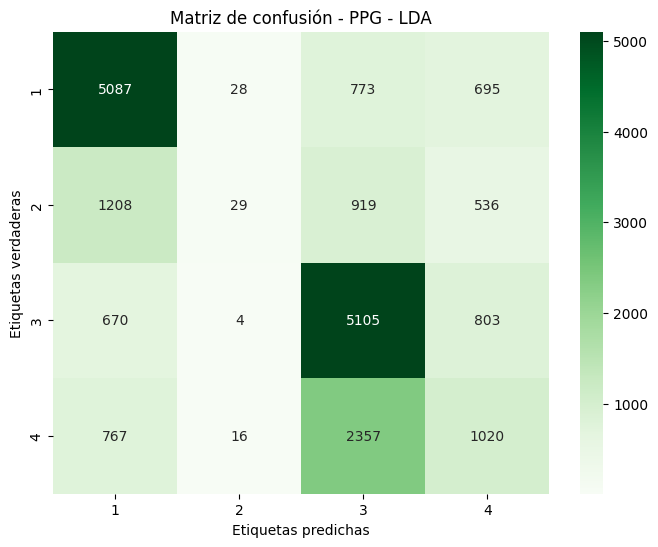

              precision    recall  f1-score   support

           1       0.66      0.77      0.71      6583
           2       0.38      0.01      0.02      2692
           3       0.56      0.78      0.65      6582
           4       0.33      0.25      0.28      4160

    accuracy                           0.56     20017
   macro avg       0.48      0.45      0.42     20017
weighted avg       0.52      0.56      0.51     20017

Training KNN model for PPG...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
PPG - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.882949  PPG - KNN
1  Precision  0.882701  PPG - KNN
2     Recall  0.882949  PPG - KNN
3   F1 Score  0.882814  PPG - KNN
[PPG - KNN] Best Params: {'n_neighbors': 3, 'weights': 'distance'}
[PPG - KNN] Accuracy: 0.8829
PPG - KNN - Confusion Matrix
[[6066  182  170  165]
 [ 207 2170  159  156]
 [ 137  176 5944  325]
 [ 198  121  347 3494]]


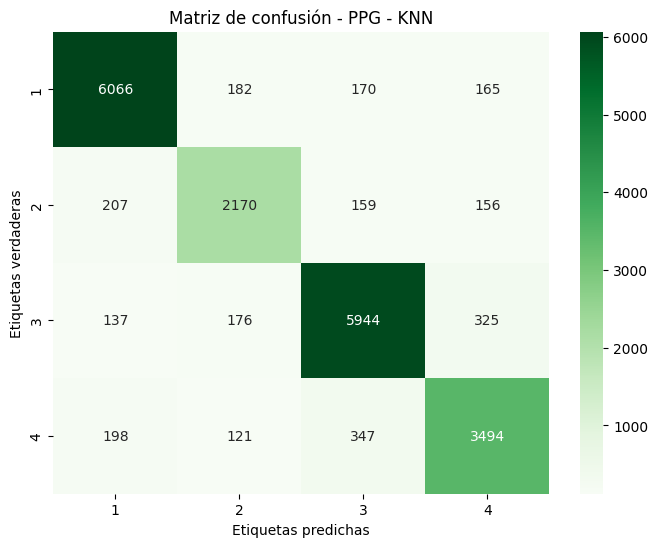

Training by signal:  50%|█████     | 2/4 [1:26:26<1:26:07, 2583.98s/it]

              precision    recall  f1-score   support

           1       0.92      0.92      0.92      6583
           2       0.82      0.81      0.81      2692
           3       0.90      0.90      0.90      6582
           4       0.84      0.84      0.84      4160

    accuracy                           0.88     20017
   macro avg       0.87      0.87      0.87     20017
weighted avg       0.88      0.88      0.88     20017

Training DecisionTree model for EDA...
Fitting 5 folds for each of 90 candidates, totalling 450 fits
EDA - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.518559  EDA - DecisionTree
1  Precision  0.592203  EDA - DecisionTree
2     Recall  0.518559  EDA - DecisionTree
3   F1 Score  0.531905  EDA - DecisionTree
[EDA - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 15, 'max_leaf_nodes': 40, 'min_samples_split': 2}
[EDA - DecisionTree] Accuracy: 0.5186
EDA - DecisionTree - Confusion Matrix
[[3474 1106  747 1256]
 [ 2

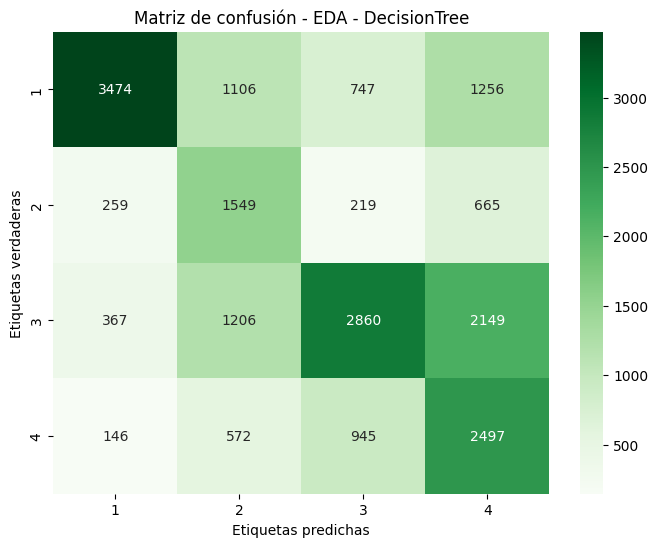

              precision    recall  f1-score   support

           1       0.82      0.53      0.64      6583
           2       0.35      0.58      0.43      2692
           3       0.60      0.43      0.50      6582
           4       0.38      0.60      0.47      4160

    accuracy                           0.52     20017
   macro avg       0.54      0.53      0.51     20017
weighted avg       0.59      0.52      0.53     20017

Training RandomForest model for EDA...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
EDA - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.992656  EDA - RandomForest
1  Precision  0.992669  EDA - RandomForest
2     Recall  0.992656  EDA - RandomForest
3   F1 Score  0.992653  EDA - RandomForest
[EDA - RandomForest] Best Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
[EDA - RandomForest] Accuracy: 0.9927
EDA - RandomForest - Confusion Matrix
[[6553    5   18    7]
 [  18 2656   12    6]
 

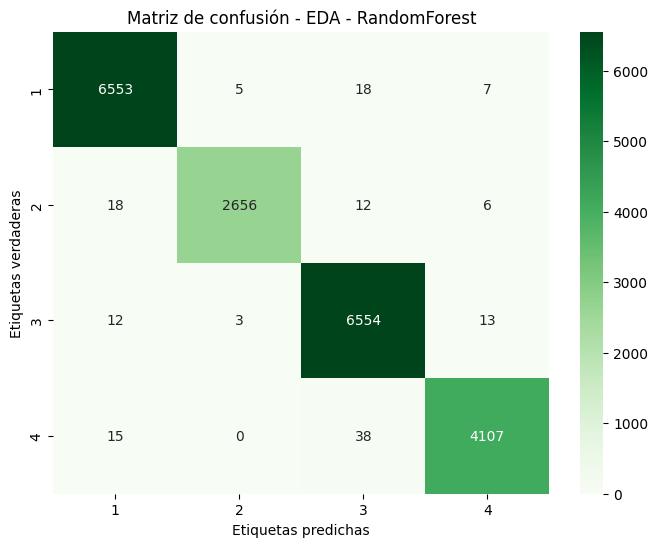

              precision    recall  f1-score   support

           1       0.99      1.00      0.99      6583
           2       1.00      0.99      0.99      2692
           3       0.99      1.00      0.99      6582
           4       0.99      0.99      0.99      4160

    accuracy                           0.99     20017
   macro avg       0.99      0.99      0.99     20017
weighted avg       0.99      0.99      0.99     20017

Training AdaBoost model for EDA...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
EDA - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.640605  EDA - AdaBoost
1  Precision  0.660503  EDA - AdaBoost
2     Recall  0.640605  EDA - AdaBoost
3   F1 Score  0.646235  EDA - AdaBoost
[EDA - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(max_depth=3), 'learning_rate': 0.5, 'n_estimators': 300}
[EDA - AdaBoost] Accuracy: 0.6406
EDA - AdaBoost - Confusion Matrix
[[4104 1329  759  391]
 [ 435 1564  348  345]
 [ 516  589 

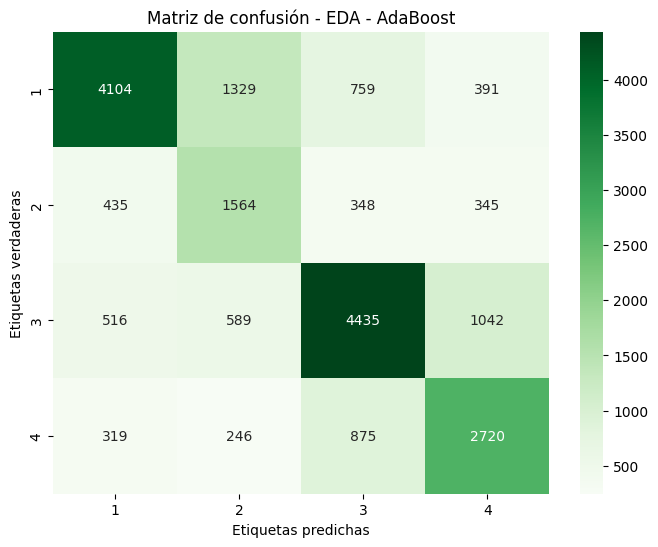

              precision    recall  f1-score   support

           1       0.76      0.62      0.69      6583
           2       0.42      0.58      0.49      2692
           3       0.69      0.67      0.68      6582
           4       0.60      0.65      0.63      4160

    accuracy                           0.64     20017
   macro avg       0.62      0.63      0.62     20017
weighted avg       0.66      0.64      0.65     20017

Training LDA model for EDA...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
EDA - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.417995  EDA - LDA
1  Precision  0.417615  EDA - LDA
2     Recall  0.417995  EDA - LDA
3   F1 Score  0.350615  EDA - LDA
[EDA - LDA] Best Params: {'solver': 'svd'}
[EDA - LDA] Accuracy: 0.4180
EDA - LDA - Confusion Matrix
[[4872    3 1455  253]
 [1466    7 1122   97]
 [3132    0 3182  268]
 [1850    3 2001  306]]


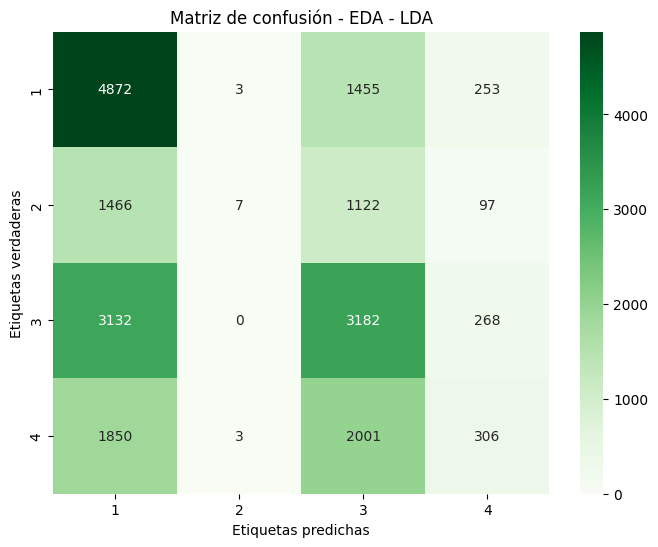

              precision    recall  f1-score   support

           1       0.43      0.74      0.54      6583
           2       0.54      0.00      0.01      2692
           3       0.41      0.48      0.44      6582
           4       0.33      0.07      0.12      4160

    accuracy                           0.42     20017
   macro avg       0.43      0.32      0.28     20017
weighted avg       0.42      0.42      0.35     20017

Training KNN model for EDA...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
EDA - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.923115  EDA - KNN
1  Precision  0.923083  EDA - KNN
2     Recall  0.923115  EDA - KNN
3   F1 Score  0.923096  EDA - KNN
[EDA - KNN] Best Params: {'n_neighbors': 3, 'weights': 'distance'}
[EDA - KNN] Accuracy: 0.9231
EDA - KNN - Confusion Matrix
[[6205  107  166  105]
 [ 105 2427  100   60]
 [ 189   94 6088  211]
 [ 107   68  227 3758]]


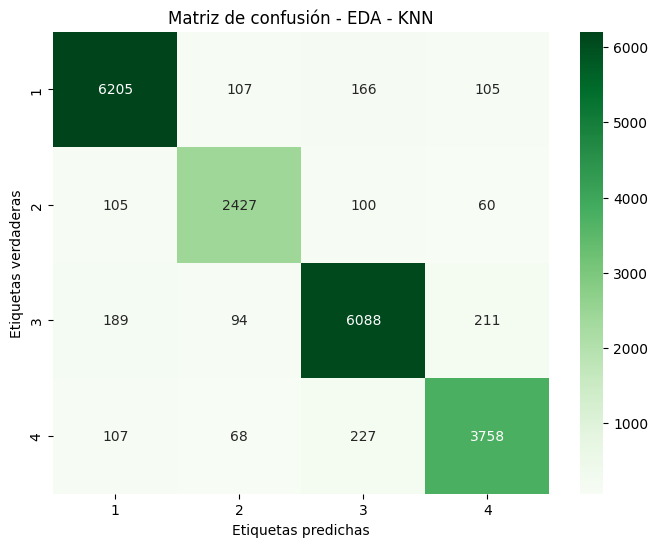

Training by signal:  75%|███████▌  | 3/4 [2:00:41<39:02, 2342.25s/it]  

              precision    recall  f1-score   support

           1       0.94      0.94      0.94      6583
           2       0.90      0.90      0.90      2692
           3       0.93      0.92      0.93      6582
           4       0.91      0.90      0.91      4160

    accuracy                           0.92     20017
   macro avg       0.92      0.92      0.92     20017
weighted avg       0.92      0.92      0.92     20017

Training DecisionTree model for RESP...
Fitting 5 folds for each of 90 candidates, totalling 450 fits
RESP - DecisionTree Metrics
     Métrica     Valor                Etapa
0   Accuracy  0.454064  RESP - DecisionTree
1  Precision  0.475188  RESP - DecisionTree
2     Recall  0.454064  RESP - DecisionTree
3   F1 Score  0.453421  RESP - DecisionTree
[RESP - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 30, 'min_samples_split': 2}
[RESP - DecisionTree] Accuracy: 0.4541
RESP - DecisionTree - Confusion Matrix
[[2399 1299 1615 

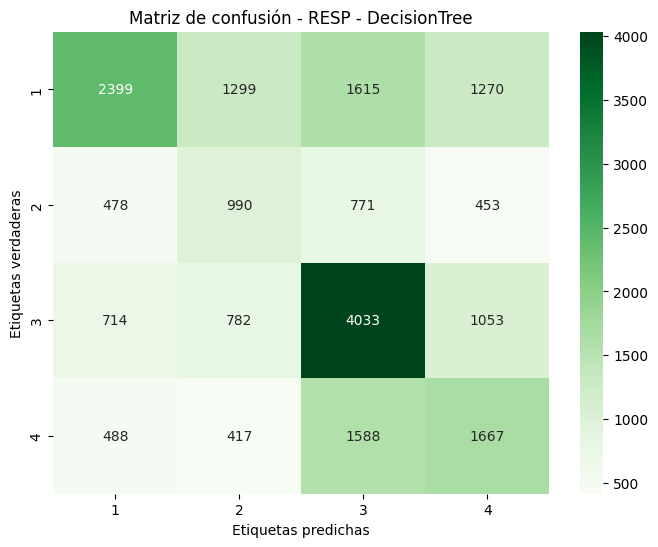

              precision    recall  f1-score   support

           1       0.59      0.36      0.45      6583
           2       0.28      0.37      0.32      2692
           3       0.50      0.61      0.55      6582
           4       0.38      0.40      0.39      4160

    accuracy                           0.45     20017
   macro avg       0.44      0.44      0.43     20017
weighted avg       0.48      0.45      0.45     20017

Training RandomForest model for RESP...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
RESP - RandomForest Metrics
     Métrica     Valor                Etapa
0   Accuracy  0.991807  RESP - RandomForest
1  Precision  0.991833  RESP - RandomForest
2     Recall  0.991807  RESP - RandomForest
3   F1 Score  0.991806  RESP - RandomForest
[RESP - RandomForest] Best Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
[RESP - RandomForest] Accuracy: 0.9918
RESP - RandomForest - Confusion Matrix
[[6547    2   28    6]
 [  13 2658   

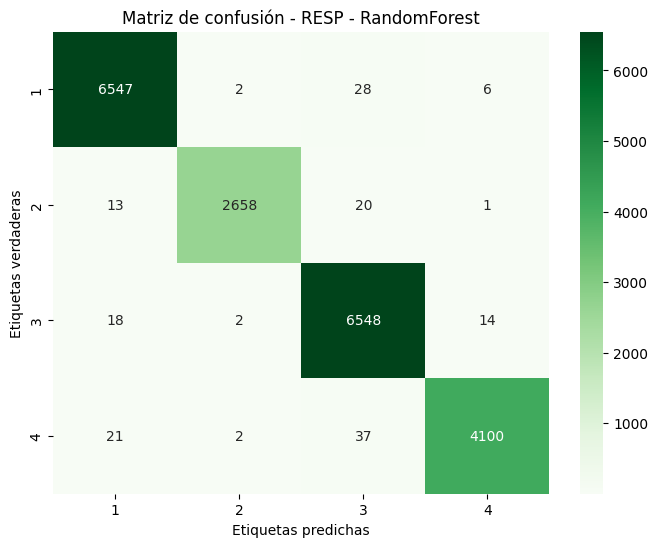

              precision    recall  f1-score   support

           1       0.99      0.99      0.99      6583
           2       1.00      0.99      0.99      2692
           3       0.99      0.99      0.99      6582
           4       0.99      0.99      0.99      4160

    accuracy                           0.99     20017
   macro avg       0.99      0.99      0.99     20017
weighted avg       0.99      0.99      0.99     20017

Training AdaBoost model for RESP...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
RESP - AdaBoost Metrics
     Métrica     Valor            Etapa
0   Accuracy  0.676475  RESP - AdaBoost
1  Precision  0.680425  RESP - AdaBoost
2     Recall  0.676475  RESP - AdaBoost
3   F1 Score  0.672559  RESP - AdaBoost
[RESP - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(max_depth=3), 'learning_rate': 0.5, 'n_estimators': 300}
[RESP - AdaBoost] Accuracy: 0.6765
RESP - AdaBoost - Confusion Matrix
[[4961  192 1043  387]
 [ 641 1481  445  125]
 [

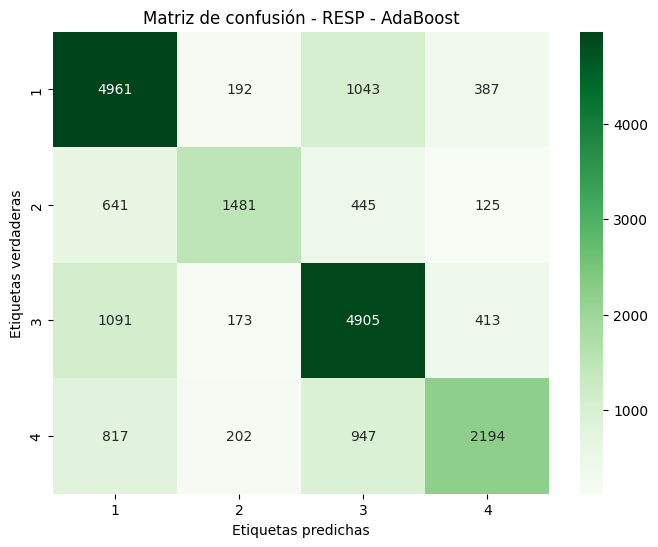

              precision    recall  f1-score   support

           1       0.66      0.75      0.70      6583
           2       0.72      0.55      0.62      2692
           3       0.67      0.75      0.70      6582
           4       0.70      0.53      0.60      4160

    accuracy                           0.68     20017
   macro avg       0.69      0.64      0.66     20017
weighted avg       0.68      0.68      0.67     20017

Training LDA model for RESP...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
RESP - LDA Metrics
     Métrica     Valor       Etapa
0   Accuracy  0.438477  RESP - LDA
1  Precision  0.496975  RESP - LDA
2     Recall  0.438477  RESP - LDA
3   F1 Score  0.363873  RESP - LDA
[RESP - LDA] Best Params: {'solver': 'svd'}
[RESP - LDA] Accuracy: 0.4385
RESP - LDA - Confusion Matrix
[[4372    0 2051  160]
 [1782    0  837   73]
 [2222    0 4222  138]
 [2495    0 1482  183]]


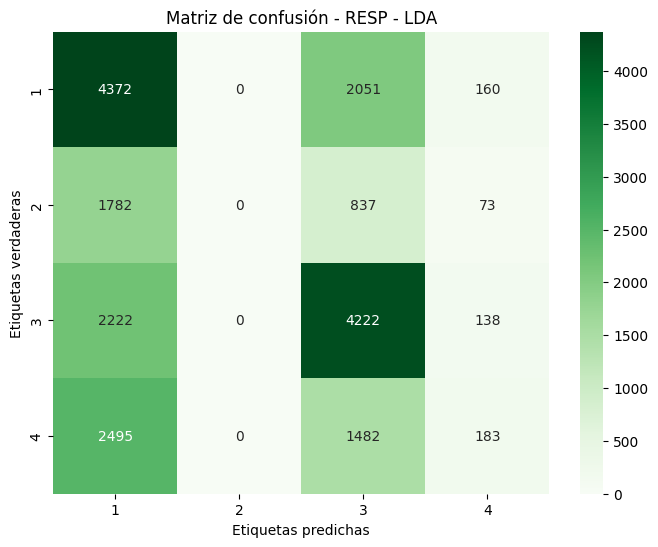

              precision    recall  f1-score   support

           1       0.40      0.66      0.50      6583
           2       0.00      0.00      0.00      2692
           3       0.49      0.64      0.56      6582
           4       0.33      0.04      0.08      4160

    accuracy                           0.44     20017
   macro avg       0.31      0.34      0.28     20017
weighted avg       0.36      0.44      0.36     20017

Training KNN model for RESP...
Fitting 5 folds for each of 8 candidates, totalling 40 fits


c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


RESP - KNN Metrics
     Métrica     Valor       Etapa
0   Accuracy  0.976670  RESP - KNN
1  Precision  0.976686  RESP - KNN
2     Recall  0.976670  RESP - KNN
3   F1 Score  0.976669  RESP - KNN
[RESP - KNN] Best Params: {'n_neighbors': 3, 'weights': 'distance'}
[RESP - KNN] Accuracy: 0.9767
RESP - KNN - Confusion Matrix
[[6466   25   46   46]
 [  36 2613   29   14]
 [  78   27 6410   67]
 [  34   12   53 4061]]


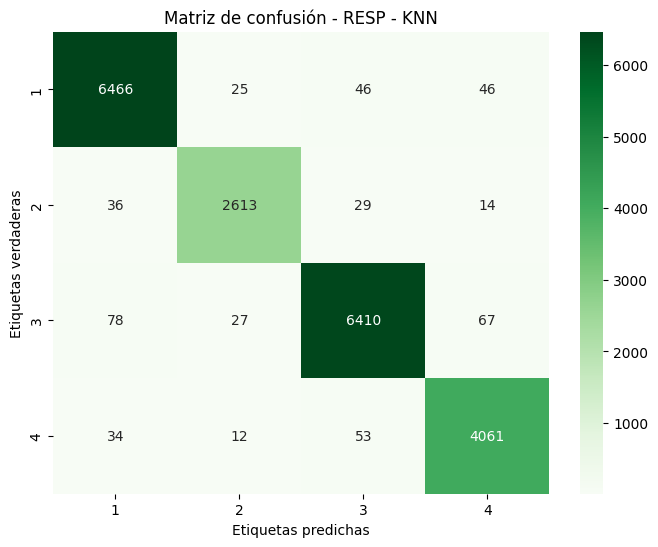

              precision    recall  f1-score   support

           1       0.98      0.98      0.98      6583
           2       0.98      0.97      0.97      2692
           3       0.98      0.97      0.98      6582
           4       0.97      0.98      0.97      4160

    accuracy                           0.98     20017
   macro avg       0.98      0.98      0.98     20017
weighted avg       0.98      0.98      0.98     20017



Training with ALL signals:   0%|          | 0/5 [00:00<?, ?it/s]

Training DecisionTree model for ALL signals using LOSO...
Fitting 5 folds for each of 90 candidates, totalling 450 fits
ALL - DecisionTree Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.454064  ALL - DecisionTree
1  Precision  0.475188  ALL - DecisionTree
2     Recall  0.454064  ALL - DecisionTree
3   F1 Score  0.453421  ALL - DecisionTree
[ALL - DecisionTree] Best Params: {'criterion': 'gini', 'max_depth': 10, 'max_leaf_nodes': 30, 'min_samples_split': 2}
[ALL - DecisionTree] Accuracy: 0.4541
ALL - DecisionTree - Confusion Matrix
[[2399 1299 1615 1270]
 [ 478  990  771  453]
 [ 714  782 4033 1053]
 [ 488  417 1588 1667]]


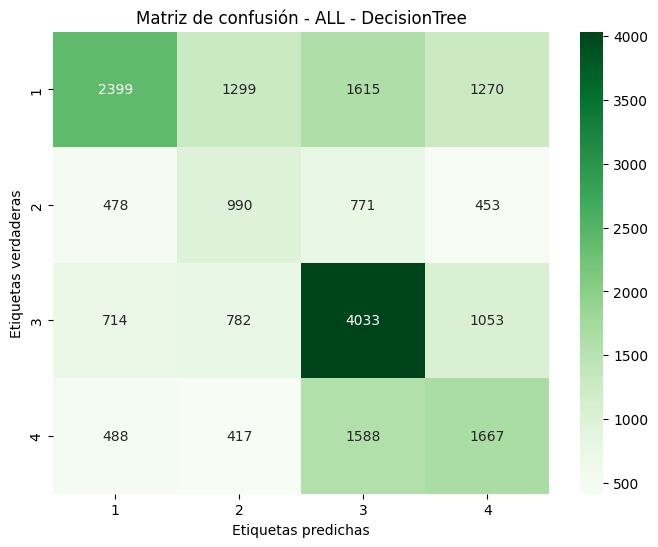

Training with ALL signals:  20%|██        | 1/5 [00:30<02:03, 30.80s/it]

              precision    recall  f1-score   support

           1       0.59      0.36      0.45      6583
           2       0.28      0.37      0.32      2692
           3       0.50      0.61      0.55      6582
           4       0.38      0.40      0.39      4160

    accuracy                           0.45     20017
   macro avg       0.44      0.44      0.43     20017
weighted avg       0.48      0.45      0.45     20017

Training RandomForest model for ALL signals using LOSO...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
ALL - RandomForest Metrics
     Métrica     Valor               Etapa
0   Accuracy  0.991807  ALL - RandomForest
1  Precision  0.991833  ALL - RandomForest
2     Recall  0.991807  ALL - RandomForest
3   F1 Score  0.991806  ALL - RandomForest
[ALL - RandomForest] Best Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
[ALL - RandomForest] Accuracy: 0.9918
ALL - RandomForest - Confusion Matrix
[[6547    2   28    6]
 [  1

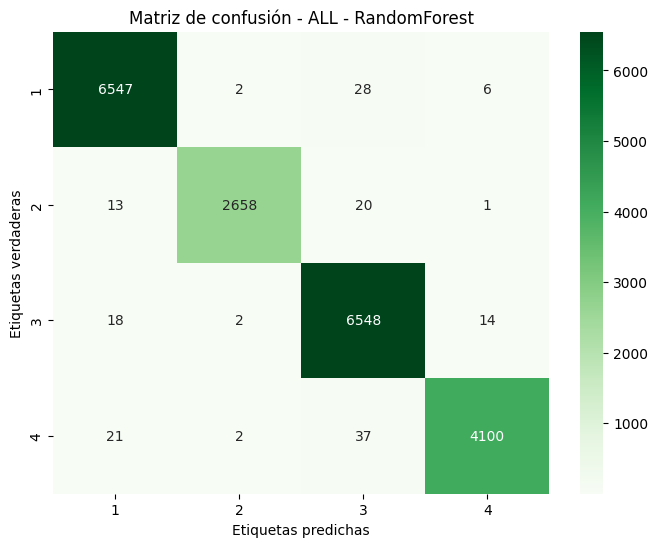

Training with ALL signals:  40%|████      | 2/5 [15:54<27:48, 556.00s/it]

              precision    recall  f1-score   support

           1       0.99      0.99      0.99      6583
           2       1.00      0.99      0.99      2692
           3       0.99      0.99      0.99      6582
           4       0.99      0.99      0.99      4160

    accuracy                           0.99     20017
   macro avg       0.99      0.99      0.99     20017
weighted avg       0.99      0.99      0.99     20017

Training AdaBoost model for ALL signals using LOSO...
Fitting 5 folds for each of 32 candidates, totalling 160 fits
ALL - AdaBoost Metrics
     Métrica     Valor           Etapa
0   Accuracy  0.676475  ALL - AdaBoost
1  Precision  0.680425  ALL - AdaBoost
2     Recall  0.676475  ALL - AdaBoost
3   F1 Score  0.672559  ALL - AdaBoost
[ALL - AdaBoost] Best Params: {'estimator': DecisionTreeClassifier(max_depth=3), 'learning_rate': 0.5, 'n_estimators': 300}
[ALL - AdaBoost] Accuracy: 0.6765
ALL - AdaBoost - Confusion Matrix
[[4961  192 1043  387]
 [ 641 1481  445

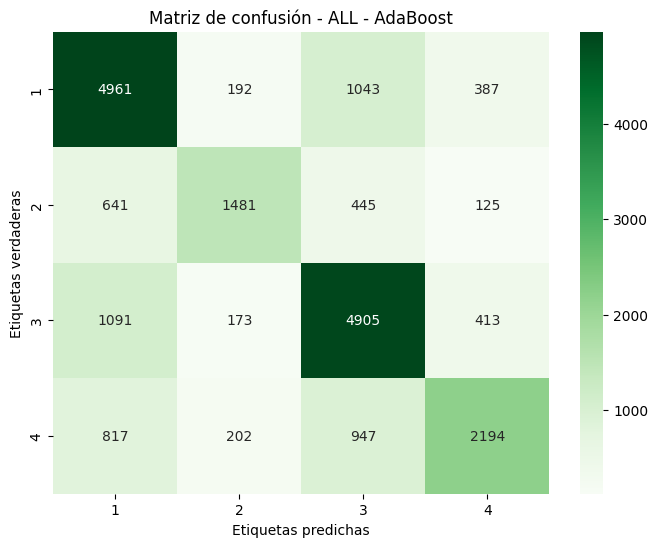

Training with ALL signals:  60%|██████    | 3/5 [28:25<21:30, 645.01s/it]

              precision    recall  f1-score   support

           1       0.66      0.75      0.70      6583
           2       0.72      0.55      0.62      2692
           3       0.67      0.75      0.70      6582
           4       0.70      0.53      0.60      4160

    accuracy                           0.68     20017
   macro avg       0.69      0.64      0.66     20017
weighted avg       0.68      0.68      0.67     20017

Training LDA model for ALL signals using LOSO...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
ALL - LDA Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.438477  ALL - LDA
1  Precision  0.496975  ALL - LDA
2     Recall  0.438477  ALL - LDA
3   F1 Score  0.363873  ALL - LDA
[ALL - LDA] Best Params: {'solver': 'svd'}
[ALL - LDA] Accuracy: 0.4385
ALL - LDA - Confusion Matrix
[[4372    0 2051  160]
 [1782    0  837   73]
 [2222    0 4222  138]
 [2495    0 1482  183]]


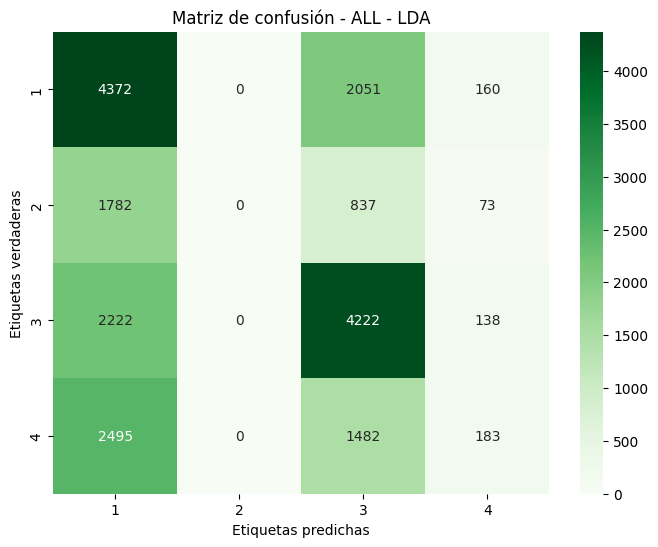

c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Gustavo\anaconda3\envs\ML\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
Training with ALL signals

              precision    recall  f1-score   support

           1       0.40      0.66      0.50      6583
           2       0.00      0.00      0.00      2692
           3       0.49      0.64      0.56      6582
           4       0.33      0.04      0.08      4160

    accuracy                           0.44     20017
   macro avg       0.31      0.34      0.28     20017
weighted avg       0.36      0.44      0.36     20017

Training KNN model for ALL signals using LOSO...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
ALL - KNN Metrics
     Métrica     Valor      Etapa
0   Accuracy  0.976670  ALL - KNN
1  Precision  0.976686  ALL - KNN
2     Recall  0.976670  ALL - KNN
3   F1 Score  0.976669  ALL - KNN
[ALL - KNN] Best Params: {'n_neighbors': 3, 'weights': 'distance'}
[ALL - KNN] Accuracy: 0.9767
ALL - KNN - Confusion Matrix
[[6466   25   46   46]
 [  36 2613   29   14]
 [  78   27 6410   67]
 [  34   12   53 4061]]


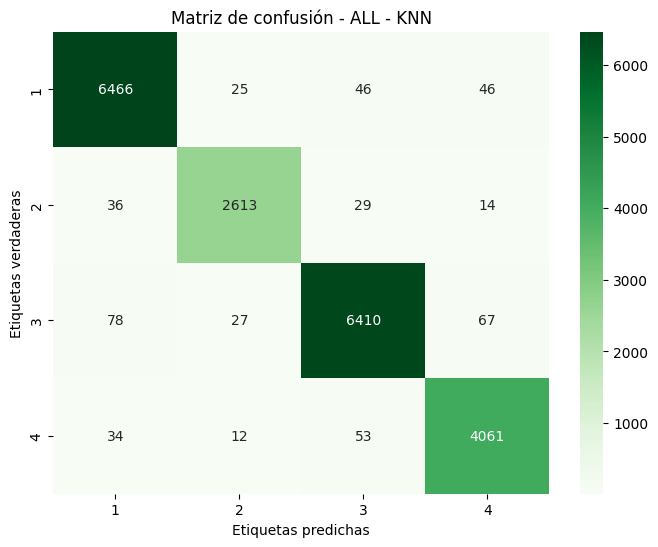

Training with ALL signals: 100%|██████████| 5/5 [28:28<00:00, 341.70s/it]

              precision    recall  f1-score   support

           1       0.98      0.98      0.98      6583
           2       0.98      0.97      0.97      2692
           3       0.98      0.97      0.98      6582
           4       0.97      0.98      0.97      4160

    accuracy                           0.98     20017
   macro avg       0.98      0.98      0.98     20017
weighted avg       0.98      0.98      0.98     20017


Final Comparison:
ECG - DecisionTree:      Métrica     Valor               Etapa
0   Accuracy  0.426637  ECG - DecisionTree
1  Precision  0.524099  ECG - DecisionTree
2     Recall  0.426637  ECG - DecisionTree
3   F1 Score  0.356113  ECG - DecisionTree
ECG - RandomForest:      Métrica     Valor               Etapa
0   Accuracy  0.942499  ECG - RandomForest
1  Precision  0.943431  ECG - RandomForest
2     Recall  0.942499  ECG - RandomForest
3   F1 Score  0.942231  ECG - RandomForest
ECG - AdaBoost:      Métrica     Valor           Etapa
0   Accuracy  0.58615

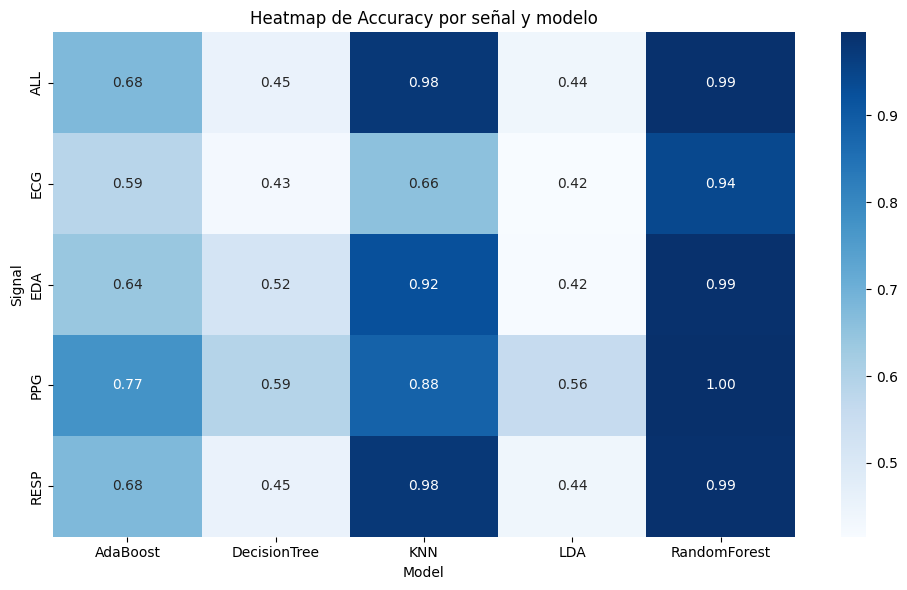

In [ ]:
"""# Entrenamiento por cada tipo de señal
for signal, features in tqdm(SIGNAL_CATEGORIES.items(), desc="Training by signal"):
    if all(f in df.columns for f in features):  # Verificar que todas las columnas existen
        X = df[features]
        y = df['label']
        subjects = df['subject']  # Se agrega el identificador de sujetos para LOSO
        
        for model_name, (model, param_grid) in models.items():
            print(f'Training {model_name} model for {signal}...')
            metrics = train_and_evaluate(X, y, model, param_grid, model_name, signal)
            results[(signal, model_name)] = metrics

# Entrenamiento con todas las señales combinadas
X_all = df.drop(columns=['label', 'subject'])  # También se excluye 'subject'
y_all = df['label']
subjects_all = df['subject']

for model_name, (model, param_grid) in tqdm(models.items(), desc="Training with ALL signals"):
    print(f'Training {model_name} model for ALL signals using LOSO...')
    acc = train_and_evaluate(X, y, model, param_grid, model_name, "ALL")
    results[("ALL", model_name)] = acc

# Mostrar resultados finales
print("\nFinal Comparison:")
for (signal, model_name), acc in results.items():
    print(f'{signal} - {model_name}: {acc}')

rows = []

for (signal, model), df_metrics in results.items():
    # Convertimos el DataFrame a formato entendible
    metric_values = df_metrics.set_index('Métrica')['Valor']
    
    row = {
        'Signal': signal,
        'Model': model,
        'Accuracy': metric_values.get('Accuracy', None),
        'F1': metric_values.get('F1 Score', None),
        'Precision': metric_values.get('Precision', None),
        'Recall': metric_values.get('Recall', None)
    }
    rows.append(row)

metrics_df = pd.DataFrame(rows)

pivot_df = metrics_df.pivot(index='Signal', columns='Model', values='Accuracy')
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_df, annot=True, cmap="Blues", fmt=".2f")
plt.title('Heatmap de Accuracy por señal y modelo')
plt.tight_layout()
plt.show()"""

In [ ]:
print(terminado)

In [ ]:
import pandas as pd

data = [
    ["ECG", "DecisionTree", "Accuracy", 0.426637],
    ["ECG", "DecisionTree", "Precision", 0.524099],
    ["ECG", "DecisionTree", "Recall", 0.426637],
    ["ECG", "DecisionTree", "F1 Score", 0.356113],
    
    ["ECG", "RandomForest", "Accuracy", 0.942499],
    ["ECG", "RandomForest", "Precision", 0.943431],
    ["ECG", "RandomForest", "Recall", 0.942499],
    ["ECG", "RandomForest", "F1 Score", 0.942231],
    
    ["ECG", "AdaBoost", "Accuracy", 0.586152],
    ["ECG", "AdaBoost", "Precision", 0.581555],
    ["ECG", "AdaBoost", "Recall", 0.586152],
    ["ECG", "AdaBoost", "F1 Score", 0.580388],
    
    ["ECG", "LDA", "Accuracy", 0.415197],
    ["ECG", "LDA", "Precision", 0.417248],
    ["ECG", "LDA", "Recall", 0.415197],
    ["ECG", "LDA", "F1 Score", 0.358256],
    
    ["ECG", "KNN", "Accuracy", 0.657541],
    ["ECG", "KNN", "Precision", 0.655851],
    ["ECG", "KNN", "Recall", 0.657541],
    ["ECG", "KNN", "F1 Score", 0.655284],
    
    ["PPG", "DecisionTree", "Accuracy", 0.589749],
    ["PPG", "DecisionTree", "Precision", 0.657386],
    ["PPG", "DecisionTree", "Recall", 0.589749],
    ["PPG", "DecisionTree", "F1 Score", 0.611145],
    
    ["PPG", "RandomForest", "Accuracy", 0.995204],
    ["PPG", "RandomForest", "Precision", 0.995213],
    ["PPG", "RandomForest", "Recall", 0.995204],
    ["PPG", "RandomForest", "F1 Score", 0.995199],
    
    ["PPG", "AdaBoost", "Accuracy", 0.774192],
    ["PPG", "AdaBoost", "Precision", 0.775871],
    ["PPG", "AdaBoost", "Recall", 0.774192],
    ["PPG", "AdaBoost", "F1 Score", 0.774591],
    
    ["PPG", "LDA", "Accuracy", 0.561573],
    ["PPG", "LDA", "Precision", 0.519806],
    ["PPG", "LDA", "Recall", 0.561573],
    ["PPG", "LDA", "F1 Score", 0.508671],
    
    ["PPG", "KNN", "Accuracy", 0.882949],
    ["PPG", "KNN", "Precision", 0.882701],
    ["PPG", "KNN", "Recall", 0.882949],
    ["PPG", "KNN", "F1 Score", 0.882814],
    
    ["EDA", "DecisionTree", "Accuracy", 0.518559],
    ["EDA", "DecisionTree", "Precision", 0.592203],
    ["EDA", "DecisionTree", "Recall", 0.518559],
    ["EDA", "DecisionTree", "F1 Score", 0.531905],
    
    ["EDA", "RandomForest", "Accuracy", 0.992656],
    ["EDA", "RandomForest", "Precision", 0.992669],
    ["EDA", "RandomForest", "Recall", 0.992656],
    ["EDA", "RandomForest", "F1 Score", 0.992653],
    
    ["EDA", "AdaBoost", "Accuracy", 0.640605],
    ["EDA", "AdaBoost", "Precision", 0.660503],
    ["EDA", "AdaBoost", "Recall", 0.640605],
    ["EDA", "AdaBoost", "F1 Score", 0.646235],
    
    ["EDA", "LDA", "Accuracy", 0.417995],
    ["EDA", "LDA", "Precision", 0.417615],
    ["EDA", "LDA", "Recall", 0.417995],
    ["EDA", "LDA", "F1 Score", 0.350615],
    
    ["EDA", "KNN", "Accuracy", 0.923115],
    ["EDA", "KNN", "Precision", 0.923083],
    ["EDA", "KNN", "Recall", 0.923115],
    ["EDA", "KNN", "F1 Score", 0.923096],
    
    ["RESP", "DecisionTree", "Accuracy", 0.454064],
    ["RESP", "DecisionTree", "Precision", 0.475188],
    ["RESP", "DecisionTree", "Recall", 0.454064],
    ["RESP", "DecisionTree", "F1 Score", 0.453421],
    
    ["RESP", "RandomForest", "Accuracy", 0.991807],
    ["RESP", "RandomForest", "Precision", 0.991833],
    ["RESP", "RandomForest", "Recall", 0.991807],
    ["RESP", "RandomForest", "F1 Score", 0.991806],
    
    ["RESP", "AdaBoost", "Accuracy", 0.676475],
    ["RESP", "AdaBoost", "Precision", 0.680425],
    ["RESP", "AdaBoost", "Recall", 0.676475],
    ["RESP", "AdaBoost", "F1 Score", 0.672559],
    
    ["RESP", "LDA", "Accuracy", 0.438477],
    ["RESP", "LDA", "Precision", 0.496975],
    ["RESP", "LDA", "Recall", 0.438477],
    ["RESP", "LDA", "F1 Score", 0.363873],
    
    ["RESP", "KNN", "Accuracy", 0.976670],
    ["RESP", "KNN", "Precision", 0.976686],
    ["RESP", "KNN", "Recall", 0.976670],
    ["RESP", "KNN", "F1 Score", 0.976669],
    
    ["ALL", "DecisionTree", "Accuracy", 0.454064],
    ["ALL", "DecisionTree", "Precision", 0.475188],
    ["ALL", "DecisionTree", "Recall", 0.454064],
    ["ALL", "DecisionTree", "F1 Score", 0.453421],
    
    ["ALL", "RandomForest", "Accuracy", 0.991807],
    ["ALL", "RandomForest", "Precision", 0.991833],
    ["ALL", "RandomForest", "Recall", 0.991807],
    ["ALL", "RandomForest", "F1 Score", 0.991806],
    
    ["ALL", "AdaBoost", "Accuracy", 0.676475],
    ["ALL", "AdaBoost", "Precision", 0.680425],
    ["ALL", "AdaBoost", "Recall", 0.676475],
    ["ALL", "AdaBoost", "F1 Score", 0.672559],
    
    ["ALL", "LDA", "Accuracy", 0.438477],
    ["ALL", "LDA", "Precision", 0.496975],
    ["ALL", "LDA", "Recall", 0.438477],
    ["ALL", "LDA", "F1 Score", 0.363873],
    
    ["ALL", "KNN", "Accuracy", 0.976670],
    ["ALL", "KNN", "Precision", 0.976686],
    ["ALL", "KNN", "Recall", 0.976670],
    ["ALL", "KNN", "F1 Score", 0.976669],
]

df = pd.DataFrame(data, columns=["Señal", "Modelo", "Métrica", "Valor"])

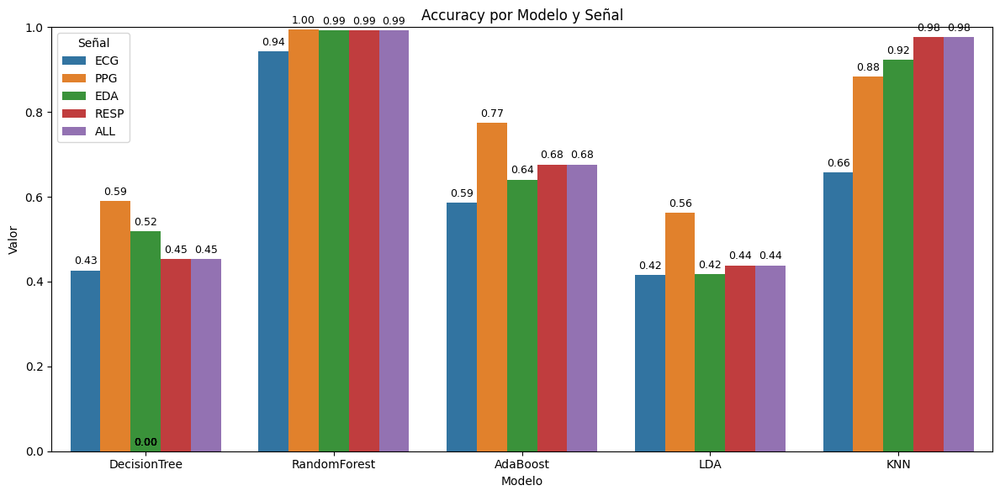

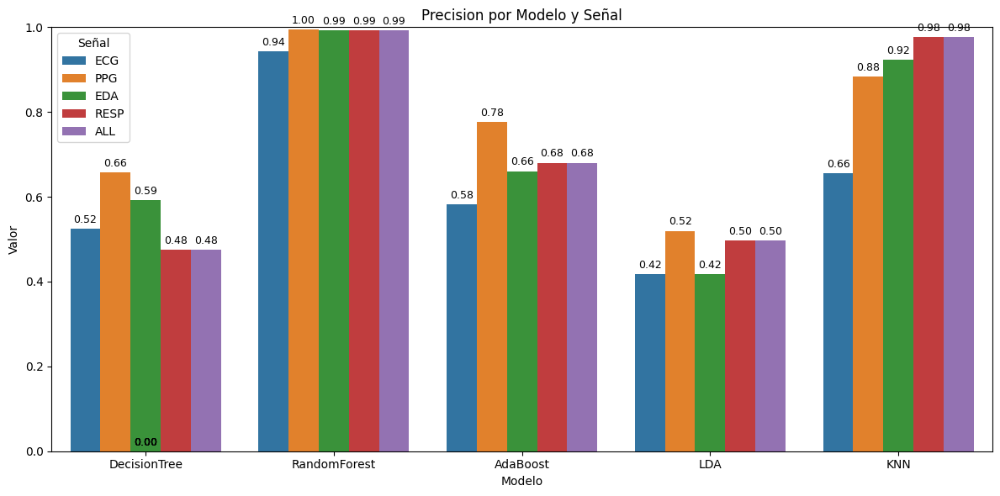

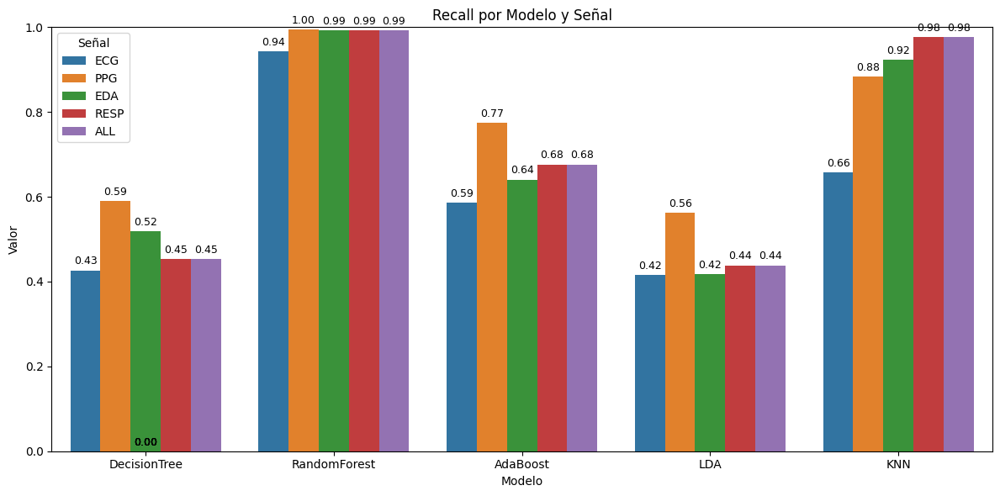

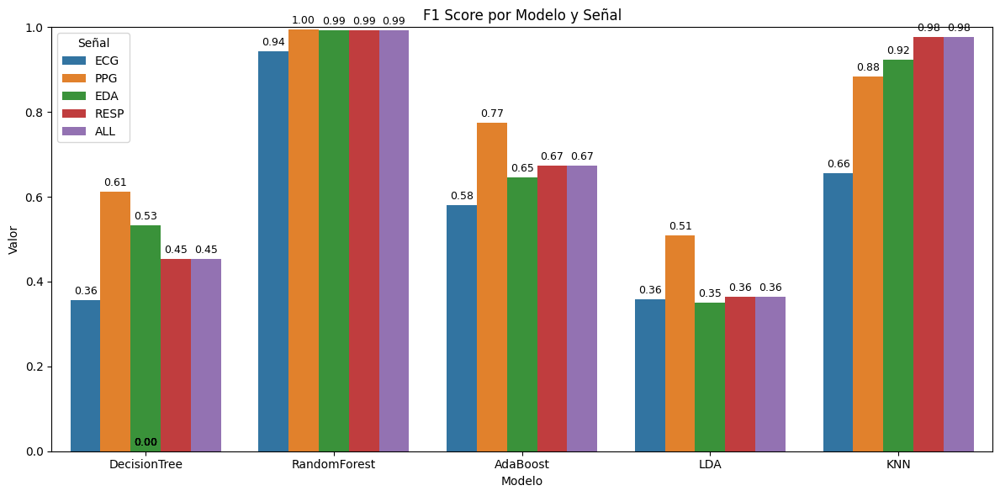

In [ ]:
metricas = df["Métrica"].unique()

# Una figura por métrica
for metrica in metricas:
    plt.figure(figsize=(12, 6))
    data_metrica = df[df["Métrica"] == metrica]
    ax = sns.barplot(data=data_metrica, x="Modelo", y="Valor", hue="Señal")
    
    plt.title(f"{metrica} por Modelo y Señal")
    plt.ylim(0, 1)
    plt.legend(title="Señal")
    plt.tight_layout()

    # Añadir los valores encima de las barras
    for p in ax.patches:
        height = p.get_height()
        if not pd.isna(height):
            ax.annotate(f'{height:.2f}', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom',
                        fontsize=9, color='black', xytext=(0, 3),
                        textcoords='offset points')

    plt.show()

*RANDOM FOREST*

In [ ]:
param_gridrRD = {
    'n_estimators': [100, 200, 300, 500],
    'max_features': ['sqrt', 'log2'],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4, 8],
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy'],
}

randomfor_model = RandomForestClassifier(random_state=random)

print("Sin balanceo")
train_and_evaluate(randomfor_model, param_gridrRD, X_train, y_train, X_test, y_test)

Sin balanceo


NameError: name 'X_train' is not defined

*ADA BOOST*

In [ ]:
param_gridADA = {
    'n_estimators': [2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 58],
    'estimator__max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 25, 30]
}

base_estimator = DecisionTreeClassifier(random_state=random)
adaboost_model = AdaBoostClassifier(estimator=base_estimator, random_state=random)

train_and_evaluate(adaboost_model, param_gridADA, X_train, y_train, X_test, y_test)

*KNN*

In [ ]:
param_gridKNN = {
    'n_neighbors': [2, 3, 4, 5, 8, 10, 12, 15, 18, 20],
    'weights': ['uniform', 'distance'],
    'algorithm': ['ball_tree', 'kd_tree']
}

knn_model = KNeighborsClassifier()

train_and_evaluate(knn_model, param_gridKNN, X_train, y_train, X_test, y_test)

*DECISION TREE*

In [ ]:
param_gridDT = {
    'criterion': ['gini', 'entropy'],  # Función para medir la calidad de una división
    'max_depth': [None, 3, 5, 10, 20],  # Profundidad máxima del árbol
    'min_samples_split': [2, 5, 10],  # Número mínimo de muestras para dividir un nodo
    'min_samples_leaf': [1, 2, 4, 8],  # Muestras mínimas en una hoja
    'max_features': ['sqrt', 'log2', None]  # Número de características a considerar en cada división
}

decision_tree_model = DecisionTreeClassifier(random_state=random)

train_and_evaluate(decision_tree_model, param_gridDT, X_train, y_train, X_test, y_test)

*LDA*

In [ ]:
param_gridLDA = {
    'solver': ['lsqr', 'eigen'],  # Excluye 'svd'
    'shrinkage': ['auto', 0.1, 0.5, 1.0]  # Compatible con 'lsqr' y 'eigen'
}

lda_model = LinearDiscriminantAnalysis()

train_and_evaluate(lda_model, param_gridLDA, X_train, y_train, X_test, y_test)